In [1]:
import matplotlib.pyplot as plt
import numpy as np
import math 
import sklearn.preprocessing 
import random
import yaml
import h5py
import logging
import datetime
import os
import time
import sys

import pprint
from tqdm import tqdm_notebook as tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, SequentialSampler, BatchSampler
import torch.nn.functional as F


from load_matlab_timedata import get_data_from
from src.TSGenerator import f_Y, f_X, get_func_timeseries
from src.DataLoader import TimeSeriesDataset
from src.model_utils import init_logger, plot_shared_scale, plot_multiscale
from src.Model import LSTM
from src.Losses import myLoss, aux_loss_jordan, prognose_dy

from torch.optim.lr_scheduler import ReduceLROnPlateau  


## Loading config files, setup execution parameters, init objects

In [2]:
plt.rcParams['figure.figsize'] = 20, 7.
CONFIG_FILENAME = "model_params_jordan.yaml"
# ! ls DC_motor_simulation
with open(CONFIG_FILENAME, 'r') as f:
        config = yaml.load(f, Loader=yaml.FullLoader)
   
pprint.pprint(config)


p_net = config['network_params']

p_train = config['train_params']

p_gen = config['generator_params']

p_data = config['data_params']
need_normalize = p_data['need_normalize']

{'data_params': {'best_discrete_k': 3,
                 'integration_step': 0.01,
                 'leave_nth': 13,
                 'mat_file': 'DC_motor_simulation/train_3_parameters.mat',
                 'need_normalize': True,
                 'specific_data_source': 'DC_motor_simulation/test_3_parameters_d_001_2.mat',
                 'specific_data_sources': ['DC_motor_simulation/test_3_parameters_5_15_1_20_additive_noise.mat',
                                           'DC_motor_simulation/test_3_parameters_5_15_1_20_additive_sin.mat',
                                           'DC_motor_simulation/test_3_parameters_d_001_2.mat',
                                           'DC_motor_simulation/test_3_parameters_v_0_33.mat'],
                 'test_size': 0.3,
                 'use_part_of_data': 1.0},
 'exp_path': 'only_batches',
 'generator_params': {'a': 0.5, 'b': 1.0, 'f_X': 'math.sin', 'f_Y': 'math.cos'},
 'is_debug': False,
 'jordan_path': 'jordan.pt',
 'network_params': {'

# Set parameters

In [3]:

# # If `per_element` is True, then LSTM reads in one timestep at a time.
if  p_net['per_element']:
    lstm_input_size = 1
else:
    lstm_input_size = p_net['input_size']
    
# if is_debug:
#     x, y = get_func_timeseries(f_Y = f_Y, f_X = f_X, a=p_generate['a'], b=p_generate['b'])
to_generate_data = config['to_generate_data'] 
if to_generate_data:
    p_gen = config['generator_params']
    print("Data generator params:")
    pprint.pprint(p_gen)
    a = p_gen['a']
    b = p_gen['b']
is_debug = config['is_debug']


init_logger(config)

logging.info("Experiment started with params")
logging.info(f"data_par: {p_data}")
logging.info(f"net_par: {p_net}")
logging.info(f"train_par: {p_train}") 

logger inited to file [only_batcheslogs/exp_2019-05-18_22:48:42.log]


## Init data loader and get appropriate part of data

## Creating objects from imported files

In [4]:
from src.Model import LSTM, LSTM_jordan
from src.Losses import myLoss, prognose_dy, myLoss_jordan  # imports here for faster rerun and debug procedure

model = LSTM_jordan(lstm_input_size,
             p_net['hidden_size'],
             batch_size=p_train['batch_size'],
            jordan_params=3,
             output_dim=1,
             num_layers=p_net['num_layers'],
                   lstm_bias=p_net['bias'])

loss_fn = myLoss_jordan


In [5]:
for name, parameter in model.named_parameters():
    print(name, '\t\t', parameter.shape)

jordan 		 torch.Size([1, 3])
lstm.weight_ih_l0 		 torch.Size([8, 4])
lstm.weight_hh_l0 		 torch.Size([8, 2])
lstm.bias_ih_l0 		 torch.Size([8])
lstm.bias_hh_l0 		 torch.Size([8])
linear.weight 		 torch.Size([1, 2])
linear.bias 		 torch.Size([1])


In [6]:
p_optim = p_train['optimizer']

if p_optim['optimizer'] == "adam":
    optimizer = torch.optim.Adam(
        [
                {
                    'params': model.jordan,
                    'lr': 0,
                    'betas': (0.8, 0.95),
                    'weight_decay':p_optim['jordan']['wd']
                },
                {
                    'params': model.lstm.parameters(), 
                    'lr': p_optim['lstm']['lr'],
                    'weight_decay':p_optim['lstm']['wd']
                },
                {
                    'params': model.linear.parameters(),
                    'lr': p_optim['linear']['lr'],
                    'weight_decay':p_optim['linear']['wd']
                }
            ]
    )

logging.info(f"Model n params: {model.get_num_params()}")
print(f"model has [{model.get_num_params()}] params")
num_epochs = p_train['num_epochs']
logging.info("Training process INITIALIZED")
optimizer

model has [70.0] params


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.8, 0.95)
    eps: 1e-08
    lr: 0
    weight_decay: 0

Parameter Group 1
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0

Parameter Group 2
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)

In [7]:
optim_jord = torch.optim.Adam(
        [
                {
                    'params': filter(lambda p: p.requires_grad, [model.jordan]),
                    'lr': p_optim['jordan']['lr'],
                    'betas': (0.8, 0.95),
                    'weight_decay':p_optim['jordan']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.lstm.parameters()), 
                    'lr': p_optim['lstm']['lr'],
                    'weight_decay':p_optim['lstm']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.linear.parameters()),
                    'lr': p_optim['linear']['lr'],
                    'weight_decay':p_optim['linear']['wd']
                }
            ]
    )

In [8]:
p_sched = p_train['lr_scheduler']
scheduler = ReduceLROnPlateau(optimizer=optimizer,
                              mode='min',
                              factor=p_sched['lr_drop'],
                              patience=p_sched['patience'],
                              cooldown=p_sched['cooldown'],
                              threshold=p_sched['threshold'],
                              threshold_mode='rel',
                              min_lr=10**p_sched['early_stop_order'],
                             verbose=True
                             )
print("LR scheduler set_uped")
scheduler.state_dict()

LR scheduler set_uped


{'factor': 0.4,
 'min_lrs': [1e-08, 1e-08, 1e-08],
 'patience': 60,
 'verbose': True,
 'cooldown': 4,
 'cooldown_counter': 0,
 'mode': 'min',
 'threshold': 0.01,
 'threshold_mode': 'rel',
 'best': inf,
 'num_bad_epochs': 0,
 'mode_worse': inf,
 'eps': 1e-08,
 'last_epoch': -1}

In [9]:
sample_x= torch.rand([p_net['retrospective_steps'], p_train['batch_size'], 1])
y, pars = model(sample_x)

In [10]:
sample_x.shape


torch.Size([64, 1024, 1])

using 1.0 of data
loading from [DC_motor_simulation/train_3_parameters.mat]
X normalized, norms: [14.99931682]
x shape (76924, 1)
x_normalized shape (76924, 1)


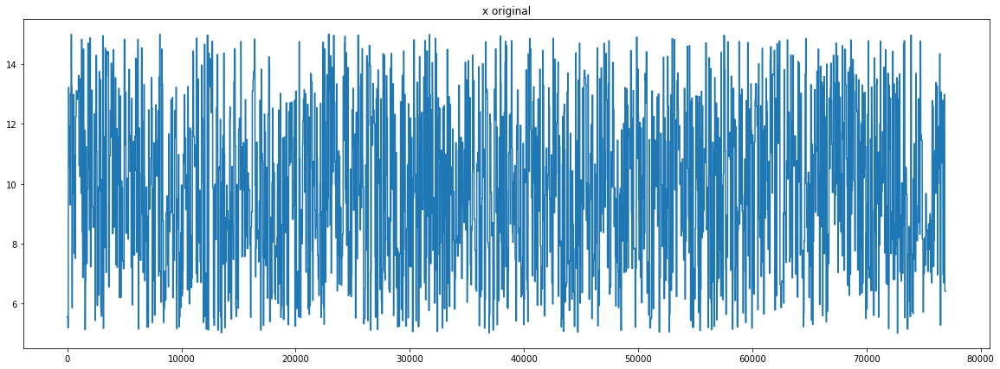

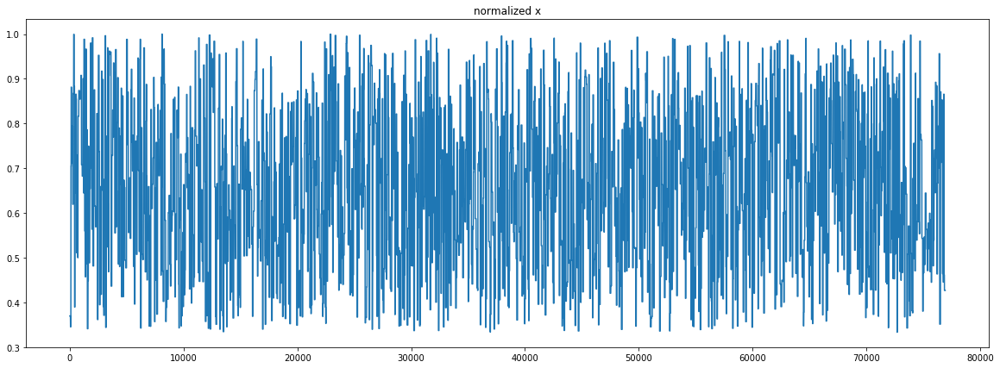

Y normalized, norms: [0.01324489]
input shape (76924, 1)
input partition shape (23078, 1)
output partition shape (23078, 1)
stacked Y shape  (23014, 1)
Y_tensor torch.Size([23014, 1])
X_tensor torch.Size([64, 23013, 1])
loading from [DC_motor_simulation/train_3_parameters.mat]
X normalized, norms: [14.99931682]
x shape (76924, 1)
x_normalized shape (76924, 1)


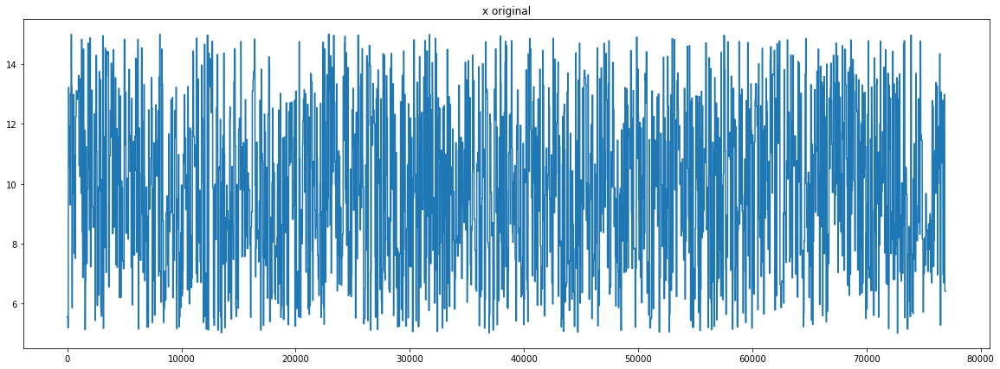

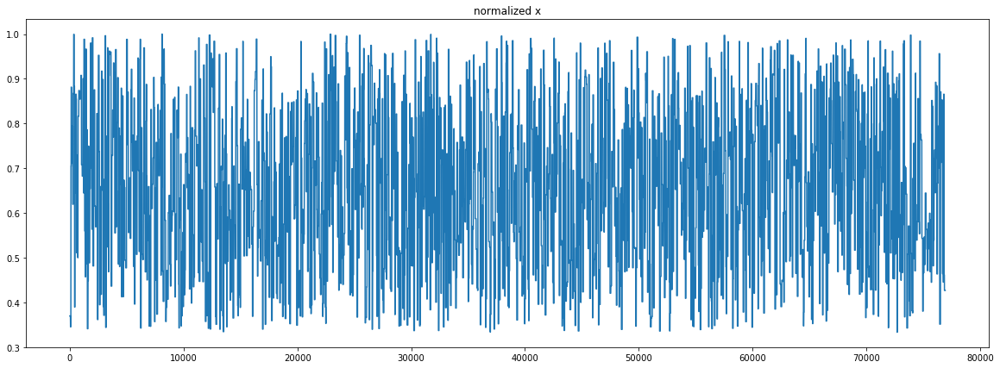

Y normalized, norms: [0.01324489]
input shape (76924, 1)
input partition shape (53846, 1)
output partition shape (53846, 1)
stacked Y shape  (53782, 1)
Y_tensor torch.Size([53782, 1])
X_tensor torch.Size([64, 53781, 1])
train set: [53782] batches
test set: [23014] batches
data_loading time 43.4580614566803 secs


In [11]:
# todo add time tracking for this cell
use_part = p_data['use_part_of_data']
print(f"using {use_part} of data")

t_tick = time.time()

test_ts_ds = TimeSeriesDataset(config=config,
                               partition=(use_part - use_part*p_data['test_size'], use_part),                        
                               logging=logging)

train_ts_ds = TimeSeriesDataset(config=config,
                                partition=(0, use_part - use_part*p_data['test_size']),
                                logging=logging)

print(f"train set: [{len(train_ts_ds)}] batches")
print(f"test set: [{len(test_ts_ds)}] batches")

if need_normalize:
    config['x_norm'] = train_ts_ds.x_norms[0]
    config['y_norm'] = train_ts_ds.y_norms[0]
    config['x_norm']
else:
    config['x_norm'] = 1
    config['y_norm'] = 1
    config['x_norm']

train_dl = DataLoader(dataset = train_ts_ds,
                      batch_sampler = BatchSampler(
                          sampler = SequentialSampler(train_ts_ds), 
                          batch_size = p_train['batch_size'],
                          drop_last = True)
                     )
test_dl = DataLoader(dataset = test_ts_ds,
                     batch_sampler = BatchSampler(
                     sampler = SequentialSampler(test_ts_ds), 
                     batch_size = p_train['batch_size'], 
                     drop_last = True)
                    )    
    
t_tock = time.time()
dataload_time = t_tock - t_tick
print(f"data_loading time {dataload_time} secs")

## Inspecting data we have, get several batches and look inside on pretty large scale to see individual iterations:

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 64, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


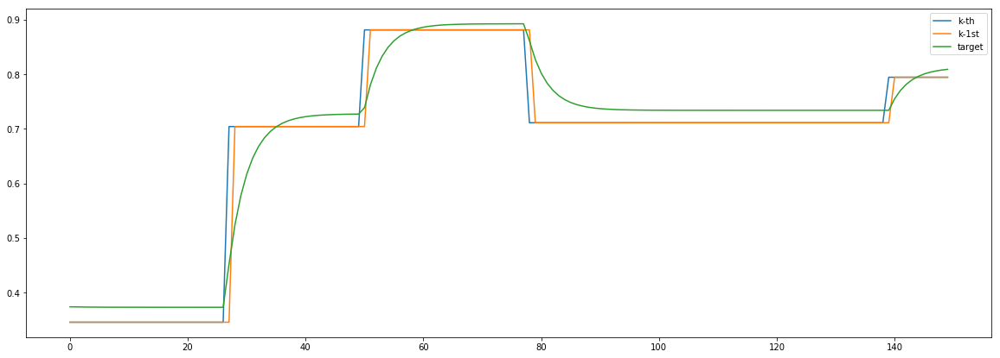

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 64, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


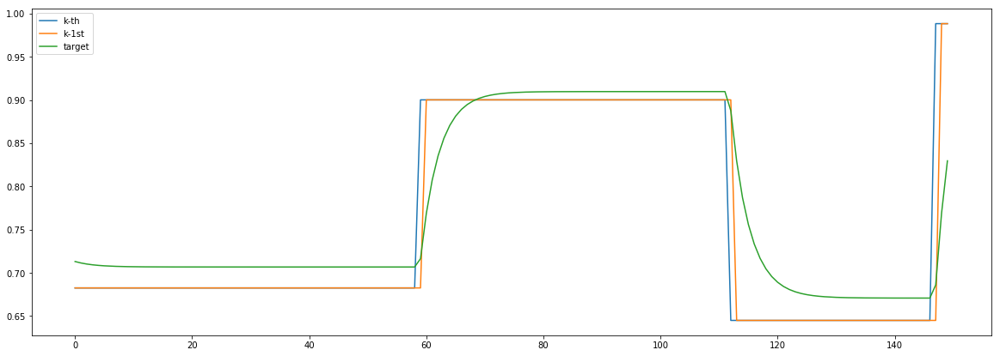

In [12]:
f, t = 0, 150
for i, batch in enumerate(train_dl):
    x, y, ind = batch
    print(f"x [batch_size, retrospective_steps, channels] :{x.shape}")
    print(f"y [batch_size, channels]: {y.shape}")
    y_kth = y.detach().numpy()[f:t, 0]
    print(f"y_last [slice_size]: {y_kth.shape}")
    x = x.transpose(0,1)
    plt.plot(x.detach().numpy()[-1][f:t], label='k-th')
    plt.plot(x.detach().numpy()[-2][f:t], label='k-1st')
    plt.plot(y_kth, label='target')
    plt.legend()
    plt.show()
    if i == 1:
        break

In [13]:
# #####################
# # 
# #####################
# from torch.nn import init
# for layer_p in a._all_weights:
#     for p in layer_p:
#         if 'weight' in p:
#             # print(p, a.__getattr__(p))
#             init.normal(a.__getattr__(p), 0.0, 0.02)

In [14]:
logging.info("History INITIALIZED")

hist = {
    
    "train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "jordan":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    "eval_train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "jordan":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    "eval_test":{
        "batches":{
            "main":np.zeros(len(test_dl)),
            "aux":np.zeros(len(test_dl)),
            "jordan":np.zeros(len(test_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    'mean_params_sample':
    {
        '1':np.zeros(num_epochs),
        '2':np.zeros(num_epochs),    
        '3':np.zeros(num_epochs)
    },
    'lr': np.zeros(num_epochs),
    'loss_rate': np.zeros(num_epochs),
    'weights_sum': np.zeros(num_epochs), 
    'weights_var': np.zeros(num_epochs),
    
    'grads':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'weights':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'vars':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'param_grads':{
        'batches':{"p1":np.zeros(len(train_dl)),
                   "p2":np.zeros(len(train_dl)),
                   "p3":np.zeros(len(train_dl))
                  },
        'epochs':{
            "p1":np.zeros(num_epochs), 
            "p2":np.zeros(num_epochs),
            "p3":np.zeros(num_epochs)
        }
    },
    'aux_global':[],
    'grad_global':{'p1':[], 'p2':[],'p3':[],'lstm':[], 'linear':[]}
}

In [15]:
def batch_iteration(iter_index, model, optimizer, batch_data, backprop, hist_part):
    
    x_batch, y_batch, indexes = batch_data
    x_batch.transpose_(0, 1) # todo get rid of it
    model.hidden = model.init_hidden()   
    
    
    if backprop:
        y_pred, jordan = model(x_batch)
        
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=False,
                        core_flag=True,
                      aux_flag=False,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses
        
        optimizer.zero_grad()
        main_loss *= 10**p_train['core_loss']['scaling_order']
        main_loss.backward()
        optimizer.step()
        
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=True,
                        core_flag=False,
                      aux_flag=False,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses
        
        optim_jord.zero_grad()
        jordan_loss *= 10**p_train['jordan_loss']['scaling_order'] # TODO change to special
        jordan_loss.backward()
        optim_jord.step()

        main_loss *= 0 #10*p_train['core_loss']['scaling_order']
        
        
        
        
    else:
        y_pred, jordan = model(x_batch)
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=True,
                        core_flag=True,
                      aux_flag=True,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses

#         optimizer.zero_grad()
        
#         aux_loss.backward()
        
#         combined_loss.backward()
    # TODO or manually add weight decay here when grad is ready
    #         print(f"losses after scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")
        for name, parameter in model.named_parameters():
            hist['grads']['batches'][name][iter_index] = parameter.grad.sum().item()
            hist['weights']['batches'][name][iter_index] = parameter.sum().item()
            hist['vars']['batches'][name][iter_index] = parameter.var().item()
        hist['param_grads']['batches']['p1'][iter_index] = model.jordan.grad[0][0].item()
        hist['param_grads']['batches']['p2'][iter_index] = model.jordan.grad[0][1].item()
        hist['param_grads']['batches']['p3'][iter_index] = model.jordan.grad[0][2].item()
        
        hist['grad_global']['p1'].append(model.jordan.grad[0][0].item())
        hist['grad_global']['p2'].append(model.jordan.grad[0][1].item())
        hist['grad_global']['p3'].append(model.jordan.grad[0][2].item())
        
        hist['grad_global']['lstm'].append(sum([p.grad.abs().sum() for p in model.lstm.parameters()]).item())
        hist['grad_global']['linear'].append(sum([p.grad.abs().sum() for p in model.linear.parameters()]).item())
        hist['aux_global'].append(aux_loss.item())
        
#         optimizer.step()
    
    hist_part["main"][iter_index] = main_loss.item()
    hist_part["aux"][iter_index] = aux_loss.item()
    hist_part["jordan"][iter_index] = jordan_loss.item()
    
    return y_pred, jordan

In [16]:
# def batch_iteration(iter_index, model, optimizer, batch_data, backprop, hist_part):
    
#     x_batch, y_batch, indexes = batch_data
#     x_batch.transpose_(0, 1) # todo get rid of it
#     model.hidden = model.init_hidden()

#     y_pred, jordan = model(x_batch)
#     losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config)
#     main_loss, aux_loss, aux_residuals, jordan_loss = losses
    
#     aux_loss *= 0 #10**p_train['aux_loss']['scaling_order']
    
#     jordan_loss *= 10**p_train['jordan_loss']['scaling_order'] # TODO change to special
    
#     main_loss *= 10**p_train['core_loss']['scaling_order']
#     losses = [aux_loss, main_loss, jordan_loss]    
    
    
#     if backprop:
            
#         combined_loss = sum(losses)

#         optimizer.zero_grad()

#         combined_loss.backward()
#     # TODO or manually add weight decay here when grad is ready
#     #         print(f"losses after scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")
#         for name, parameter in model.named_parameters():
#             hist['grads']['batches'][name][iter_index] = parameter.grad.sum().item()
#             hist['weights']['batches'][name][iter_index] = parameter.sum().item()
#             hist['vars']['batches'][name][iter_index] = parameter.var().item()
#         hist['param_grads']['batches']['p1'][iter_index] = model.jordan.grad[0][0].item()
#         hist['param_grads']['batches']['p2'][iter_index] = model.jordan.grad[0][1].item()
#         hist['param_grads']['batches']['p3'][iter_index] = model.jordan.grad[0][2].item()
        
#         hist['grad_global']['p1'].append(model.jordan.grad[0][0].item())
#         hist['grad_global']['p2'].append(model.jordan.grad[0][1].item())
#         hist['grad_global']['p3'].append(model.jordan.grad[0][2].item())
        
#         hist['grad_global']['lstm'].append(sum([p.grad.abs().sum() for p in model.lstm.parameters()]).item())
#         hist['grad_global']['linear'].append(sum([p.grad.abs().sum() for p in model.linear.parameters()]).item())
#         hist['aux_global'].append(aux_loss.item())
        
#         optimizer.step()
    
#     hist_part["main"][iter_index] = main_loss.item()
#     hist_part["aux"][iter_index] = aux_loss.item()
#     hist_part["jordan"][iter_index] = jordan_loss.item()
    
#     return y_pred, jordan

In [17]:
def update_long_term_hist(batches_hist, long_term_hist):
    mean_main = np.average(batches_hist["main"])
    mean_aux = np.average(batches_hist["aux"])
    mean_jord = np.average(batches_hist["jordan"])
    long_term_hist["main"][t] = mean_main
    long_term_hist["aux"][t] = mean_aux
    long_term_hist["jordan"][t] = mean_jord
    return mean_main, mean_aux, mean_jord

In [18]:
def slice_loss_sum(losses_dict, index):
    return sum([val[index] for val in losses_dict.values()])

## Train model


aux preds: 0.10398983210325241           0.31874364614486694           0.06867869943380356
main loss 0.0
aux loss 0.0
jord loss 836883.1676682692
combined loss 836883.1676682692 



Parameter containing:
tensor([[0.1040, 0.3187, 0.0687]], requires_grad=True)


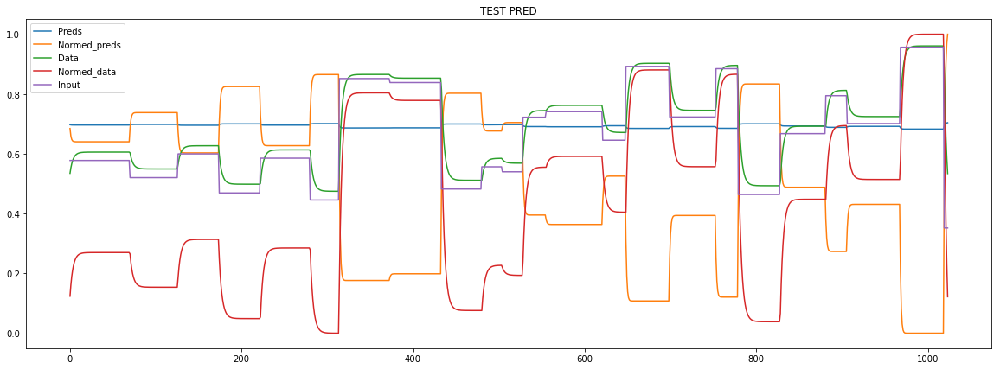

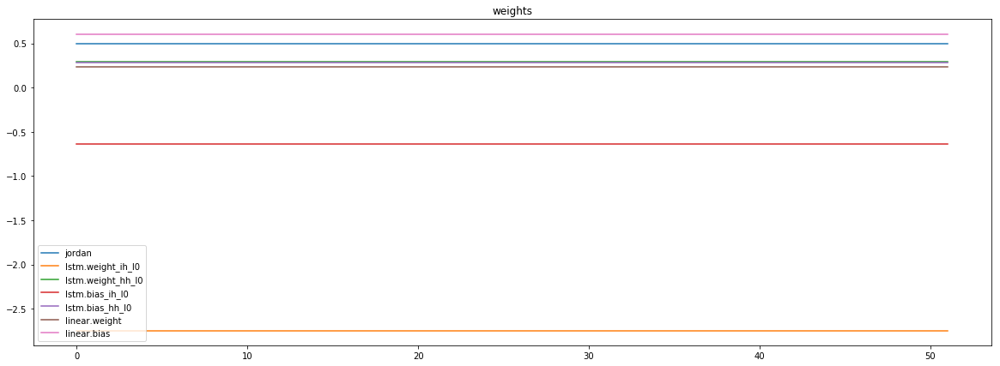

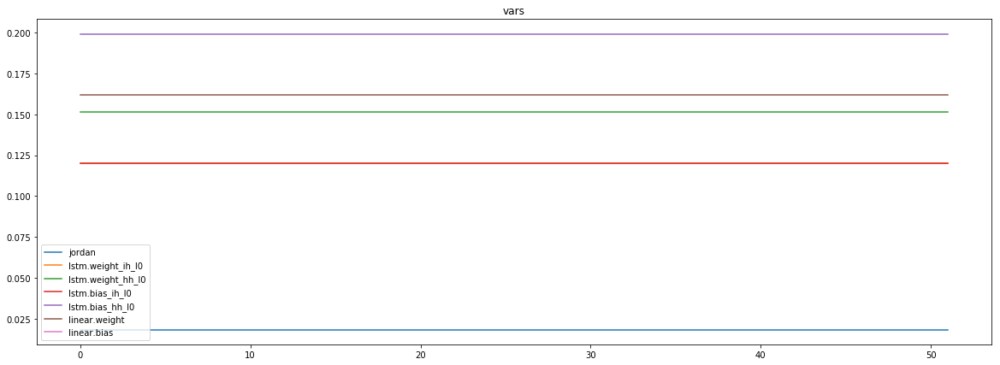

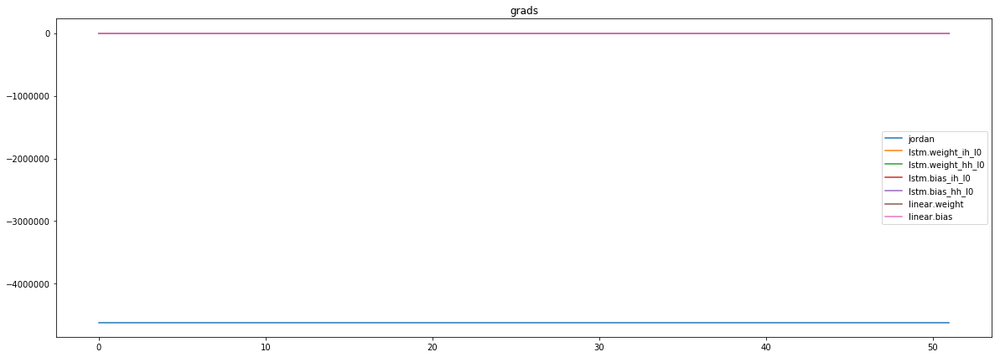

mean_p1 : -4071822.25
mean_p2 : -536994.9375
mean_p3 : -5250.83349609375


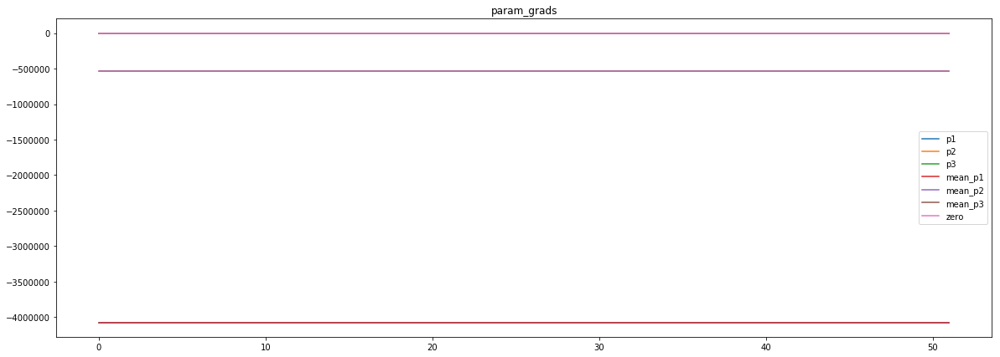

Epoch [0] 
     train_loss[836883.1676682692] 
     eval_train[163.08826538003407] 
     eval_test[160.67055008492687]



aux preds: 0.15040698647499084           0.7142743468284607           0.1351700723171234
main loss 0.0
aux loss 0.0
jord loss 243834.51938100962
combined loss 243834.51938100962 



Parameter containing:
tensor([[0.1504, 0.7143, 0.1352]], requires_grad=True)


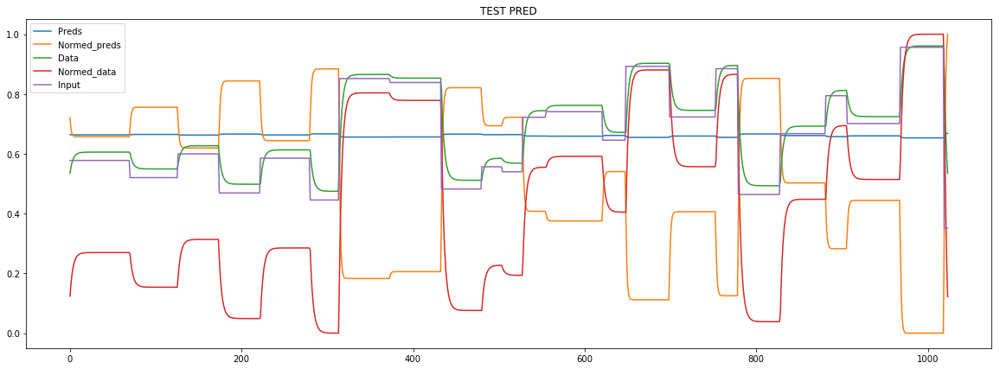

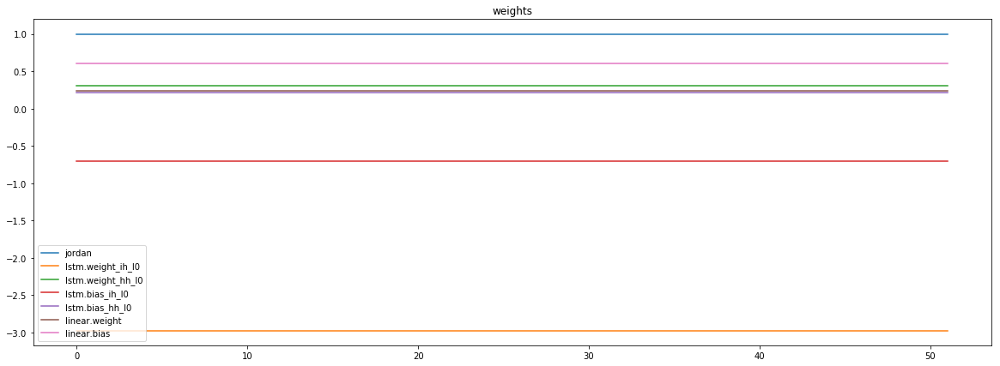

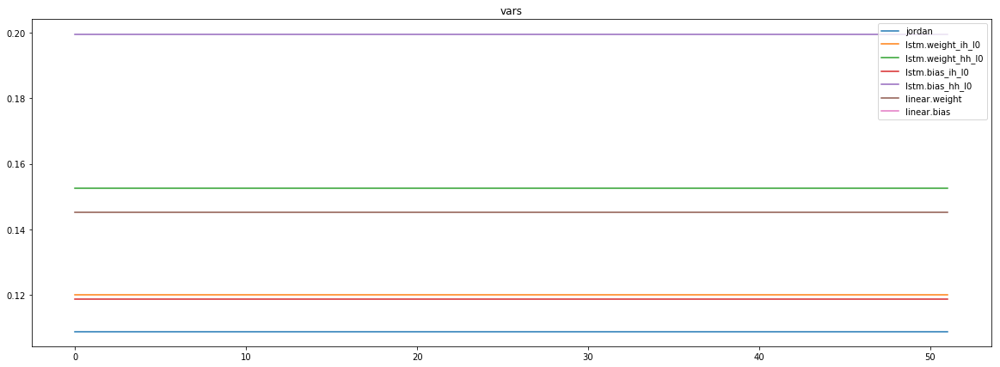

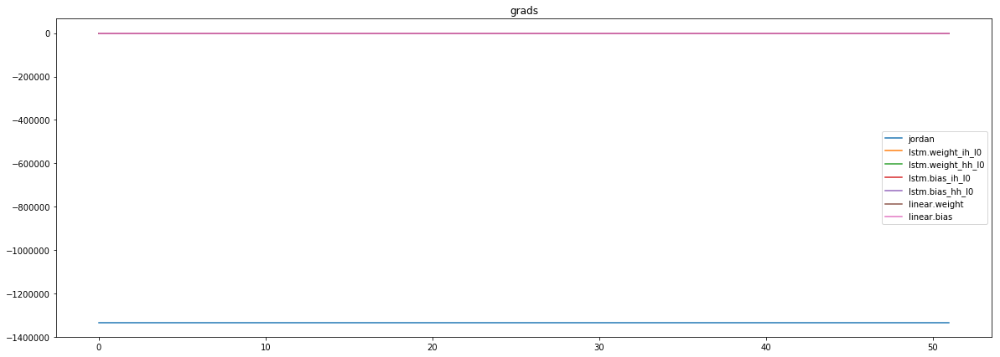

mean_p1 : -967950.75
mean_p2 : -360946.15625
mean_p3 : -3509.74365234375


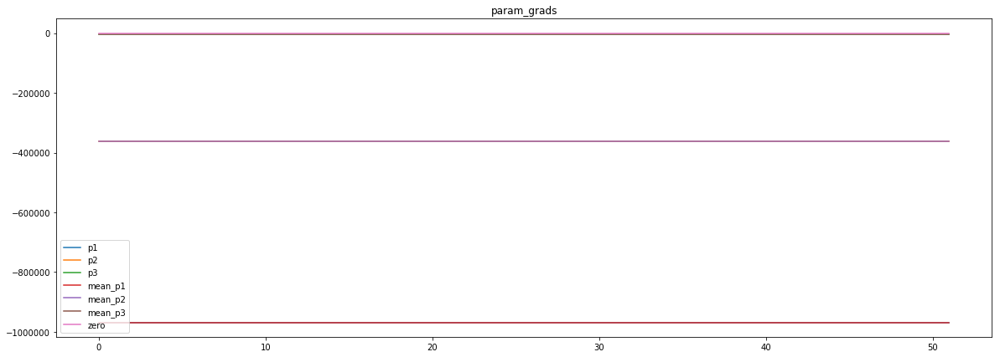

Epoch [1] 
     train_loss[243834.51938100962] 
     eval_train[160.9160731217036] 
     eval_test[160.2513500800864]



aux preds: 0.1954537183046341           1.0755722522735596           0.2465011328458786
main loss 0.0
aux loss 0.0
jord loss 70617.45977313702
combined loss 70617.45977313702 



Parameter containing:
tensor([[0.1955, 1.0756, 0.2465]], requires_grad=True)


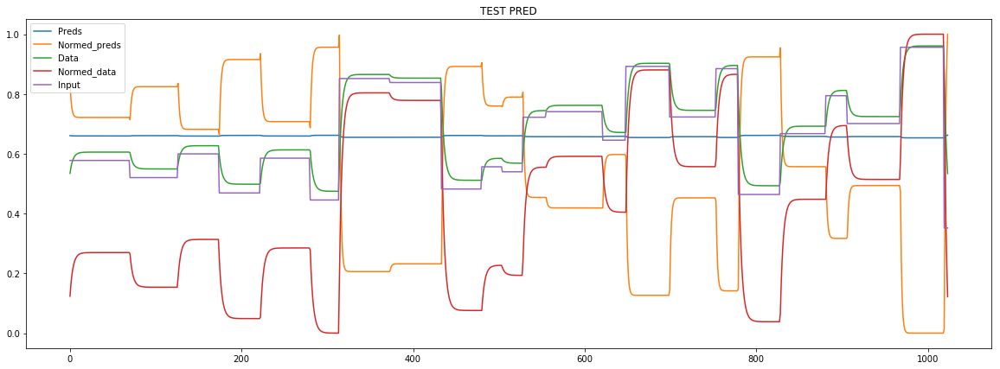

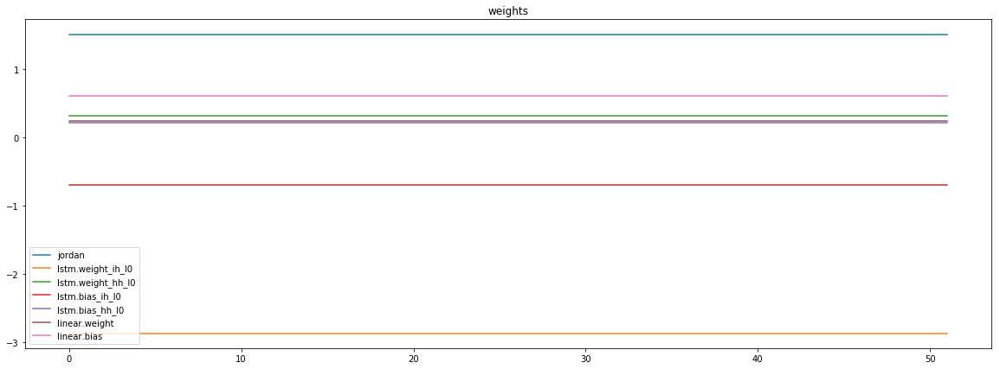

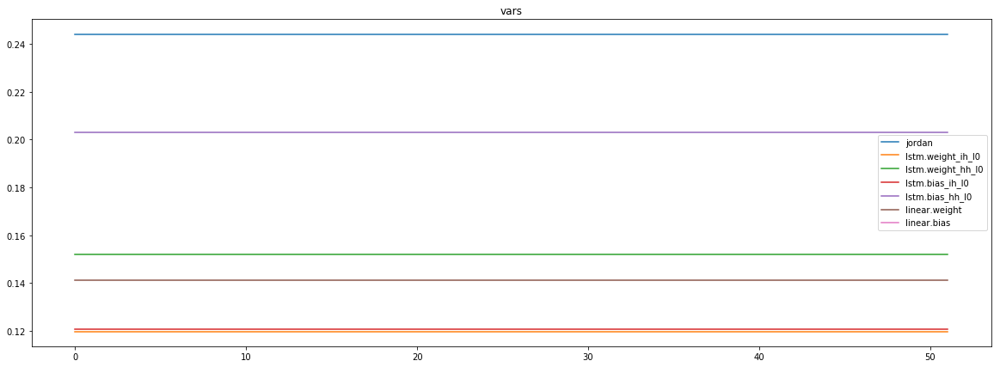

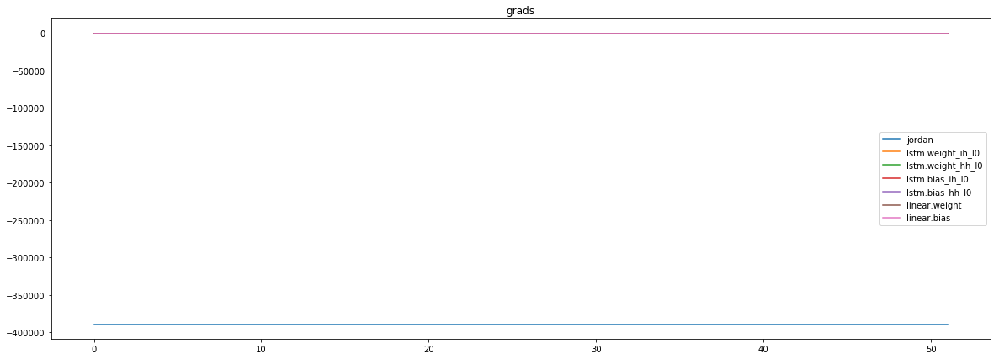

mean_p1 : -316475.0625
mean_p2 : -71917.671875
mean_p3 : -786.4155883789062


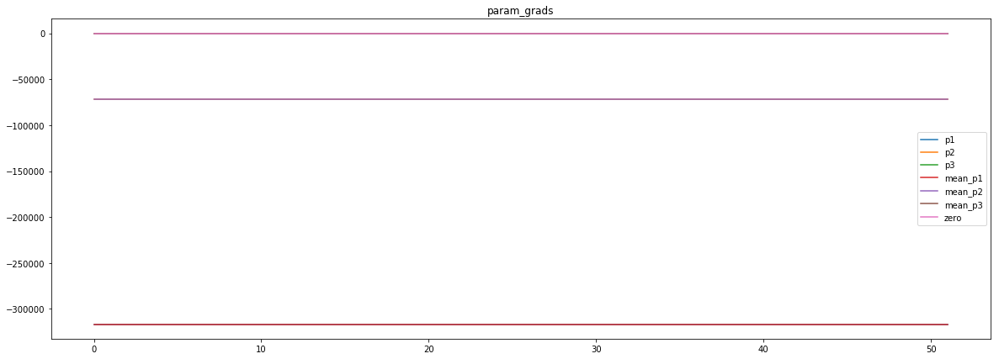

Epoch [2] 
     train_loss[70617.45977313702] 
     eval_train[159.2920342926294] 
     eval_test[158.72657529455188]



aux preds: 0.26774489879608154           1.0904344320297241           0.2776425778865814
main loss 0.0
aux loss 0.0
jord loss 26291.805513822117
combined loss 26291.805513822117 



Parameter containing:
tensor([[0.2677, 1.0904, 0.2776]], requires_grad=True)


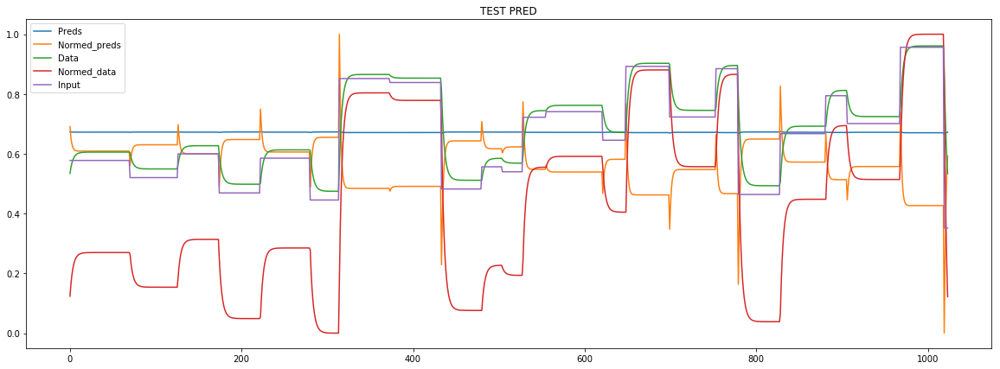

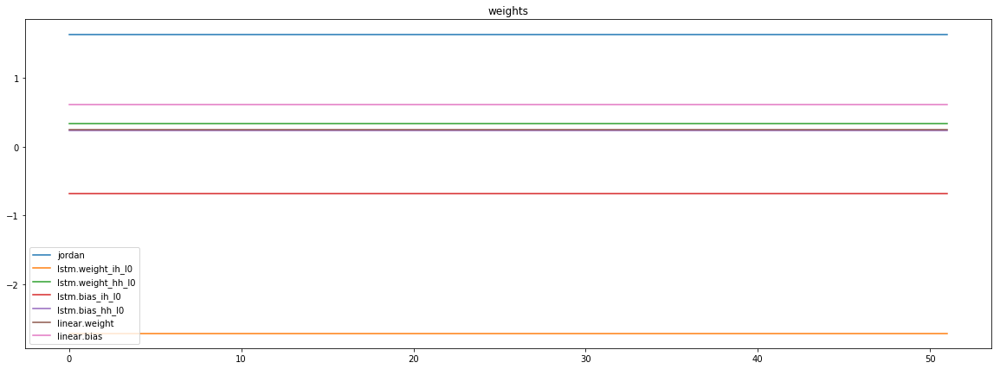

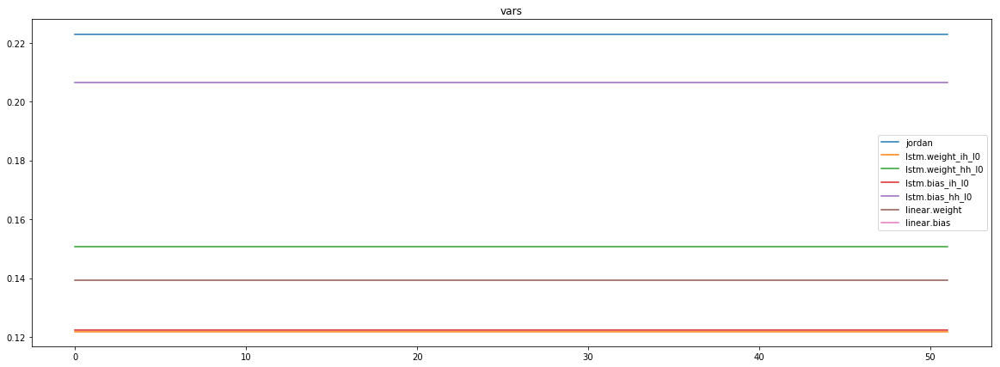

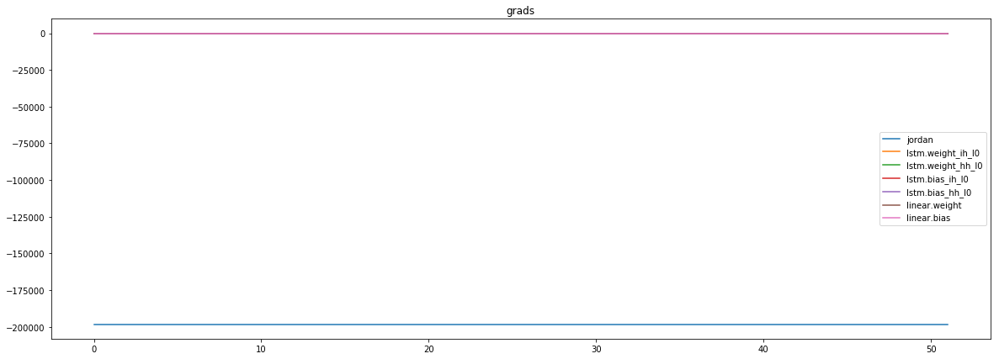

mean_p1 : -165985.4375
mean_p2 : -31858.318359375
mean_p3 : -390.95751953125


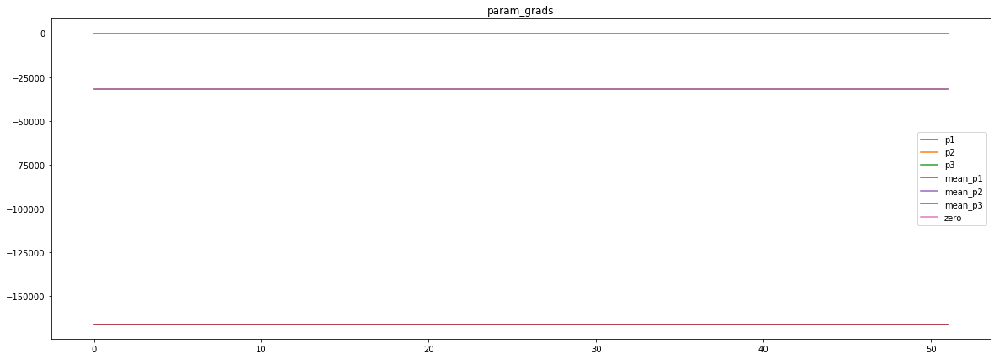

Epoch [3] 
     train_loss[26291.805513822117] 
     eval_train[156.78433414437595] 
     eval_test[155.6161444480954]



aux preds: 0.3951556384563446           1.0907636880874634           0.3496914505958557
main loss 0.0
aux loss 0.0
jord loss 11929.70293719952
combined loss 11929.70293719952 



Parameter containing:
tensor([[0.3952, 1.0908, 0.3497]], requires_grad=True)


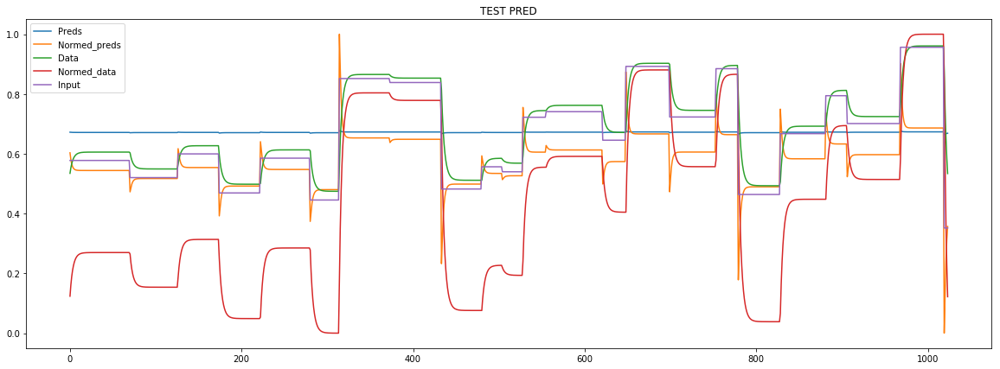

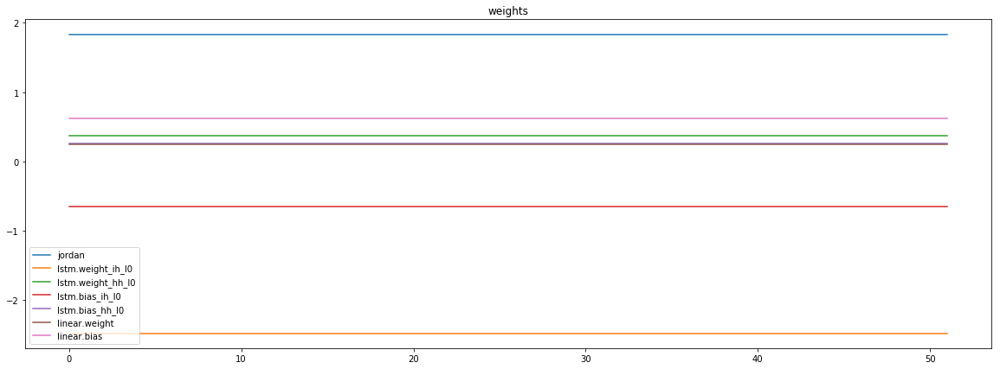

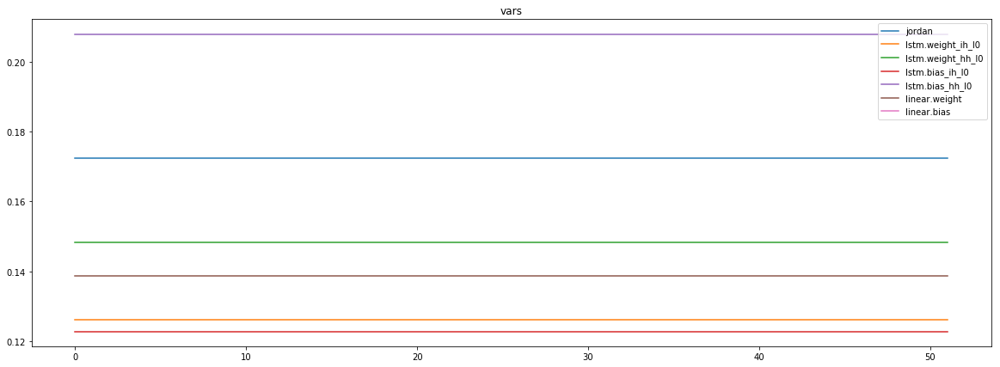

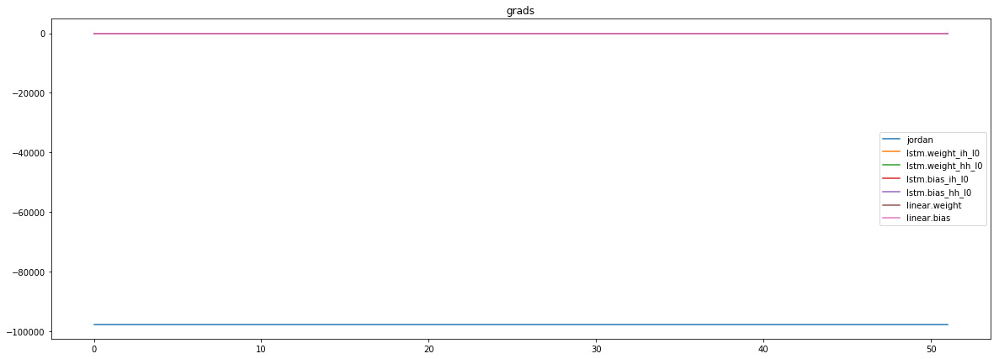

mean_p1 : -75269.6171875
mean_p2 : -22033.0546875
mean_p3 : -282.8111572265625


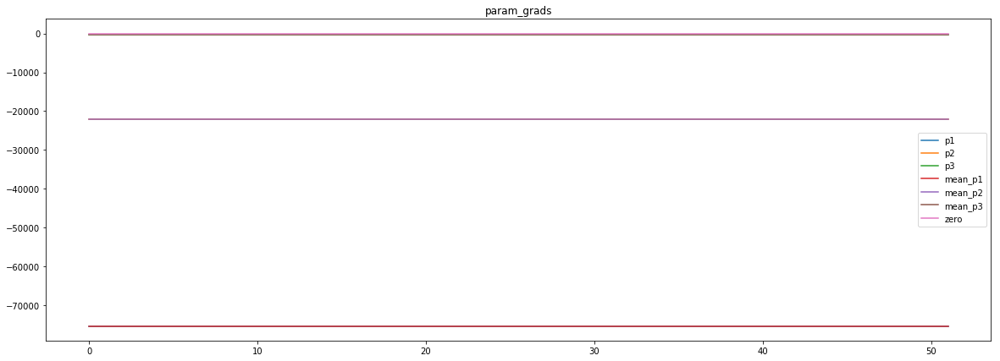

loss rate [0.027491596029776355]
Epoch [4] 
     train_loss[11929.70293719952] 
     eval_train[155.0000490030686] 
     eval_test[153.84890712567986]



aux preds: 0.4457962214946747           1.091837763786316           0.5785473585128784
main loss 0.0
aux loss 0.0
jord loss 3734.9901733398438
combined loss 3734.9901733398438 



Parameter containing:
tensor([[0.4458, 1.0918, 0.5785]], requires_grad=True)


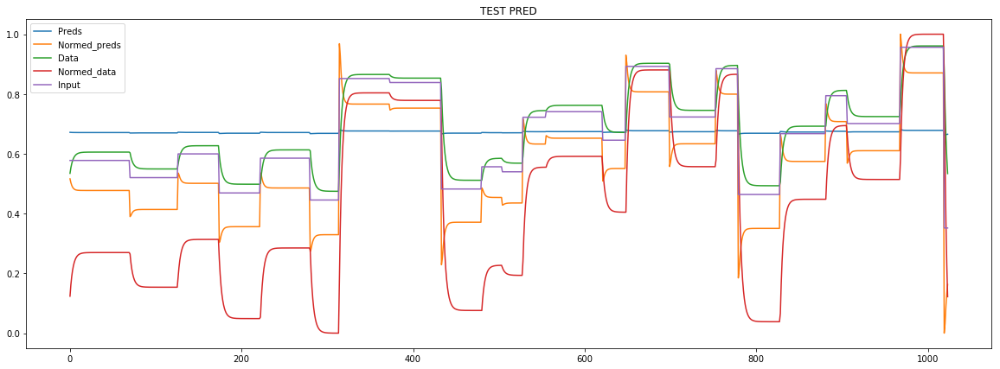

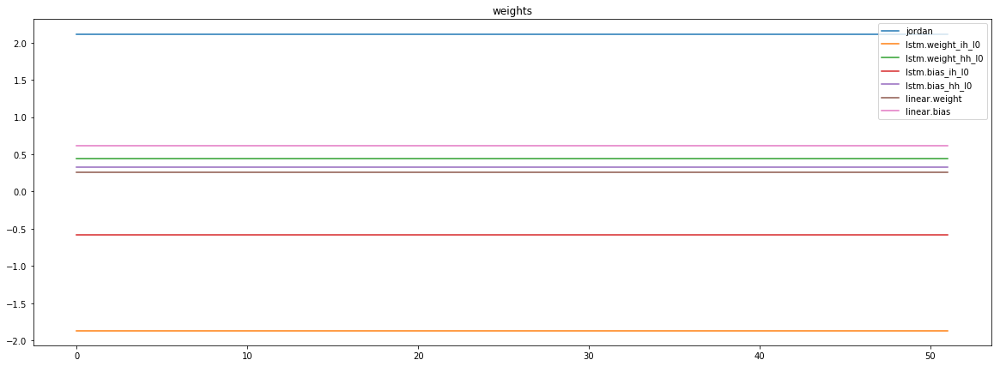

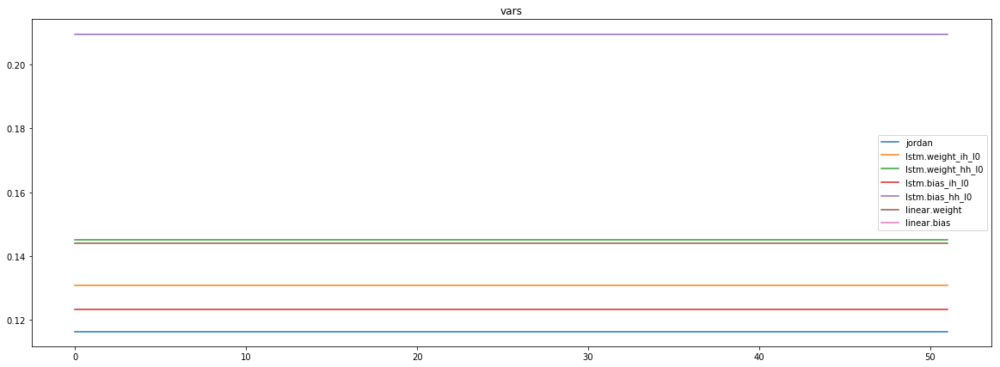

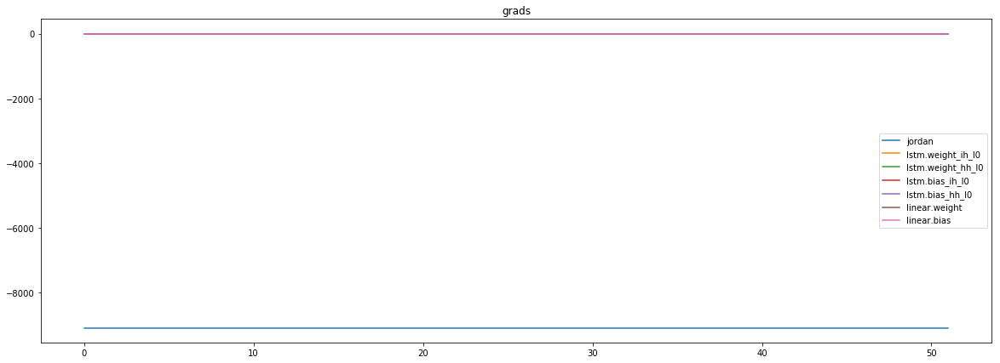

mean_p1 : 3083.65478515625
mean_p2 : -11888.3662109375
mean_p3 : -296.7635498046875


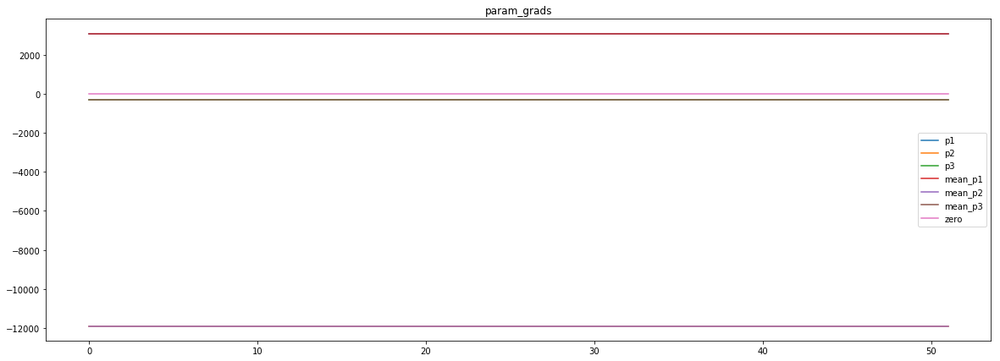

loss rate [0.02860048818742522]
Epoch [5] 
     train_loss[3734.9901733398438] 
     eval_train[152.76782971413698] 
     eval_test[151.60037259154274]



aux preds: 0.44316795468330383           1.0889312028884888           0.8810963034629822
main loss 0.0
aux loss 0.0
jord loss 3384.1268780048076
combined loss 3384.1268780048076 



Parameter containing:
tensor([[0.4432, 1.0889, 0.8811]], requires_grad=True)


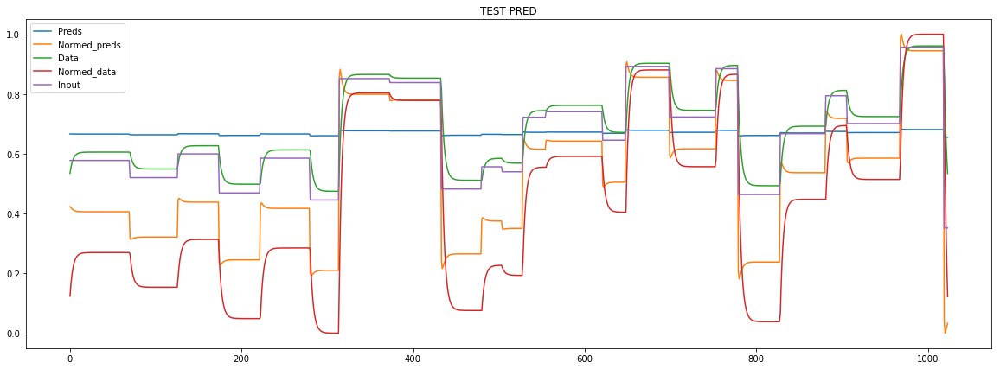

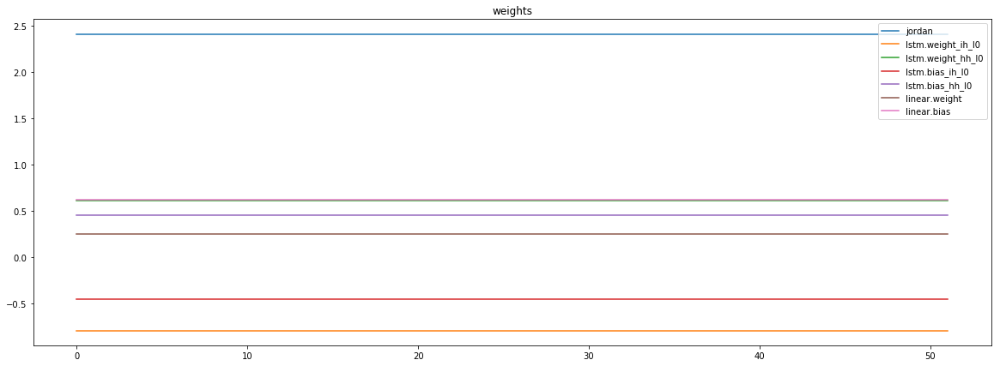

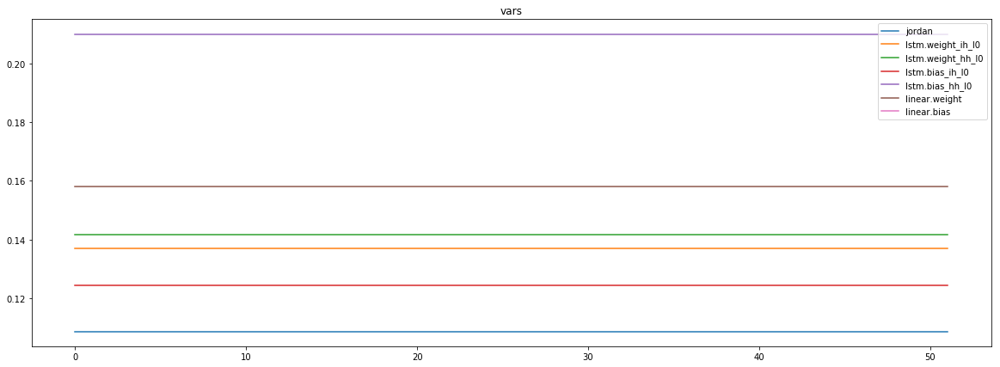

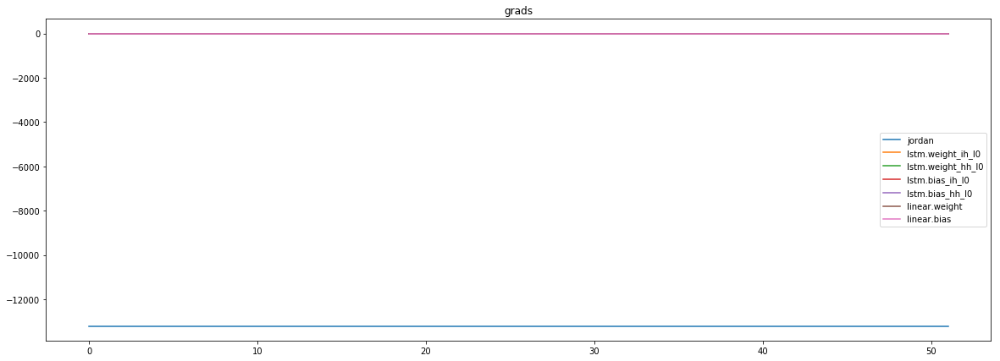

mean_p1 : 2304.635498046875
mean_p2 : -15181.65625
mean_p3 : -329.4140930175781


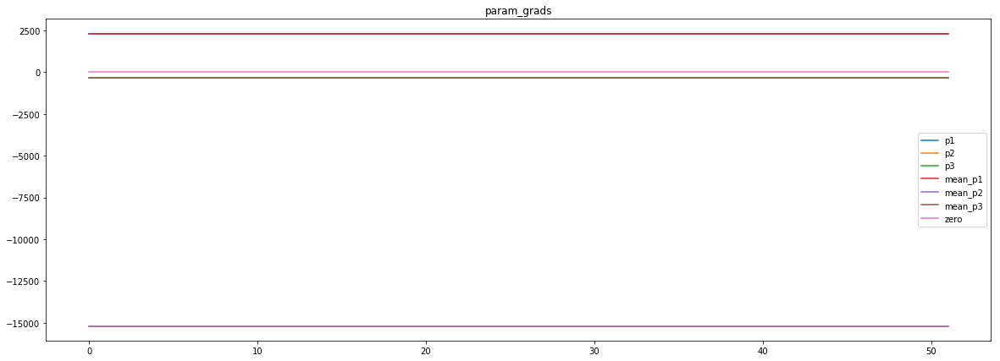

loss rate [0.03400467380385319]
Epoch [6] 
     train_loss[3384.1268780048076] 
     eval_train[149.45218007285774] 
     eval_test[148.46234827144707]



aux preds: 0.44413670897483826           1.0853393077850342           1.1810485124588013
main loss 0.0
aux loss 0.0
jord loss 3344.816115159255
combined loss 3344.816115159255 



Parameter containing:
tensor([[0.4441, 1.0853, 1.1810]], requires_grad=True)


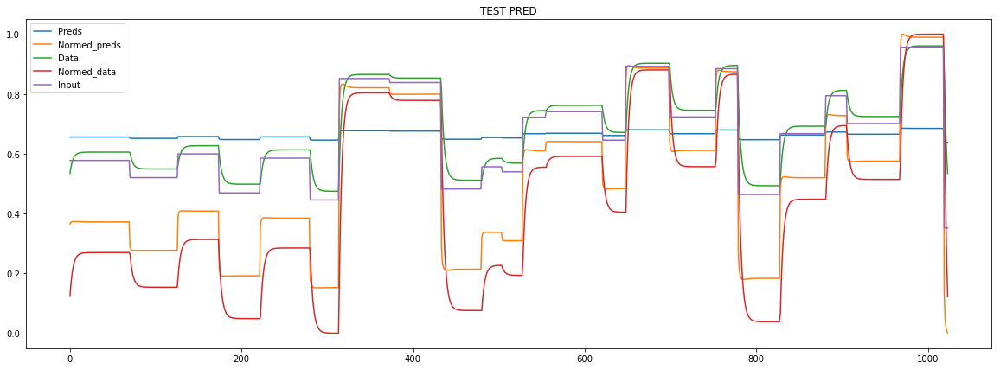

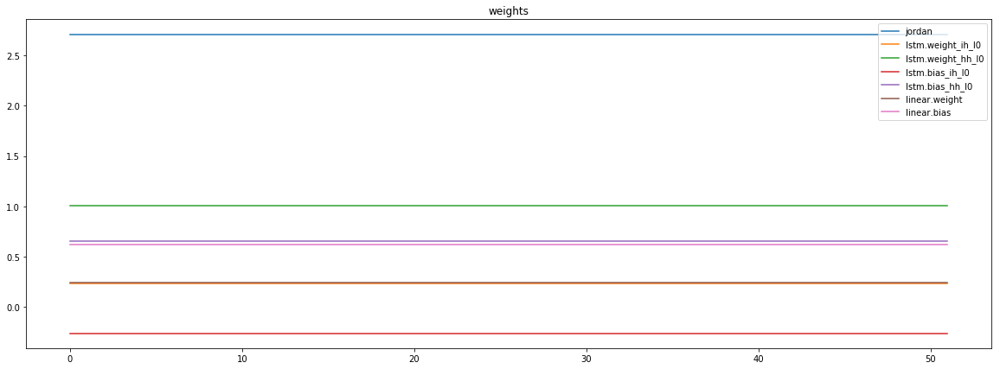

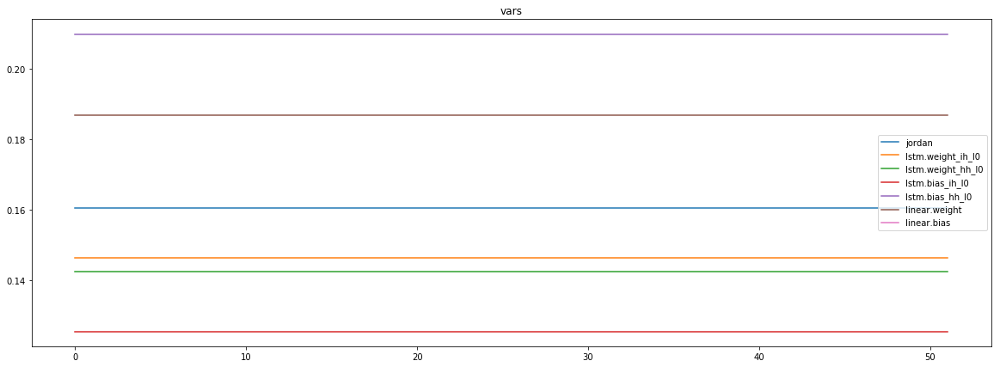

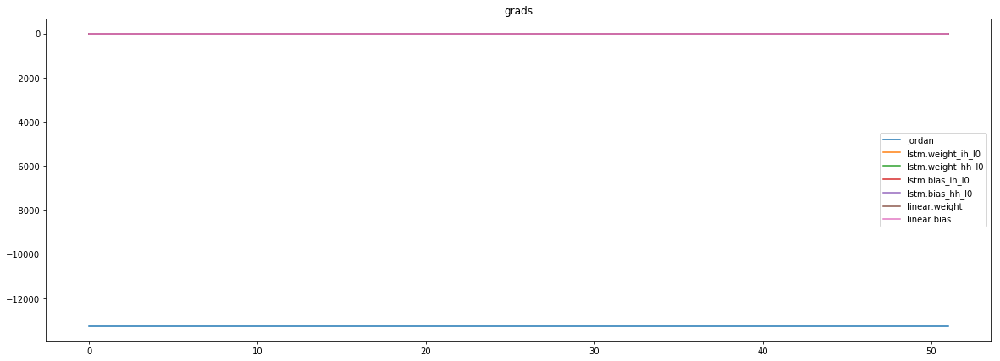

mean_p1 : 2395.218994140625
mean_p2 : -15325.994140625
mean_p3 : -330.4836730957031


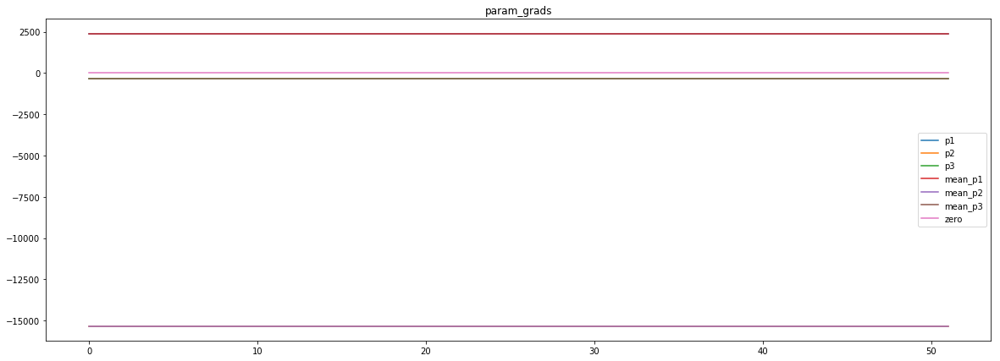

loss rate [0.05323973169230711]
Epoch [7] 
     train_loss[3344.816115159255] 
     eval_train[143.86657277192884] 
     eval_test[143.2484982341782]



aux preds: 0.442199170589447           1.0828659534454346           1.4829930067062378
main loss 0.0
aux loss 0.0
jord loss 3302.7091862605166
combined loss 3302.7091862605166 



Parameter containing:
tensor([[0.4422, 1.0829, 1.4830]], requires_grad=True)


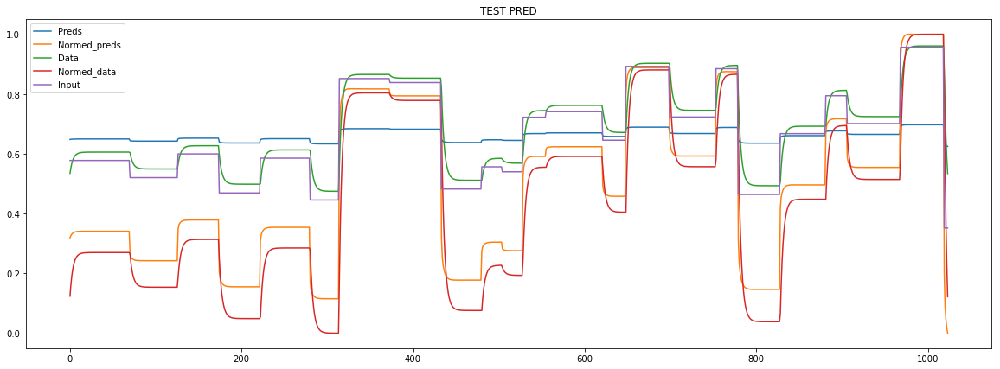

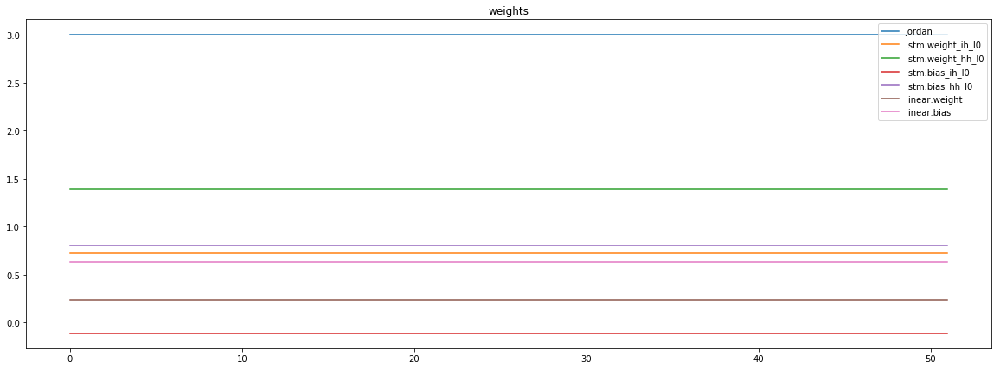

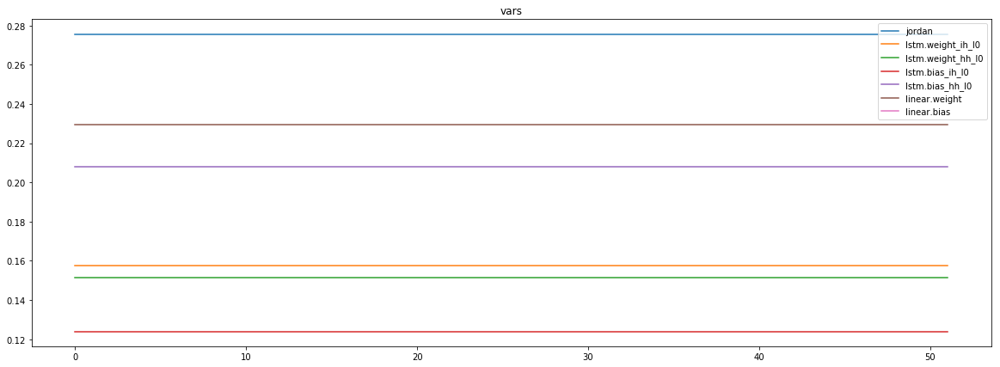

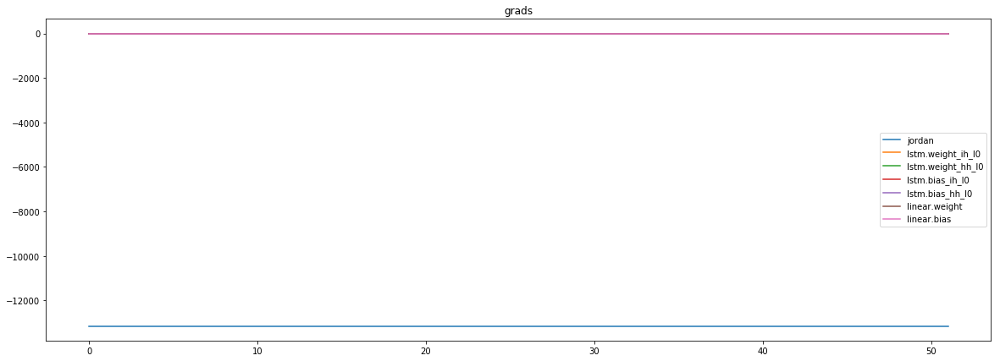

mean_p1 : 2527.7451171875
mean_p2 : -15342.2099609375
mean_p3 : -330.8332214355469


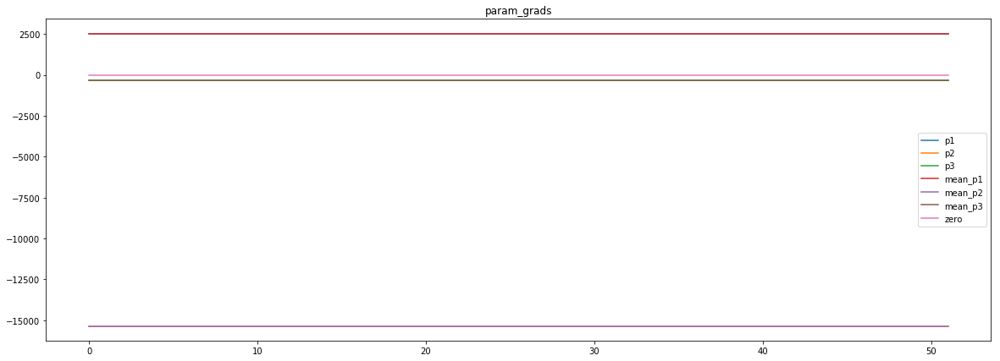

loss rate [0.0810040136933915]
Epoch [8] 
     train_loss[3302.7091862605166] 
     eval_train[136.3273387104855] 
     eval_test[135.80041034499564]



aux preds: 0.44543251395225525           1.079807162284851           1.783339500427246
main loss 0.0
aux loss 0.0
jord loss 3258.869159405048
combined loss 3258.869159405048 



Parameter containing:
tensor([[0.4454, 1.0798, 1.7833]], requires_grad=True)


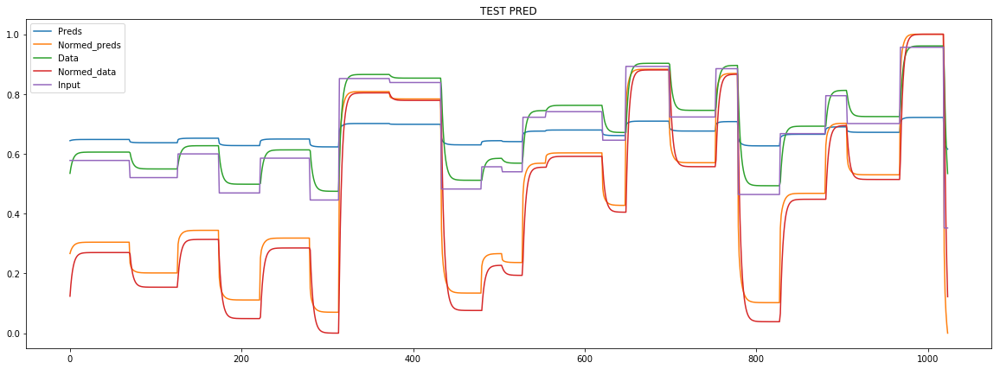

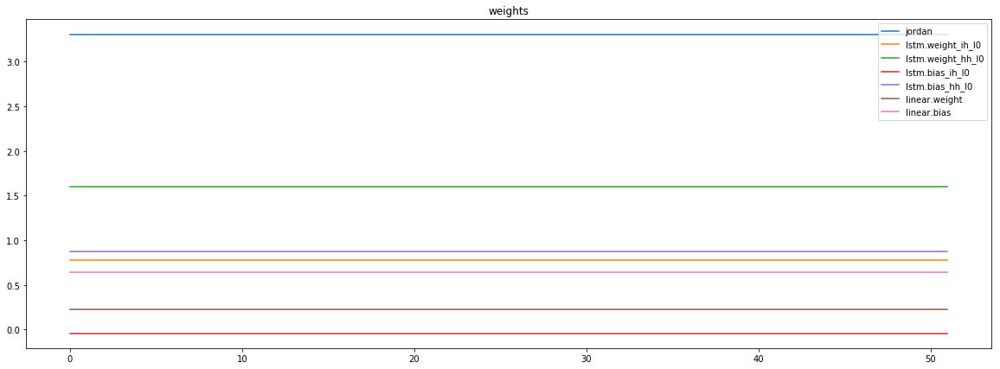

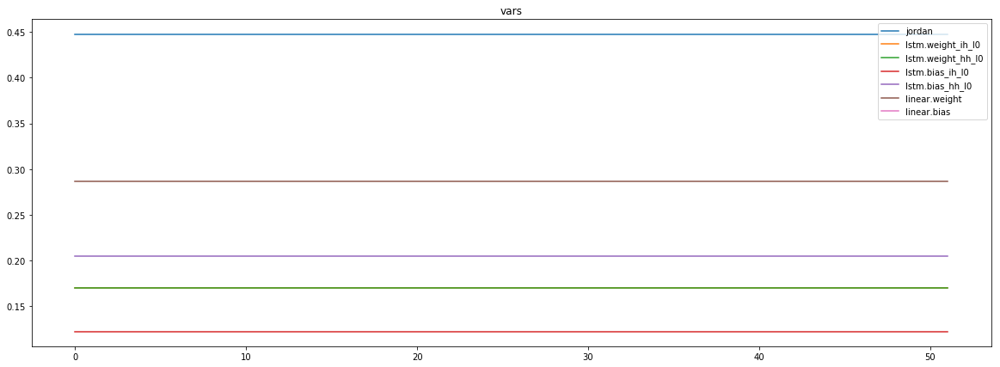

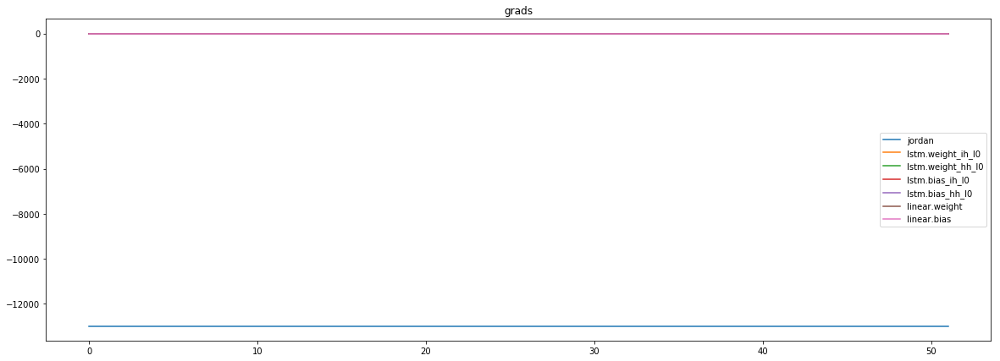

mean_p1 : 2635.104736328125
mean_p2 : -15283.193359375
mean_p3 : -329.56072998046875


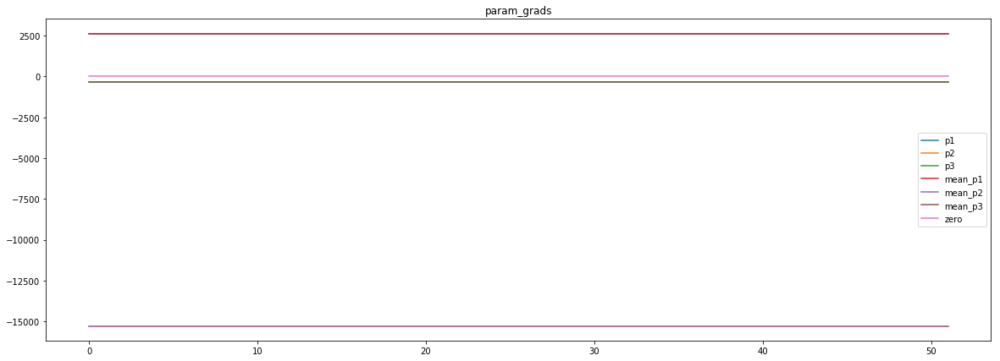

loss rate [0.1250215721166683]
Epoch [9] 
     train_loss[3258.869159405048] 
     eval_train[125.31135793660248] 
     eval_test[124.68770914052782]



aux preds: 0.44546037912368774           1.0756940841674805           2.0847644805908203
main loss 0.0
aux loss 0.0
jord loss 3209.306326059195
combined loss 3209.306326059195 



Parameter containing:
tensor([[0.4455, 1.0757, 2.0848]], requires_grad=True)


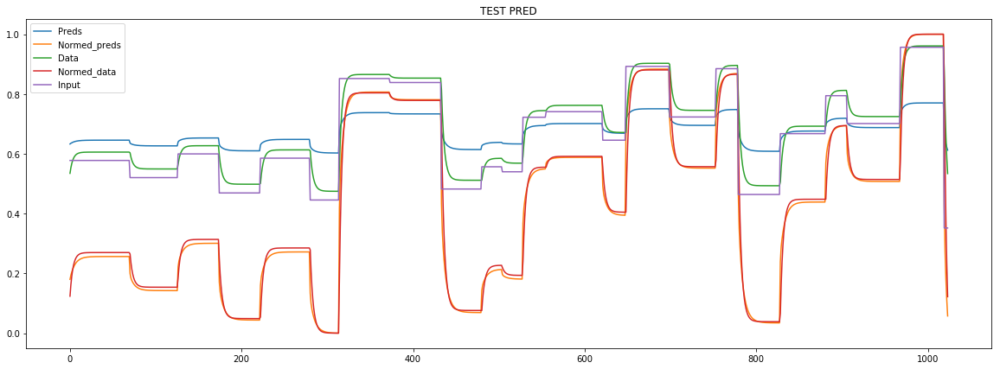

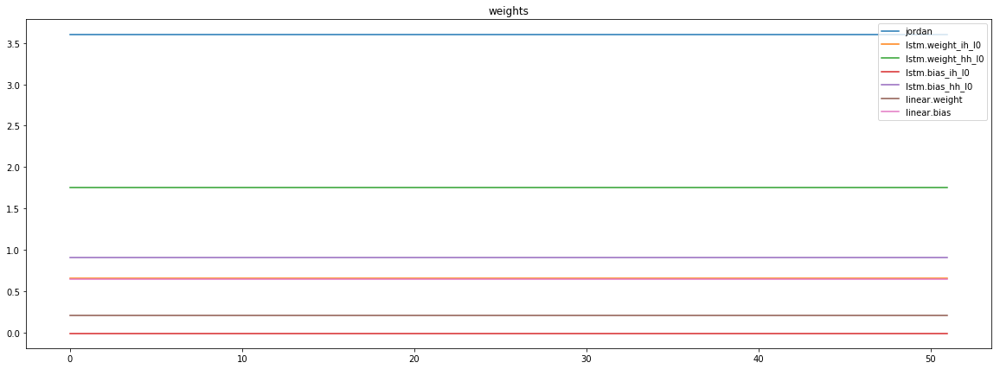

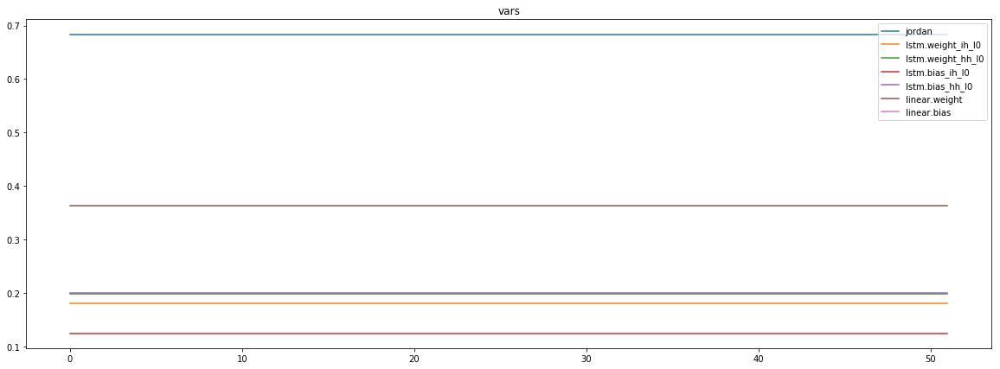

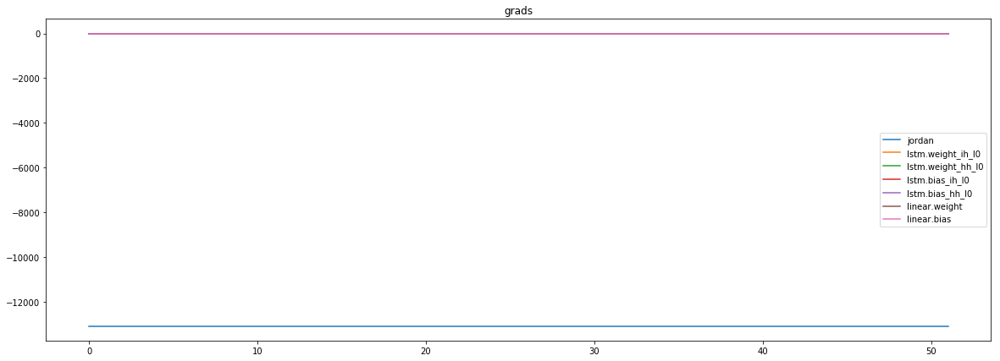

mean_p1 : 2728.703857421875
mean_p2 : -15473.44140625
mean_p3 : -331.2687072753906


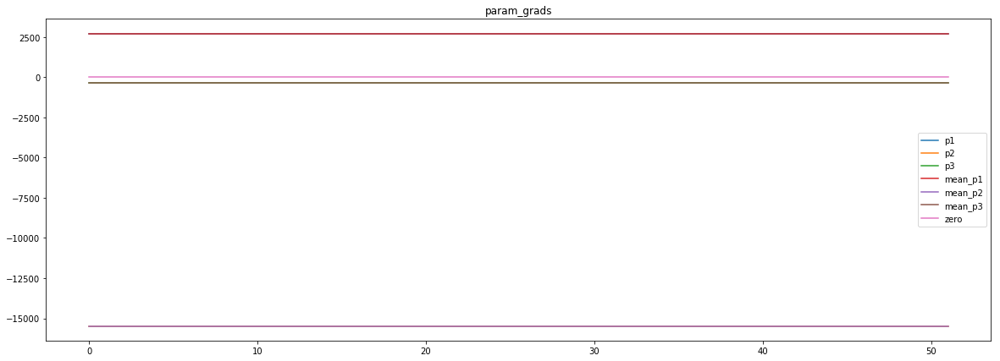

loss rate [0.24036219655933022]
Epoch [10] 
     train_loss[3209.306326059195] 
     eval_train[103.10331328110232] 
     eval_test[102.23119915105319]



aux preds: 0.44383707642555237           1.0732533931732178           2.380190849304199
main loss 0.0
aux loss 0.0
jord loss 3163.8214486929087
combined loss 3163.8214486929087 



Parameter containing:
tensor([[0.4438, 1.0733, 2.3802]], requires_grad=True)


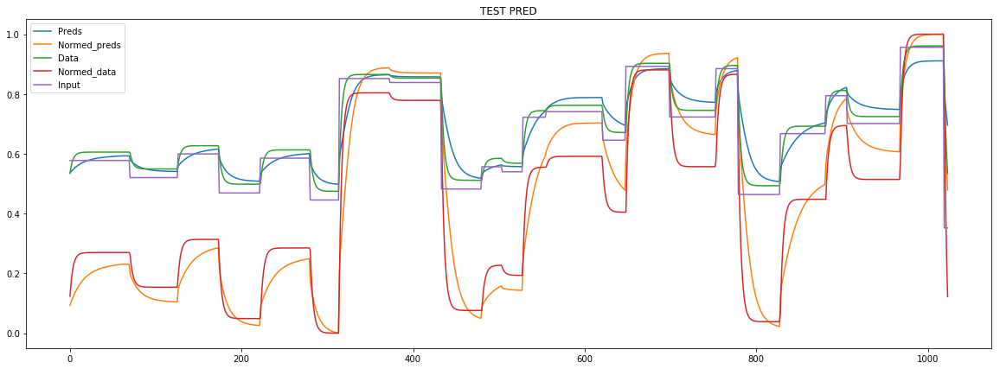

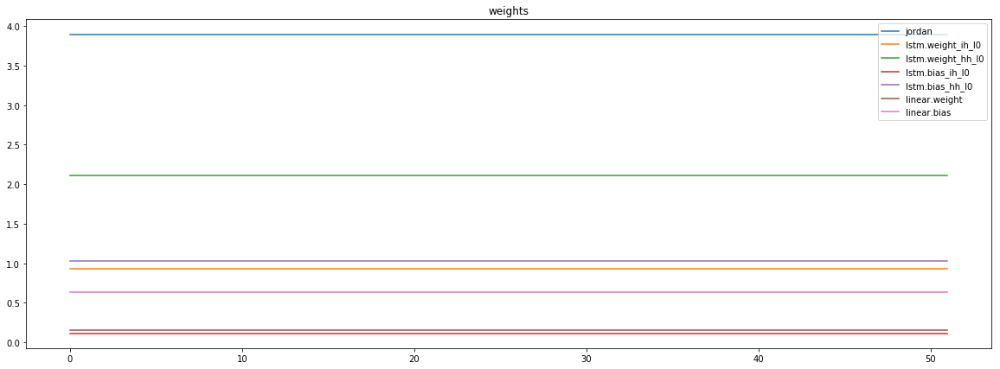

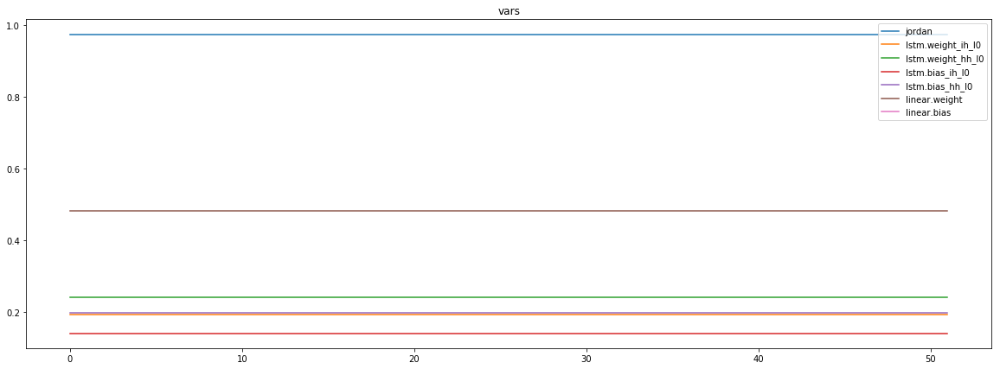

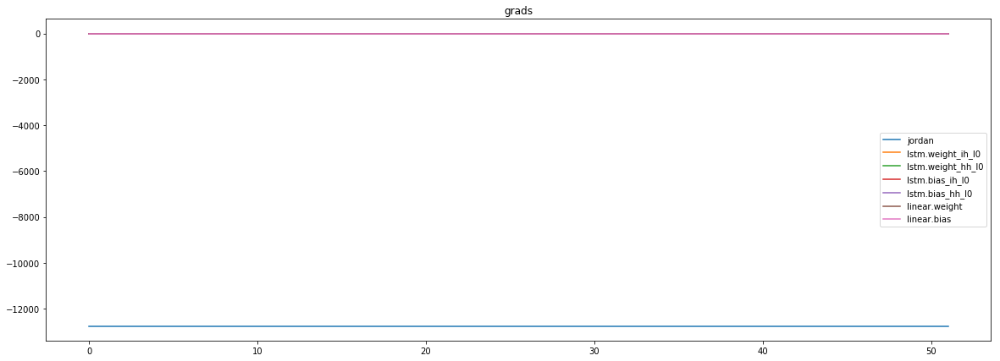

mean_p1 : 2876.530517578125
mean_p2 : -15299.6943359375
mean_p3 : -329.9165344238281


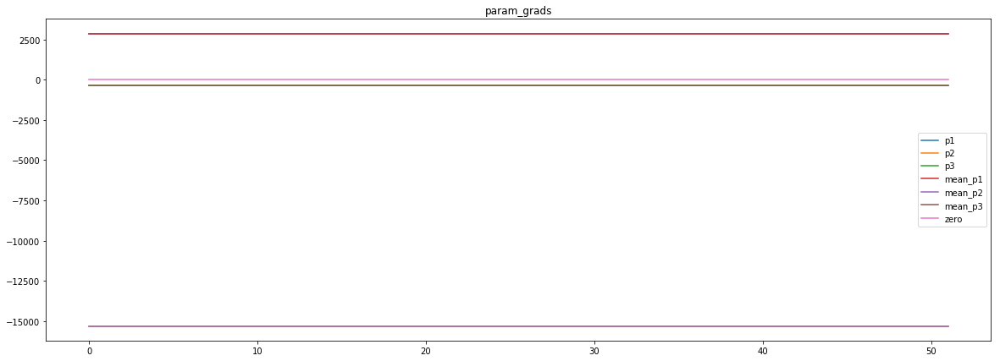

loss rate [0.6744707551197138]
Epoch [11] 
     train_loss[3163.8214486929087] 
     eval_train[39.57001945728776] 
     eval_test[39.3585819664189]



aux preds: 0.4439973831176758           1.0694632530212402           2.67683482170105
main loss 0.0
aux loss 0.0
jord loss 3115.3624267578125
combined loss 3115.3624267578125 



Parameter containing:
tensor([[0.4440, 1.0695, 2.6768]], requires_grad=True)


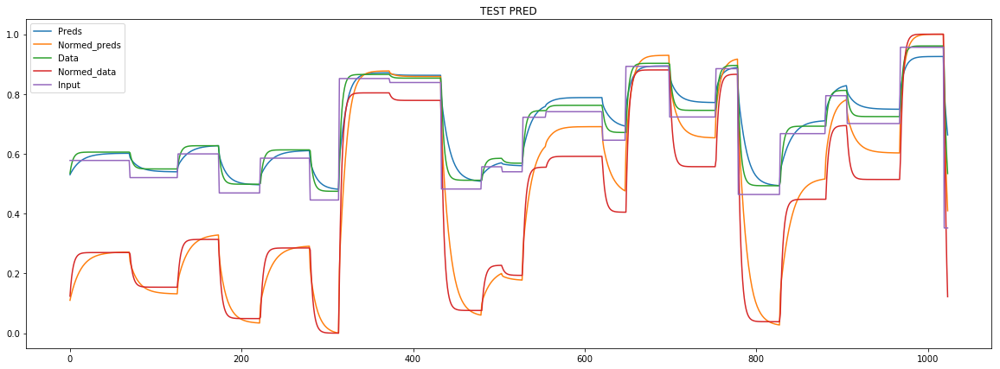

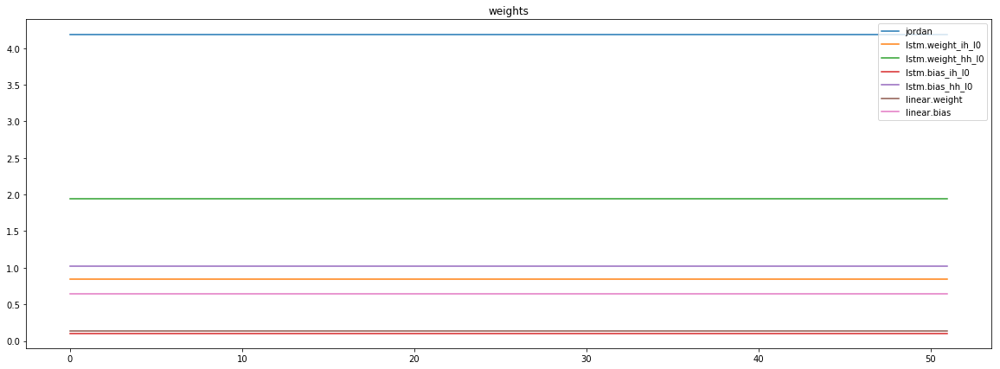

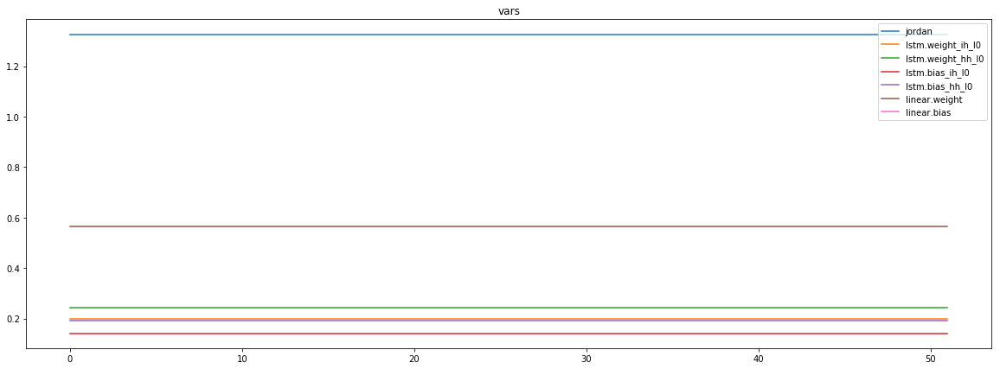

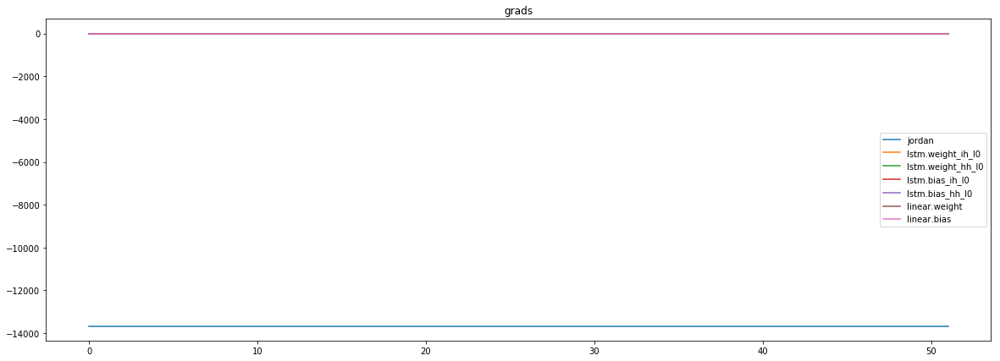

mean_p1 : 5363.54296875
mean_p2 : -18662.87890625
mean_p3 : -361.9805603027344


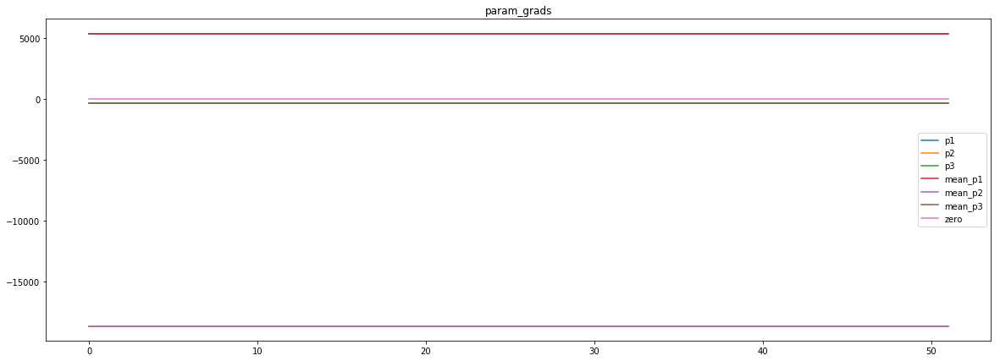

loss rate [0.6839724120870234]
Epoch [12] 
     train_loss[3115.3624267578125] 
     eval_train[28.02485022751185] 
     eval_test[28.050344320585612]



aux preds: 0.44486790895462036           1.0667475461959839           2.97038197517395
main loss 0.0
aux loss 0.0
jord loss 3070.8234112079326
combined loss 3070.8234112079326 



Parameter containing:
tensor([[0.4449, 1.0667, 2.9704]], requires_grad=True)


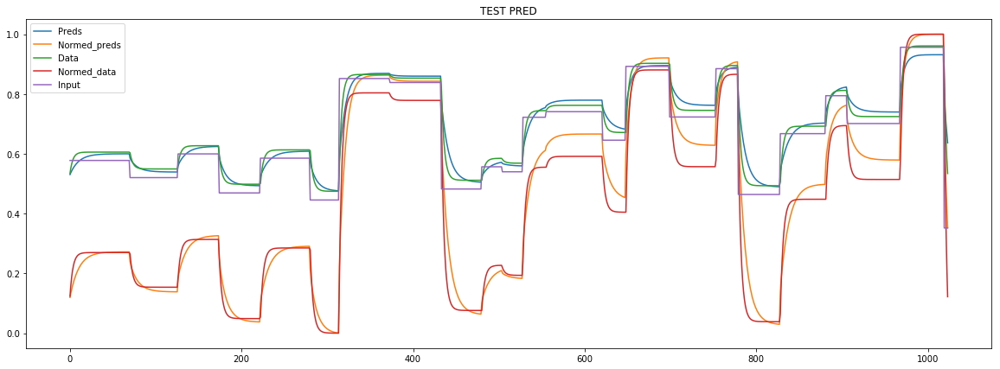

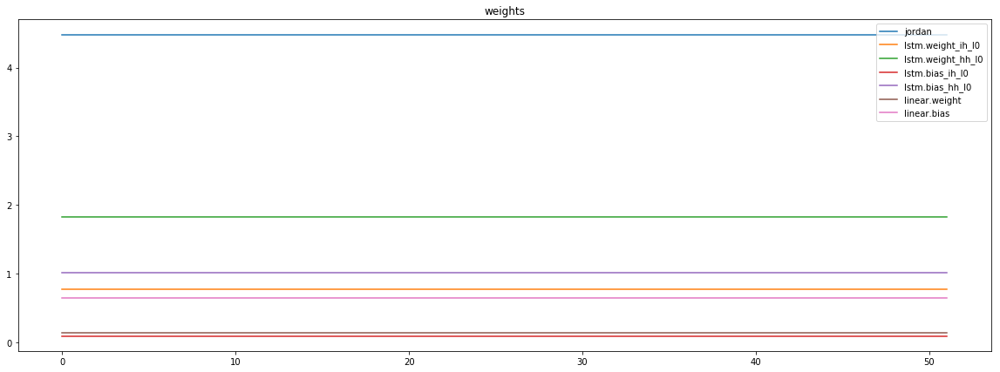

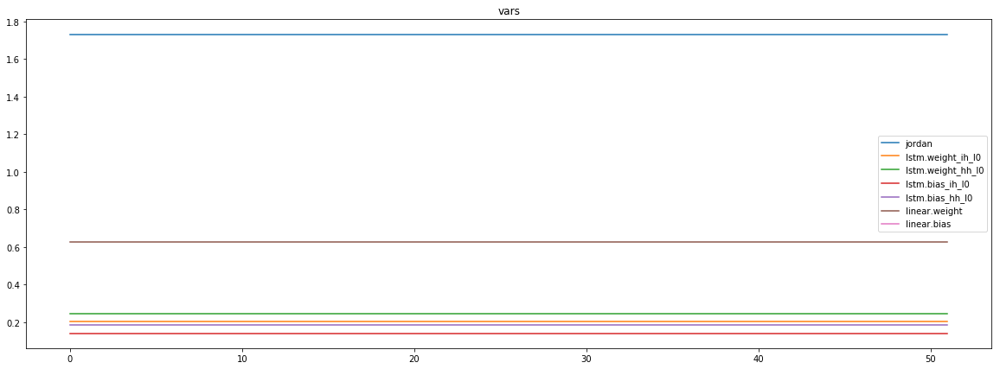

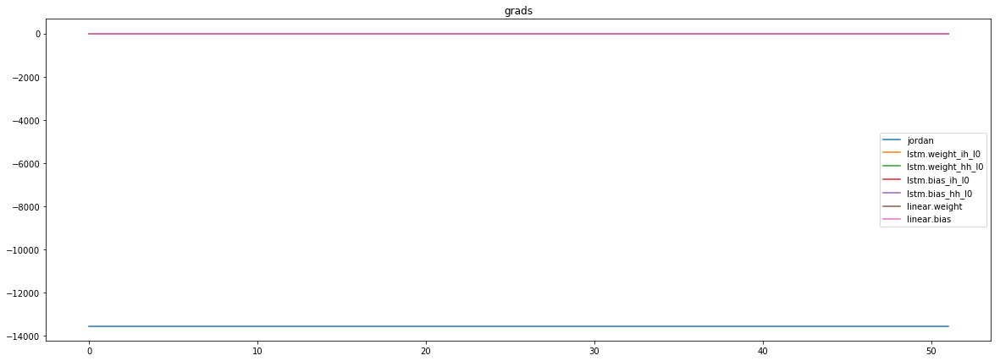

mean_p1 : 5474.322265625
mean_p2 : -18650.064453125
mean_p3 : -361.7320861816406


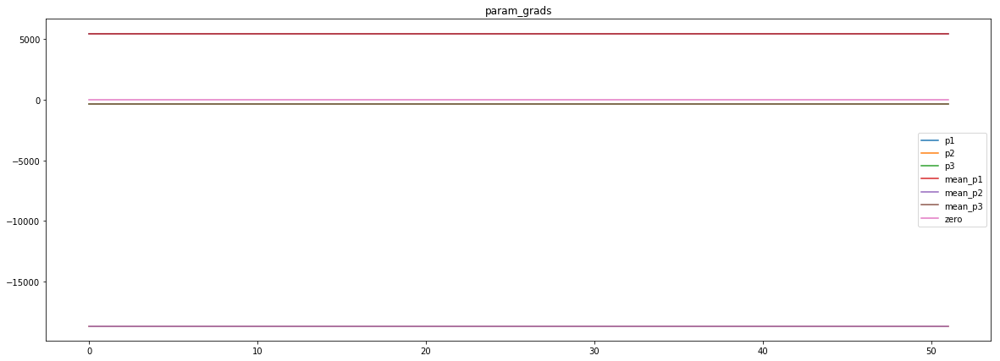

loss rate [0.6209532825658481]
Epoch [13] 
     train_loss[3070.8234112079326] 
     eval_train[21.38071987123336] 
     eval_test[21.43384423080451]



aux preds: 0.4444066286087036           1.0648306608200073           3.2564077377319336
main loss 0.0
aux loss 0.0
jord loss 3035.5347290039062
combined loss 3035.5347290039062 



Parameter containing:
tensor([[0.4444, 1.0648, 3.2564]], requires_grad=True)


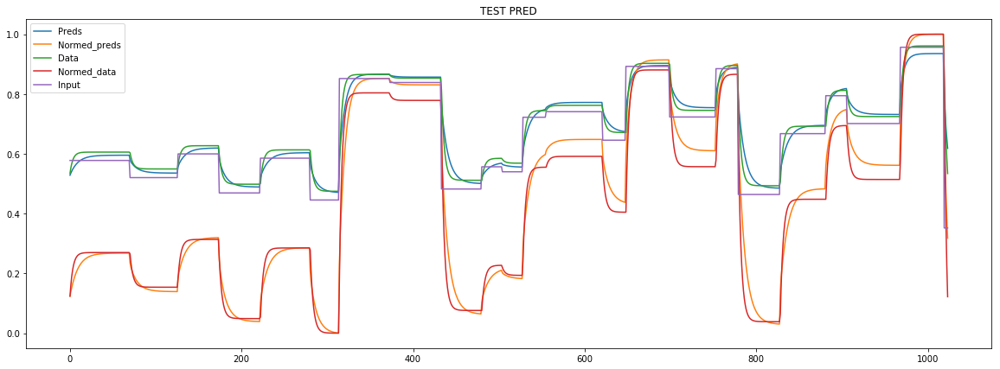

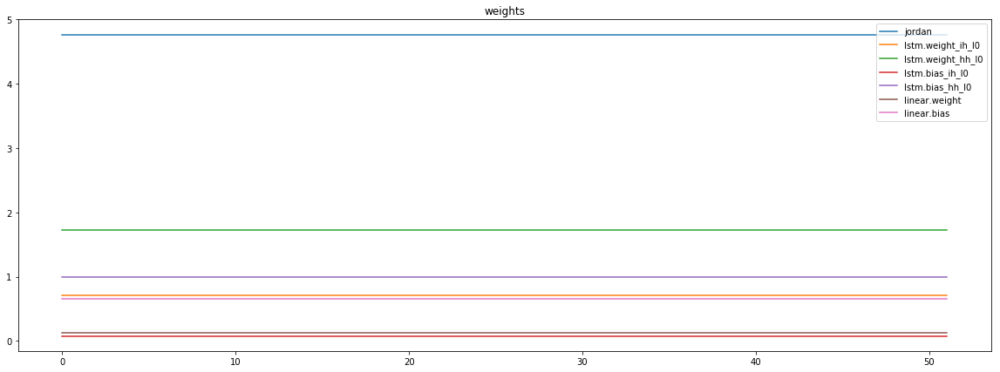

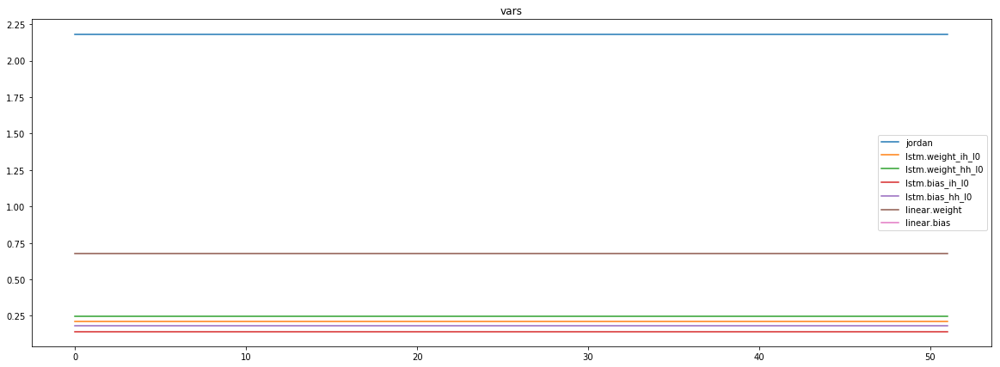

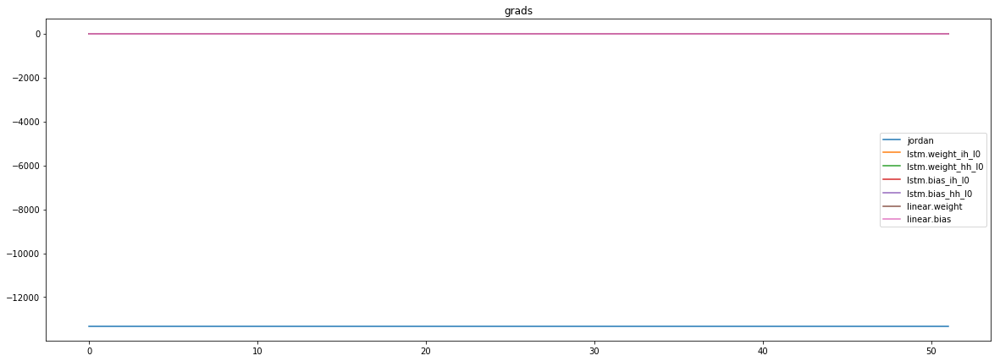

mean_p1 : 3272.4384765625
mean_p2 : -16242.2109375
mean_p3 : -338.91131591796875


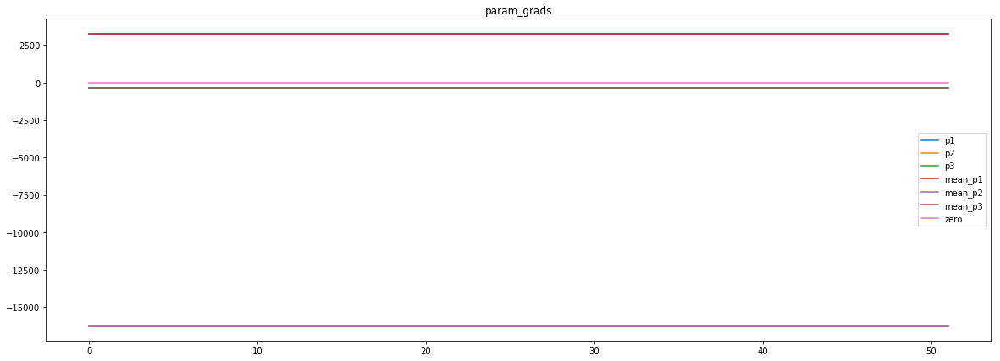

loss rate [0.3988926947912078]
Epoch [14] 
     train_loss[3035.5347290039062] 
     eval_train[17.63901231118227] 
     eval_test[17.801346124414437]



aux preds: 0.4436051547527313           1.0606367588043213           3.552532911300659
main loss 0.0
aux loss 0.0
jord loss 2975.567439152644
combined loss 2975.567439152644 



Parameter containing:
tensor([[0.4436, 1.0606, 3.5525]], requires_grad=True)


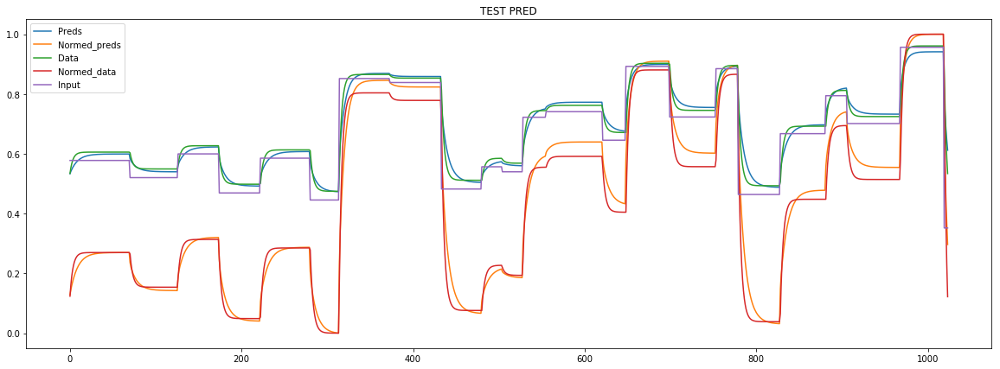

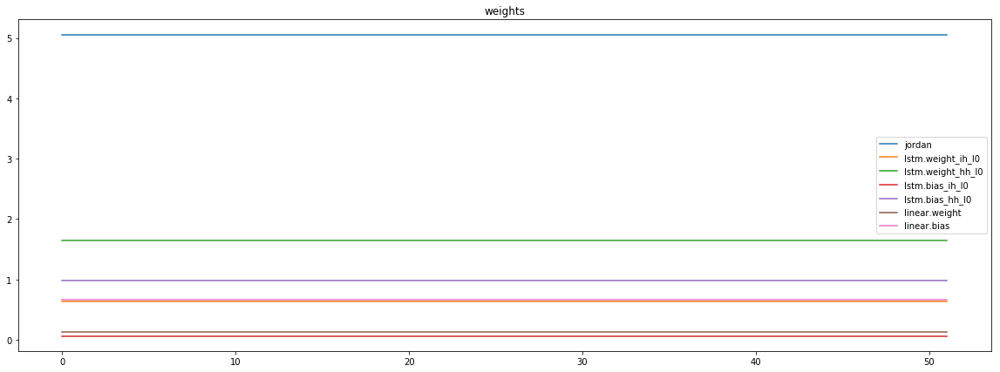

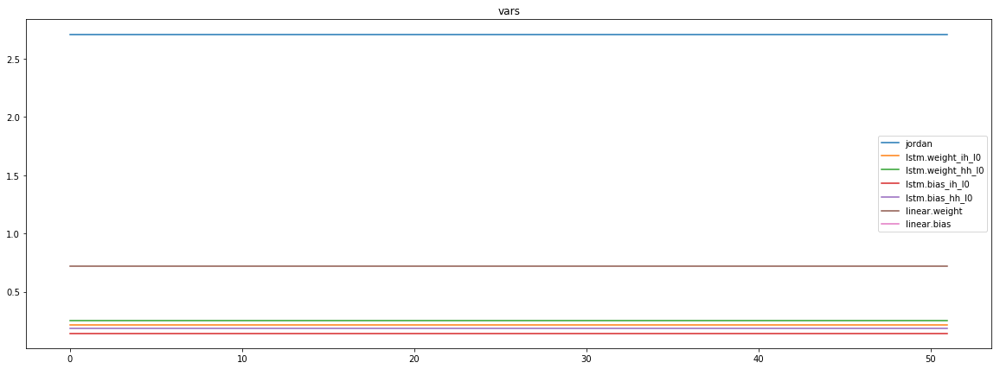

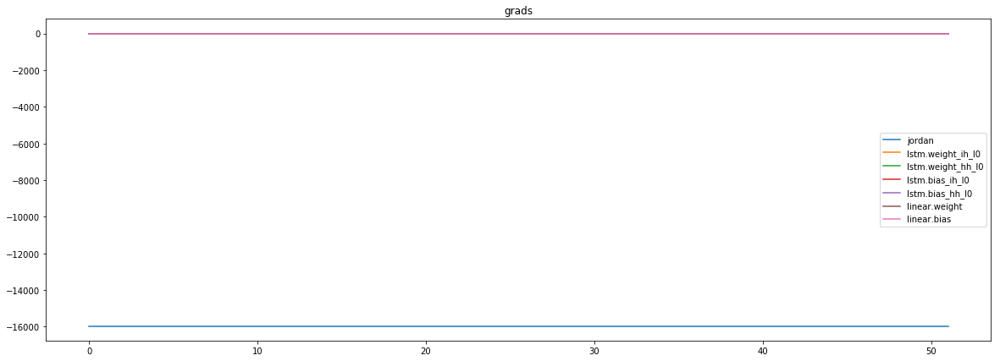

mean_p1 : 2721.748046875
mean_p2 : -18326.244140625
mean_p3 : -358.98028564453125


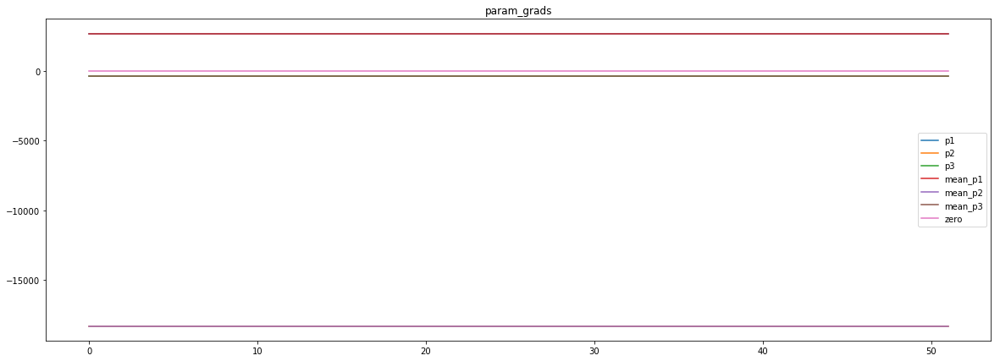

loss rate [0.3058339162911118]
Epoch [15] 
     train_loss[2975.567439152644] 
     eval_train[15.534498793484929] 
     eval_test[15.569112032053948]



aux preds: 0.44355517625808716           1.0581294298171997           3.843198537826538
main loss 0.0
aux loss 0.0
jord loss 2926.717552771935
combined loss 2926.717552771935 



Parameter containing:
tensor([[0.4436, 1.0581, 3.8432]], requires_grad=True)


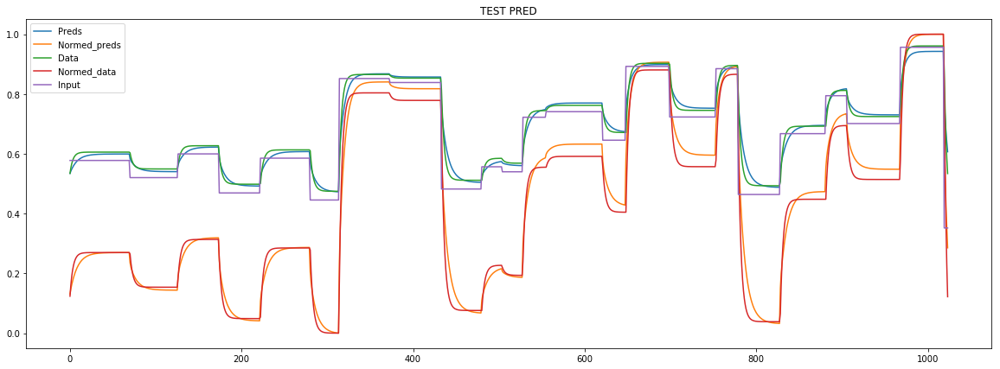

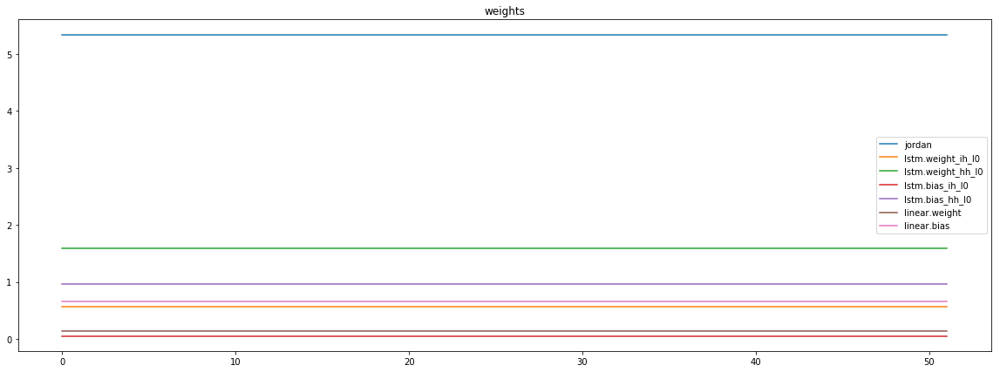

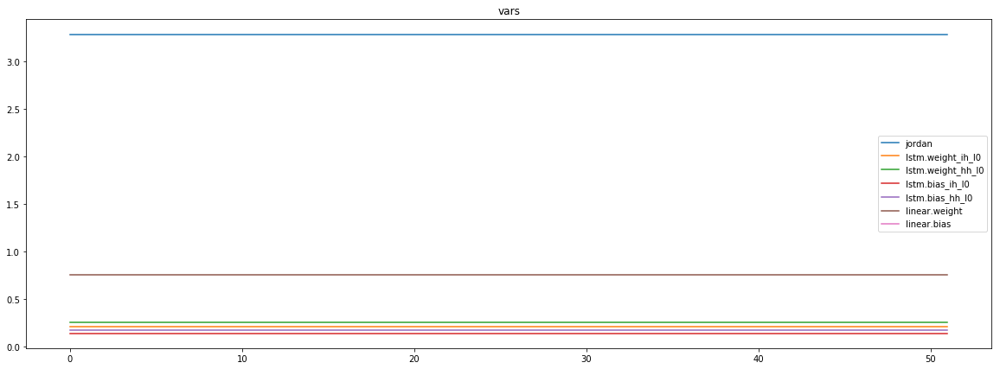

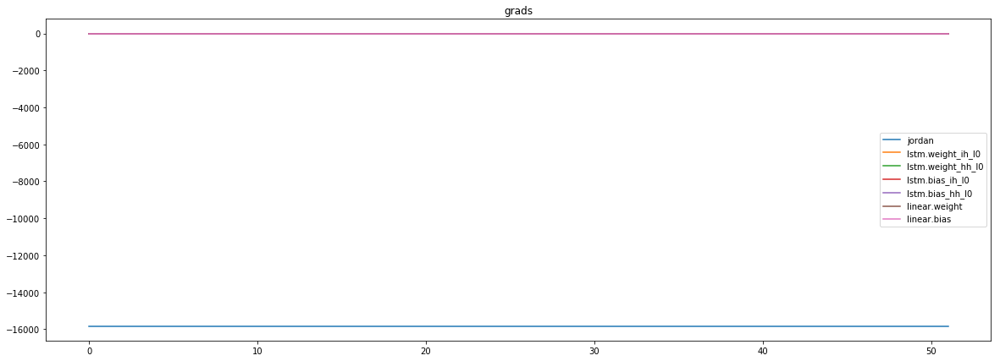

mean_p1 : 2843.940185546875
mean_p2 : -18310.671875
mean_p3 : -358.67529296875


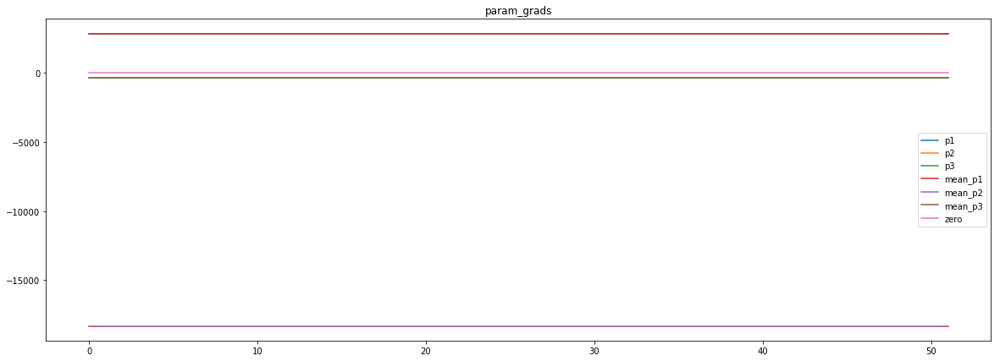

loss rate [0.2133476756357755]
Epoch [16] 
     train_loss[2926.717552771935] 
     eval_train[14.331805938420494] 
     eval_test[14.37064395270268]



aux preds: 0.4444853663444519           1.0551456212997437           4.1346755027771
main loss 0.0
aux loss 0.0
jord loss 2881.387225811298
combined loss 2881.387225811298 



Parameter containing:
tensor([[0.4445, 1.0551, 4.1347]], requires_grad=True)


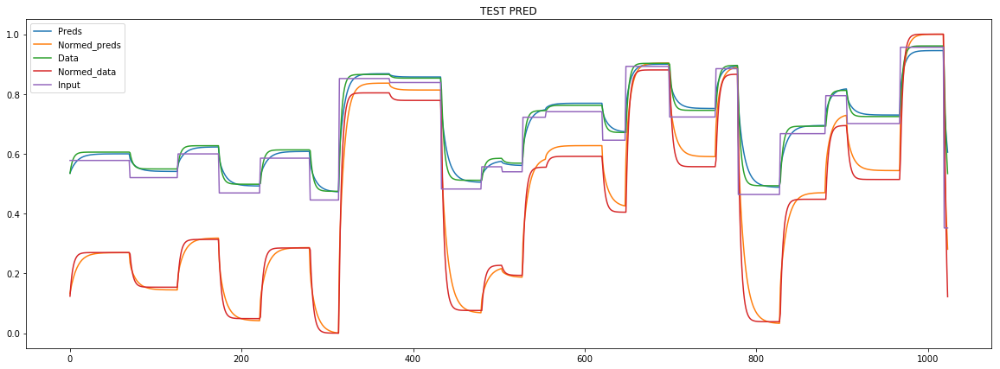

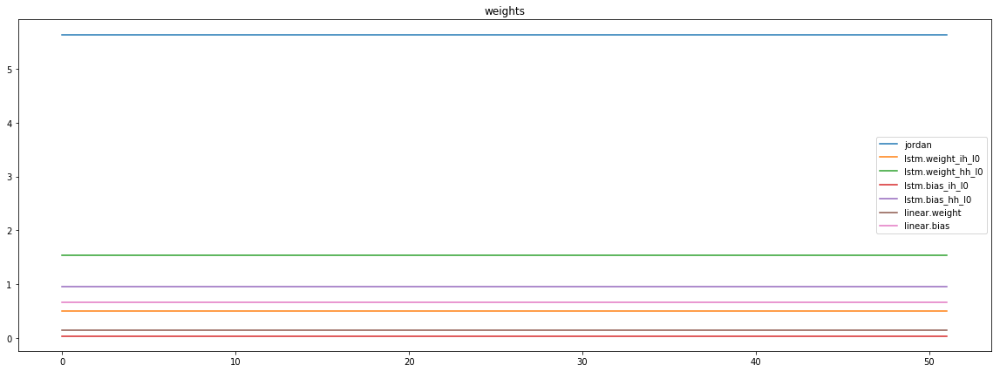

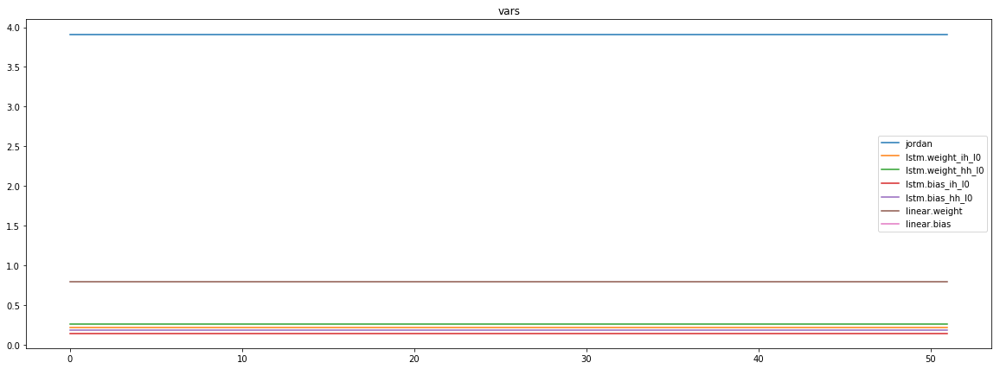

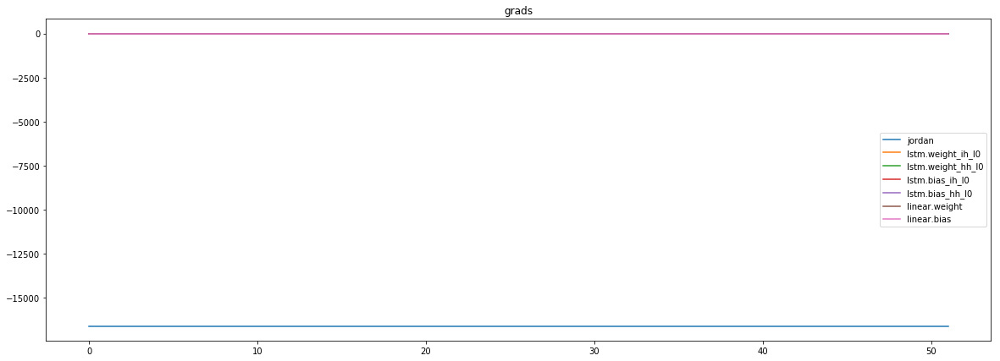

mean_p1 : 5302.193359375
mean_p2 : -21509.4296875
mean_p3 : -389.289794921875


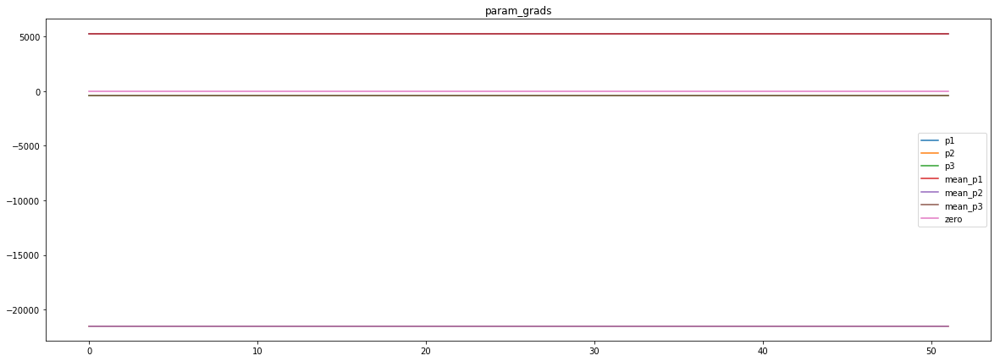

loss rate [0.14346137393015423]
Epoch [17] 
     train_loss[2881.387225811298] 
     eval_train[13.597426836840055] 
     eval_test[13.6306993358832]



aux preds: 0.4449779689311981           1.0524653196334839           4.424644947052002
main loss 0.0
aux loss 0.0
jord loss 2835.3942284217246
combined loss 2835.3942284217246 



Parameter containing:
tensor([[0.4450, 1.0525, 4.4246]], requires_grad=True)


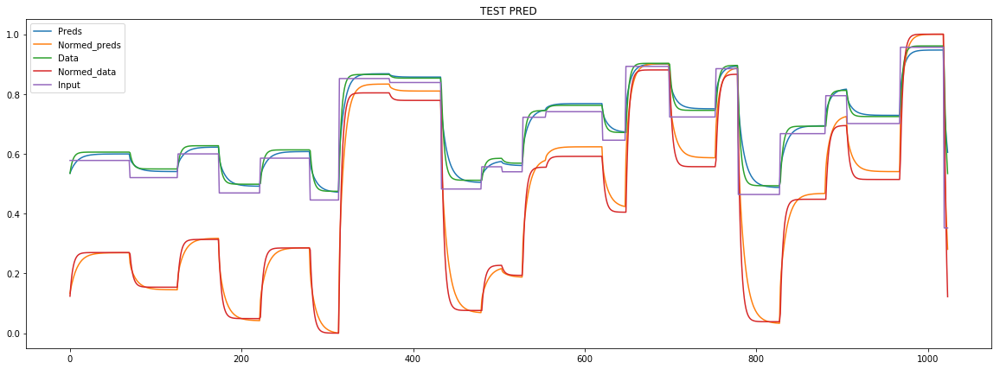

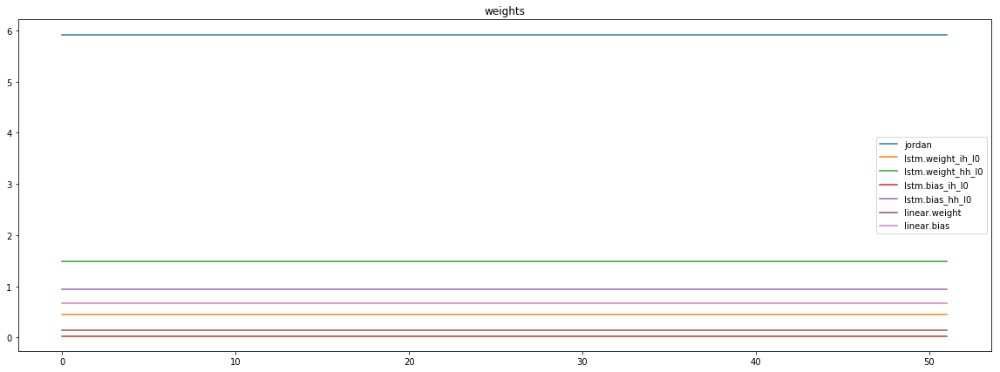

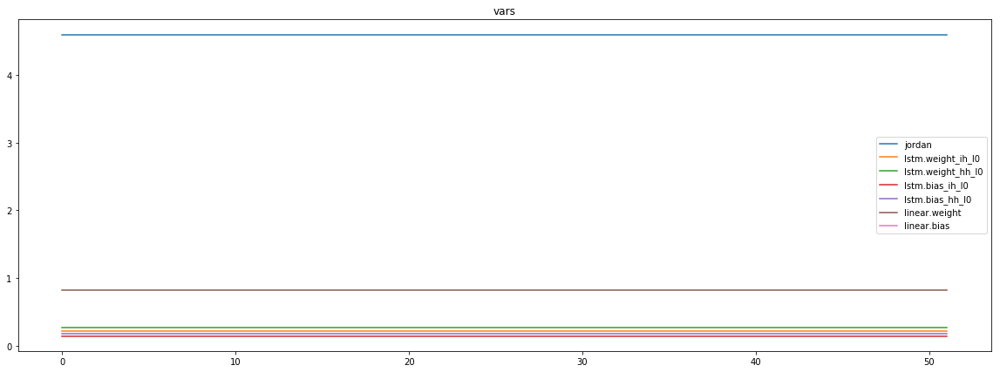

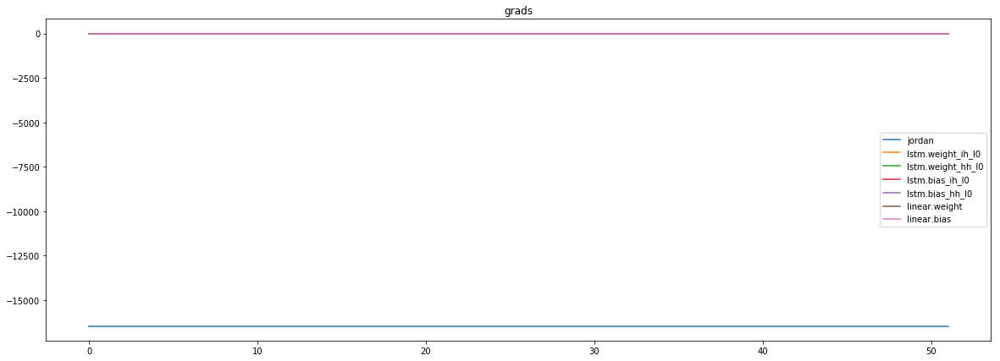

mean_p1 : 5407.59619140625
mean_p2 : -21489.98046875
mean_p3 : -388.9378967285156


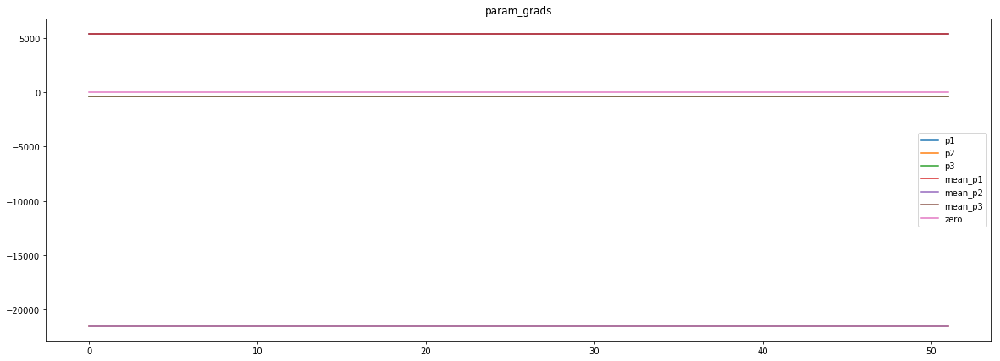

loss rate [0.08870490364518802]
Epoch [18] 
     train_loss[2835.3942284217246] 
     eval_train[13.166711446235869] 
     eval_test[13.235180759881835]



aux preds: 0.44358181953430176           1.0503544807434082           4.7152838706970215
main loss 0.0
aux loss 0.0
jord loss 2788.431417611929
combined loss 2788.431417611929 



Parameter containing:
tensor([[0.4436, 1.0504, 4.7153]], requires_grad=True)


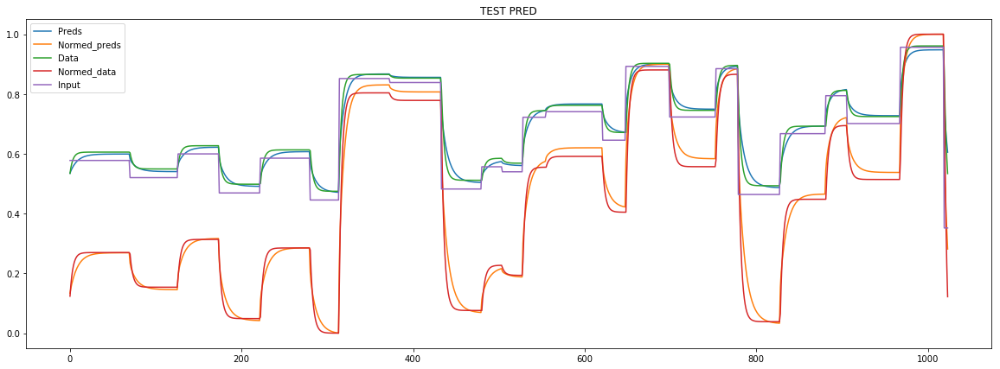

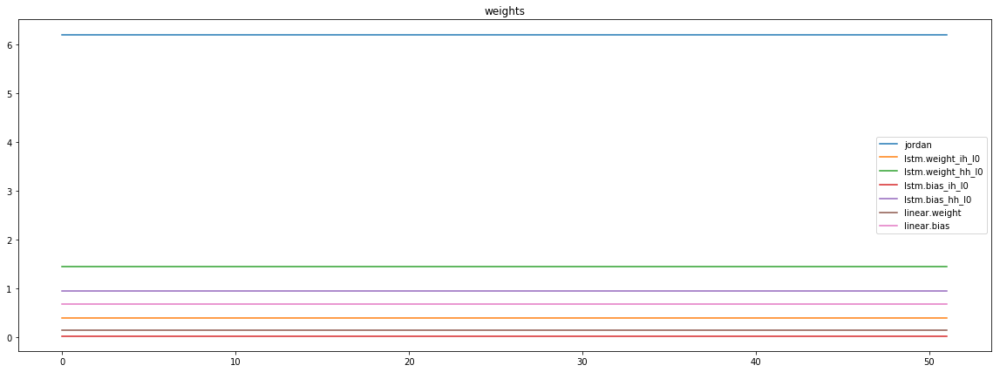

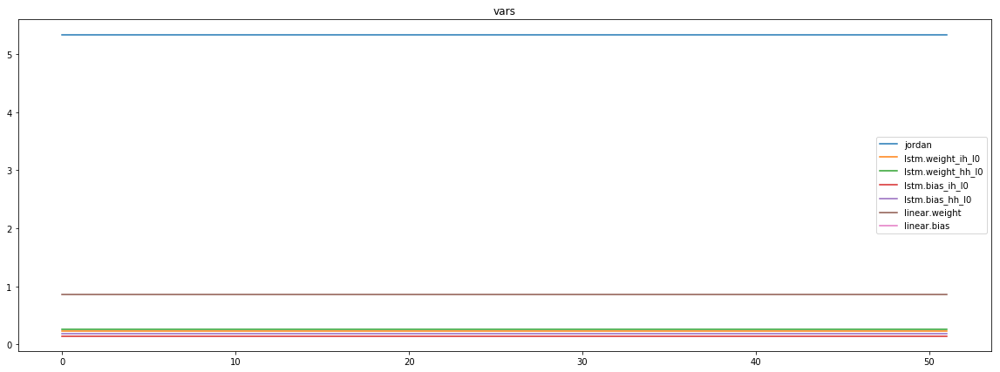

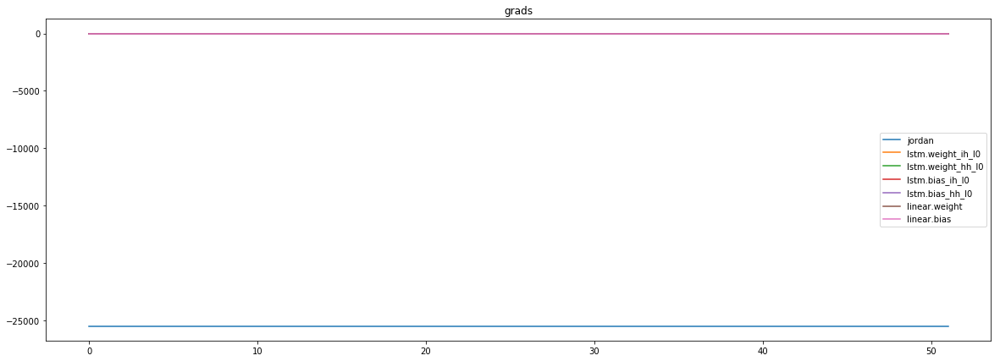

mean_p1 : -902.342529296875
mean_p2 : -24172.53125
mean_p3 : -412.6436767578125


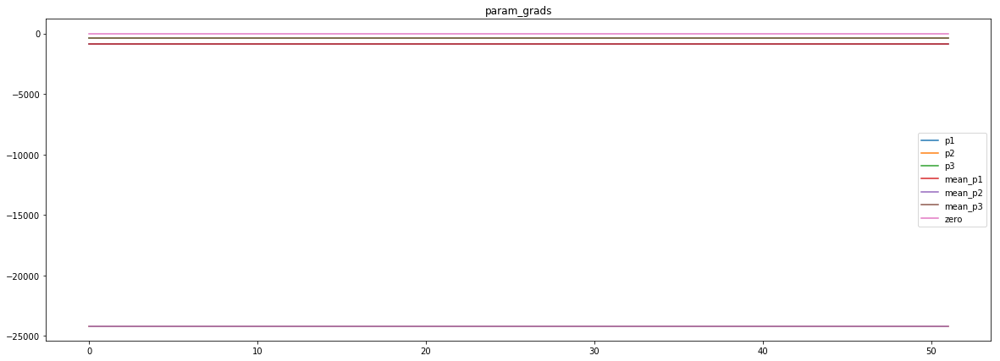

loss rate [0.04699655244736223]
Epoch [19] 
     train_loss[2788.431417611929] 
     eval_train[13.00929155018709] 
     eval_test[13.099516527758995]



aux preds: 0.44592463970184326           1.0467294454574585           5.001794815063477
main loss 0.0
aux loss 0.0
jord loss 2741.47807429387
combined loss 2741.47807429387 



Parameter containing:
tensor([[0.4459, 1.0467, 5.0018]], requires_grad=True)


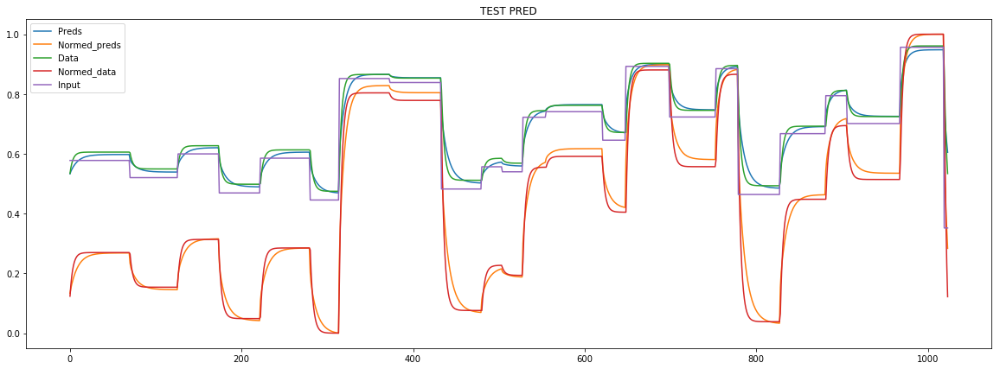

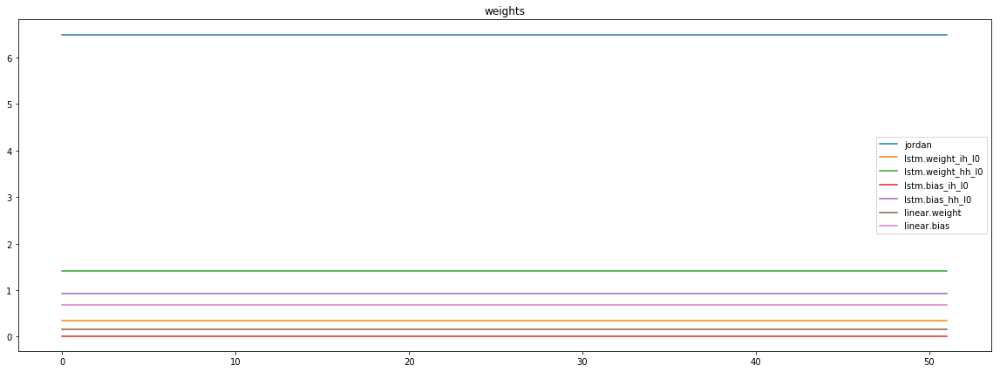

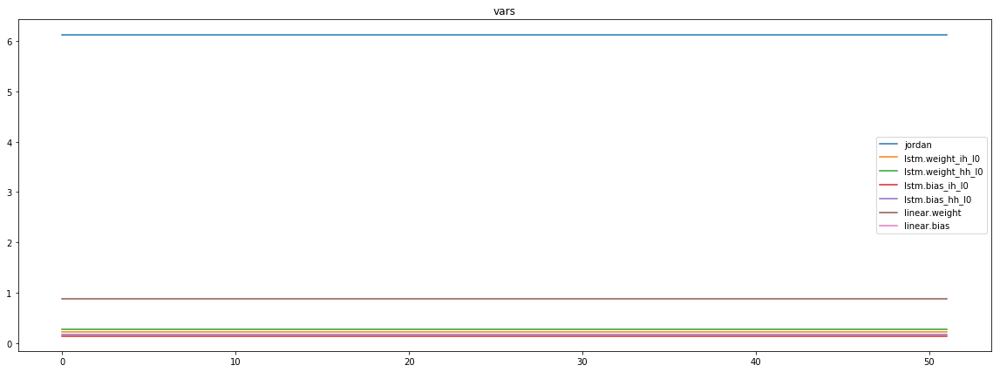

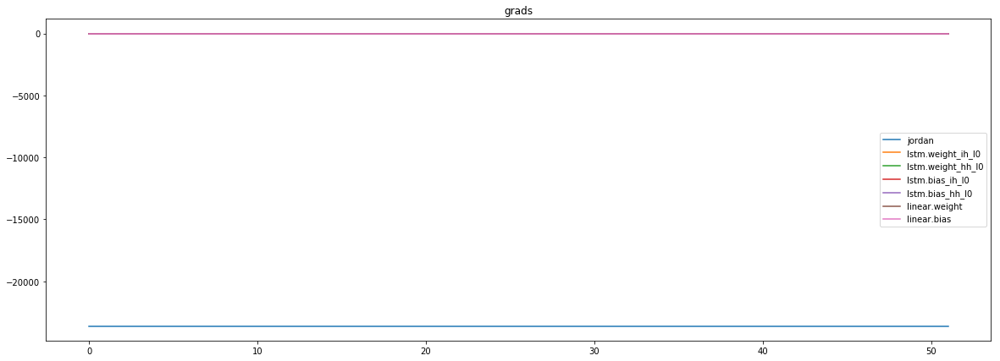

mean_p1 : 2341.20751953125
mean_p2 : -25511.91015625
mean_p3 : -425.6704406738281


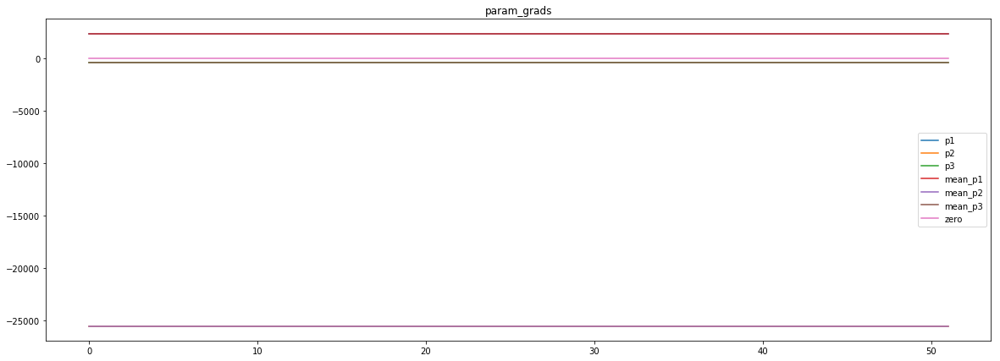

loss rate [0.003739035289301529]
Epoch [20] 
     train_loss[2741.47807429387] 
     eval_train[13.172004100866616] 
     eval_test[13.271988198399248]



aux preds: 0.44485530257225037           1.0447542667388916           5.284792423248291
main loss 0.0
aux loss 0.0
jord loss 2699.5953345665566
combined loss 2699.5953345665566 



Parameter containing:
tensor([[0.4449, 1.0448, 5.2848]], requires_grad=True)


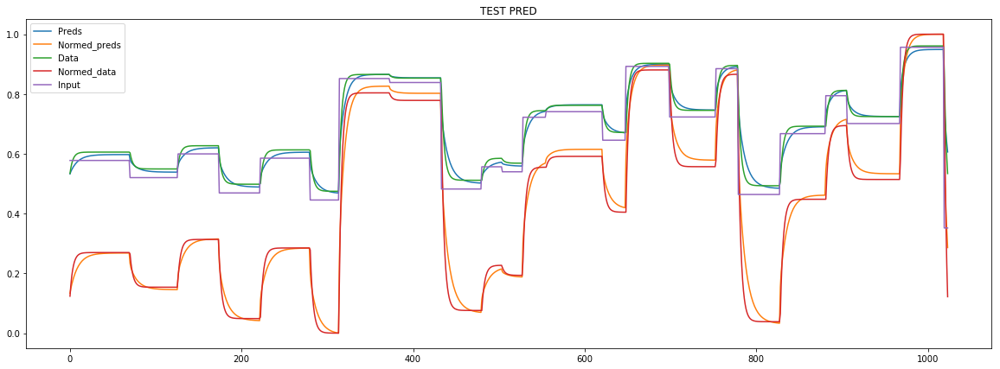

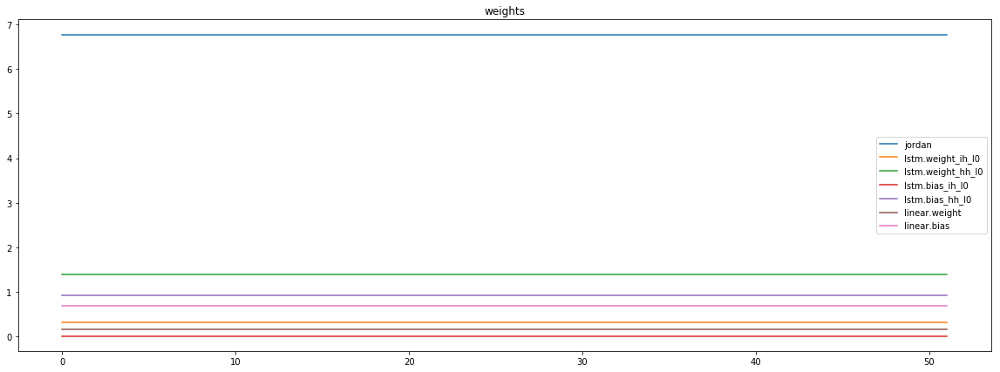

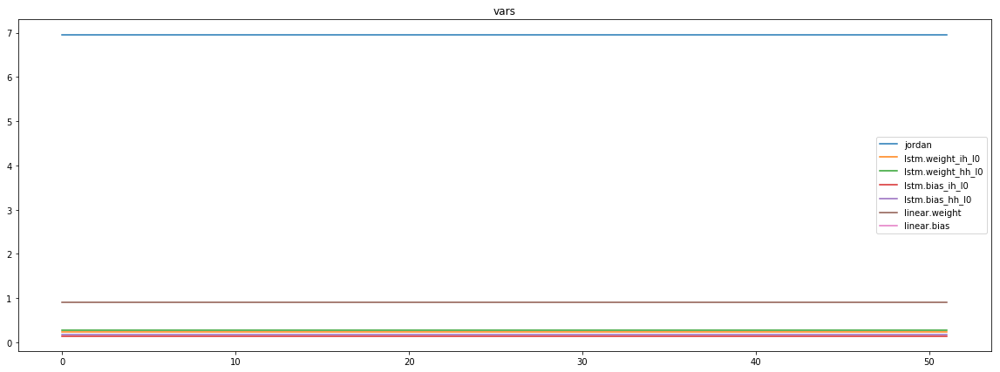

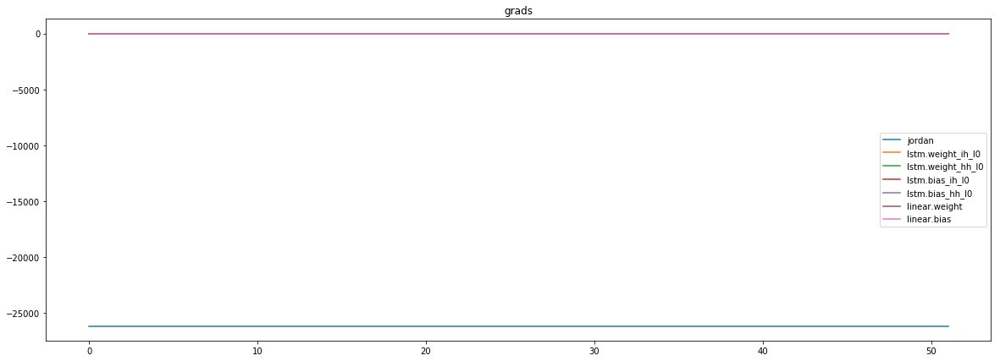

mean_p1 : 1608.8829345703125
mean_p2 : -27333.8046875
mean_p3 : -442.4361877441406


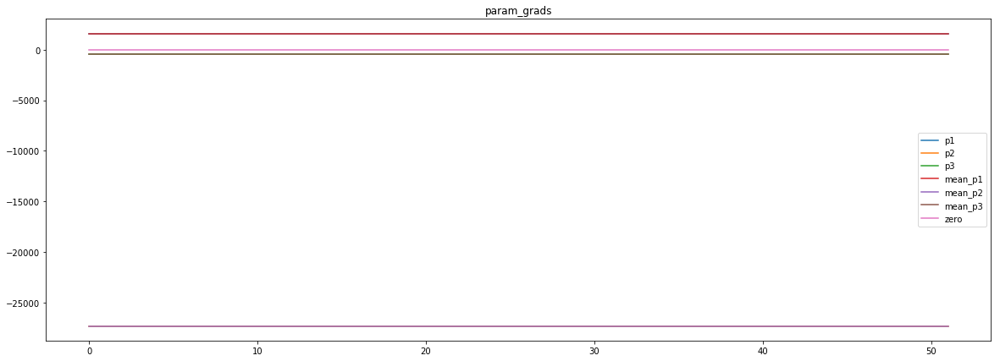

loss rate [-0.013366015886235427]
Epoch [21] 
     train_loss[2699.5953345665566] 
     eval_train[13.289142244452915] 
     eval_test[13.378689691149207]



aux preds: 0.4446505606174469           1.0419188737869263           5.564473628997803
main loss 0.0
aux loss 0.0
jord loss 2652.810572697566
combined loss 2652.810572697566 



Parameter containing:
tensor([[0.4447, 1.0419, 5.5645]], requires_grad=True)


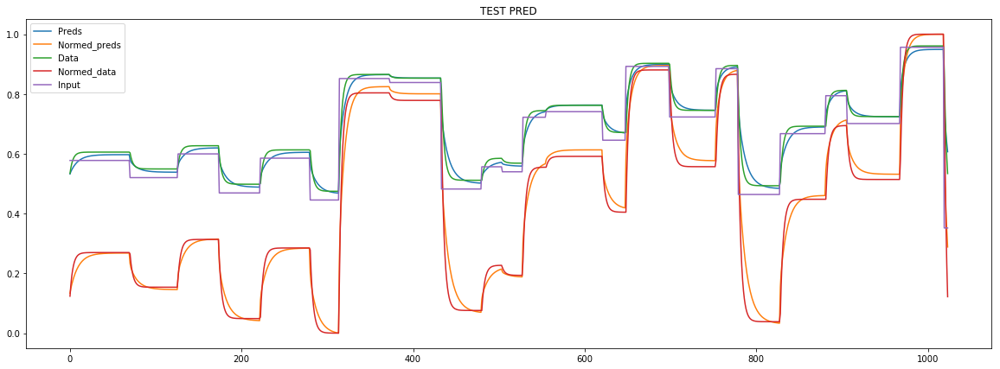

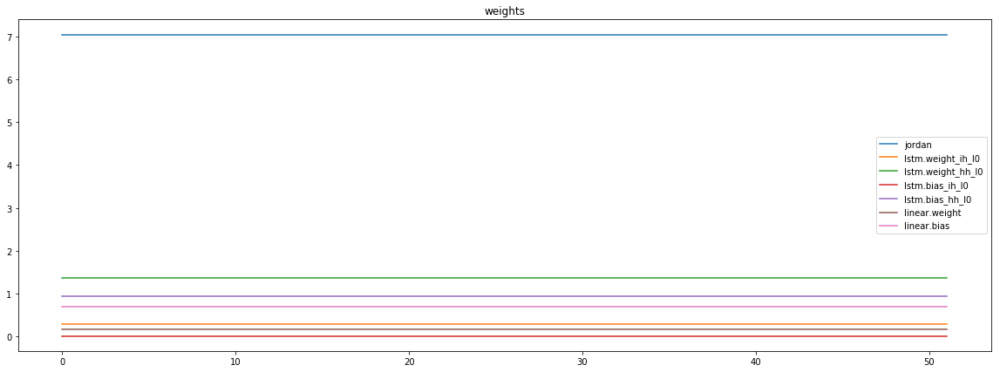

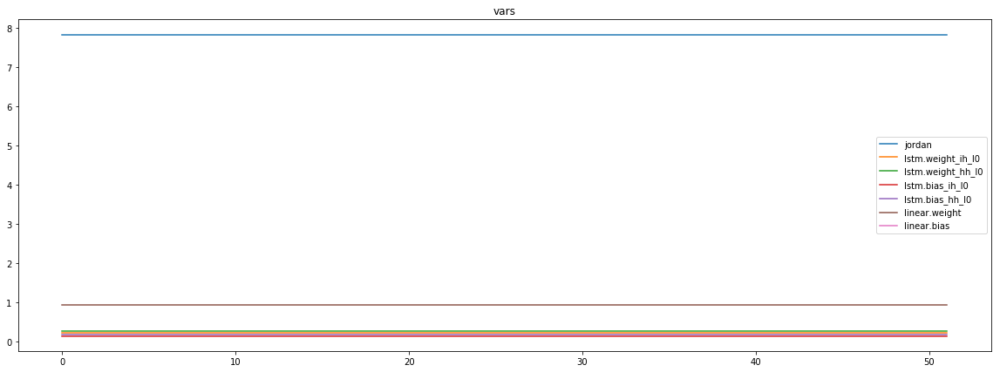

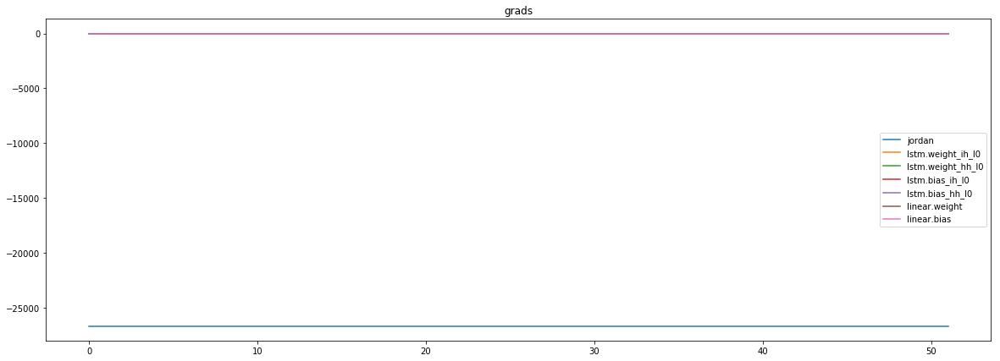

mean_p1 : 3342.431640625
mean_p2 : -29521.728515625
mean_p3 : -462.6327819824219


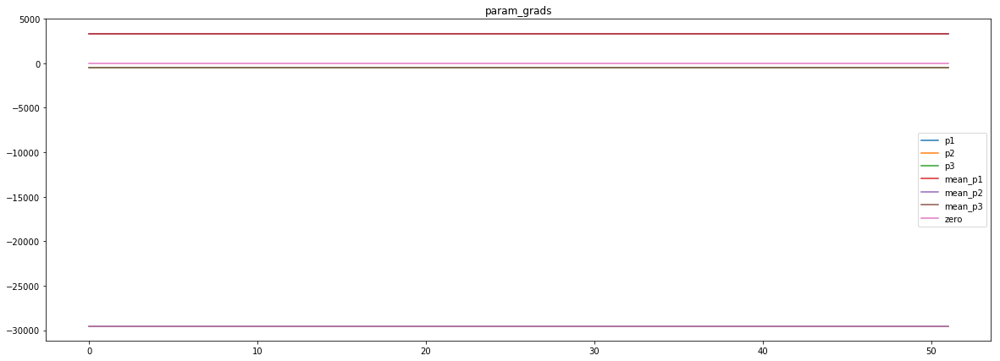

loss rate [-0.02835337594143983]
Epoch [22] 
     train_loss[2652.810572697566] 
     eval_train[13.555007647924446] 
     eval_test[13.625748874455564]



aux preds: 0.442658007144928           1.0385642051696777           5.838412284851074
main loss 0.0
aux loss 0.0
jord loss 2608.5609670785757
combined loss 2608.5609670785757 



Parameter containing:
tensor([[0.4427, 1.0386, 5.8384]], requires_grad=True)


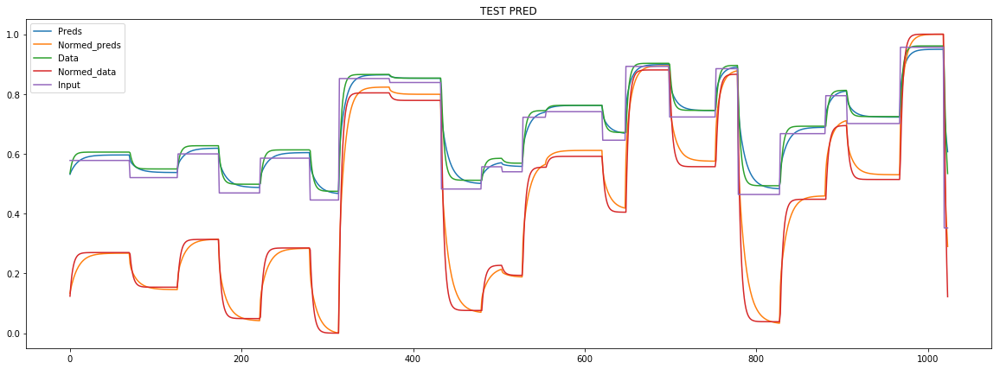

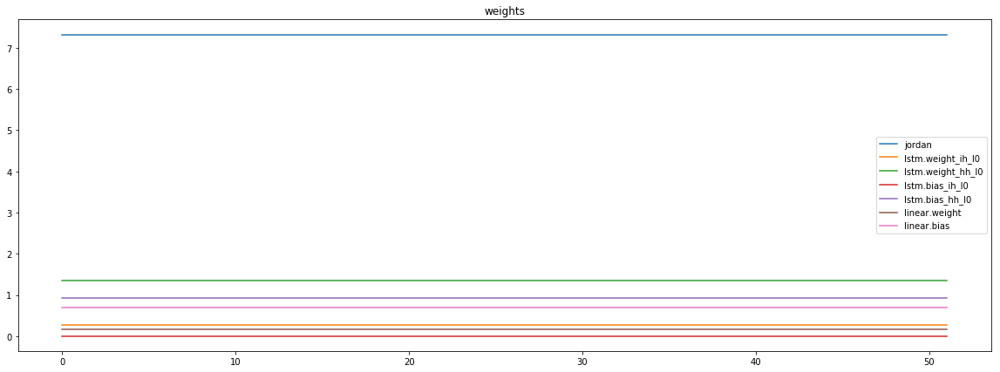

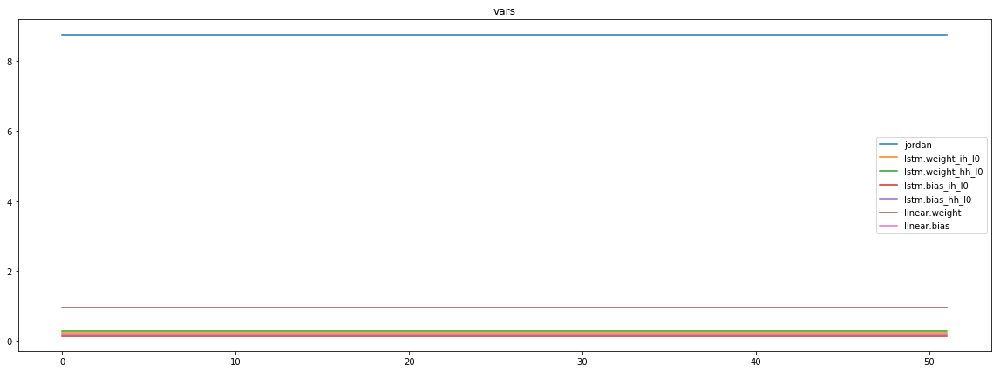

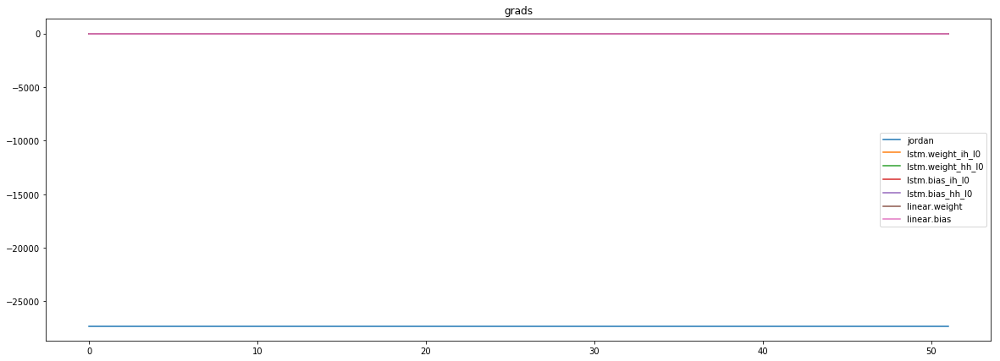

mean_p1 : -816.4404296875
mean_p2 : -26054.328125
mean_p3 : -429.9883117675781


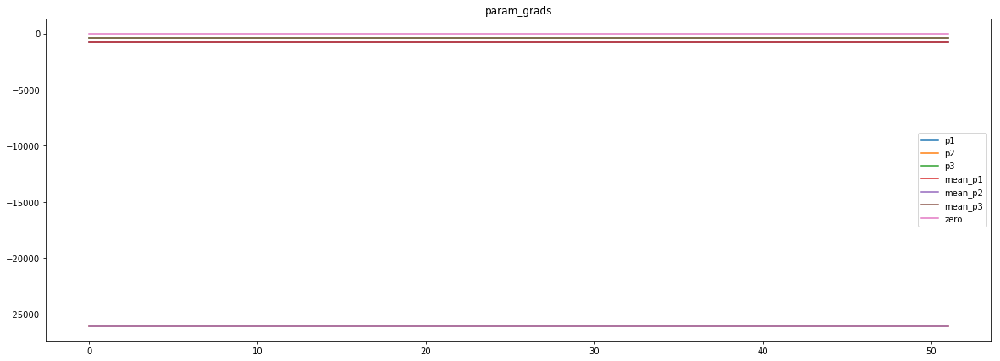

loss rate [-0.043867540166984575]
Epoch [23] 
     train_loss[2608.5609670785757] 
     eval_train[13.96401091532495] 
     eval_test[14.014418177618857]



aux preds: 0.4428880512714386           1.035614252090454           6.106709957122803
main loss 0.0
aux loss 0.0
jord loss 2569.761483999399
combined loss 2569.761483999399 



Parameter containing:
tensor([[0.4429, 1.0356, 6.1067]], requires_grad=True)


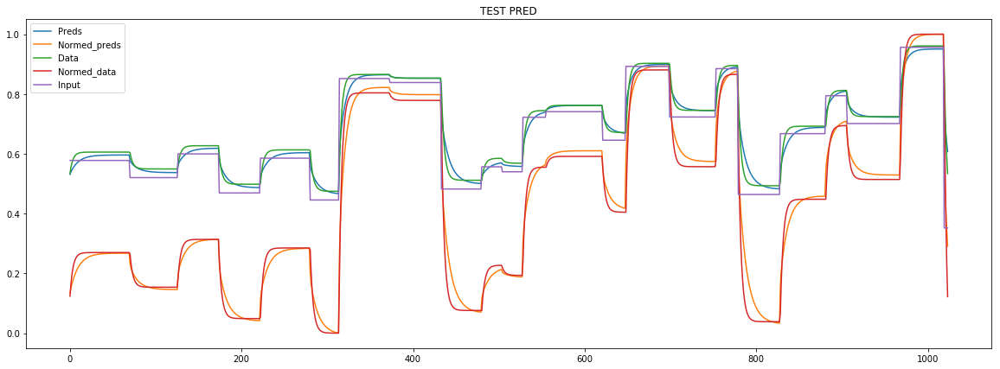

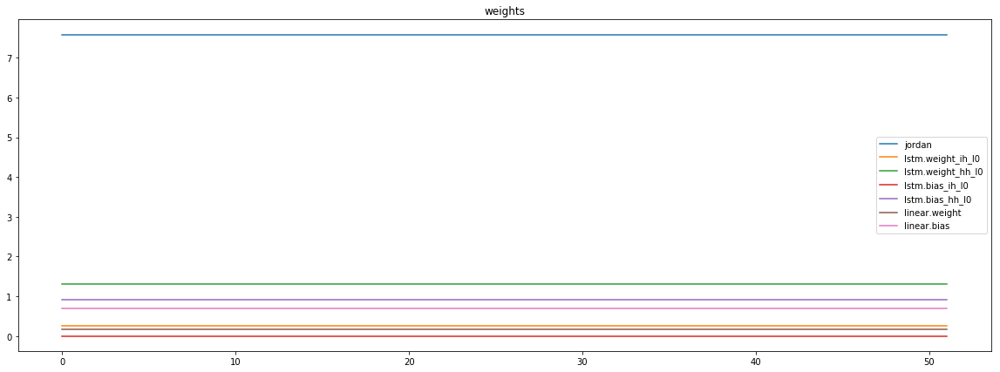

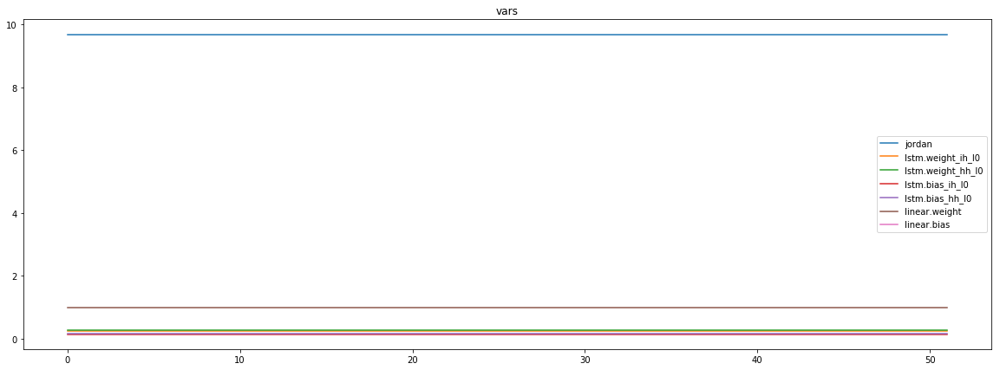

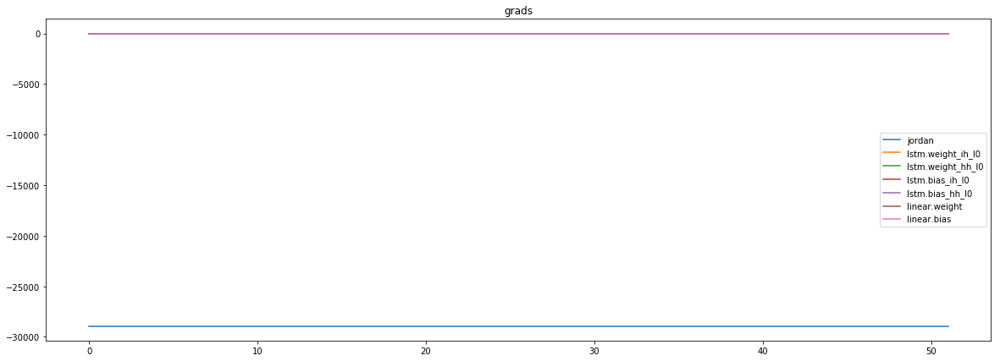

mean_p1 : 1505.279541015625
mean_p2 : -29961.197265625
mean_p3 : -466.8509216308594


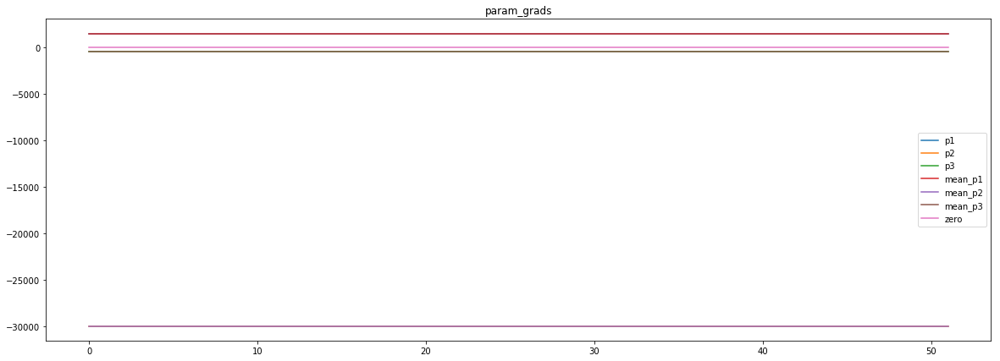

loss rate [-0.03246491093010784]
Epoch [24] 
     train_loss[2569.761483999399] 
     eval_train[14.067879284738758] 
     eval_test[14.116843424615746]



aux preds: 0.44442906975746155           1.0338951349258423           6.370367527008057
main loss 0.0
aux loss 0.0
jord loss 2527.117006742037
combined loss 2527.117006742037 



Parameter containing:
tensor([[0.4444, 1.0339, 6.3704]], requires_grad=True)


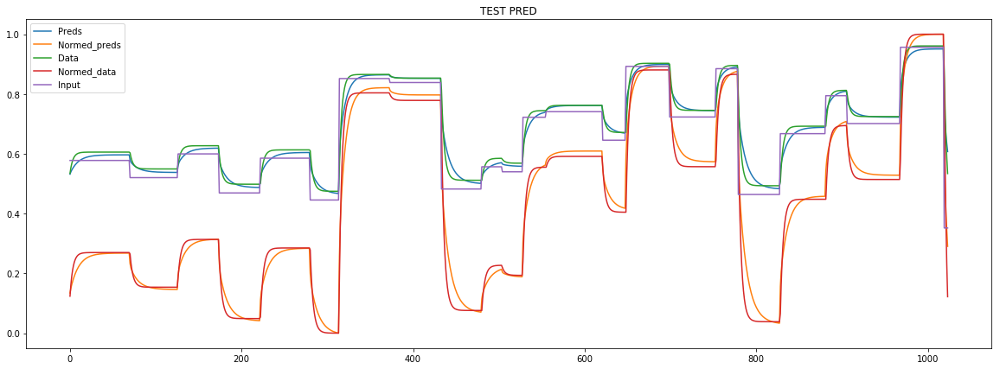

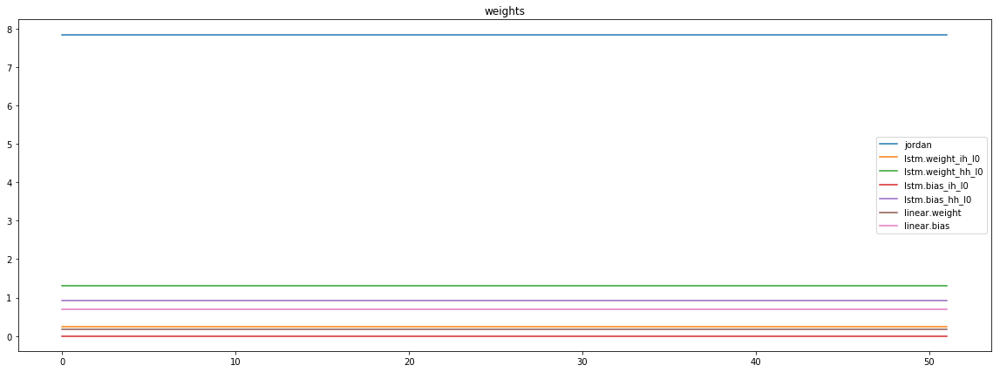

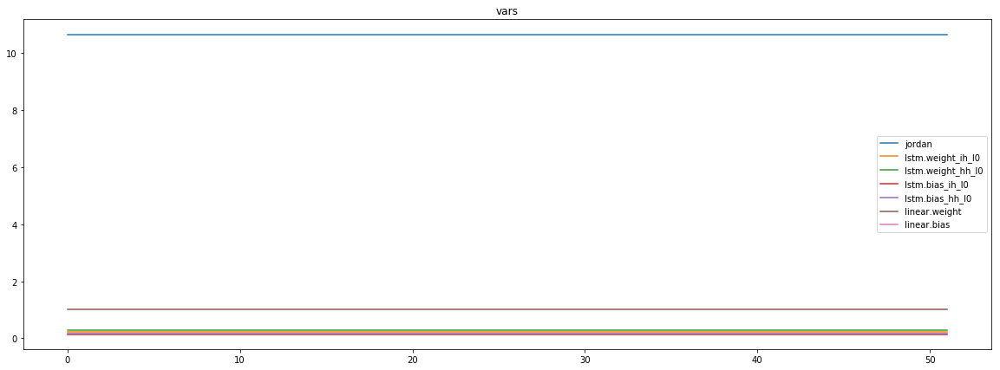

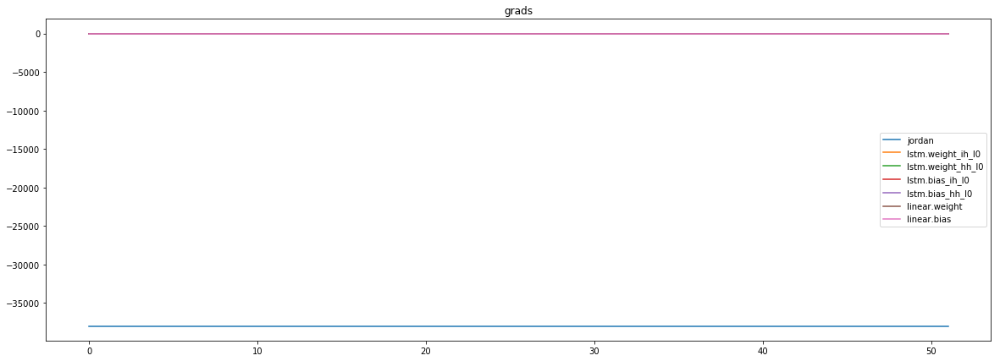

mean_p1 : 5820.33544921875
mean_p2 : -43205.83203125
mean_p3 : -586.1344604492188


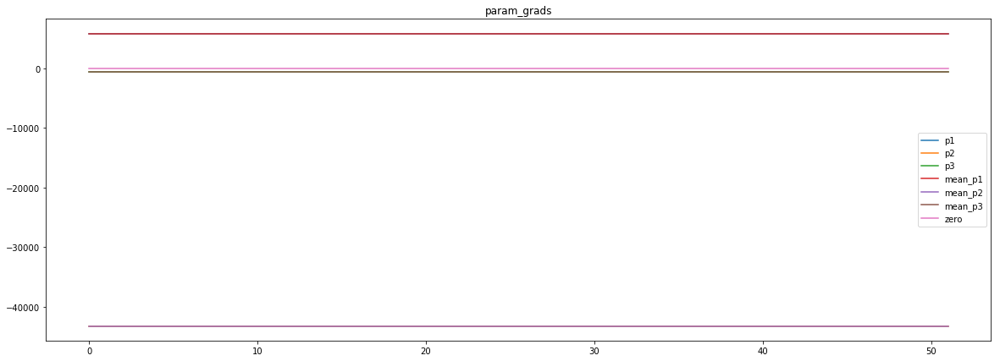

loss rate [-0.013772409883439085]
Epoch [25] 
     train_loss[2527.117006742037] 
     eval_train[14.068708261349597] 
     eval_test[14.110701713494068]



aux preds: 0.4429625868797302           1.0317912101745605           6.6175217628479
main loss 0.0
aux loss 0.0
jord loss 2486.8963928222656
combined loss 2486.8963928222656 



Parameter containing:
tensor([[0.4430, 1.0318, 6.6175]], requires_grad=True)


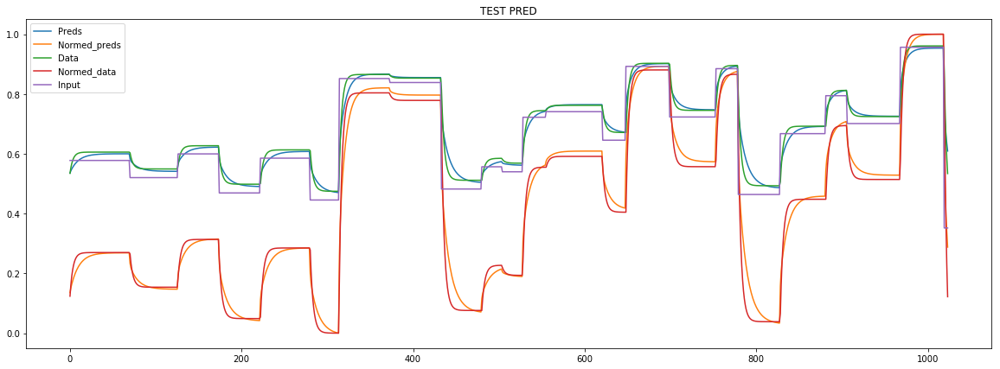

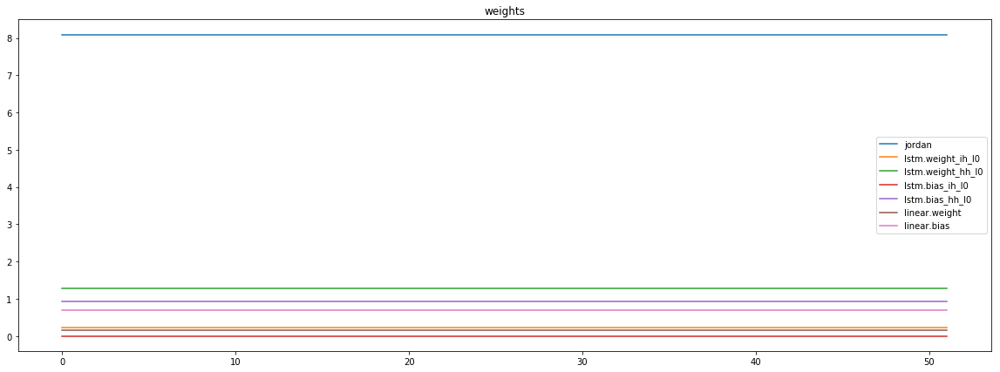

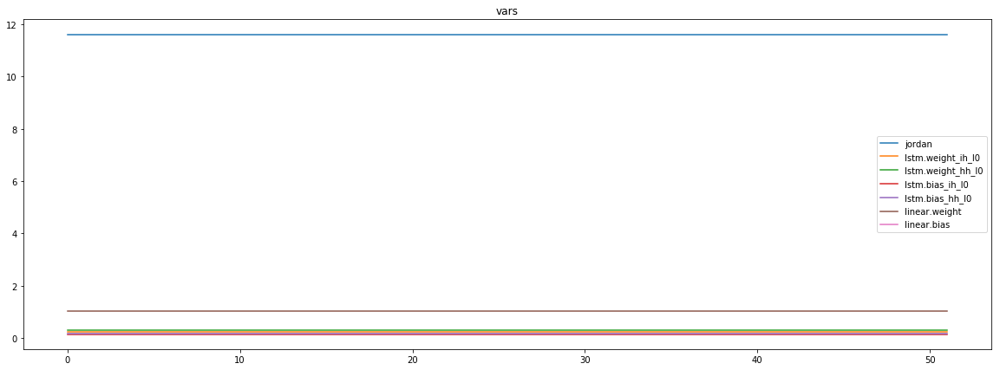

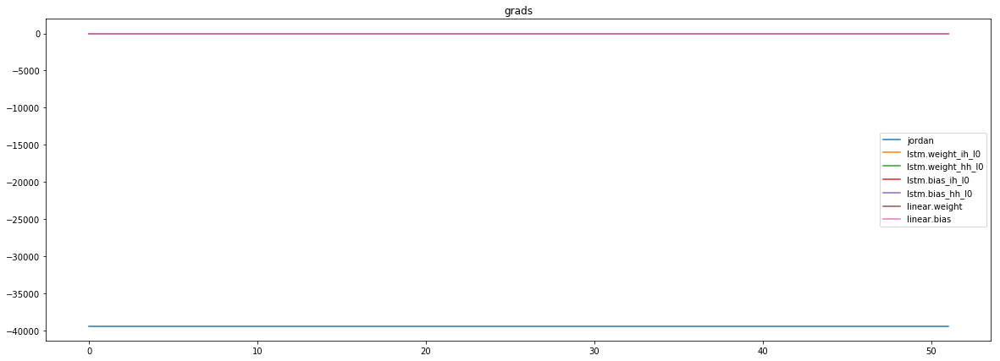

mean_p1 : 884.0625
mean_p2 : -39731.91015625
mean_p3 : -554.149169921875


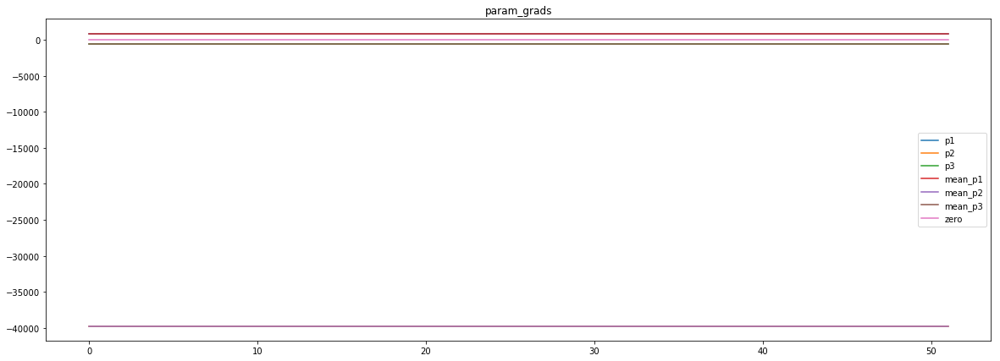

loss rate [0.06358281990616754]
Epoch [26] 
     train_loss[2486.8963928222656] 
     eval_train[13.092788440038788] 
     eval_test[13.185366723247252]



aux preds: 0.4447723925113678           1.0290926694869995           6.862040042877197
main loss 0.0
aux loss 0.0
jord loss 2453.1303194486177
combined loss 2453.1303194486177 



Parameter containing:
tensor([[0.4448, 1.0291, 6.8620]], requires_grad=True)


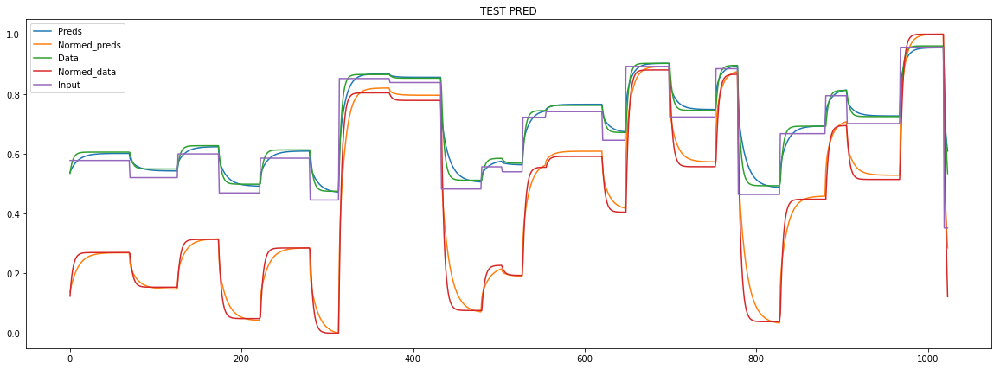

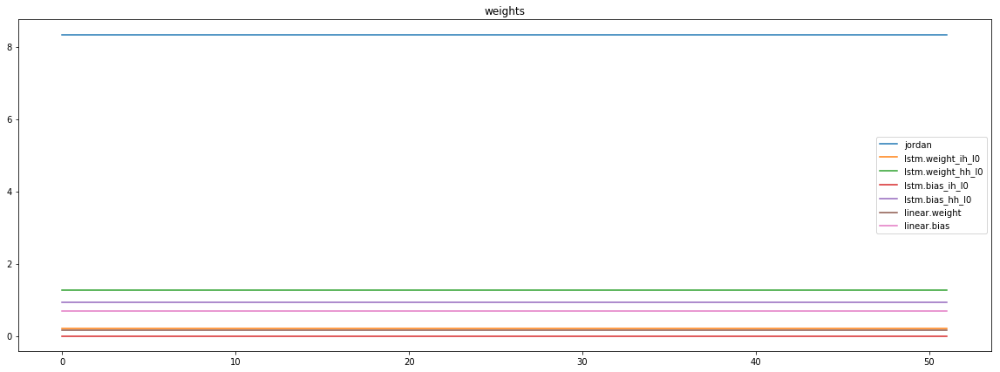

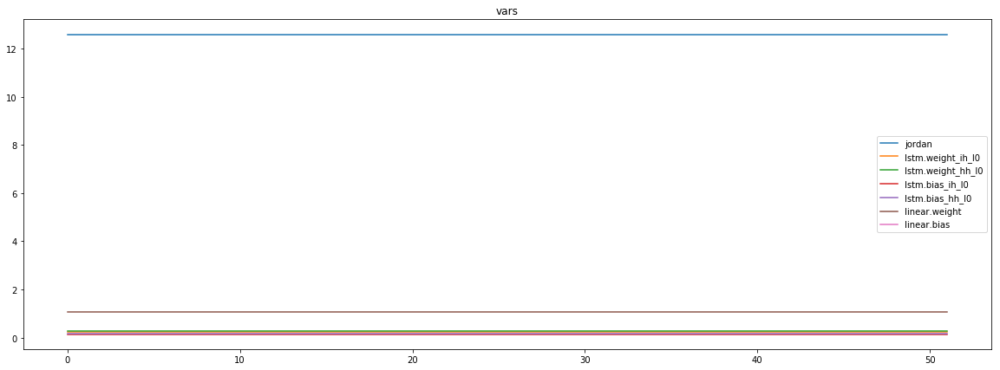

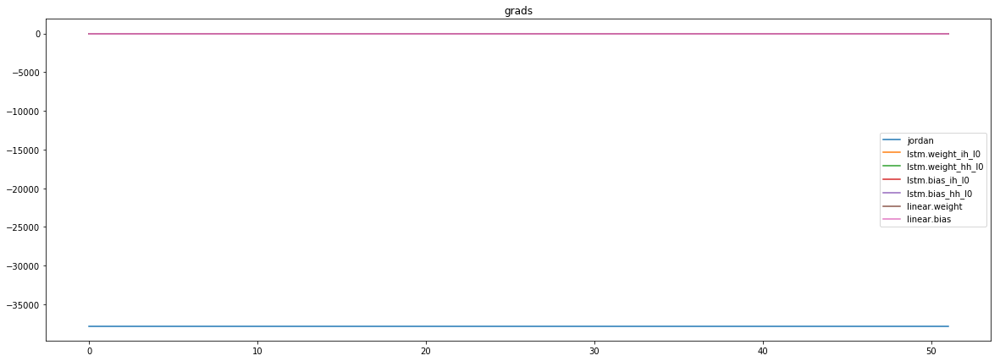

mean_p1 : 6055.3671875
mean_p2 : -43248.3203125
mean_p3 : -586.7106323242188


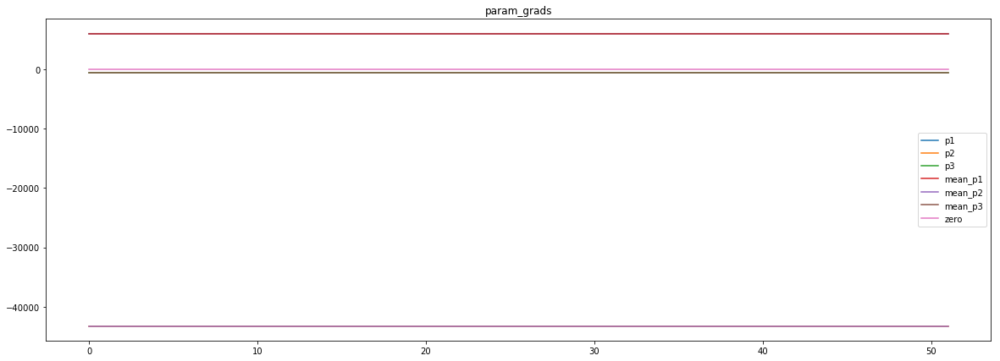

loss rate [0.06365774568859672]
Epoch [27] 
     train_loss[2453.1303194486177] 
     eval_train[12.820284505672484] 
     eval_test[12.92555308328751]



aux preds: 0.44327202439308167           1.0275897979736328           7.084479808807373
main loss 0.0
aux loss 0.0
jord loss 2421.4188443697417
combined loss 2421.4188443697417 



Parameter containing:
tensor([[0.4433, 1.0276, 7.0845]], requires_grad=True)


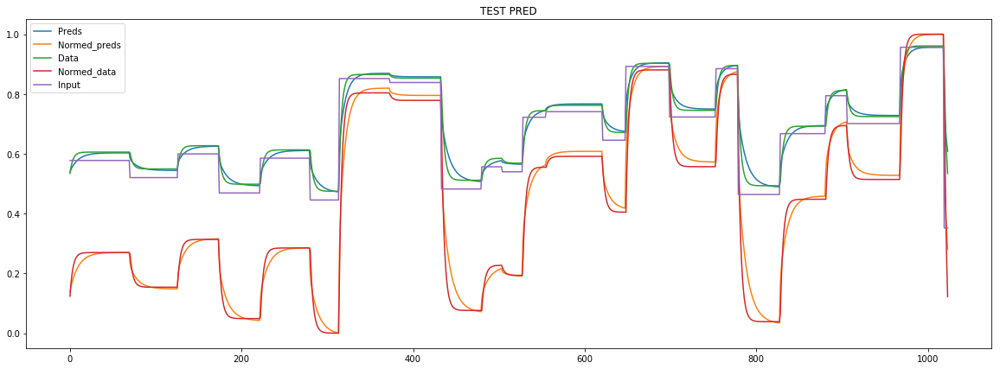

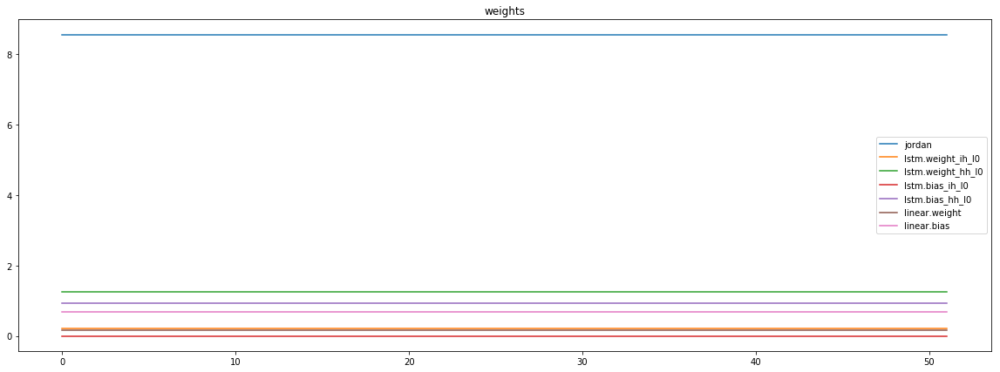

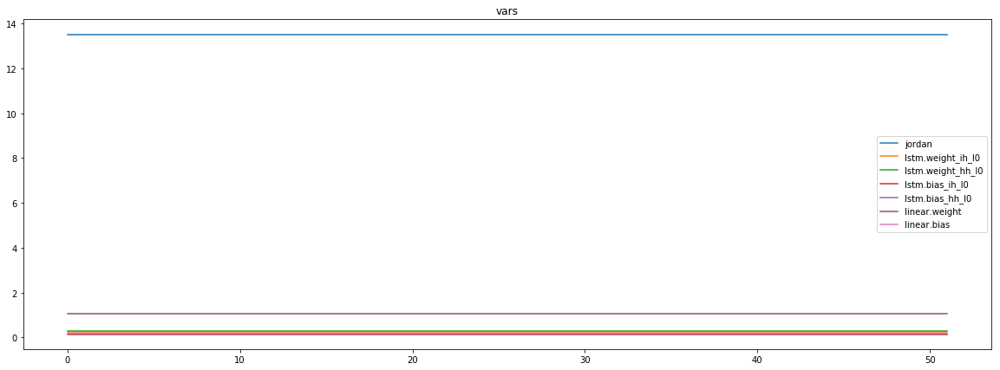

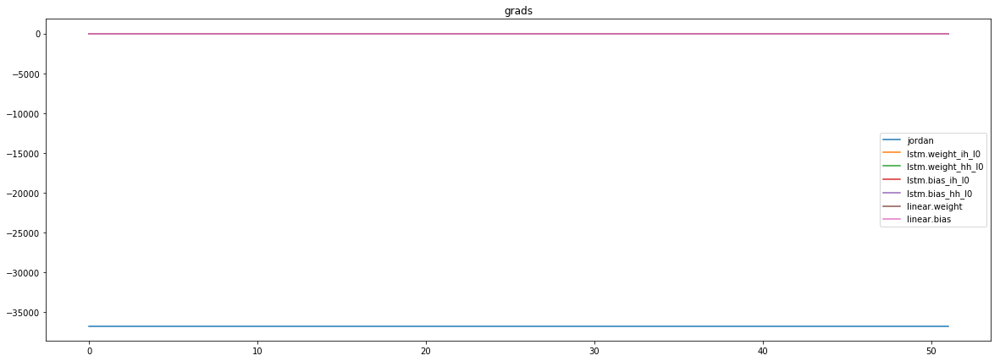

mean_p1 : 3518.224853515625
mean_p2 : -39665.64453125
mean_p3 : -554.4549560546875


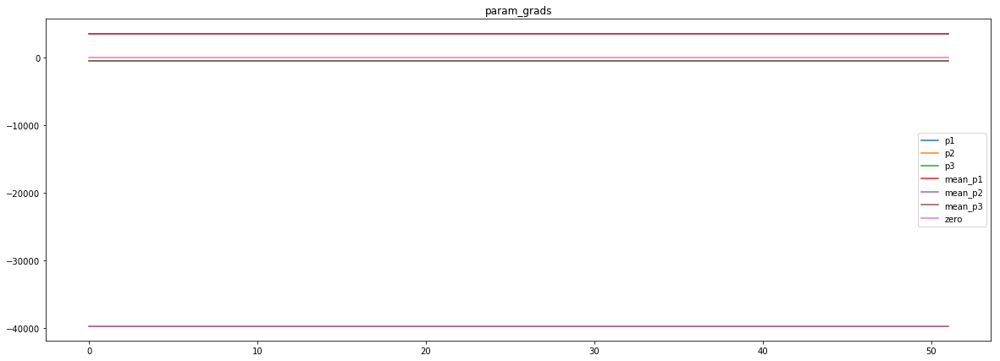

loss rate [0.05584720237630936]
Epoch [28] 
     train_loss[2421.4188443697417] 
     eval_train[12.548978247796185] 
     eval_test[12.658452161032155]



aux preds: 0.4448089301586151           1.0254231691360474           7.3133087158203125
main loss 0.0
aux loss 0.0
jord loss 2379.856668325571
combined loss 2379.856668325571 



Parameter containing:
tensor([[0.4448, 1.0254, 7.3133]], requires_grad=True)


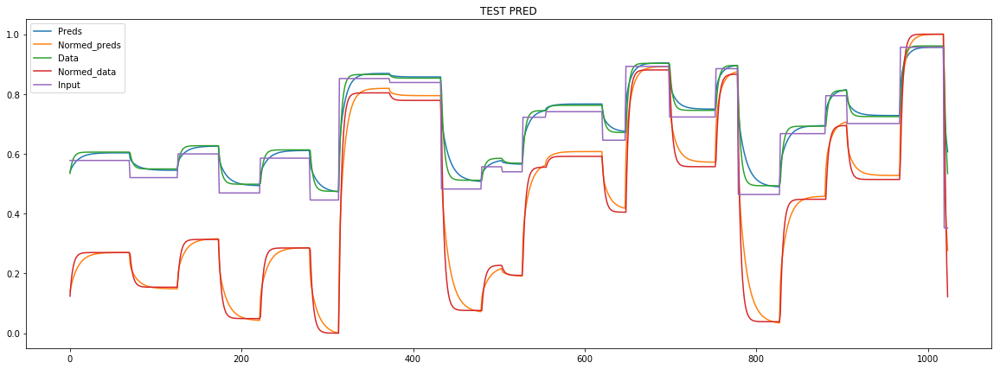

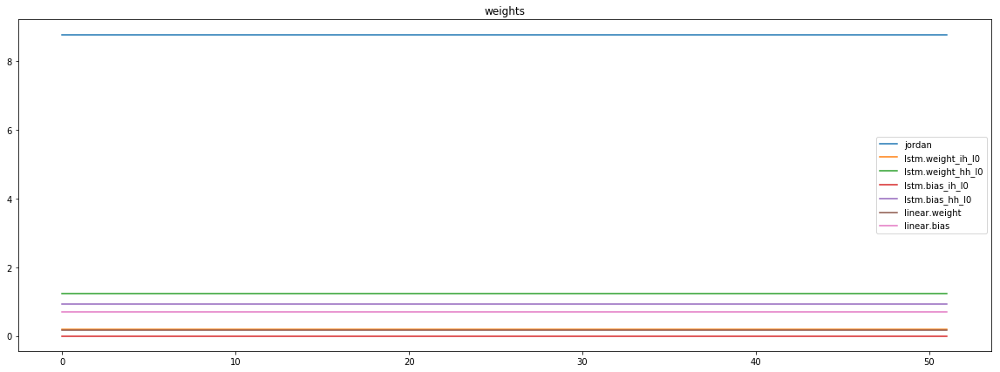

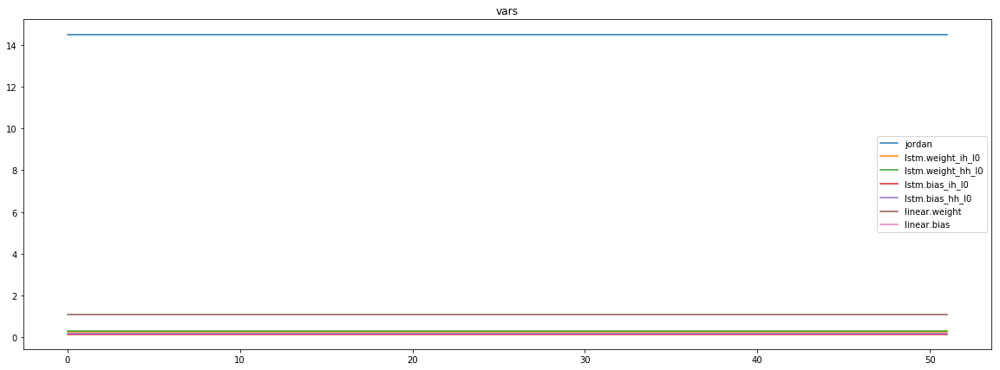

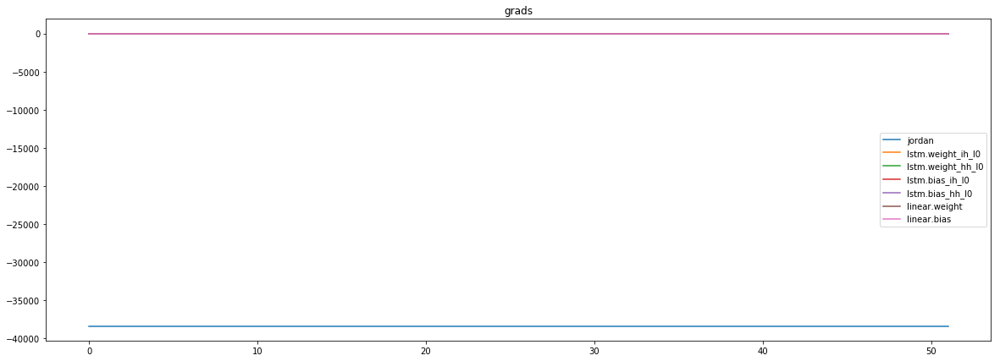

mean_p1 : 7478.888671875
mean_p2 : -45238.03515625
mean_p3 : -603.9072265625


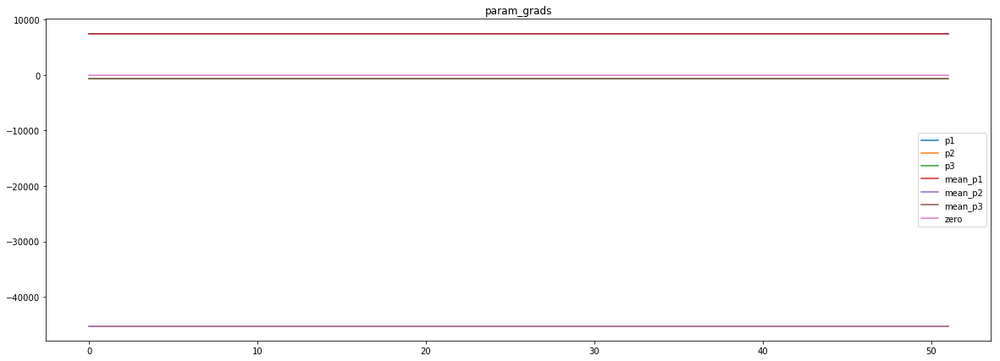

loss rate [0.03951708351817085]
Epoch [29] 
     train_loss[2379.856668325571] 
     eval_train[12.308124430204492] 
     eval_test[12.412439819192514]



aux preds: 0.4447473883628845           1.0232203006744385           7.536807060241699
main loss 0.0
aux loss 0.0
jord loss 2343.607431265024
combined loss 2343.607431265024 



Parameter containing:
tensor([[0.4447, 1.0232, 7.5368]], requires_grad=True)


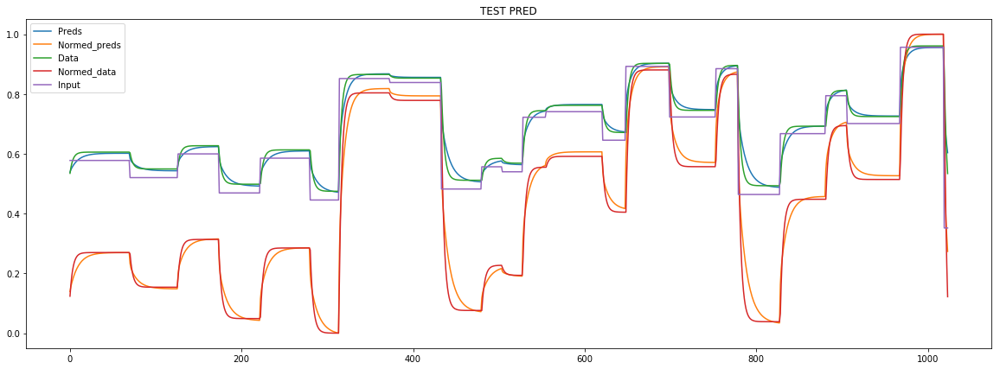

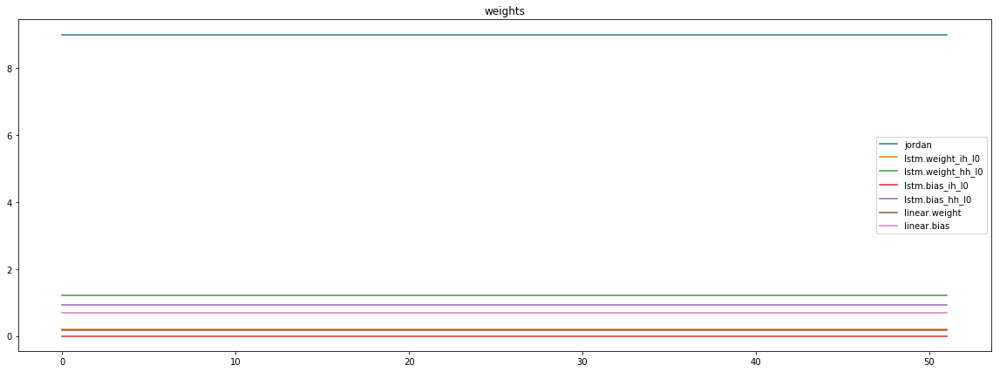

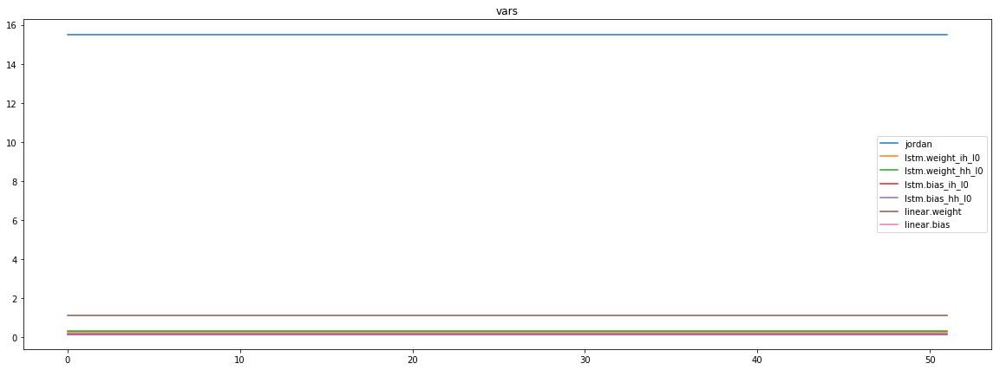

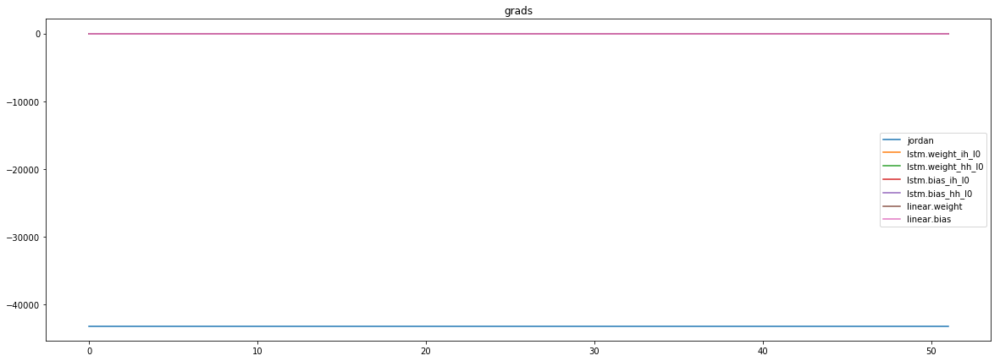

mean_p1 : 9544.7431640625
mean_p2 : -52053.1953125
mean_p3 : -662.1339721679688


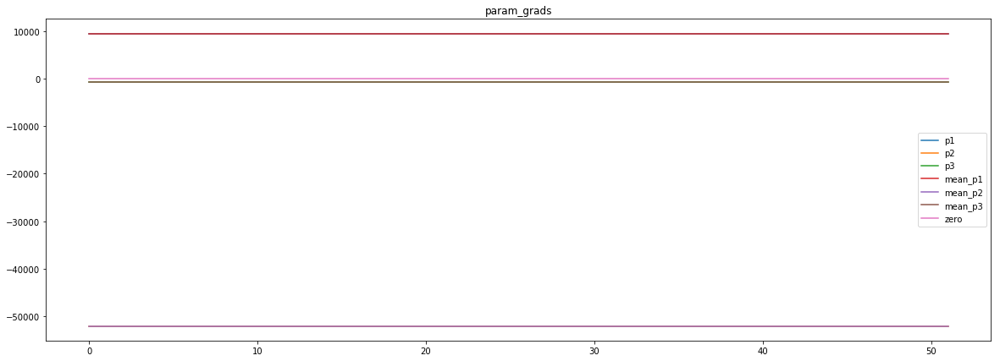

loss rate [0.04313006070844827]
Epoch [30] 
     train_loss[2343.607431265024] 
     eval_train[12.029066297765194] 
     eval_test[12.119218693739226]



aux preds: 0.44367051124572754           1.021605134010315           7.7330002784729
main loss 0.0
aux loss 0.0
jord loss 2324.3731501652646
combined loss 2324.3731501652646 



Parameter containing:
tensor([[0.4437, 1.0216, 7.7330]], requires_grad=True)


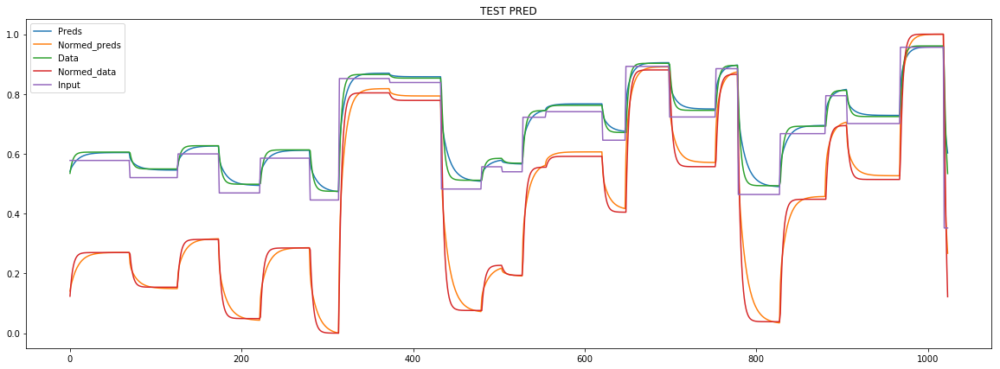

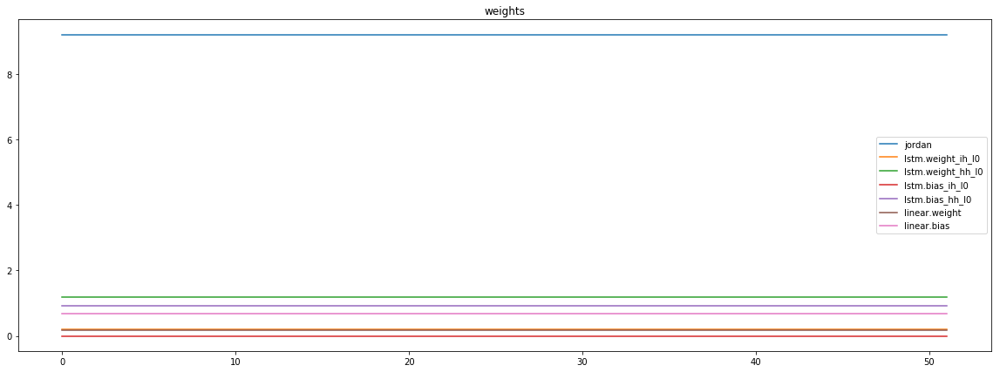

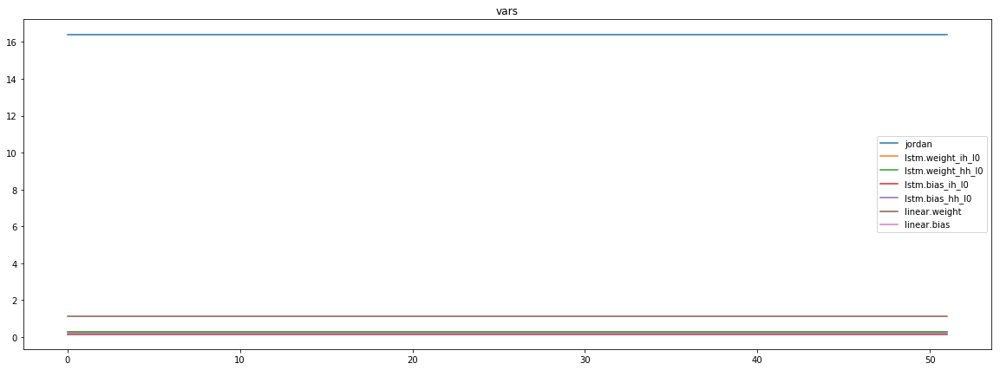

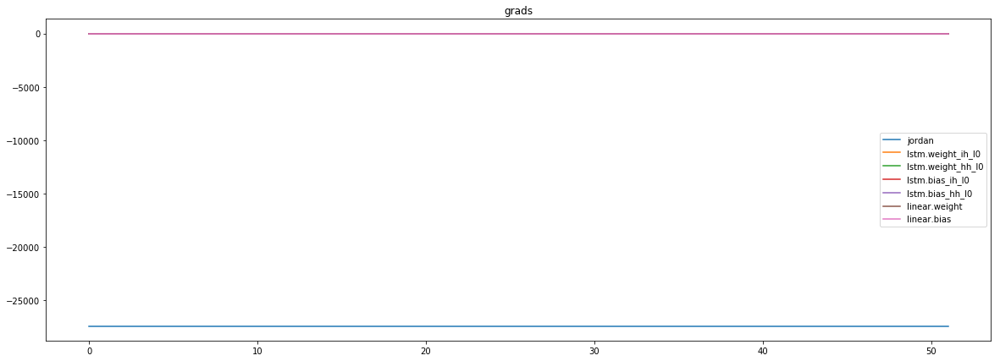

mean_p1 : 2125.7333984375
mean_p2 : -29080.216796875
mean_p3 : -457.2021179199219


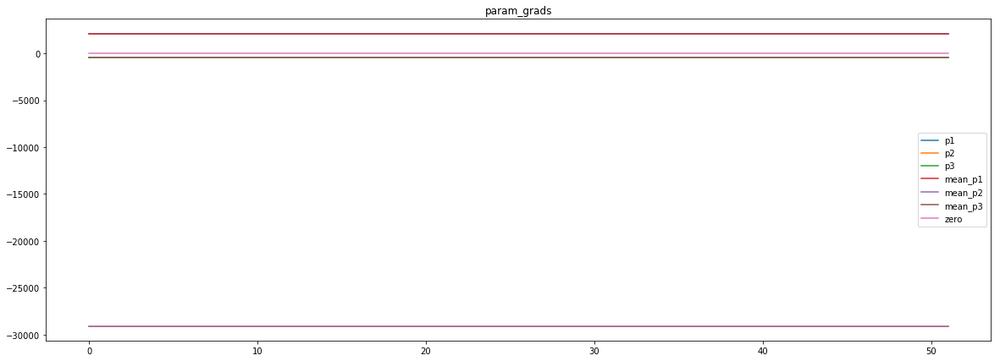

loss rate [0.048415244426164294]
Epoch [31] 
     train_loss[2324.3731501652646] 
     eval_train[11.693429242051653] 
     eval_test[11.796514125149276]



aux preds: 0.44374793767929077           1.0198774337768555           7.94459342956543
main loss 0.0
aux loss 0.0
jord loss 2283.5447974571816
combined loss 2283.5447974571816 



Parameter containing:
tensor([[0.4437, 1.0199, 7.9446]], requires_grad=True)


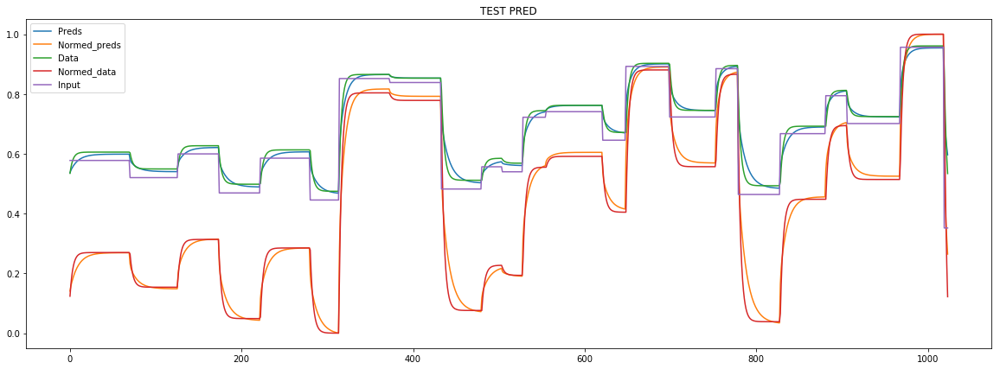

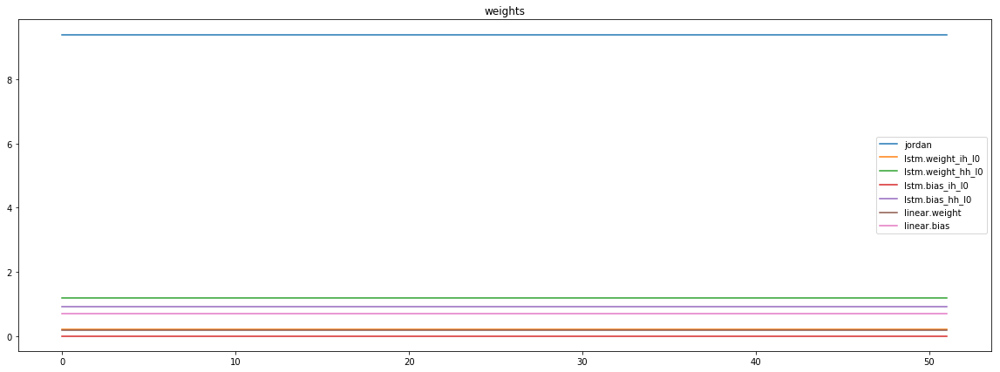

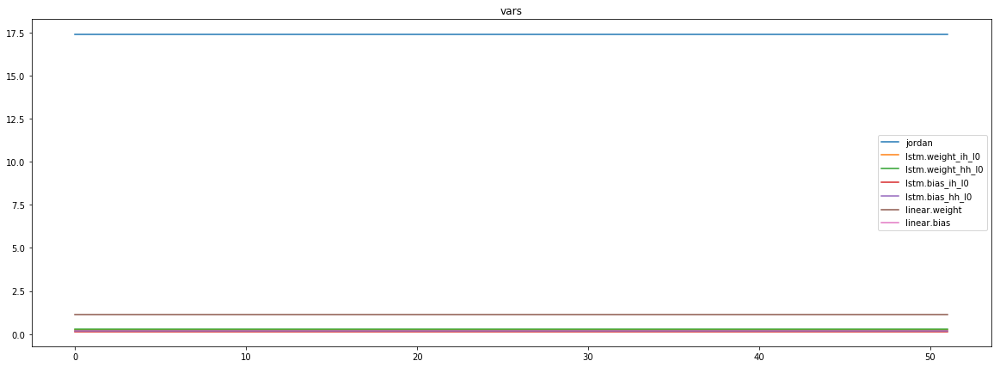

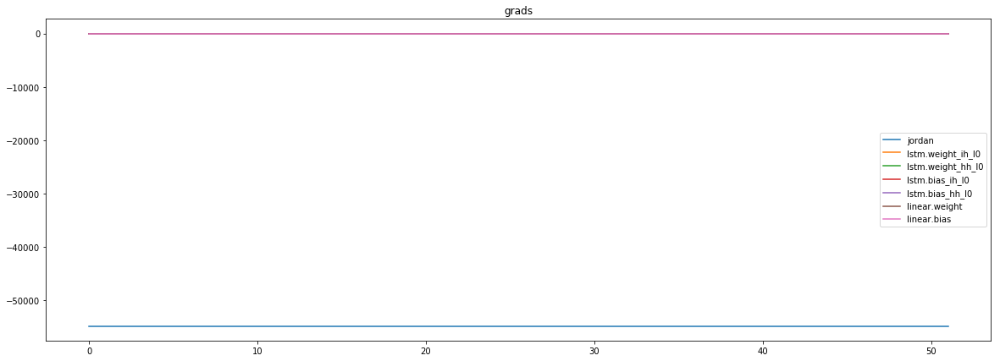

mean_p1 : 1272.5400390625
mean_p2 : -55476.3046875
mean_p3 : -691.0313720703125


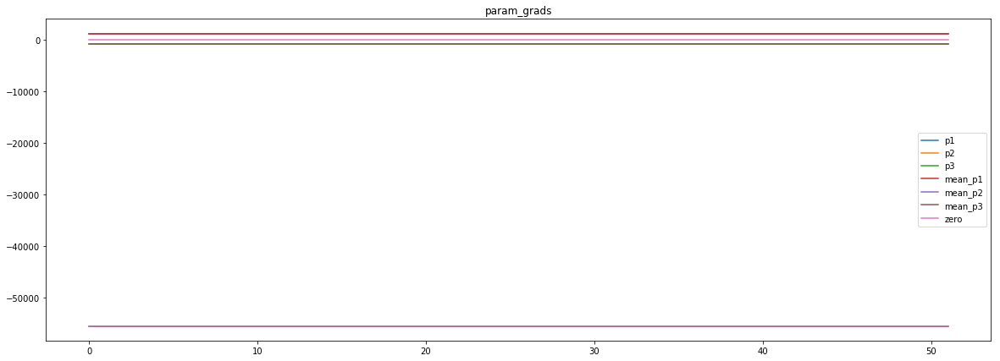

loss rate [0.010587582629197123]
Epoch [32] 
     train_loss[2283.5447974571816] 
     eval_train[11.978510343015213] 
     eval_test[11.981181702835865]



aux preds: 0.4444434642791748           1.0186386108398438           8.13221549987793
main loss 0.0
aux loss 0.0
jord loss 2256.5909963754507
combined loss 2256.5909963754507 



Parameter containing:
tensor([[0.4444, 1.0186, 8.1322]], requires_grad=True)


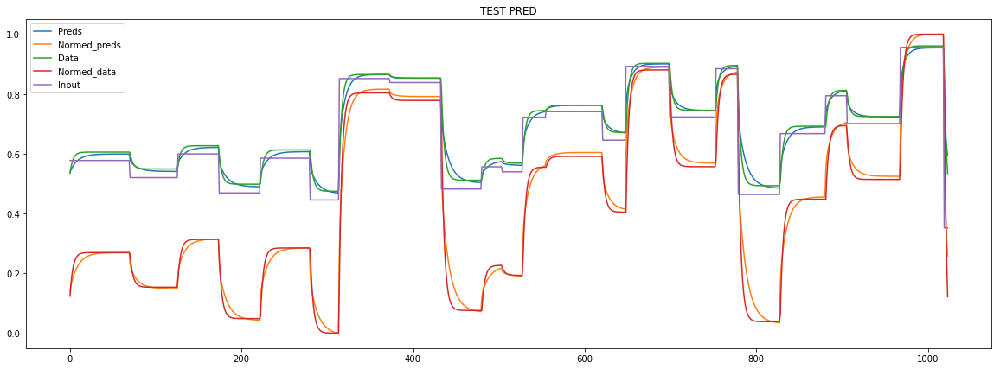

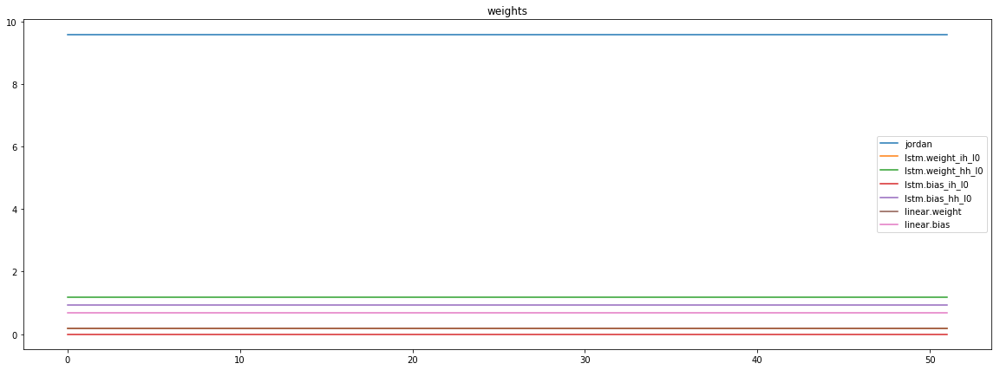

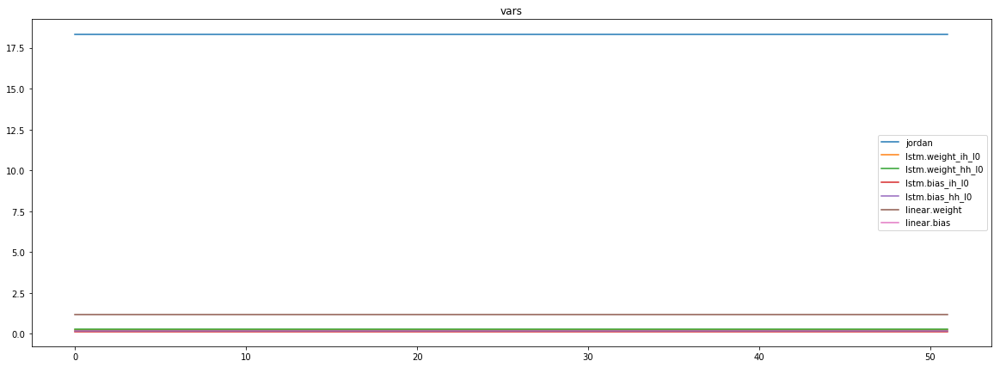

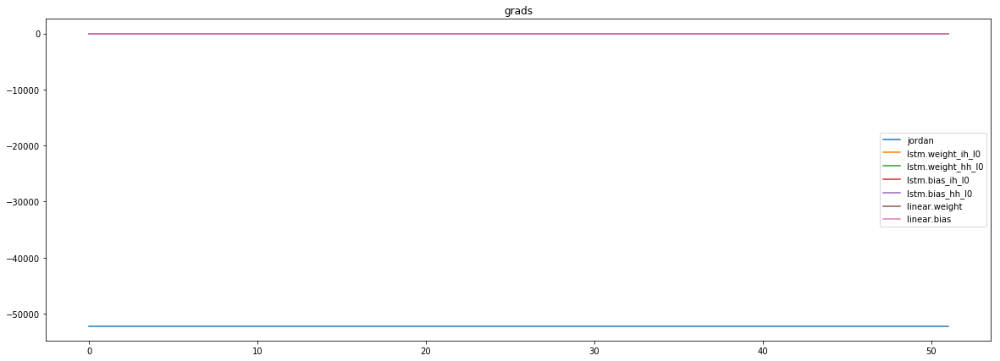

mean_p1 : -5305.1044921875
mean_p2 : -46288.7265625
mean_p3 : -605.0531616210938


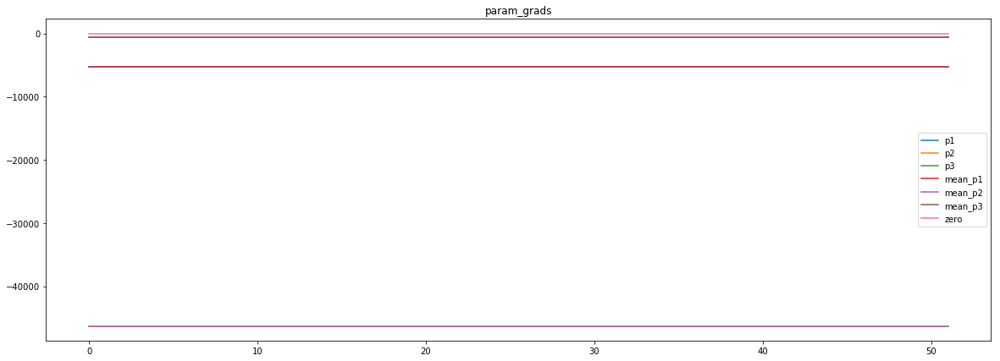

loss rate [0.041022853908917356]
Epoch [33] 
     train_loss[2256.5909963754507] 
     eval_train[11.46898267816197] 
     eval_test[11.474773547172926]



aux preds: 0.4456104636192322           1.0164543390274048           8.314495086669922
main loss 0.0
aux loss 0.0
jord loss 2234.0662231445312
combined loss 2234.0662231445312 



Parameter containing:
tensor([[0.4456, 1.0165, 8.3145]], requires_grad=True)


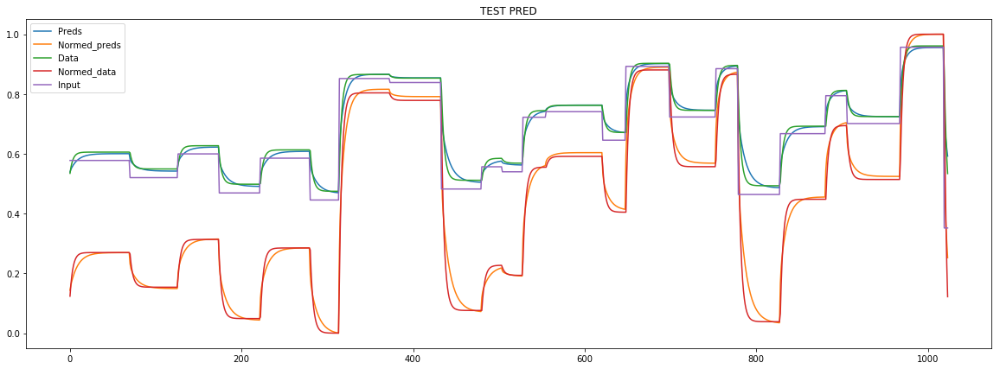

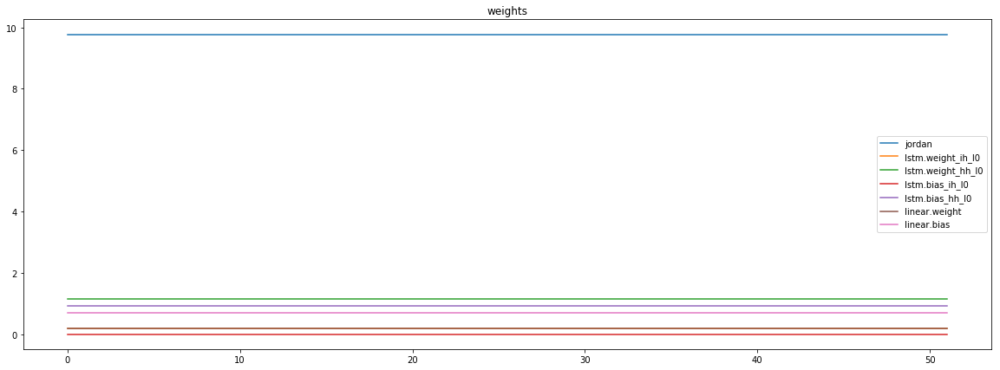

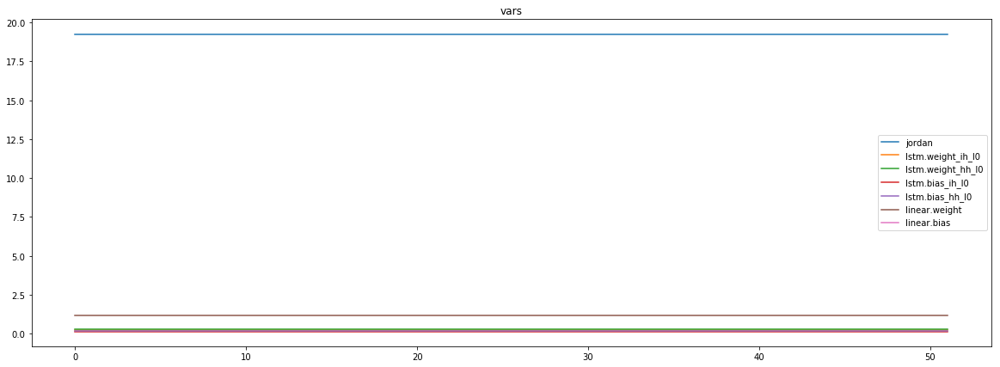

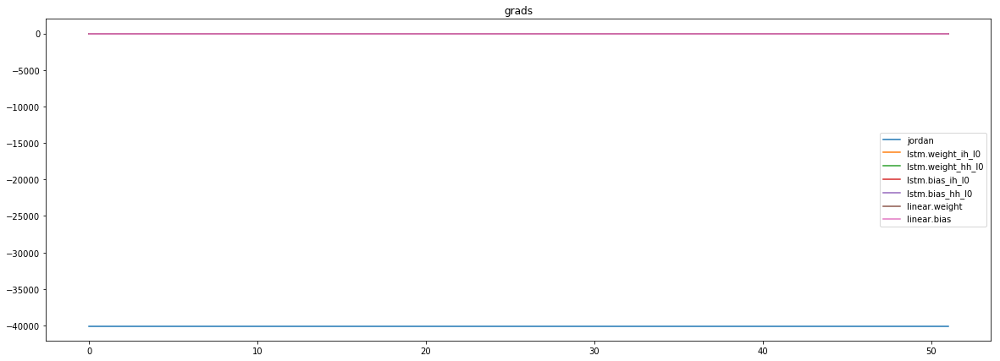

mean_p1 : 16040.9814453125
mean_p2 : -55414.734375
mean_p3 : -683.00927734375


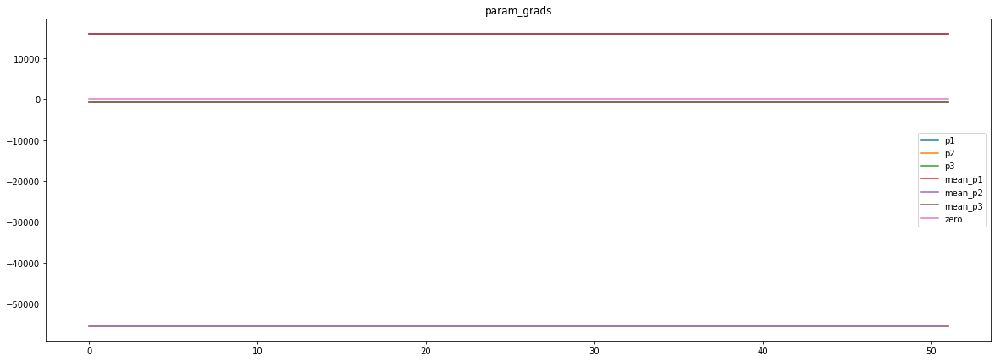

loss rate [0.07989012642599758]
Epoch [34] 
     train_loss[2234.0662231445312] 
     eval_train[10.791225489553584] 
     eval_test[10.812048379982695]



aux preds: 0.44765469431877136           1.0132458209991455           8.496371269226074
main loss 0.0
aux loss 0.0
jord loss 2187.8685936560996
combined loss 2187.8685936560996 



Parameter containing:
tensor([[0.4477, 1.0132, 8.4964]], requires_grad=True)


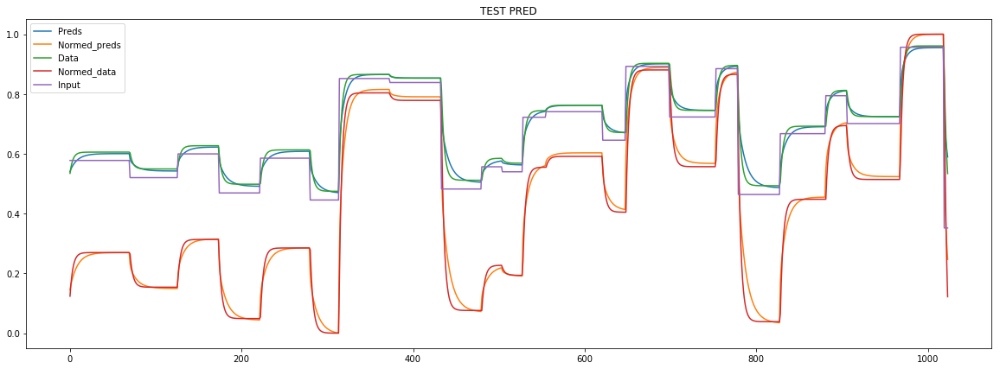

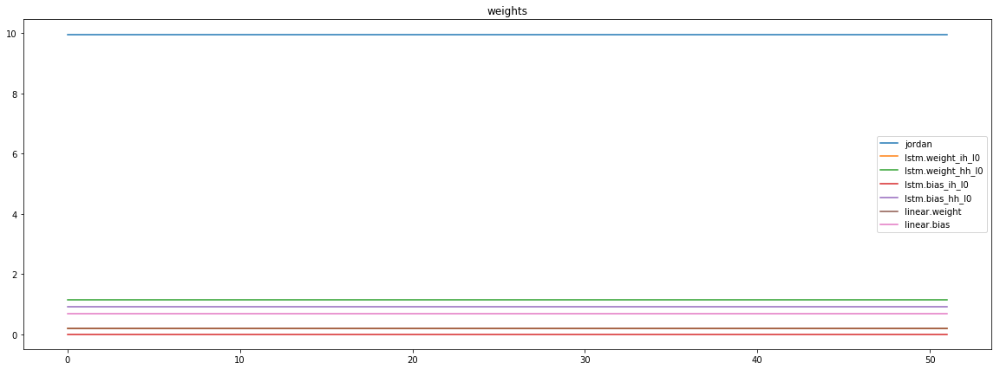

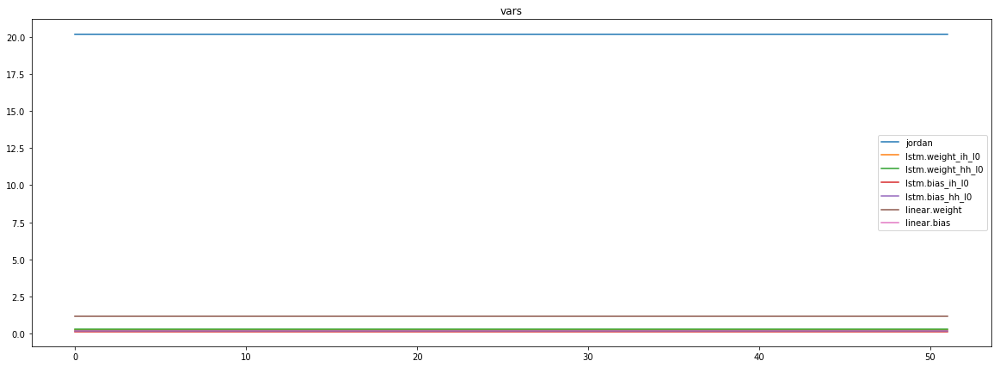

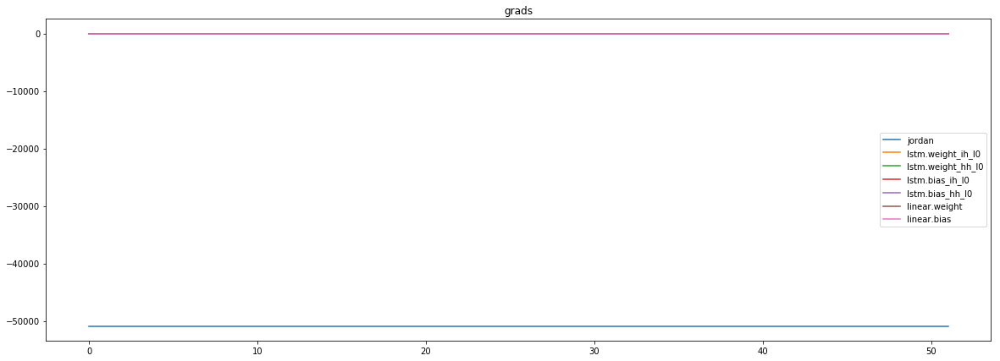

mean_p1 : -29028.892578125
mean_p2 : -21509.609375
mean_p3 : -334.6274108886719


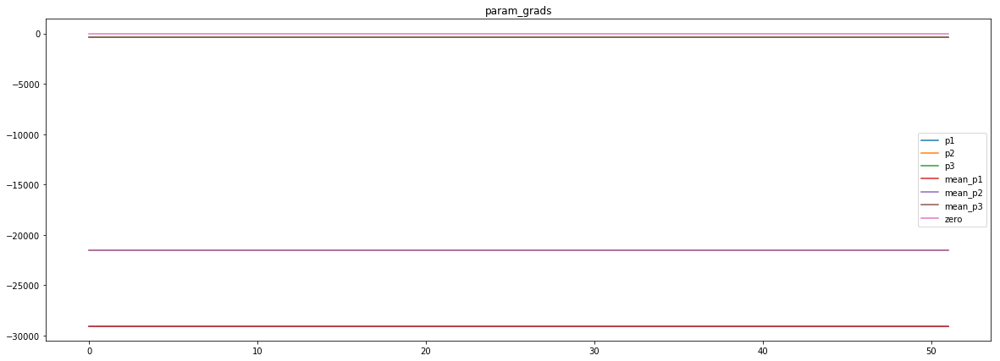

loss rate [0.07721707346144757]
Epoch [35] 
     train_loss[2187.8685936560996] 
     eval_train[10.528883009645282] 
     eval_test[10.54064289210576]



aux preds: 0.44998350739479065           1.0125869512557983           8.687755584716797
main loss 0.0
aux loss 0.0
jord loss 2165.6297560471753
combined loss 2165.6297560471753 



Parameter containing:
tensor([[0.4500, 1.0126, 8.6878]], requires_grad=True)


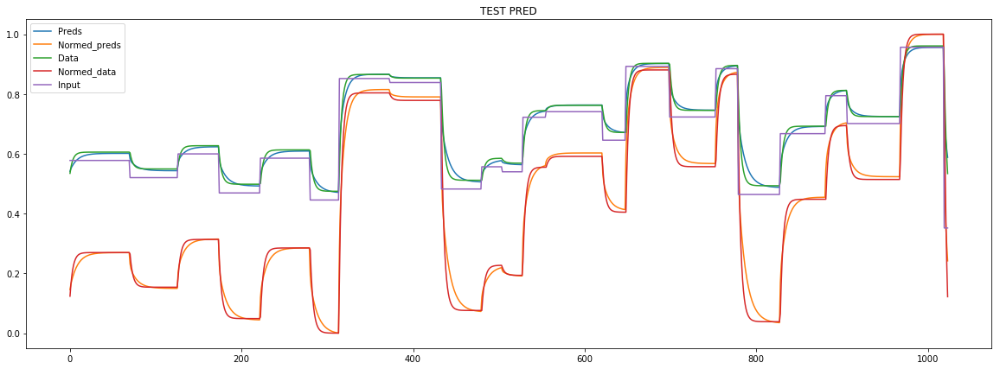

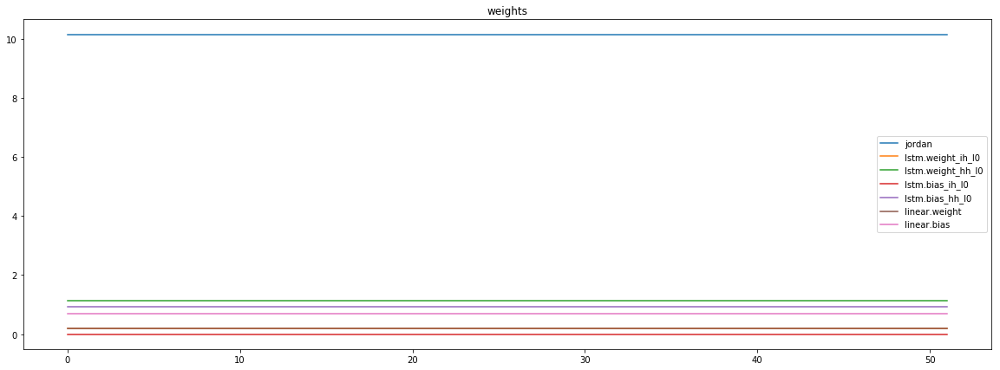

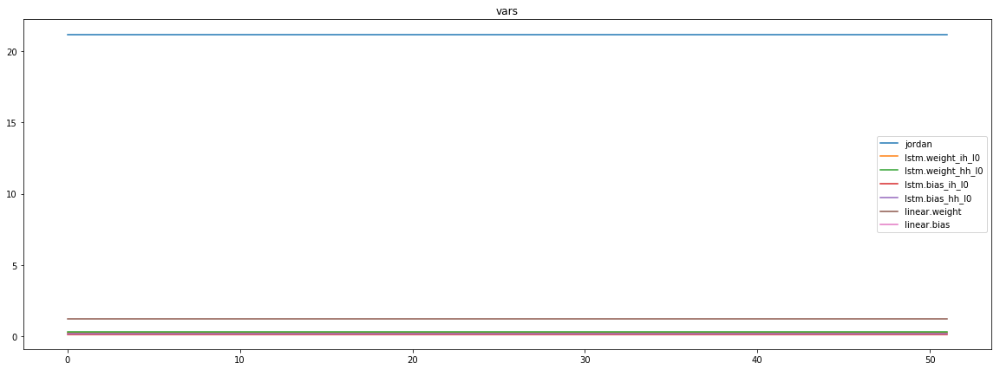

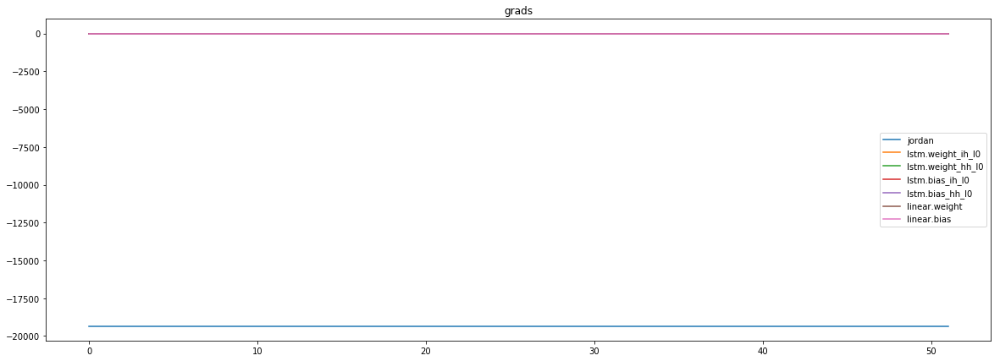

mean_p1 : -22145.765625
mean_p2 : 2930.65771484375
mean_p3 : -116.43391418457031


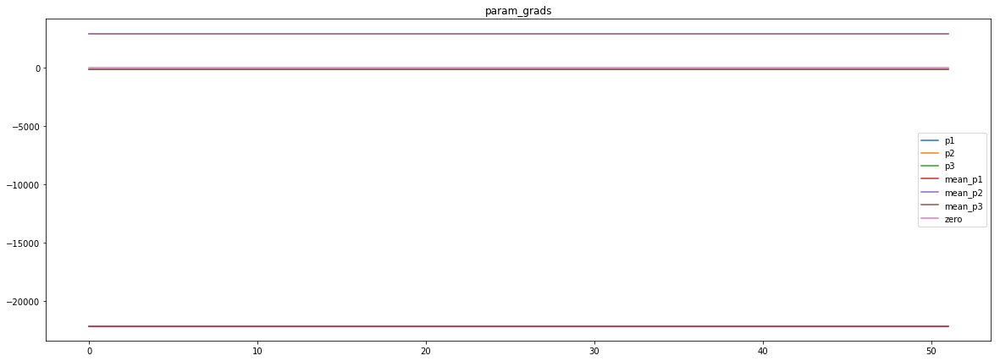

loss rate [0.08392661457830275]
Epoch [36] 
     train_loss[2165.6297560471753] 
     eval_train[10.001690236423972] 
     eval_test[10.024122277264146]



aux preds: 0.4460863173007965           1.0127769708633423           8.838716506958008
main loss 0.0
aux loss 0.0
jord loss 2162.8702627328726
combined loss 2162.8702627328726 



Parameter containing:
tensor([[0.4461, 1.0128, 8.8387]], requires_grad=True)


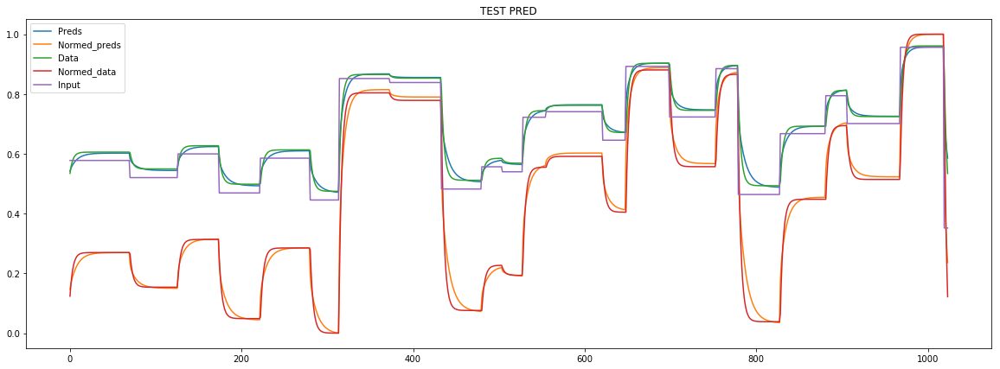

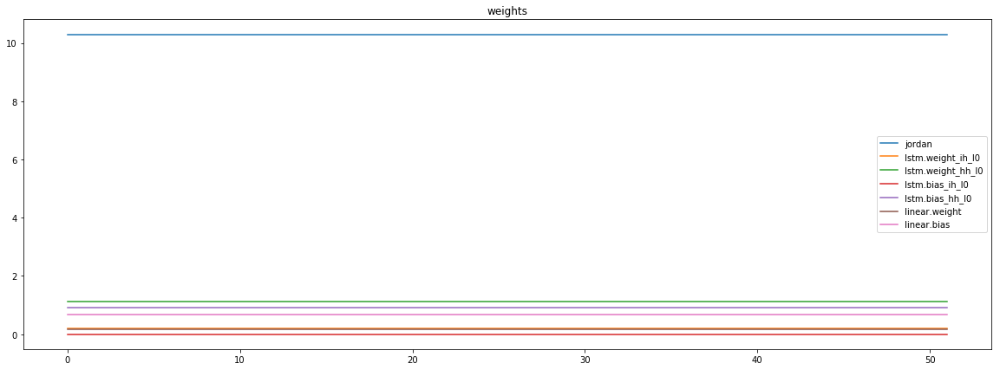

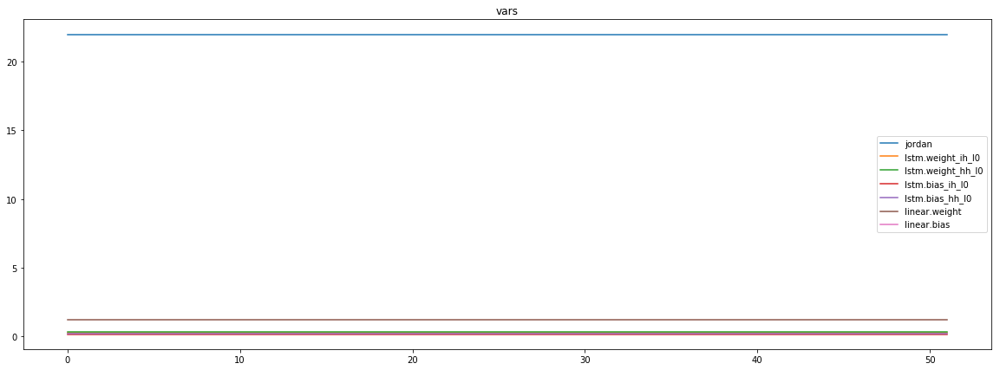

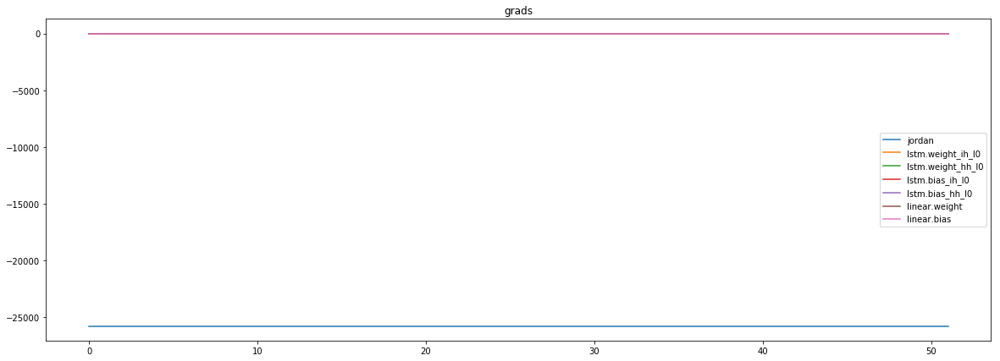

mean_p1 : -27152.927734375
mean_p2 : 1516.9222412109375
mean_p3 : -115.3194808959961


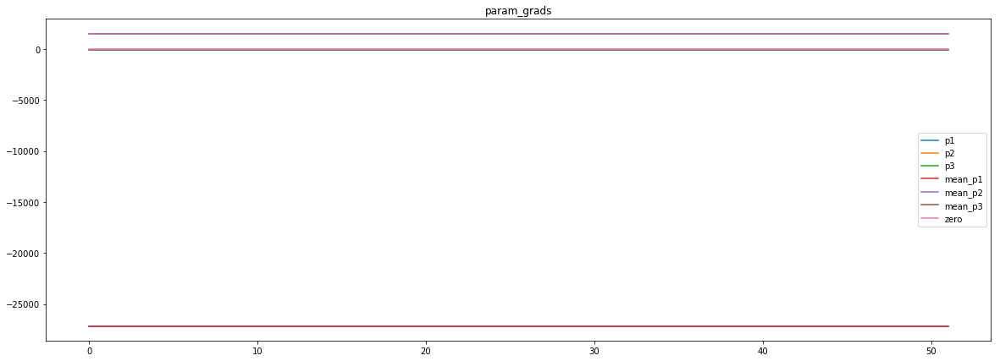

loss rate [0.09011790166303102]
Epoch [37] 
     train_loss[2162.8702627328726] 
     eval_train[9.482734167442407] 
     eval_test[9.516400317137595]



aux preds: 0.44592583179473877           1.0104848146438599           8.97476863861084
main loss 0.0
aux loss 0.0
jord loss 2132.1288170447715
combined loss 2132.1288170447715 



Parameter containing:
tensor([[0.4459, 1.0105, 8.9748]], requires_grad=True)


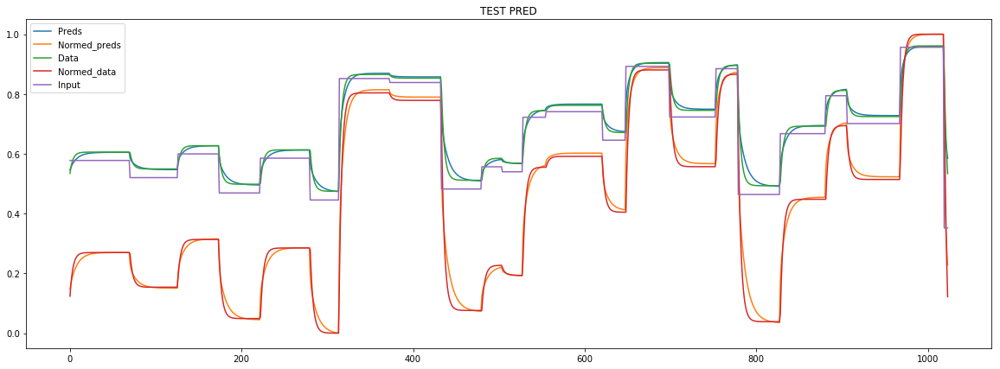

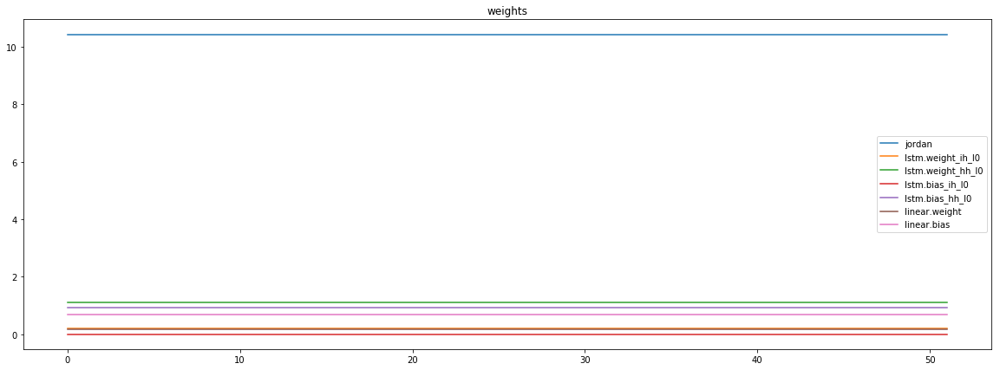

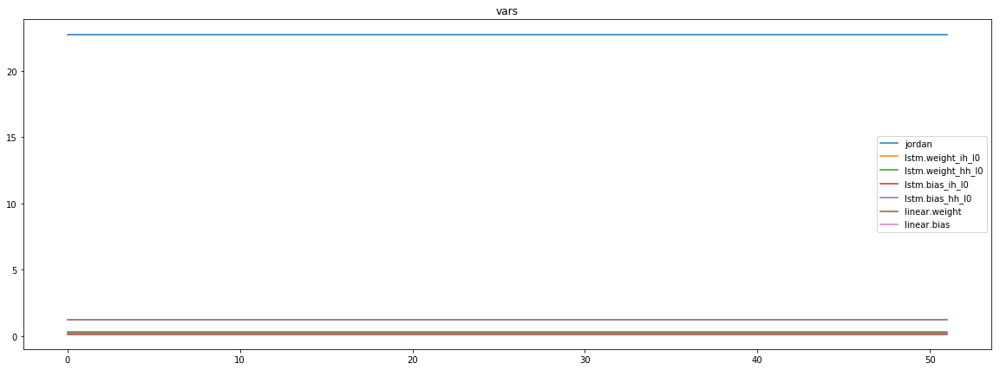

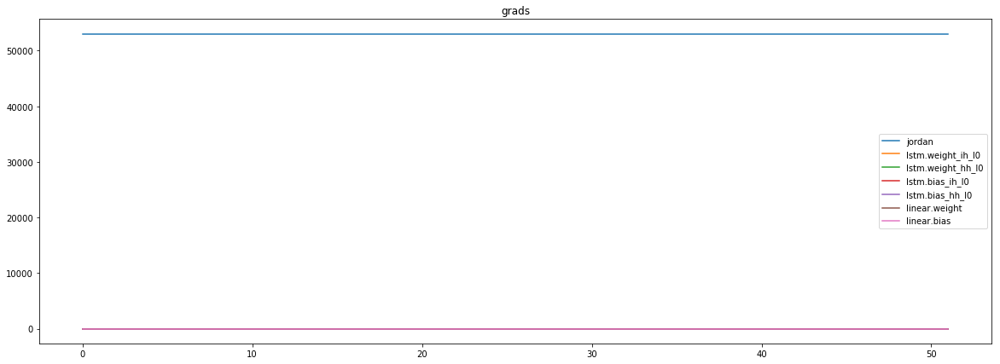

mean_p1 : -23396.716796875
mean_p2 : 75760.59375
mean_p3 : 671.7150268554688


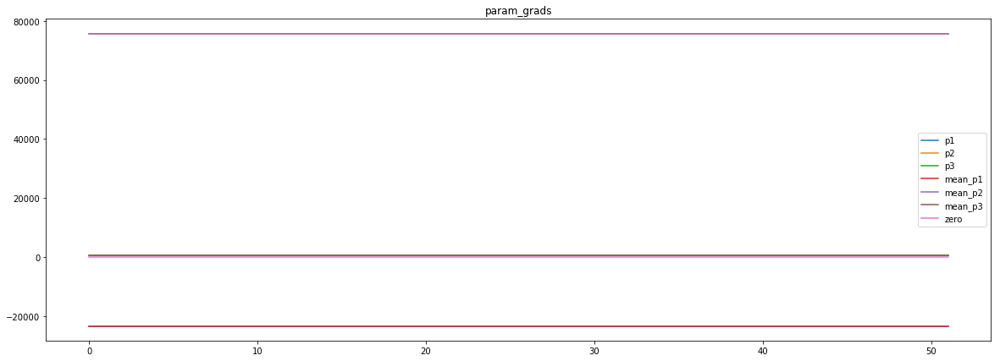

loss rate [0.0707241334393991]
Epoch [38] 
     train_loss[2132.1288170447715] 
     eval_train[9.266302150380886] 
     eval_test[9.3179003748757]



aux preds: 0.44574040174484253           1.0084739923477173           9.104310989379883
main loss 0.0
aux loss 0.0
jord loss 2110.5194068321816
combined loss 2110.5194068321816 



Parameter containing:
tensor([[0.4457, 1.0085, 9.1043]], requires_grad=True)


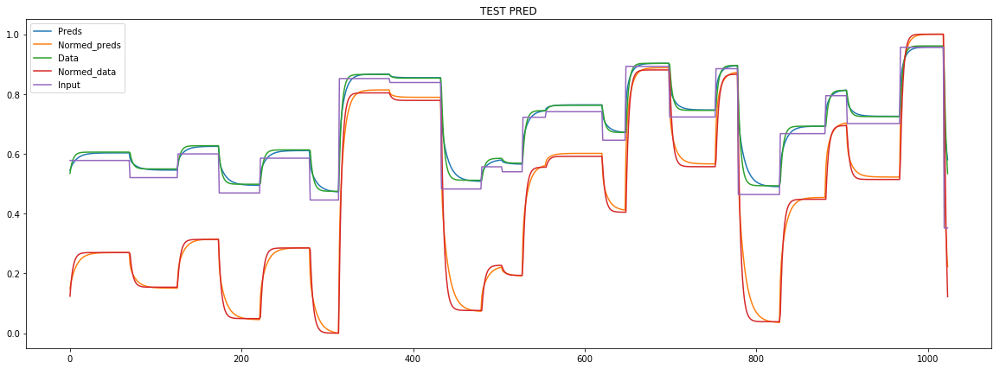

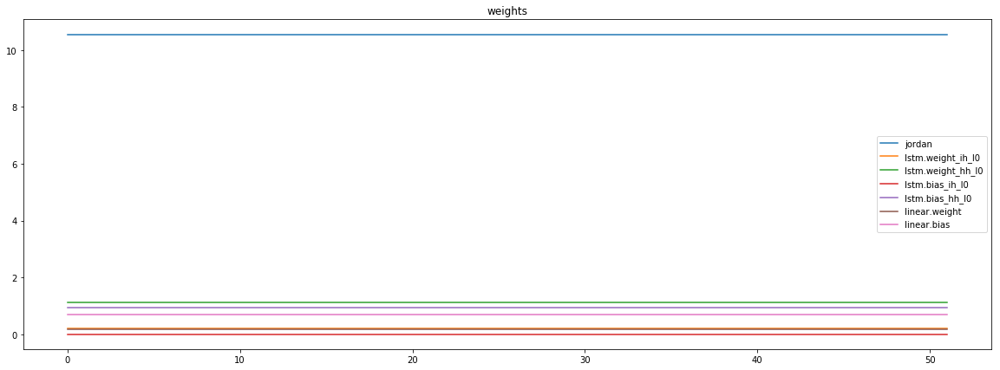

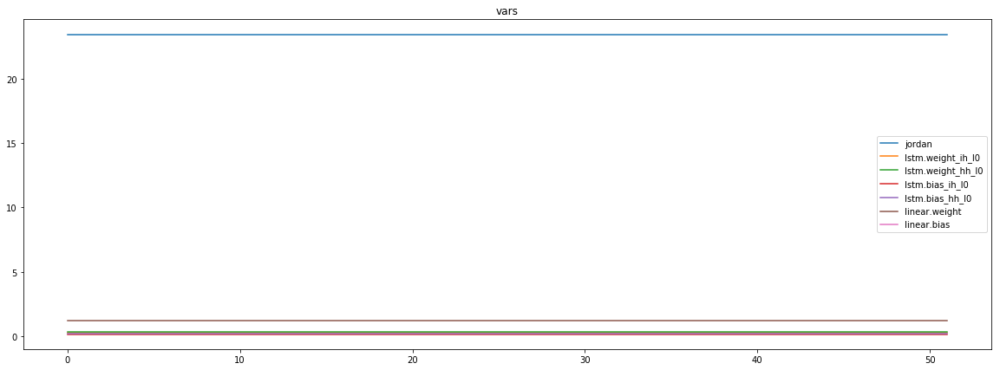

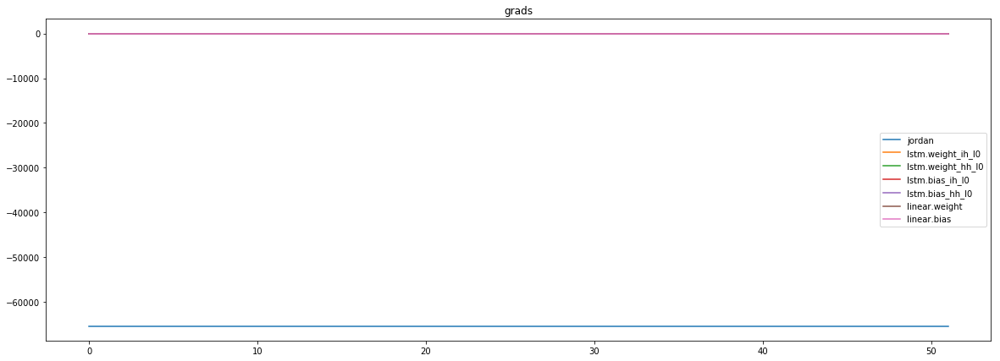

mean_p1 : 1910.492431640625
mean_p2 : -66520.3828125
mean_p3 : -748.3114624023438


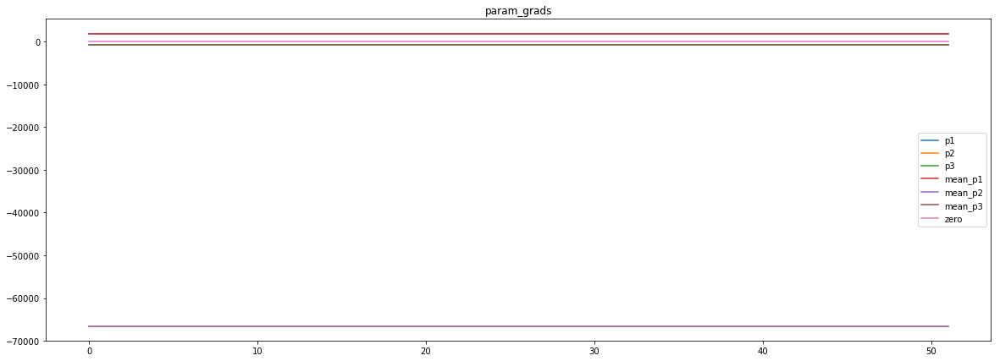

loss rate [0.08789911244361892]
Epoch [39] 
     train_loss[2110.5194068321816] 
     eval_train[8.74531471065935] 
     eval_test[8.77393106791847]



aux preds: 0.4460846483707428           1.009013056755066           9.22646427154541
main loss 0.0
aux loss 0.0
jord loss 2107.5235642653247
combined loss 2107.5235642653247 



Parameter containing:
tensor([[0.4461, 1.0090, 9.2265]], requires_grad=True)


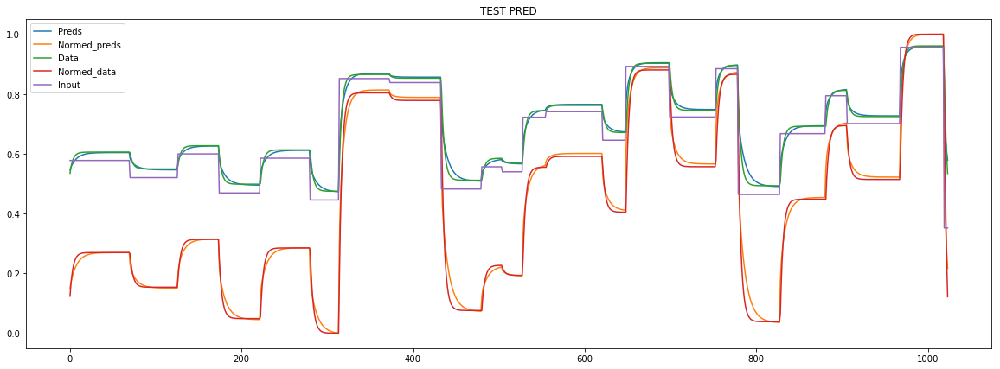

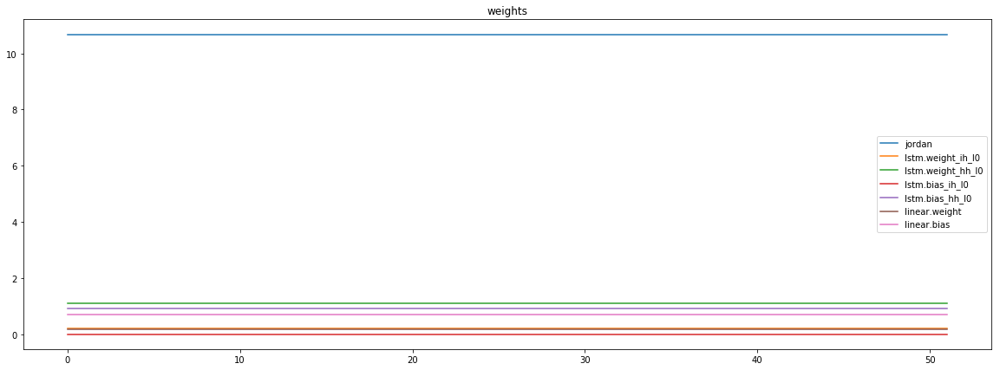

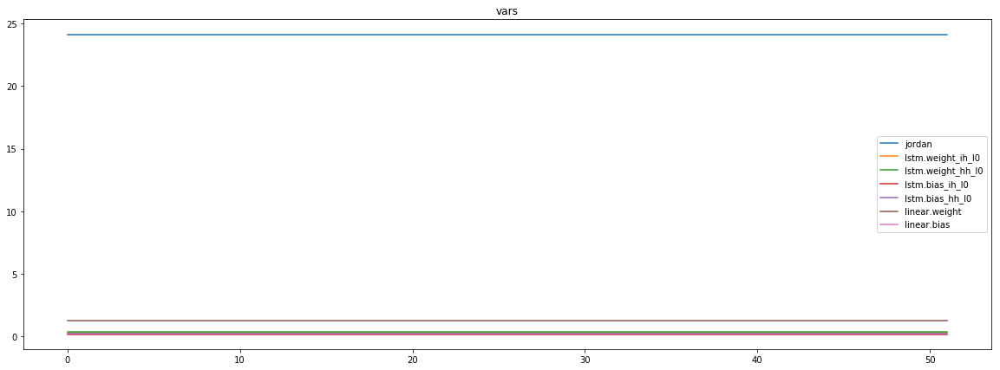

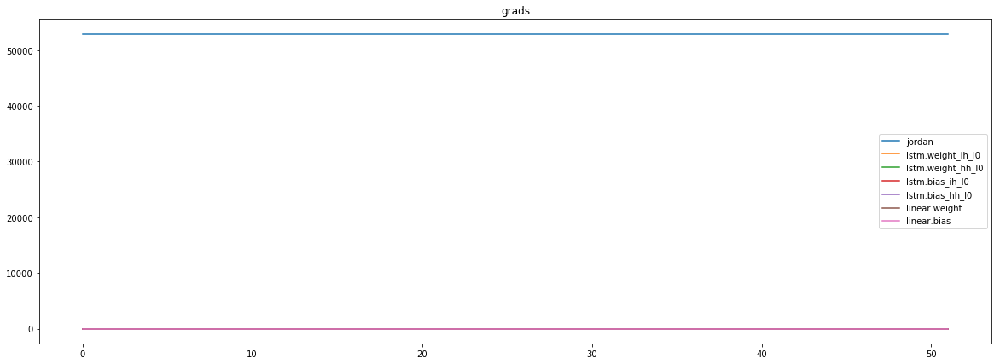

mean_p1 : -21803.556640625
mean_p2 : 74092.828125
mean_p3 : 650.0159912109375


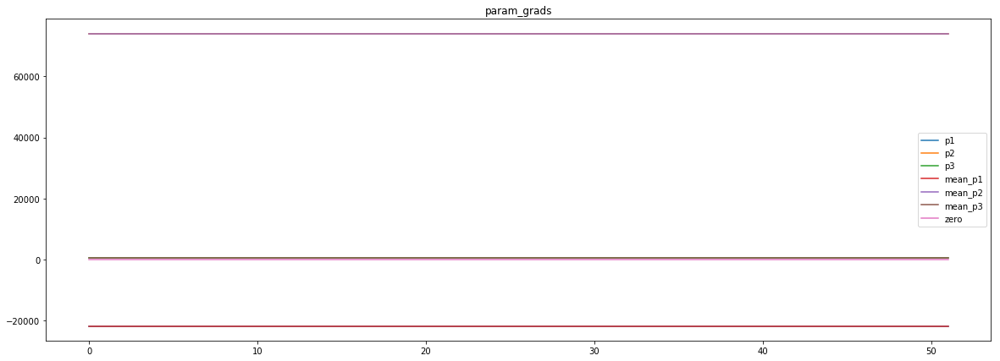

loss rate [0.0732493847252147]
Epoch [40] 
     train_loss[2107.5235642653247] 
     eval_train[8.488432241988797] 
     eval_test[8.528648590055209]



aux preds: 0.4489934742450714           1.0062693357467651           9.333460807800293
main loss 0.0
aux loss 0.0
jord loss 2069.806650015024
combined loss 2069.806650015024 



Parameter containing:
tensor([[0.4490, 1.0063, 9.3335]], requires_grad=True)


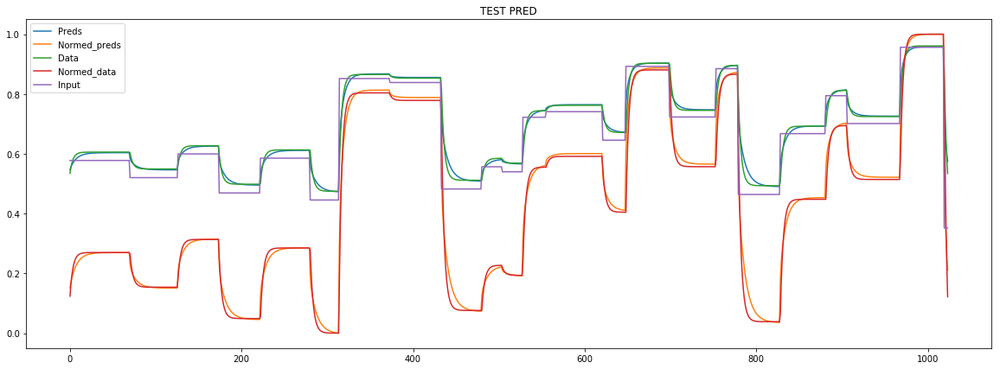

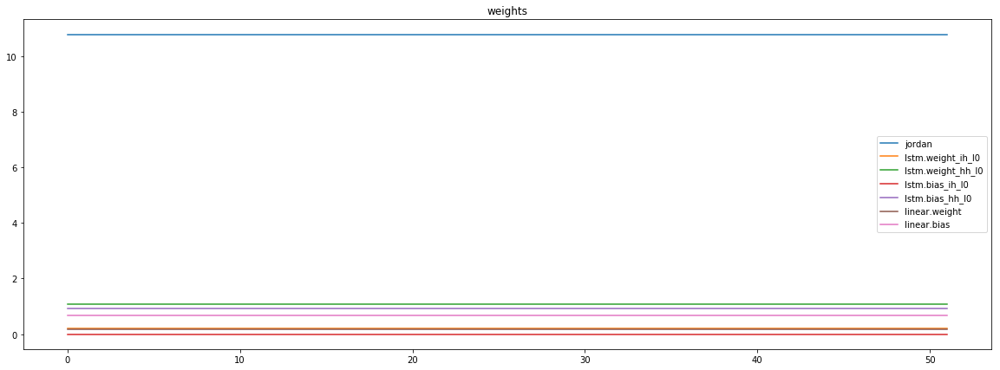

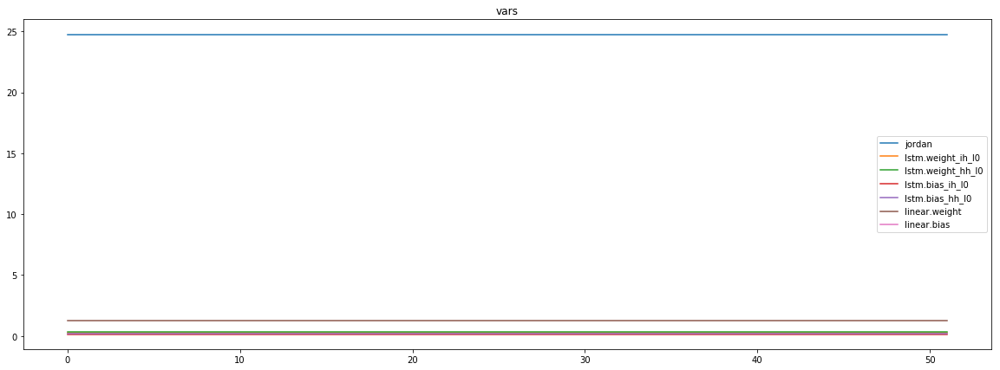

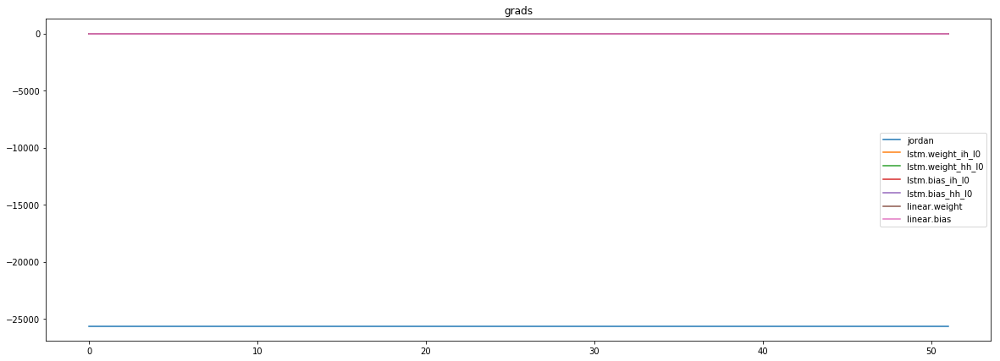

mean_p1 : -28447.693359375
mean_p2 : 2915.616455078125
mean_p3 : -95.45842742919922


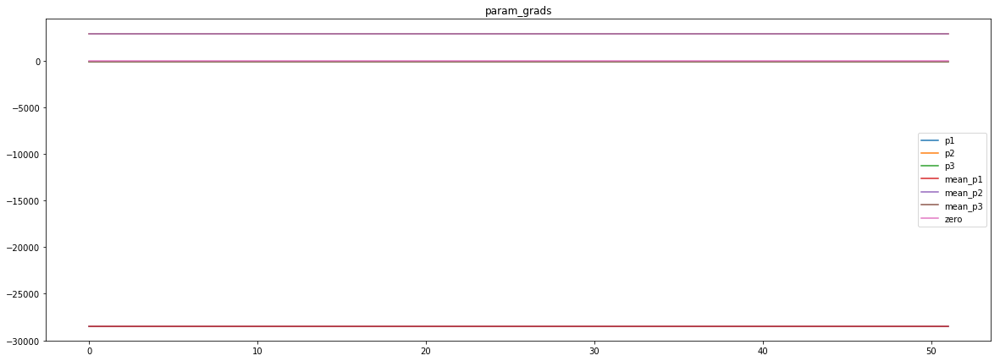

loss rate [0.08258296616377836]
Epoch [41] 
     train_loss[2069.806650015024] 
     eval_train[8.118548109878946] 
     eval_test[8.14069394367768]



aux preds: 0.4448440968990326           1.0072554349899292           9.423974990844727
main loss 0.0
aux loss 0.0
jord loss 2082.476625882662
combined loss 2082.476625882662 



Parameter containing:
tensor([[0.4448, 1.0073, 9.4240]], requires_grad=True)


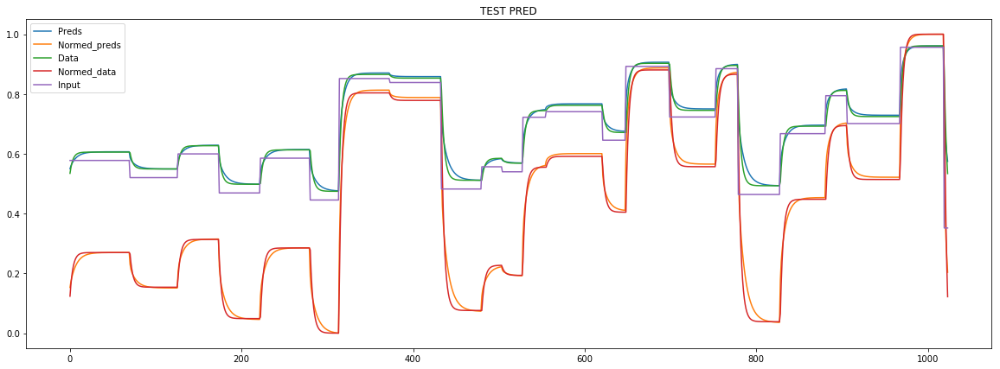

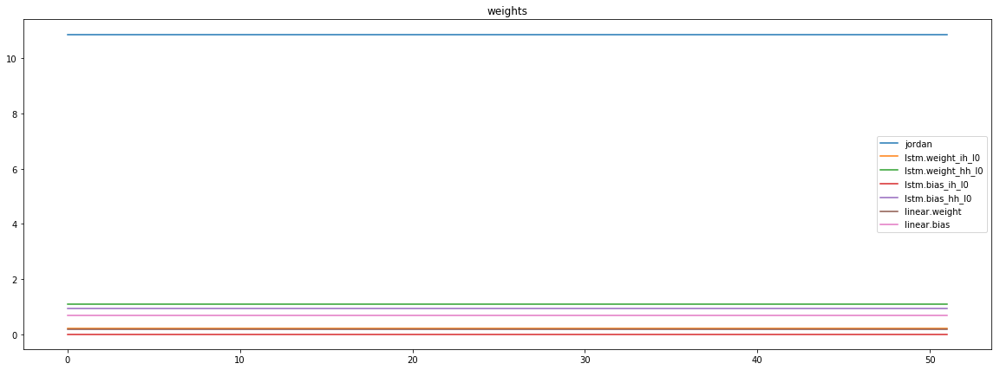

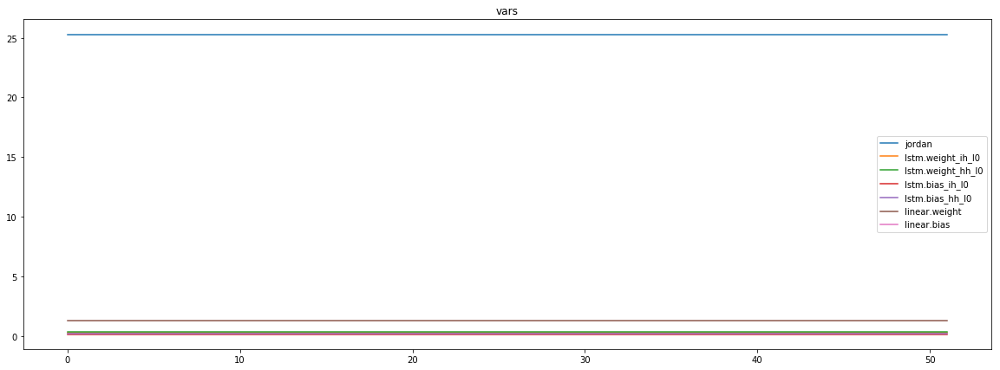

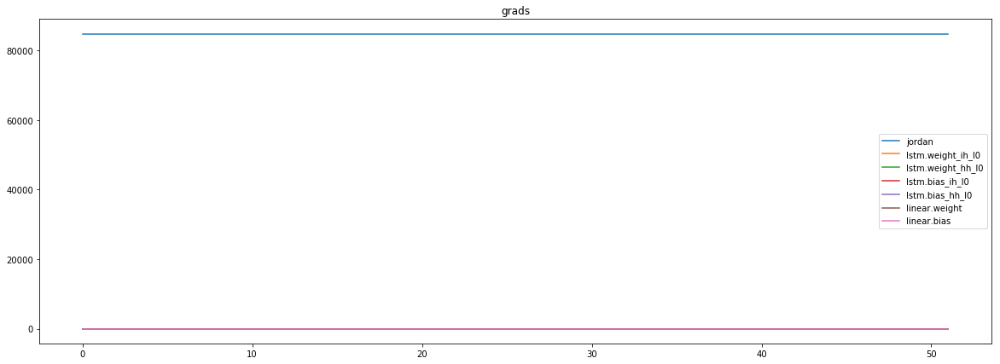

mean_p1 : -19731.708984375
mean_p2 : 103555.484375
mean_p3 : 1015.7664184570312


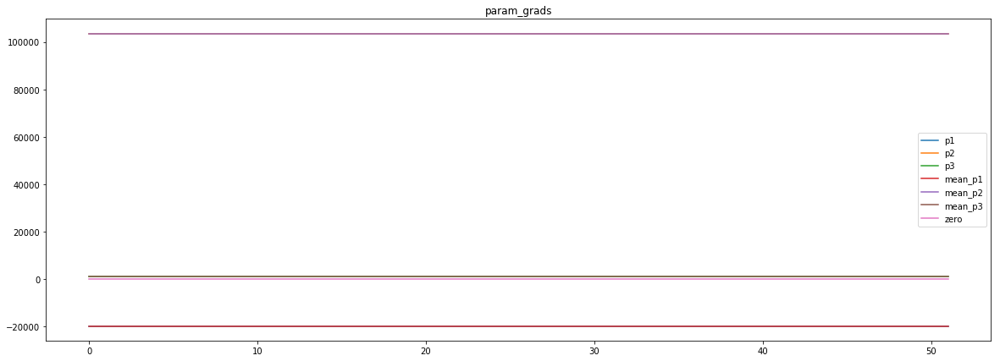

loss rate [-0.027725950840861602]
Epoch [42] 
     train_loss[2082.476625882662] 
     eval_train[8.705112195508823] 
     eval_test[8.716237518253779]



aux preds: 0.44865790009498596           1.0050231218338013           9.48631763458252
main loss 0.0
aux loss 0.0
jord loss 2071.7116088867188
combined loss 2071.7116088867188 



Parameter containing:
tensor([[0.4487, 1.0050, 9.4863]], requires_grad=True)


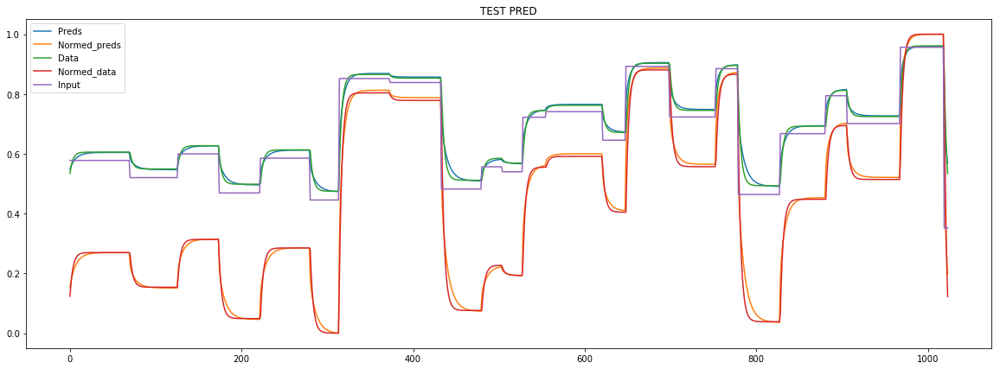

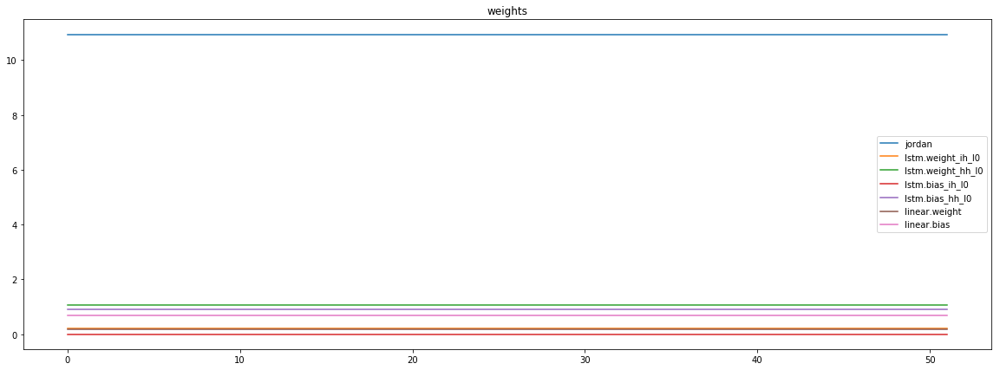

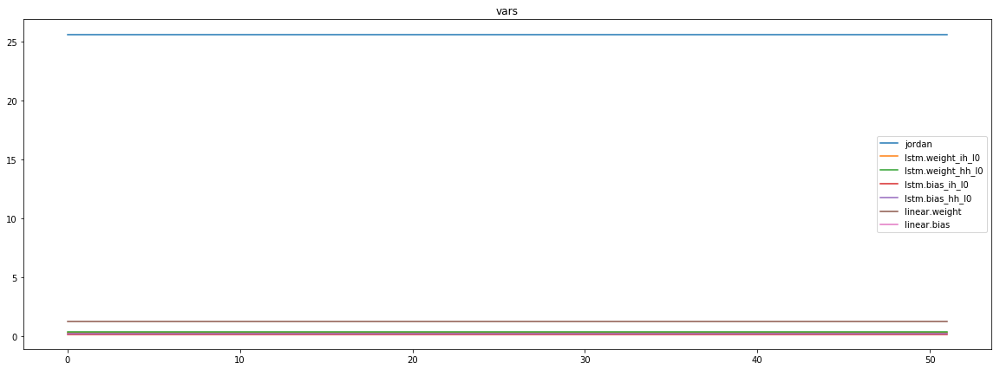

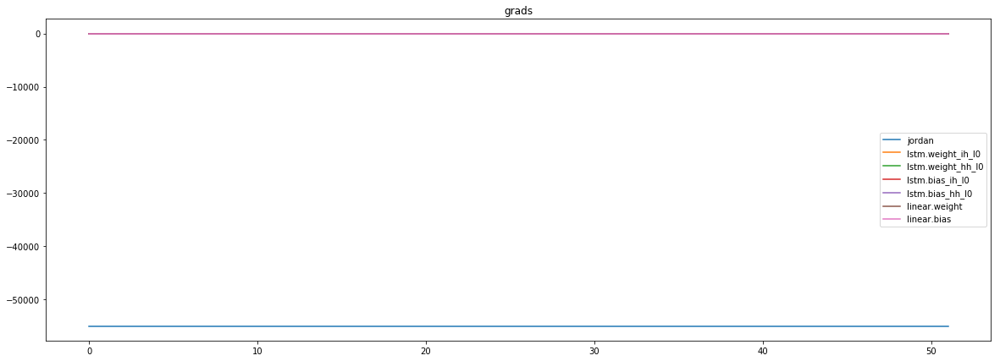

mean_p1 : 19052.509765625
mean_p2 : -73192.296875
mean_p3 : -809.7633666992188


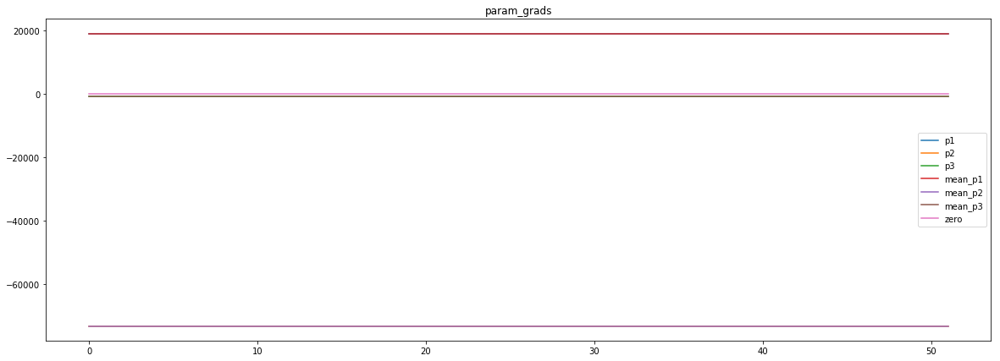

loss rate [0.09003980848012416]
Epoch [43] 
     train_loss[2071.7116088867188] 
     eval_train[7.664934116431351] 
     eval_test[7.6999557619829755]



aux preds: 0.44953352212905884           1.0045757293701172           9.553168296813965
main loss 0.0
aux loss 0.0
jord loss 2051.765610914964
combined loss 2051.765610914964 



Parameter containing:
tensor([[0.4495, 1.0046, 9.5532]], requires_grad=True)


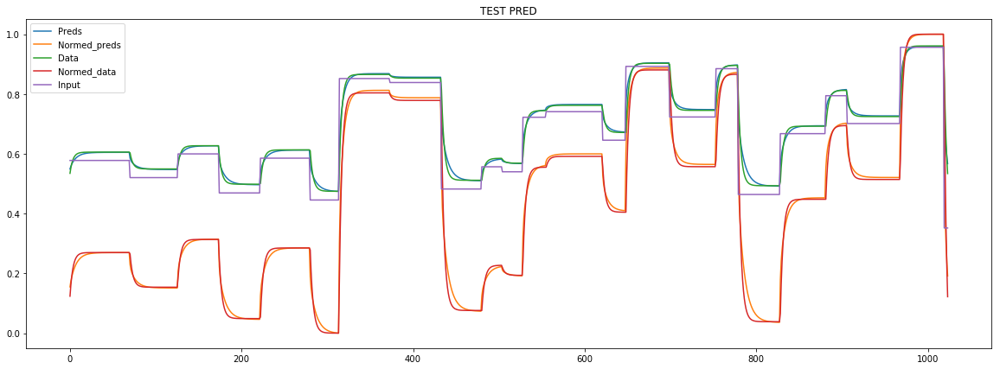

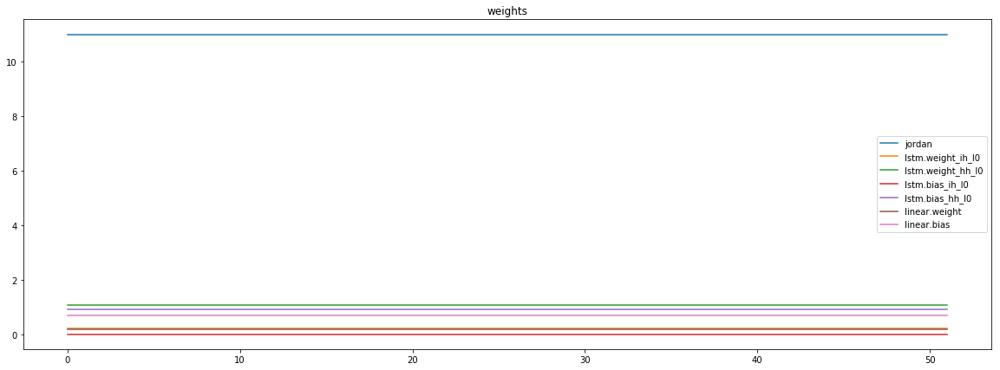

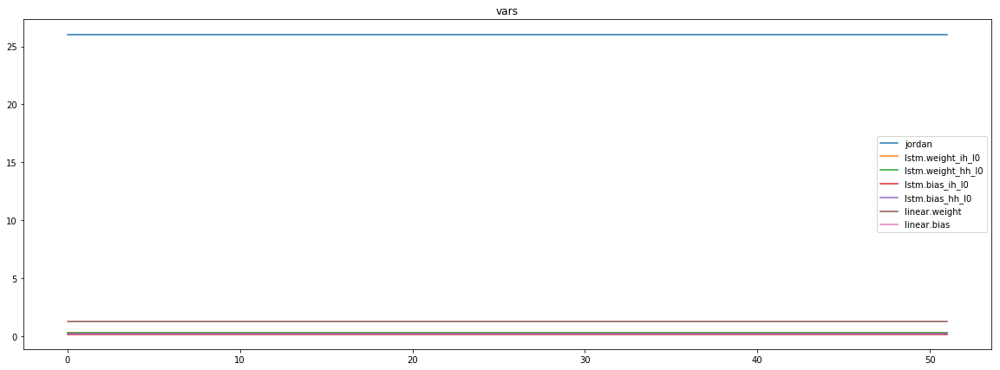

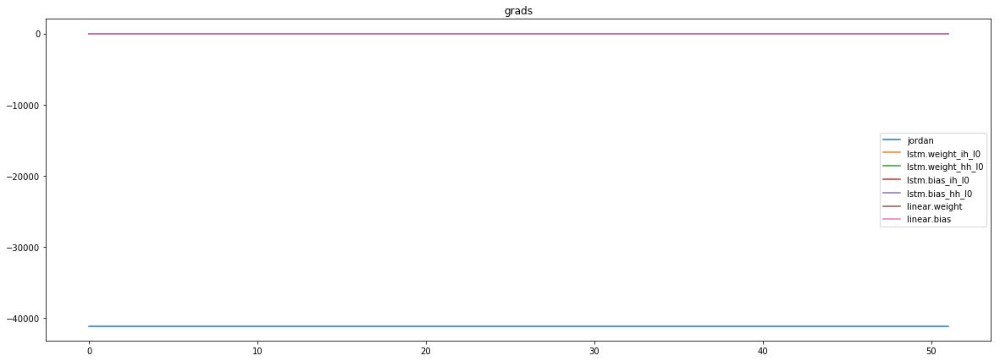

mean_p1 : 21755.947265625
mean_p2 : -62216.6015625
mean_p3 : -718.9180297851562


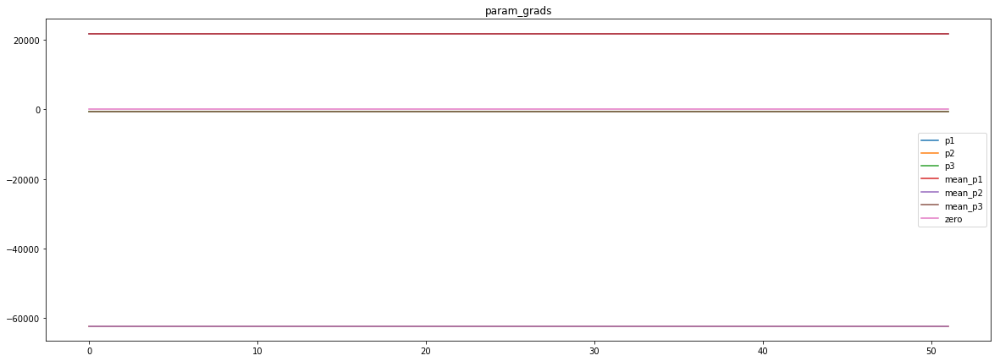

loss rate [0.08970727035503057]
Epoch [44] 
     train_loss[2051.765610914964] 
     eval_train[7.434790247852037] 
     eval_test[7.451318634213583]



aux preds: 0.4464012086391449           1.0049806833267212           9.61268424987793
main loss 0.0
aux loss 0.0
jord loss 2053.8997779259316
combined loss 2053.8997779259316 



Parameter containing:
tensor([[0.4464, 1.0050, 9.6127]], requires_grad=True)


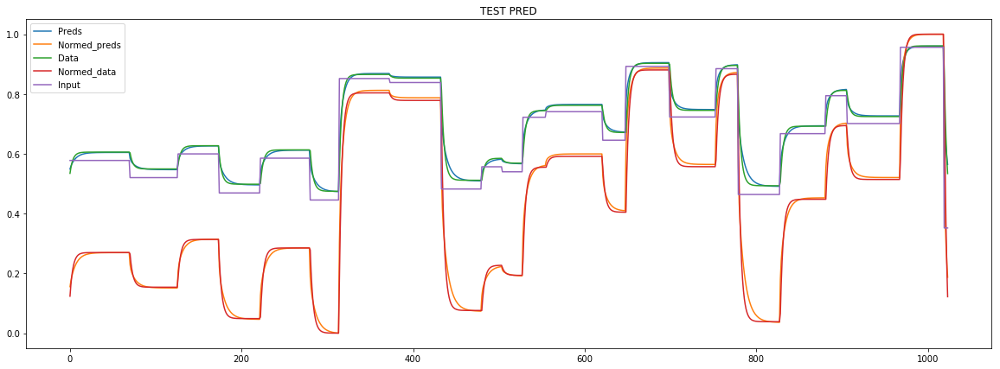

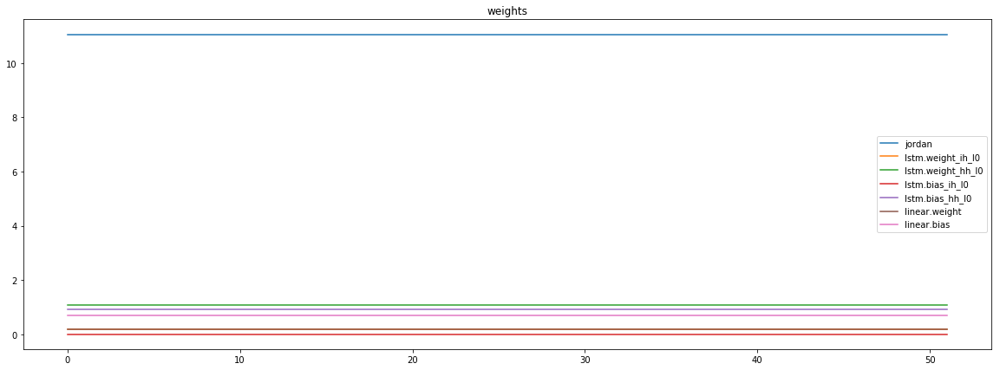

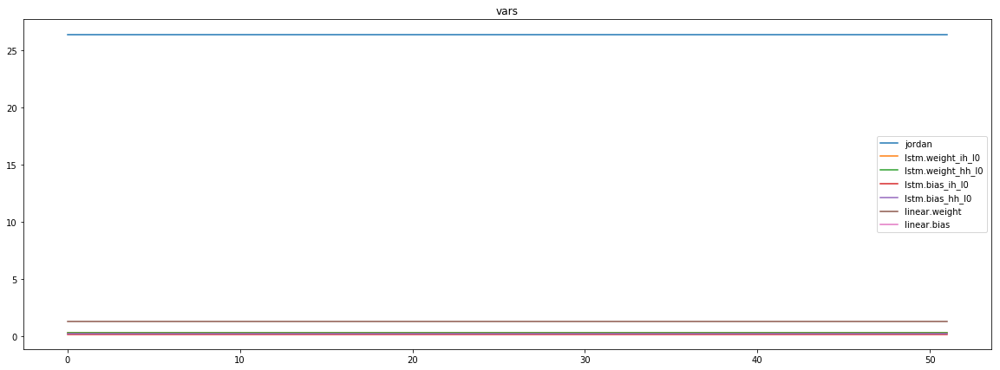

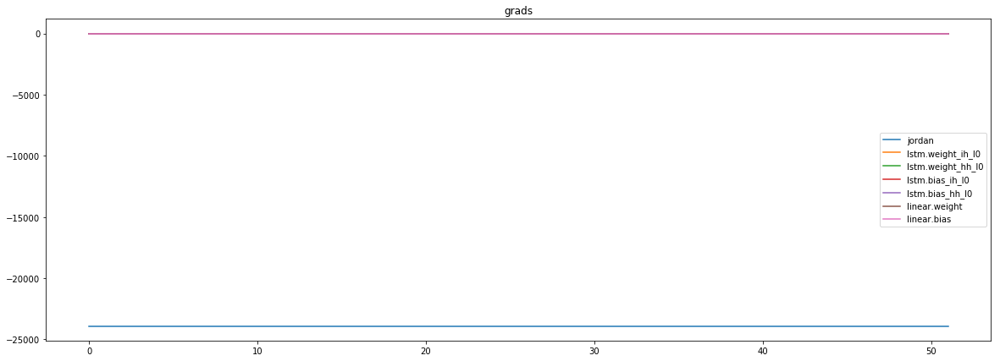

mean_p1 : -4550.6201171875
mean_p2 : -19068.1953125
mean_p3 : -278.3038330078125


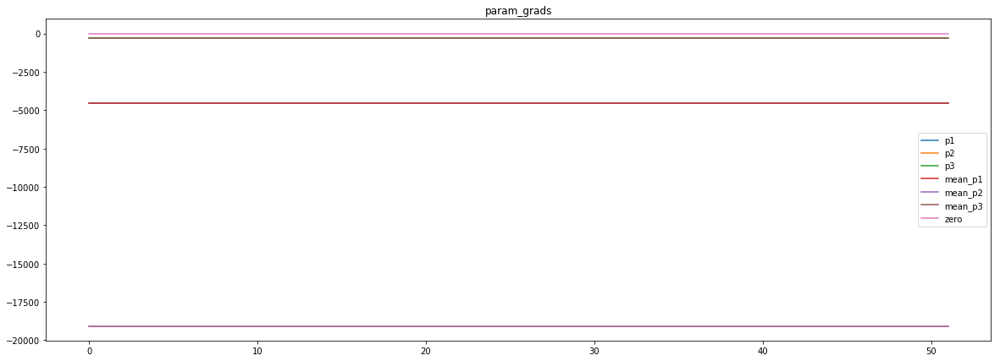

loss rate [0.08515296118677118]
Epoch [45] 
     train_loss[2053.8997779259316] 
     eval_train[7.238248113314442] 
     eval_test[7.2783741995914495]



aux preds: 0.44782817363739014           1.0049296617507935           9.669116973876953
main loss 0.0
aux loss 0.0
jord loss 2040.1267911470854
combined loss 2040.1267911470854 



Parameter containing:
tensor([[0.4478, 1.0049, 9.6691]], requires_grad=True)


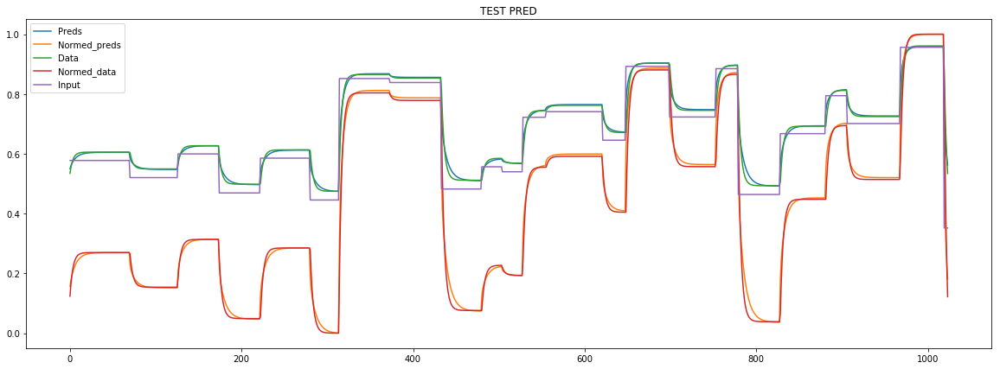

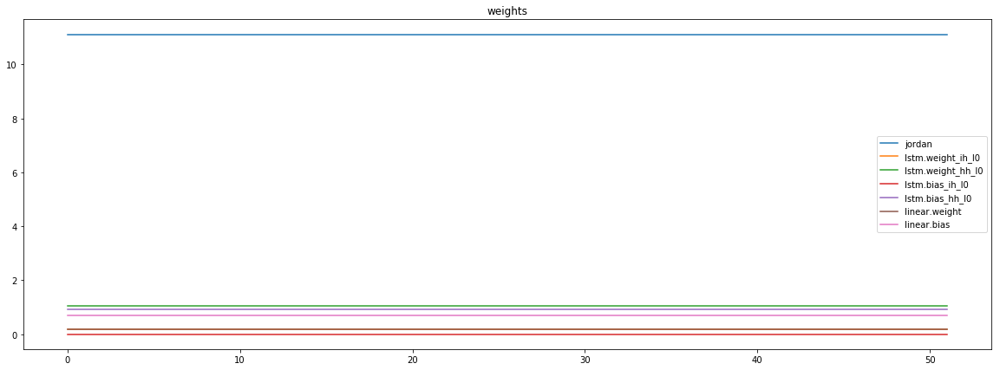

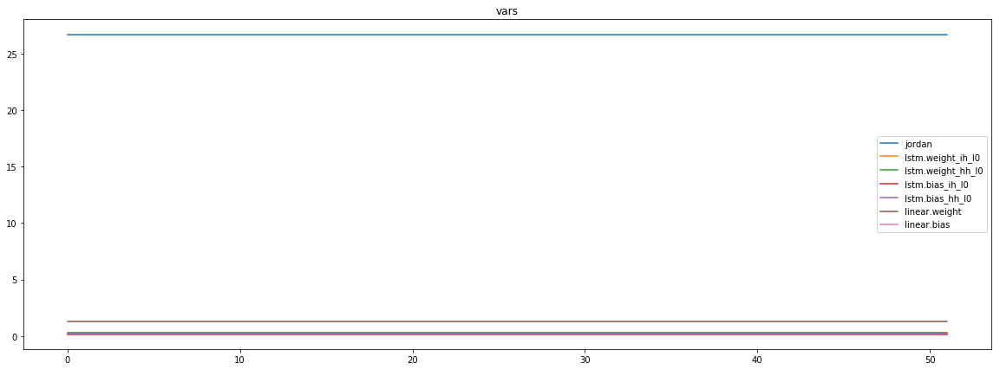

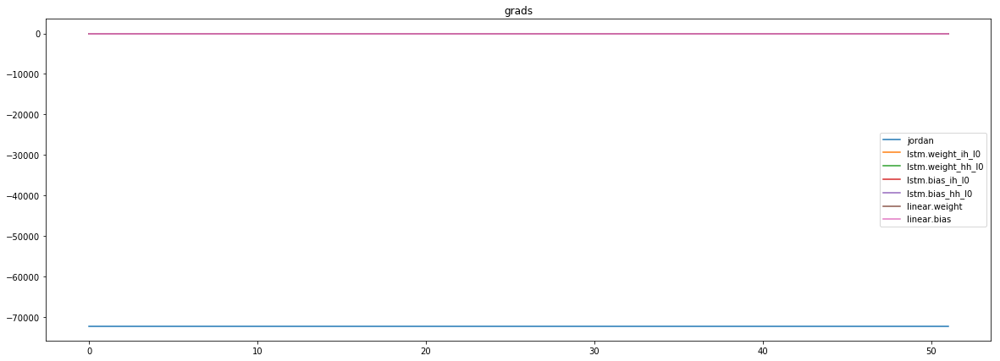

mean_p1 : -8318.11328125
mean_p2 : -63282.2109375
mean_p3 : -653.00341796875


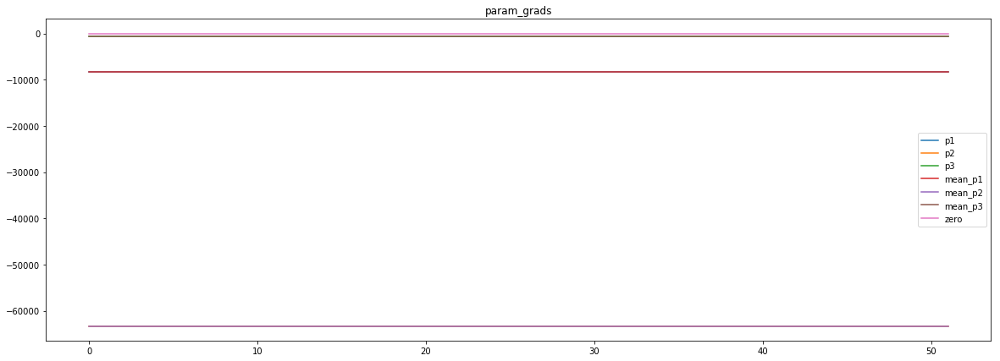

loss rate [0.05467826821185717]
Epoch [46] 
     train_loss[2040.1267911470854] 
     eval_train[7.059211041704447] 
     eval_test[7.067744751323269]



aux preds: 0.44870445132255554           1.0030744075775146           9.705307960510254
main loss 0.0
aux loss 0.0
jord loss 2057.8763545109678
combined loss 2057.8763545109678 



Parameter containing:
tensor([[0.4487, 1.0031, 9.7053]], requires_grad=True)


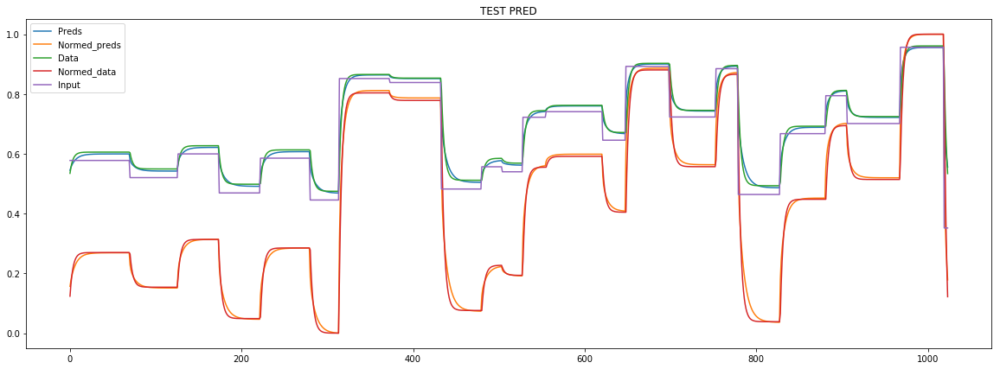

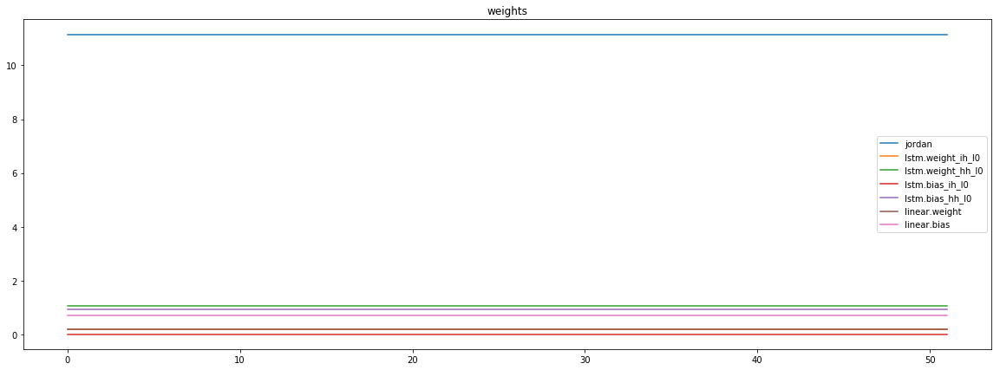

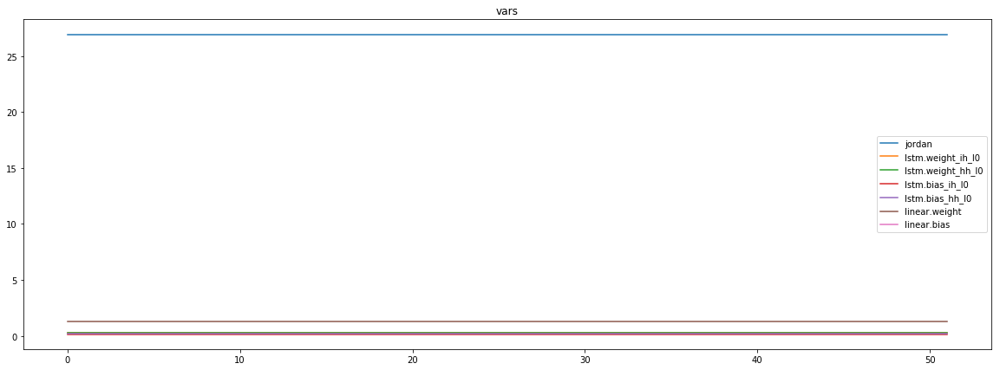

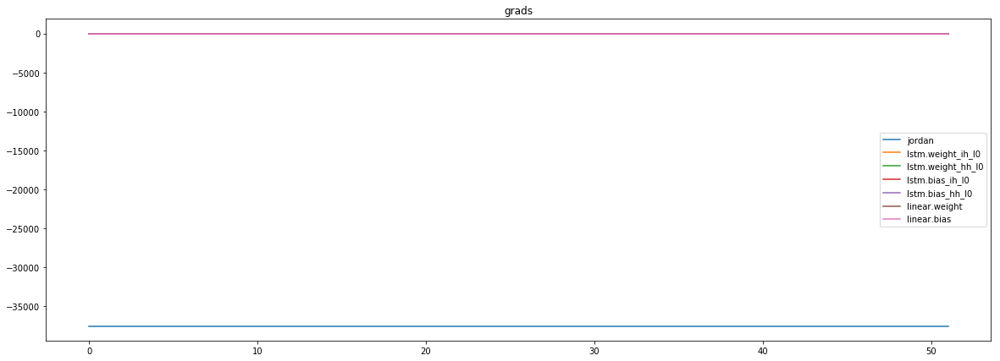

mean_p1 : 11565.216796875
mean_p2 : -48526.4375
mean_p3 : -558.9423217773438


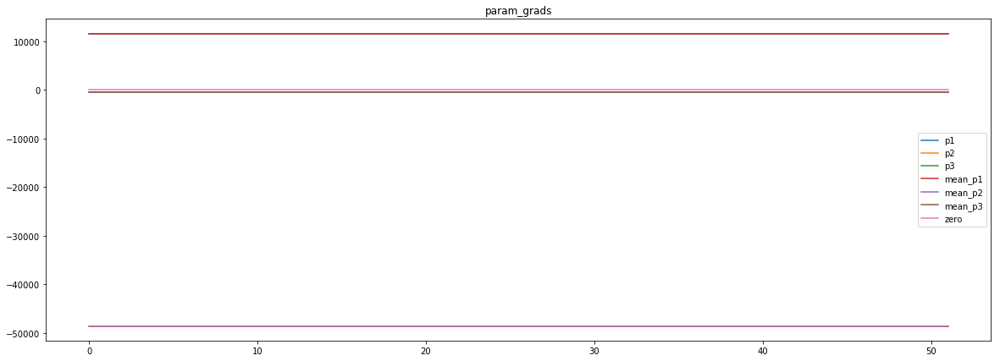

loss rate [-0.11110790124081271]
Epoch [47] 
     train_loss[2057.8763545109678] 
     eval_train[8.024409158994855] 
     eval_test[8.073101709213171]



aux preds: 0.44789403676986694           1.0026713609695435           9.7464599609375
main loss 0.0
aux loss 0.0
jord loss 2023.4058274489182
combined loss 2023.4058274489182 



Parameter containing:
tensor([[0.4479, 1.0027, 9.7465]], requires_grad=True)


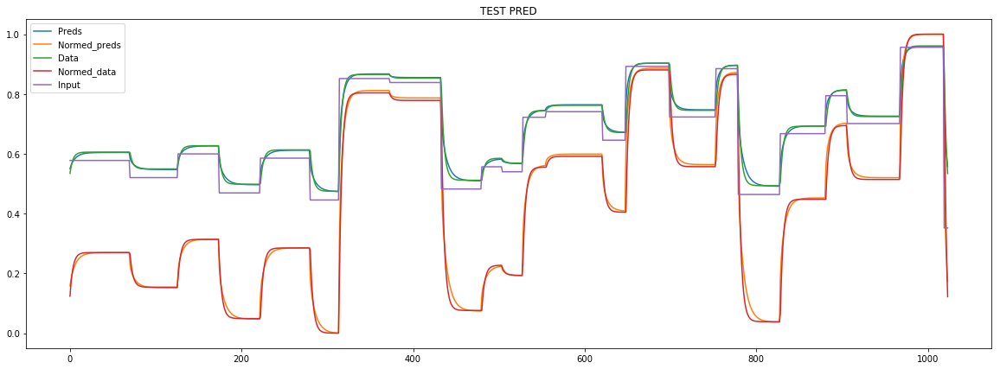

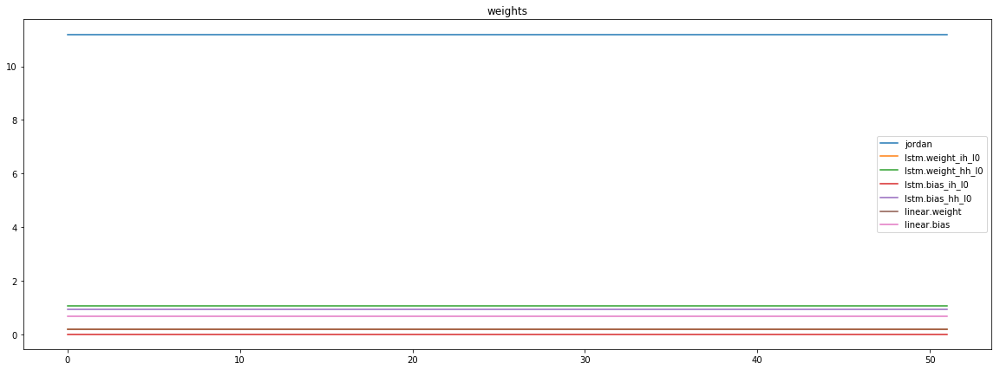

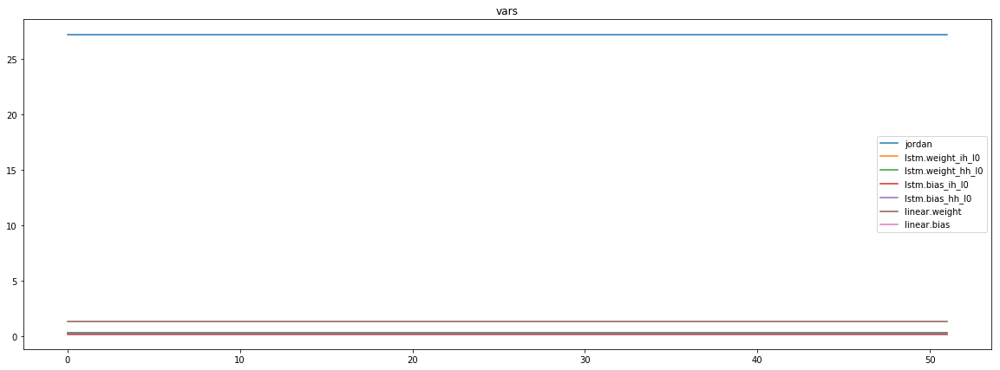

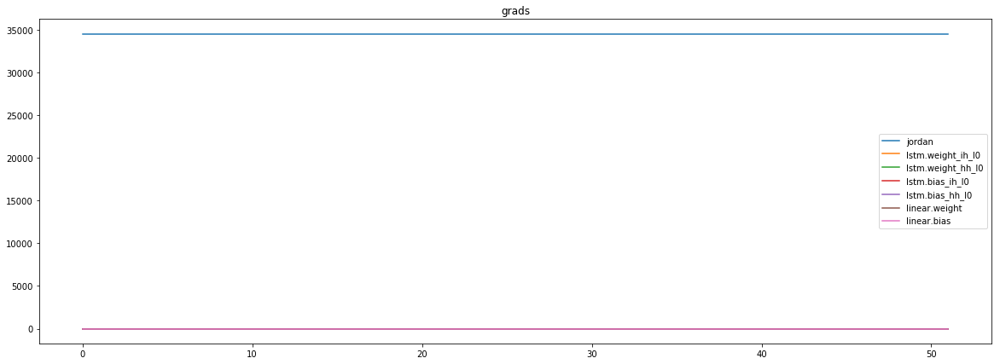

mean_p1 : 1731.2083740234375
mean_p2 : 32553.947265625
mean_p3 : 264.2008972167969


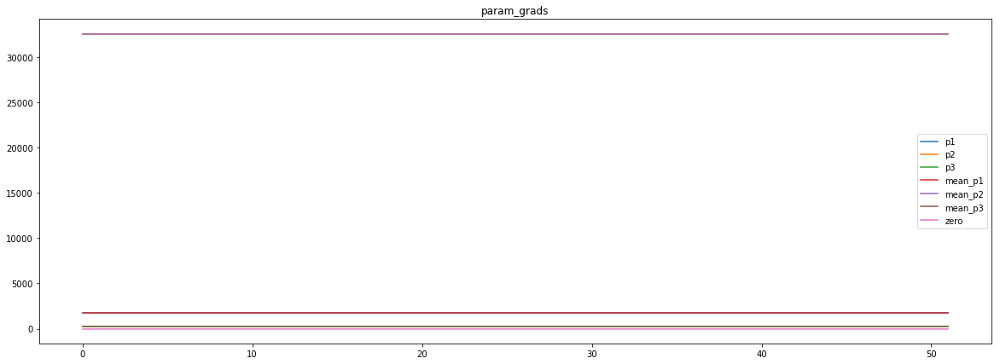

loss rate [0.10758436248408942]
Epoch [48] 
     train_loss[2023.4058274489182] 
     eval_train[6.64277131016402] 
     eval_test[6.669087699339302]



aux preds: 0.4489262104034424           1.0032902956008911           9.77770709991455
main loss 0.0
aux loss 0.0
jord loss 2072.1383033165566
combined loss 2072.1383033165566 



Parameter containing:
tensor([[0.4489, 1.0033, 9.7777]], requires_grad=True)


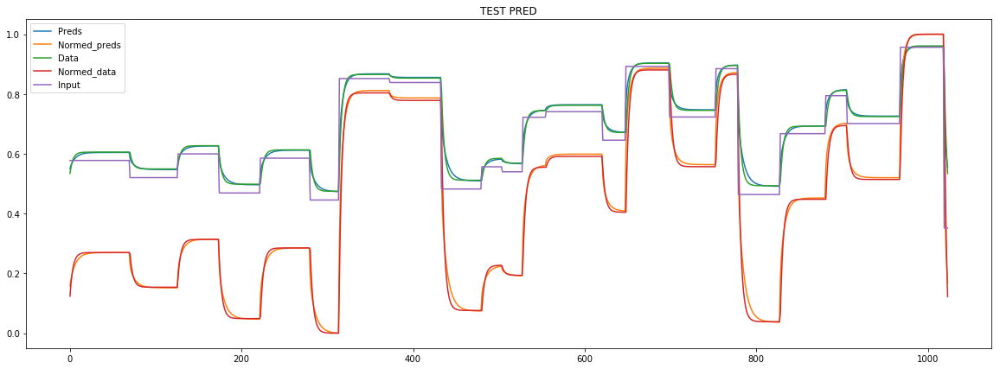

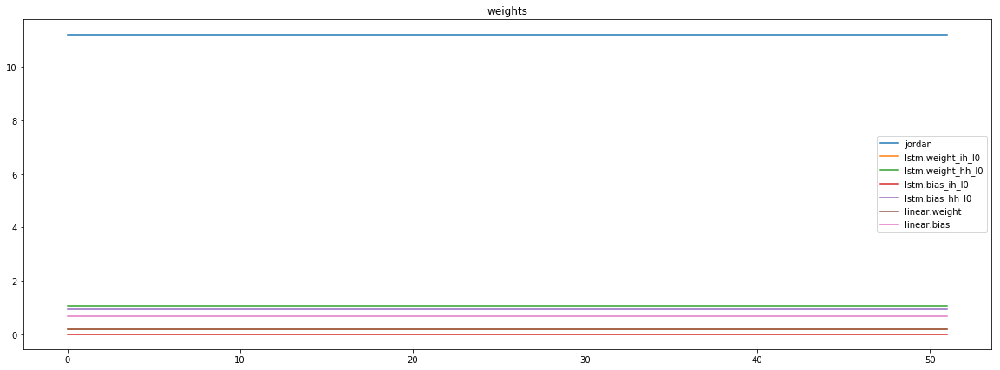

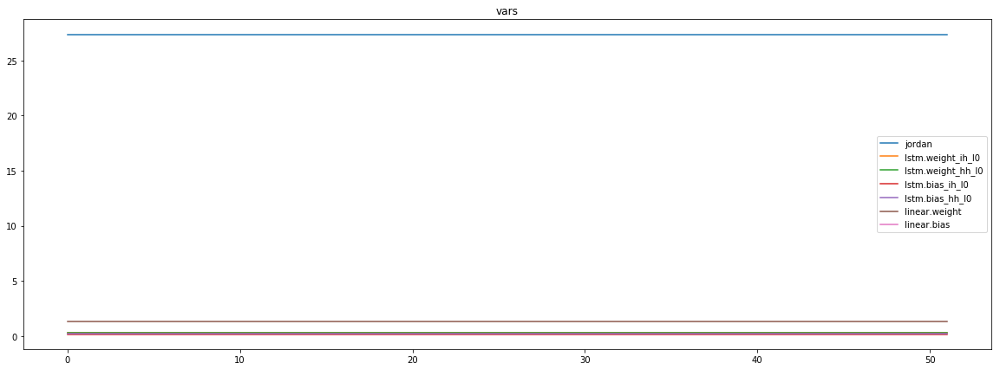

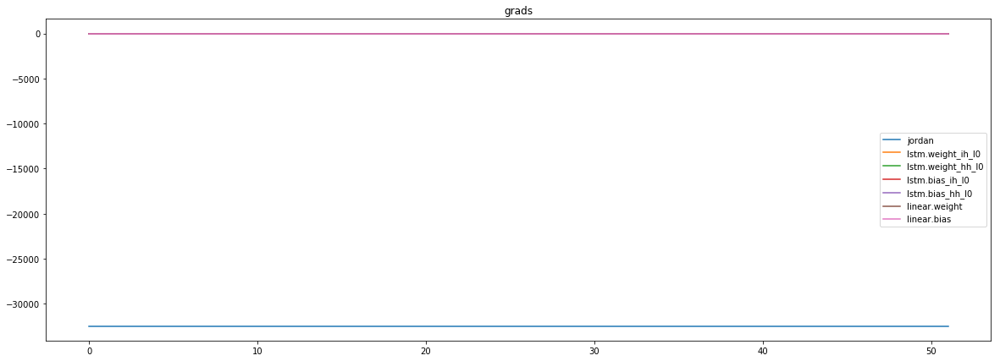

mean_p1 : -35649.01171875
mean_p2 : 3263.459716796875
mean_p3 : -67.43860626220703


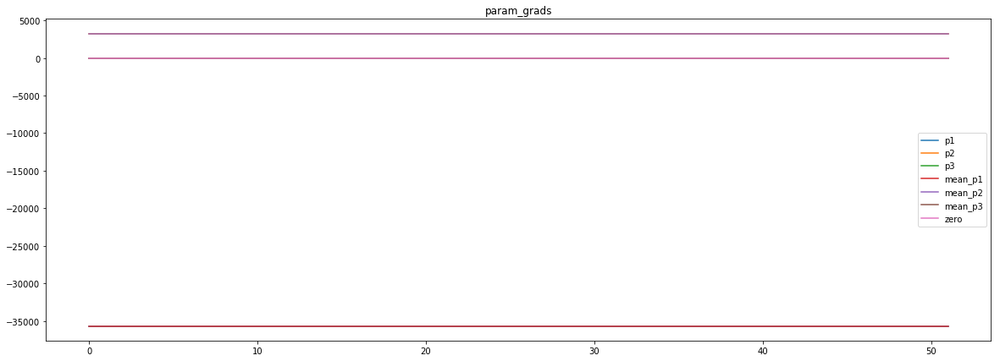

loss rate [0.09662668907518313]
Epoch [49] 
     train_loss[2072.1383033165566] 
     eval_train[6.532420450808086] 
     eval_test[6.567504144353072]



aux preds: 0.449655681848526           1.0006548166275024           9.792871475219727
main loss 0.0
aux loss 0.0
jord loss 2049.449054424579
combined loss 2049.449054424579 



Parameter containing:
tensor([[0.4497, 1.0007, 9.7929]], requires_grad=True)


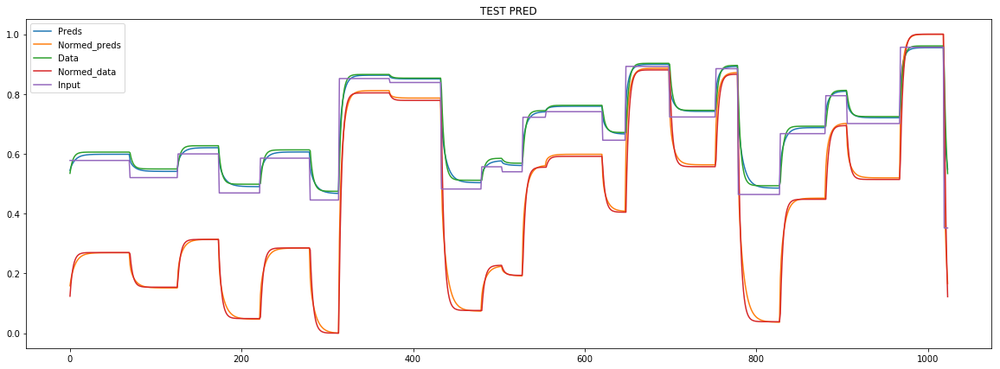

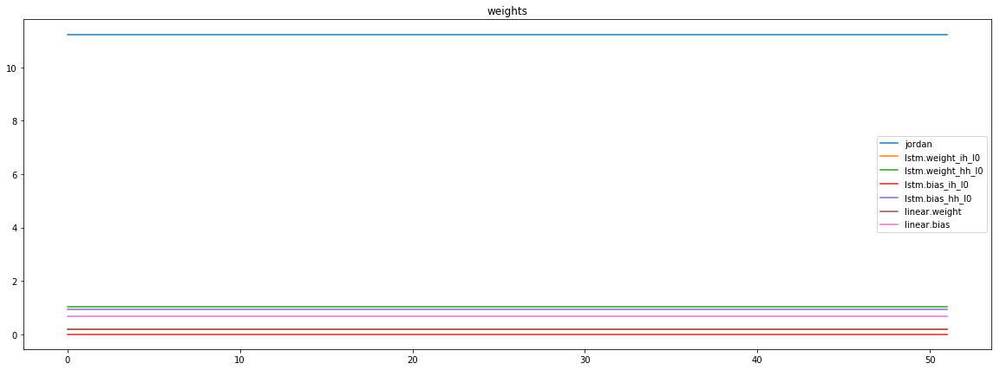

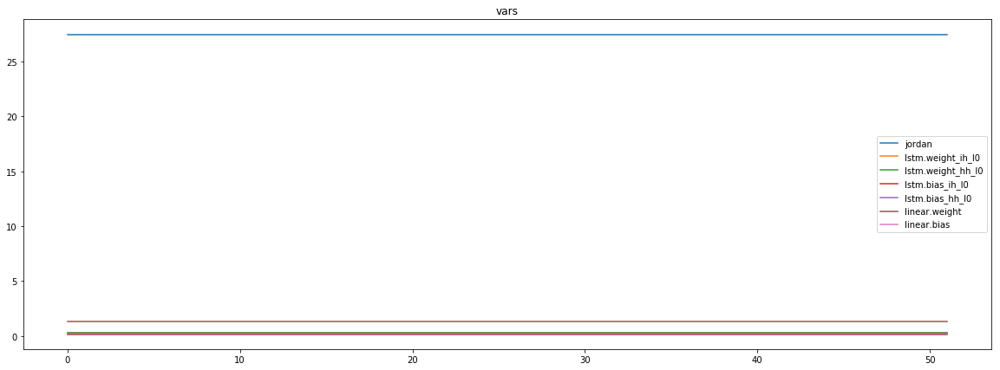

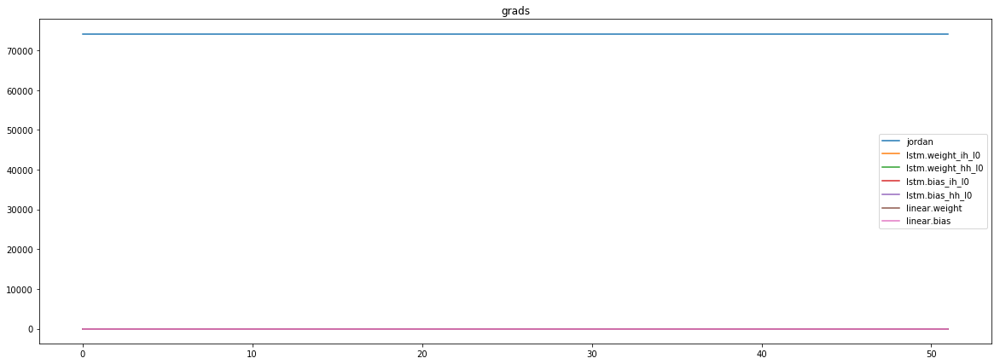

mean_p1 : -20691.849609375
mean_p2 : 93948.0703125
mean_p3 : 908.8582153320312


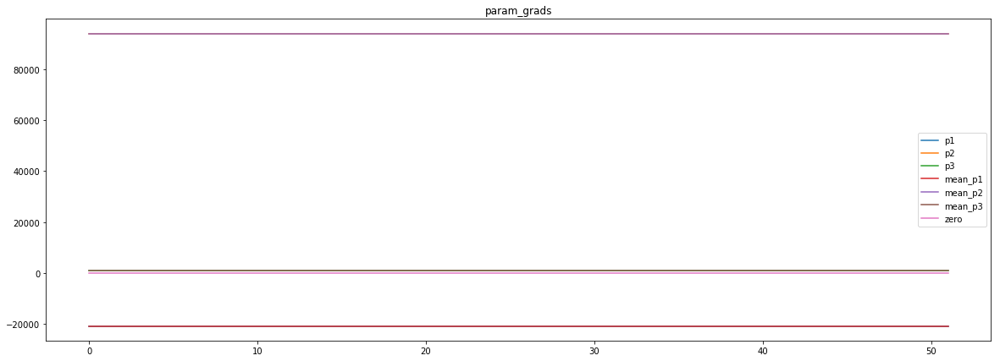

loss rate [-0.1993088413349311]
Epoch [50] 
     train_loss[2049.449054424579] 
     eval_train[8.437006476666562] 
     eval_test[8.5189679613792]



aux preds: 0.4489981234073639           1.0038801431655884           9.805103302001953
main loss 0.0
aux loss 0.0
jord loss 2115.655480018029
combined loss 2115.655480018029 



Parameter containing:
tensor([[0.4490, 1.0039, 9.8051]], requires_grad=True)


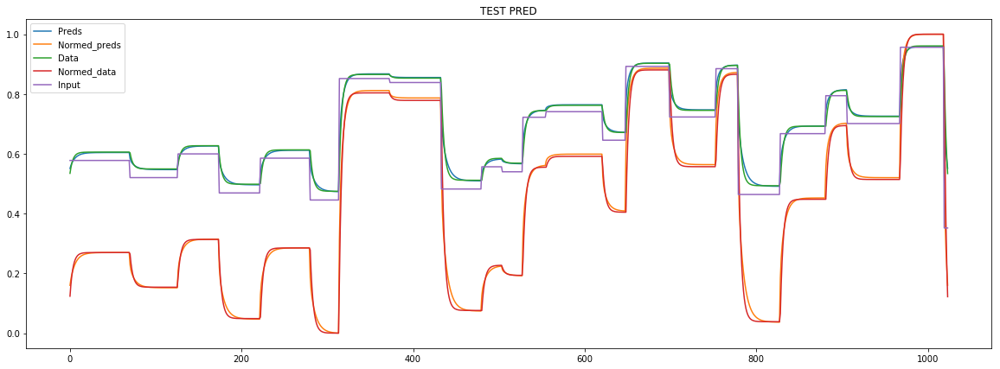

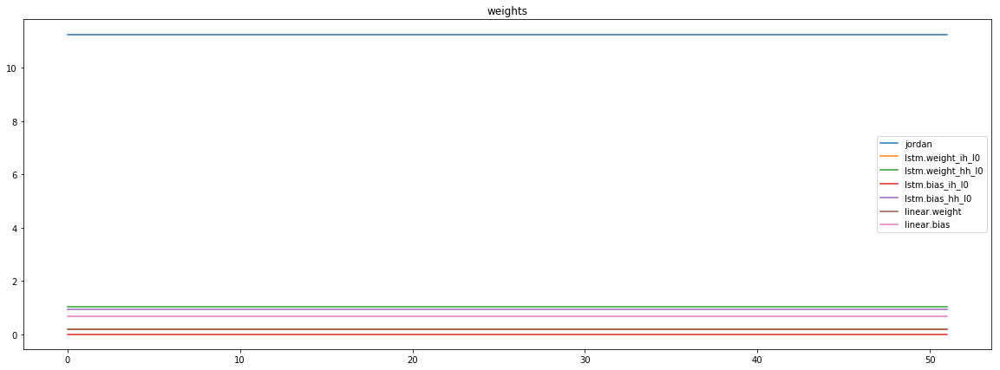

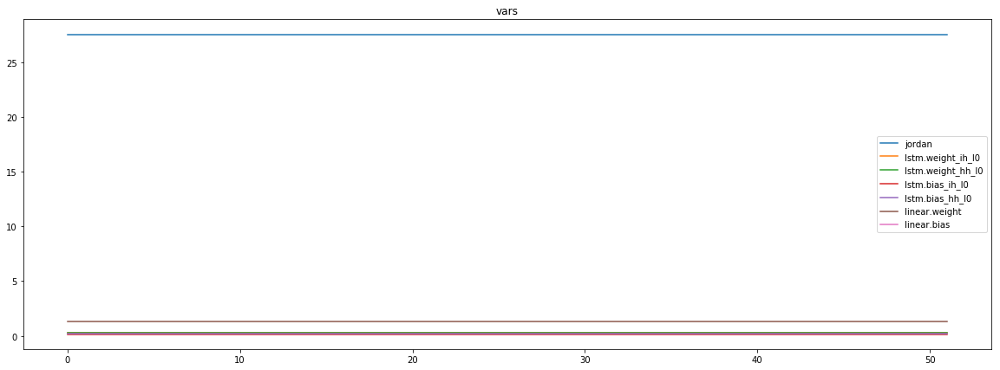

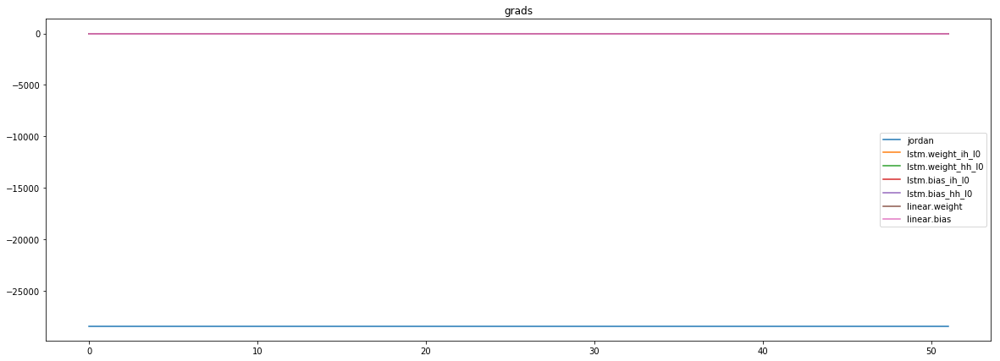

mean_p1 : 14064.482421875
mean_p2 : -42014.16796875
mean_p3 : -493.964111328125


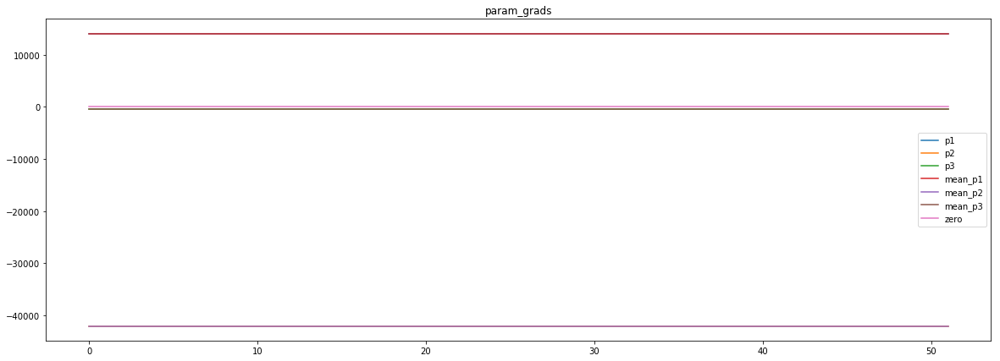

loss rate [0.1242191359114454]
Epoch [51] 
     train_loss[2115.655480018029] 
     eval_train[6.30082260000815] 
     eval_test[6.35103432160527]



aux preds: 0.44914132356643677           0.9983866810798645           9.812289237976074
main loss 0.0
aux loss 0.0
jord loss 2085.627361591046
combined loss 2085.627361591046 



Parameter containing:
tensor([[0.4491, 0.9984, 9.8123]], requires_grad=True)


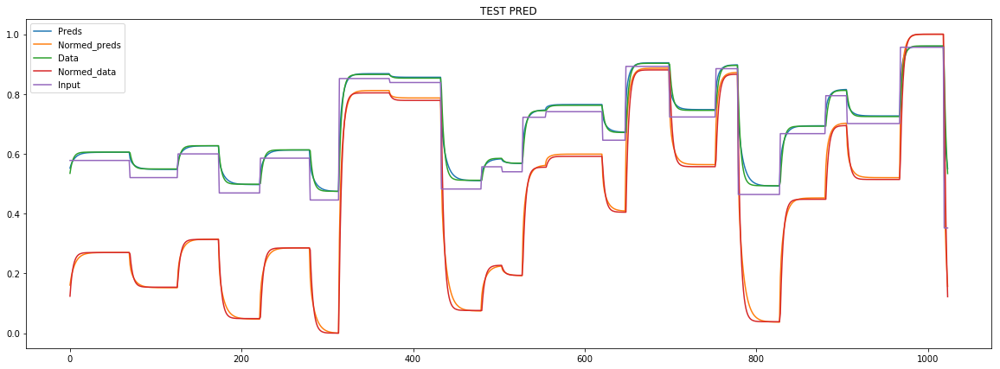

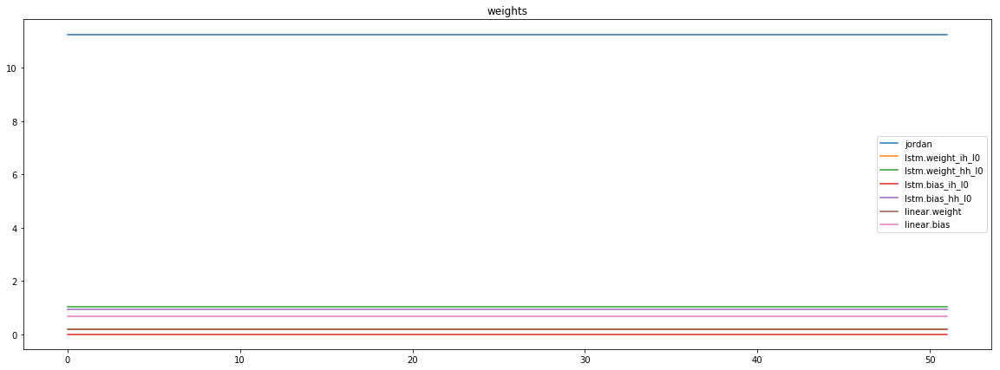

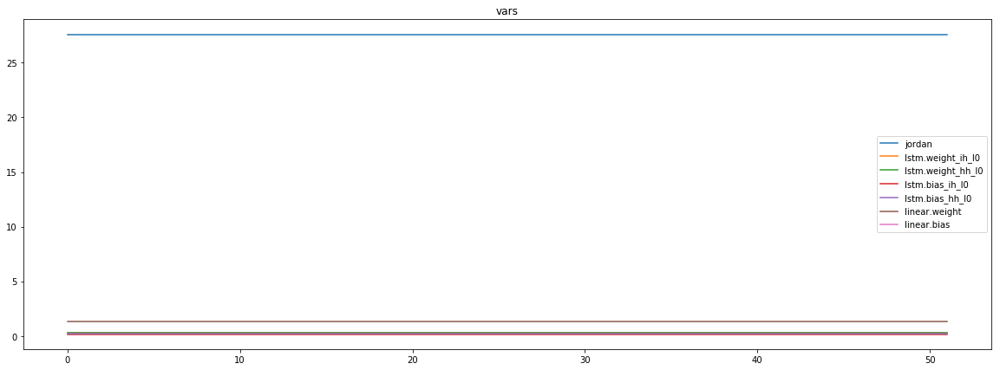

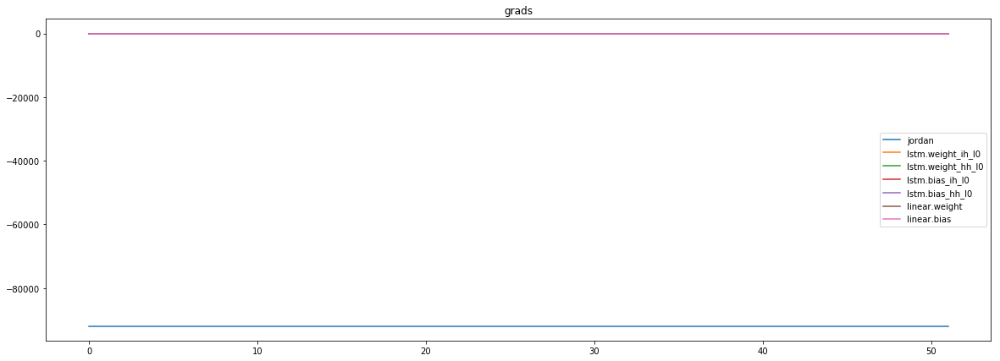

mean_p1 : 8787.6953125
mean_p2 : -99661.734375
mean_p3 : -999.2518920898438


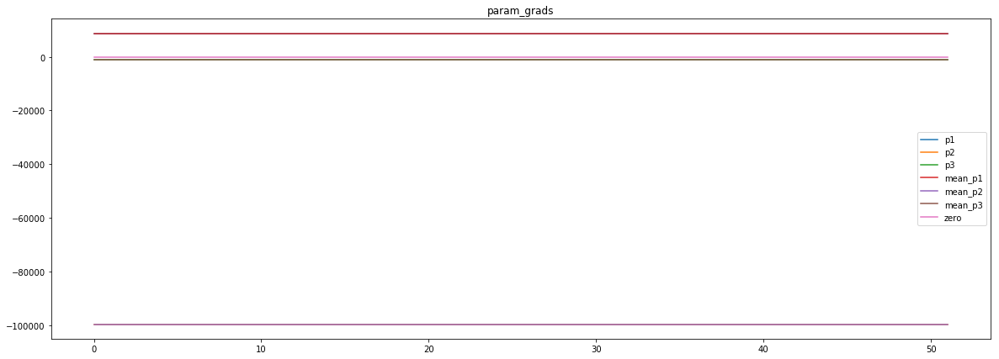

loss rate [0.0975599600482624]
Epoch [52] 
     train_loss[2085.627361591046] 
     eval_train[6.4091586501498785] 
     eval_test[6.4486880522507075]



aux preds: 0.4487091898918152           1.001248836517334           9.82202434539795
main loss 0.0
aux loss 0.0
jord loss 2051.457820012019
combined loss 2051.457820012019 



Parameter containing:
tensor([[0.4487, 1.0012, 9.8220]], requires_grad=True)


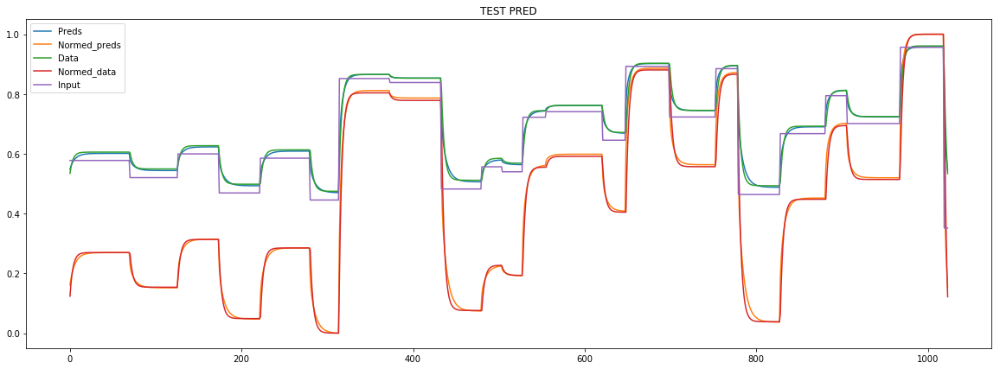

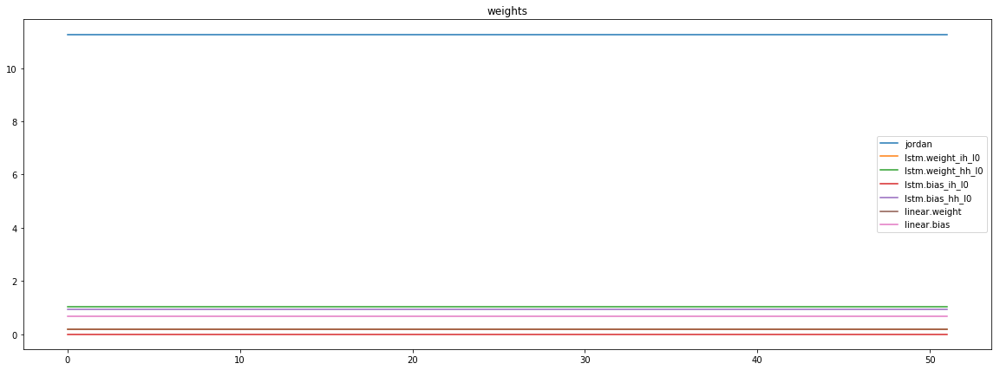

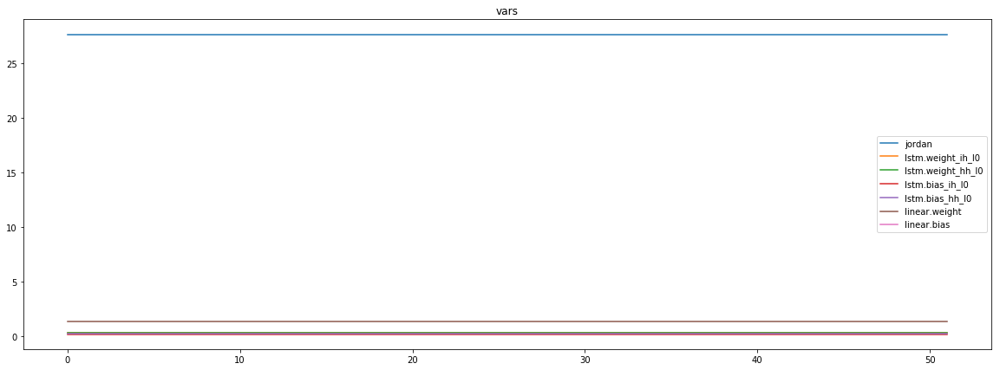

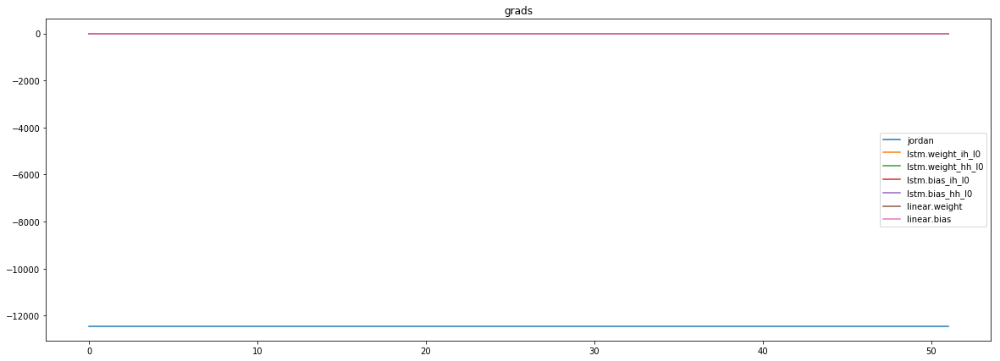

mean_p1 : 17010.869140625
mean_p2 : -29080.3359375
mean_p3 : -366.2586364746094


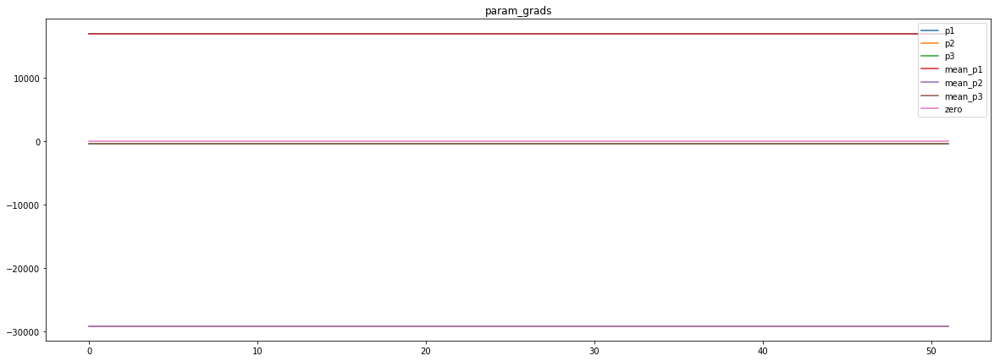

loss rate [0.0741885491732941]
Epoch [53] 
     train_loss[2051.457820012019] 
     eval_train[6.504457484420318] 
     eval_test[6.579029209663117]



aux preds: 0.44907063245773315           0.9996293187141418           9.840154647827148
main loss 0.0
aux loss 0.0
jord loss 2030.51463669997
combined loss 2030.51463669997 



Parameter containing:
tensor([[0.4491, 0.9996, 9.8402]], requires_grad=True)


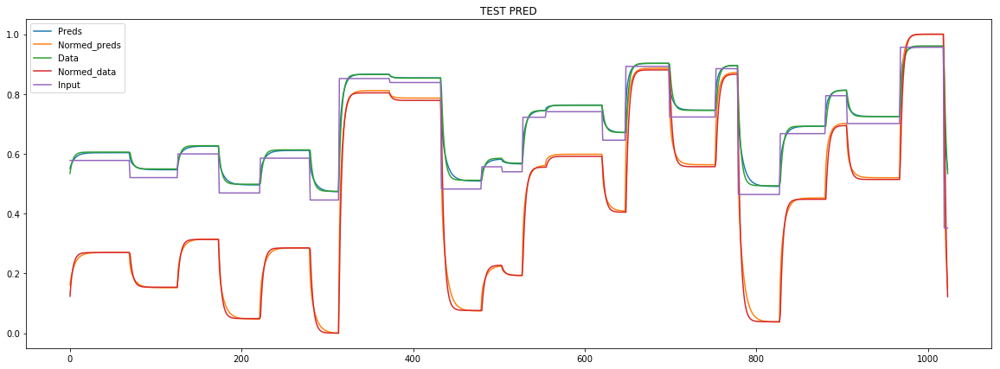

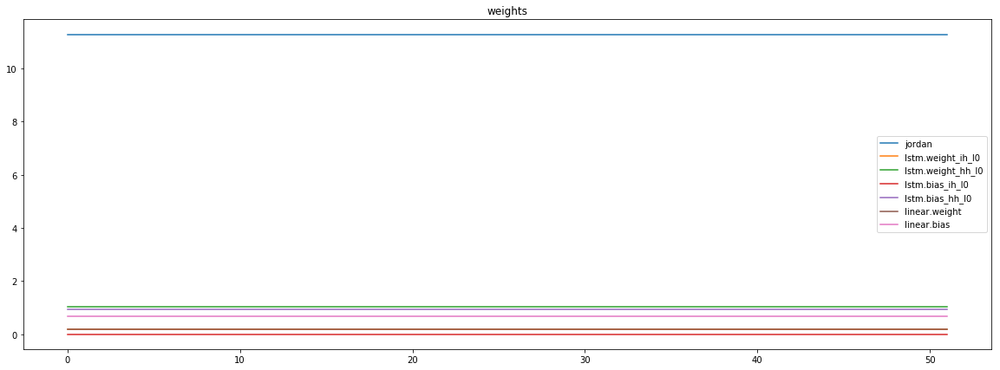

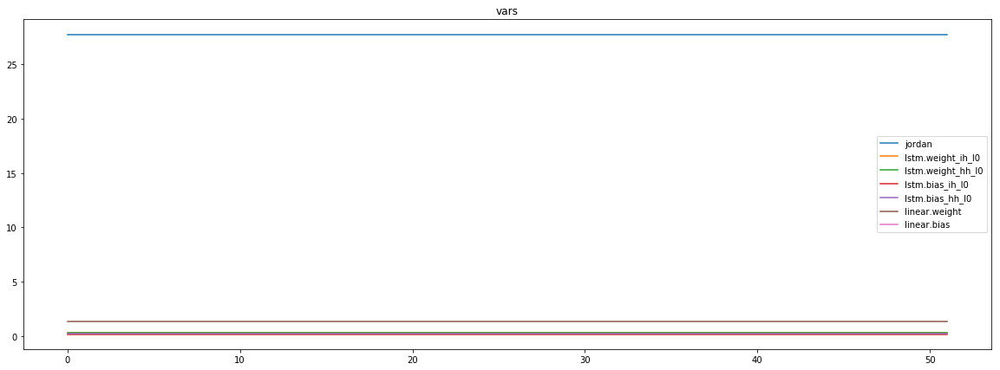

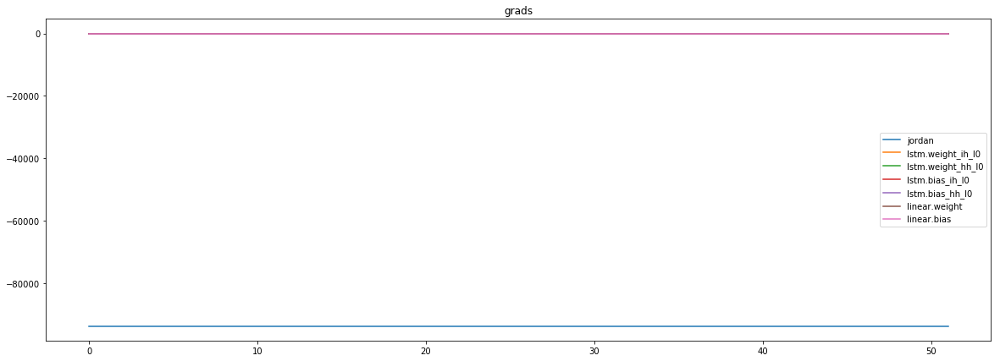

mean_p1 : 1267.78271484375
mean_p2 : -94052.9609375
mean_p3 : -925.5872192382812


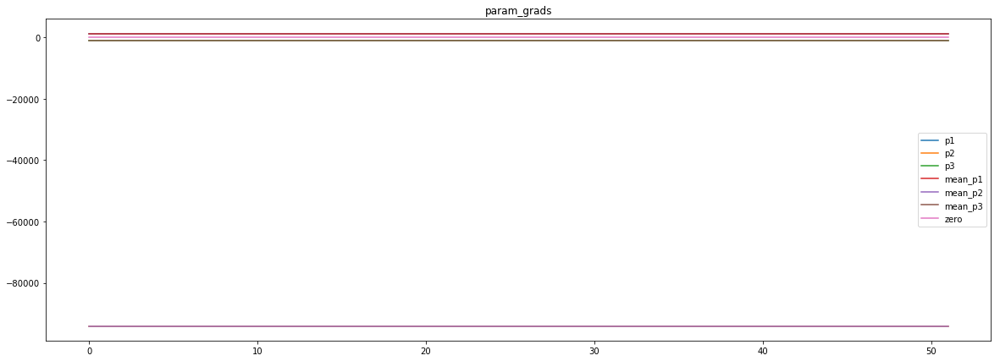

loss rate [0.052100713452133074]
Epoch [54] 
     train_loss[2030.51463669997] 
     eval_train[6.058601097315728] 
     eval_test[6.1230349334020335]



aux preds: 0.44933515787124634           1.0003515481948853           9.853134155273438
main loss 0.0
aux loss 0.0
jord loss 2029.8039691631611
combined loss 2029.8039691631611 



Parameter containing:
tensor([[0.4493, 1.0004, 9.8531]], requires_grad=True)


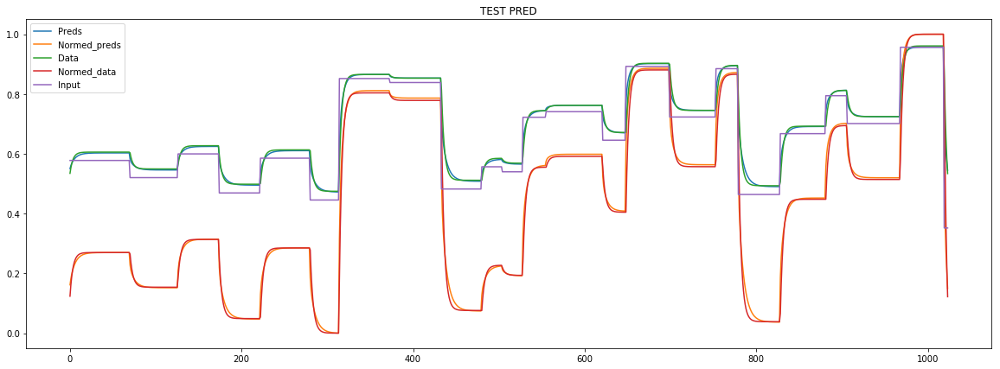

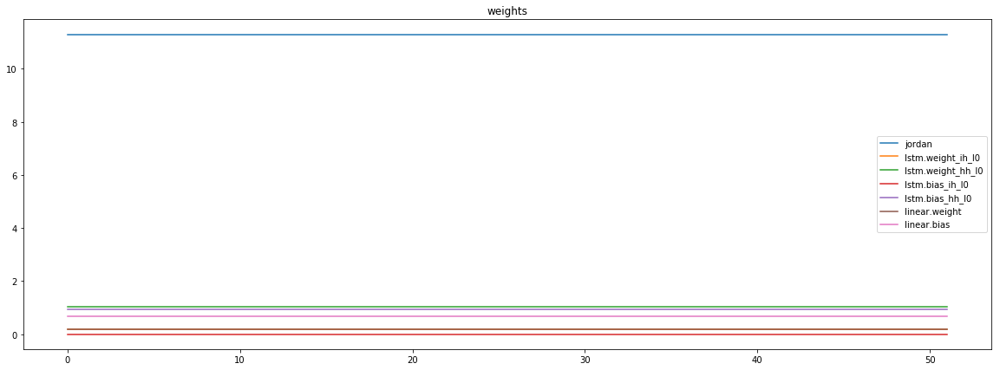

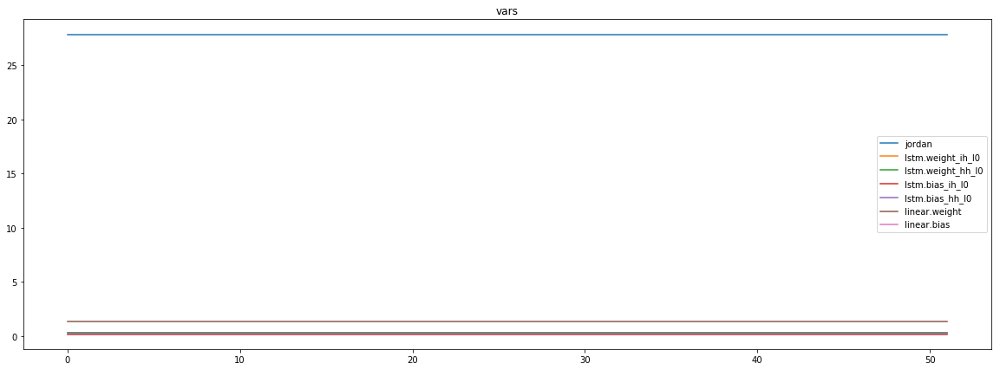

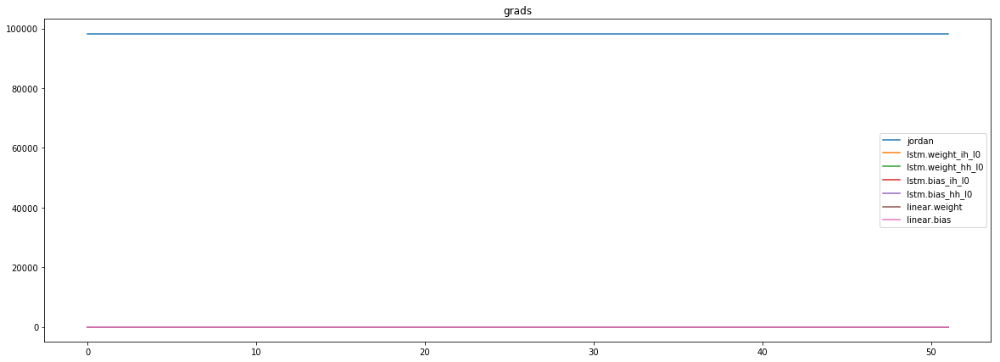

mean_p1 : -14678.1982421875
mean_p2 : 111854.125
mean_p3 : 1117.0107421875


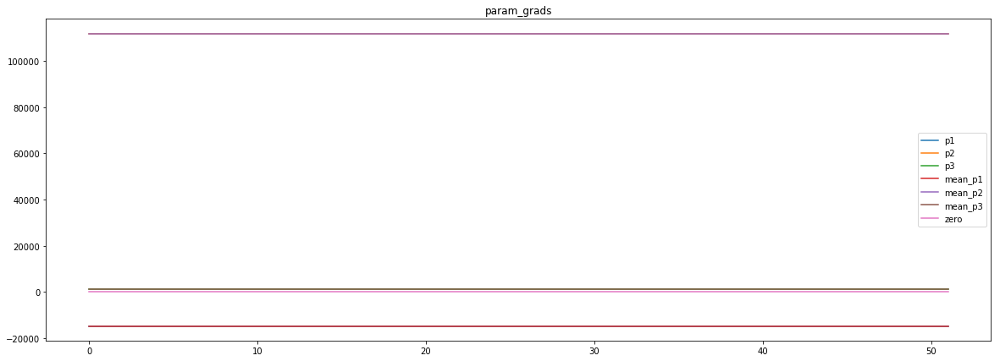

loss rate [0.028233585827584506]
Epoch [55] 
     train_loss[2029.8039691631611] 
     eval_train[6.13187426552087] 
     eval_test[6.203352596515535]



aux preds: 0.4493102431297302           1.0014824867248535           9.862796783447266
main loss 0.0
aux loss 0.0
jord loss 2061.616983266977
combined loss 2061.616983266977 



Parameter containing:
tensor([[0.4493, 1.0015, 9.8628]], requires_grad=True)


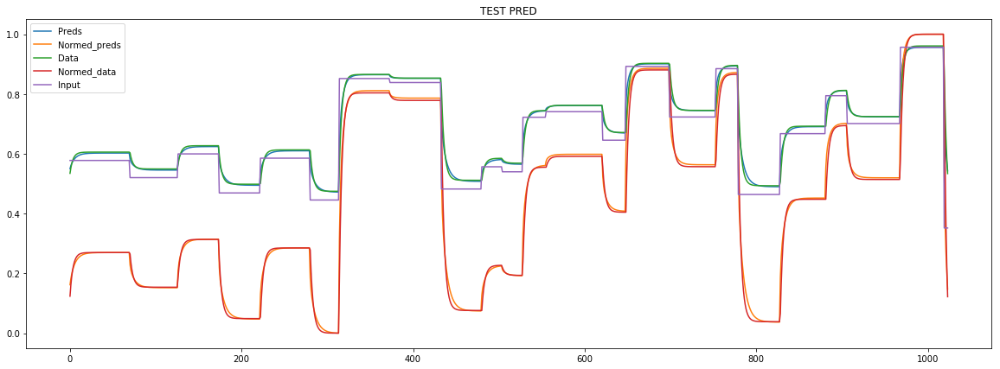

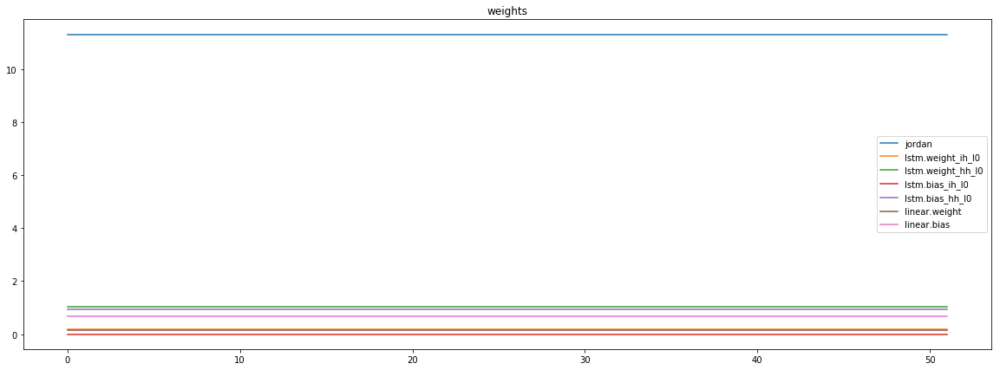

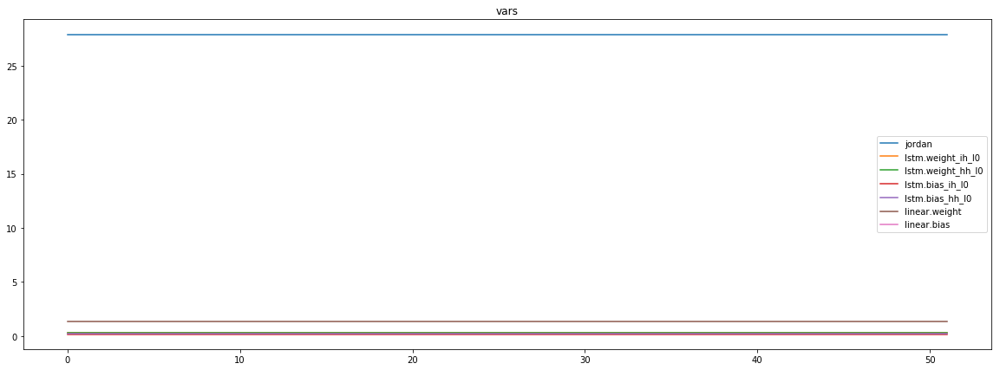

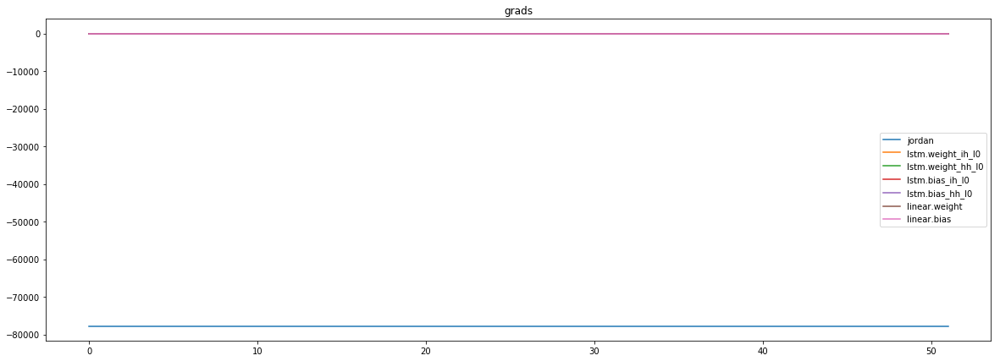

mean_p1 : -10655.0625
mean_p2 : -66442.5390625
mean_p3 : -645.1727905273438


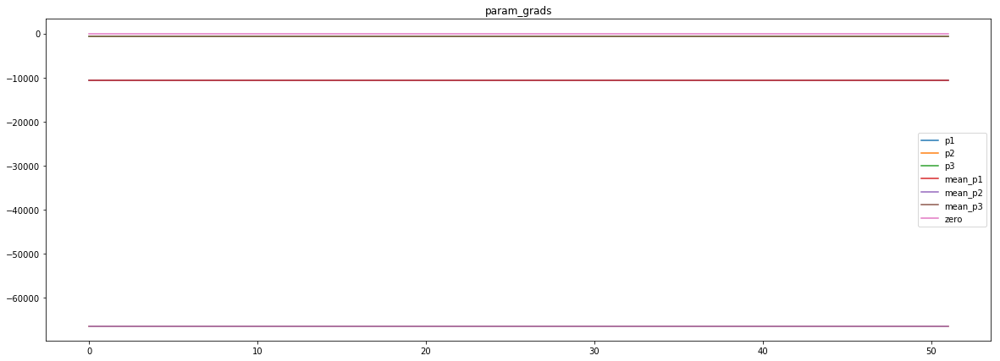

loss rate [-0.024401056231698526]
Epoch [56] 
     train_loss[2061.616983266977] 
     eval_train[6.368359653093368] 
     eval_test[6.45557629217563]



aux preds: 0.44561824202537537           1.000501275062561           9.867385864257812
main loss 0.0
aux loss 0.0
jord loss 2037.4298706054688
combined loss 2037.4298706054688 



Parameter containing:
tensor([[0.4456, 1.0005, 9.8674]], requires_grad=True)


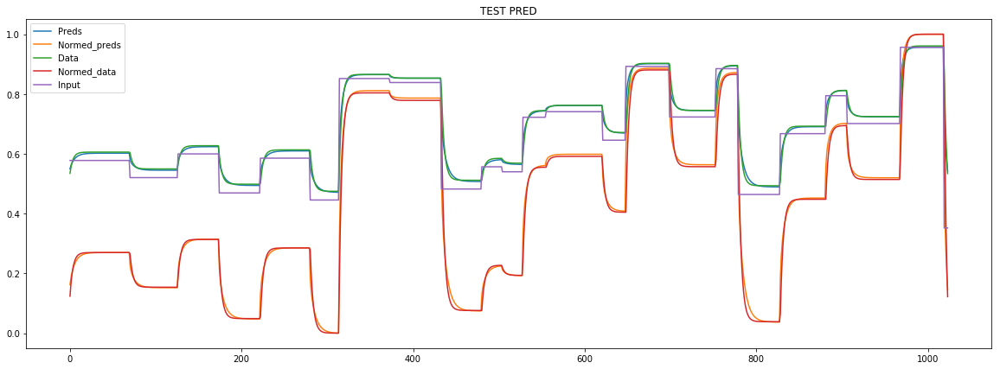

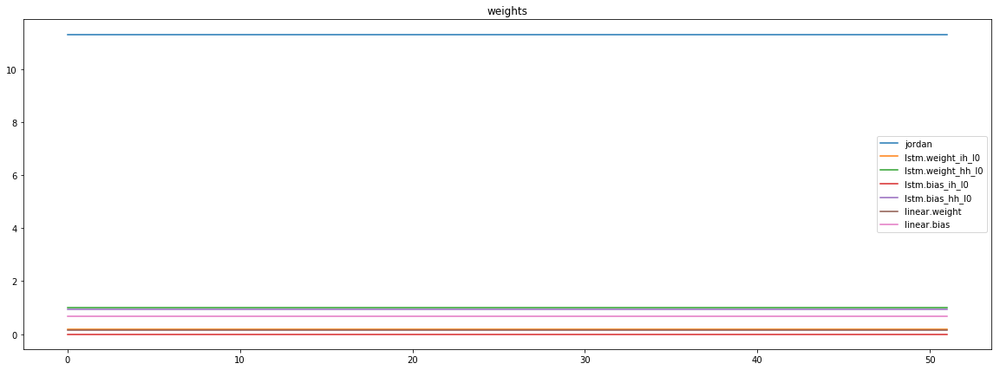

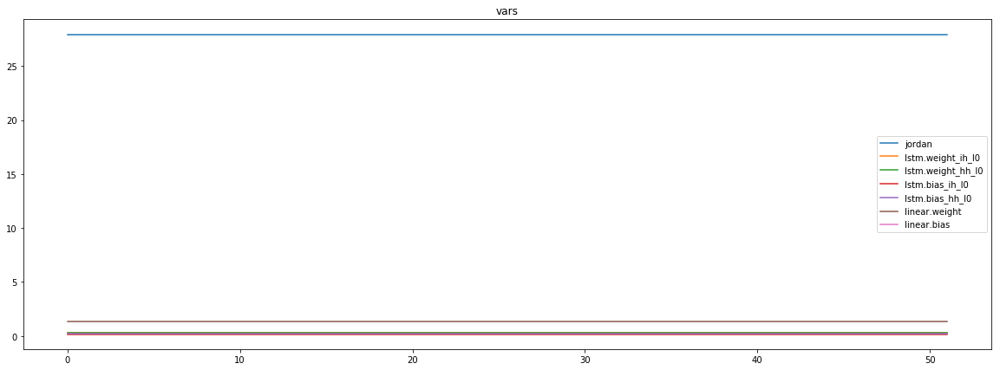

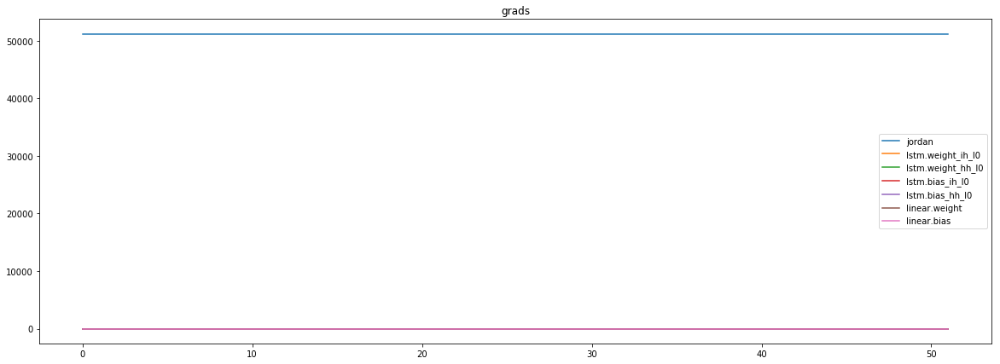

mean_p1 : -31064.712890625
mean_p2 : 81508.96875
mean_p3 : 791.6456909179688


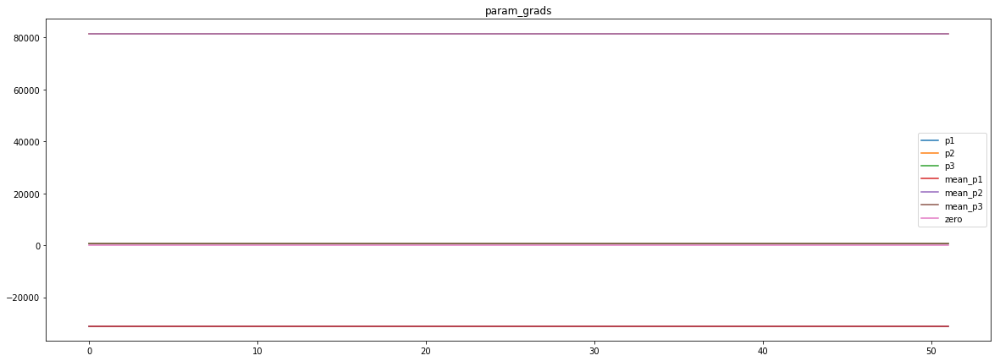

loss rate [-0.023450269507599097]
Epoch [57] 
     train_loss[2037.4298706054688] 
     eval_train[6.308661956241569] 
     eval_test[6.407468645201086]



aux preds: 0.44759678840637207           1.000082015991211           9.879043579101562
main loss 0.0
aux loss 0.0
jord loss 2023.131580059345
combined loss 2023.131580059345 



Parameter containing:
tensor([[0.4476, 1.0001, 9.8790]], requires_grad=True)


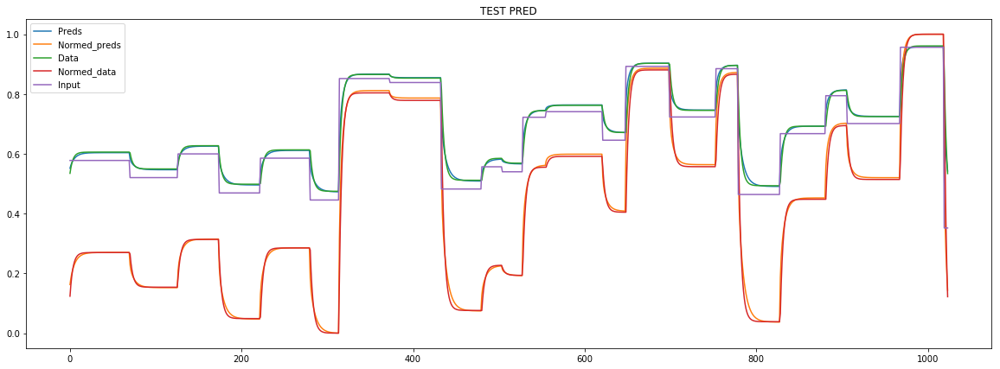

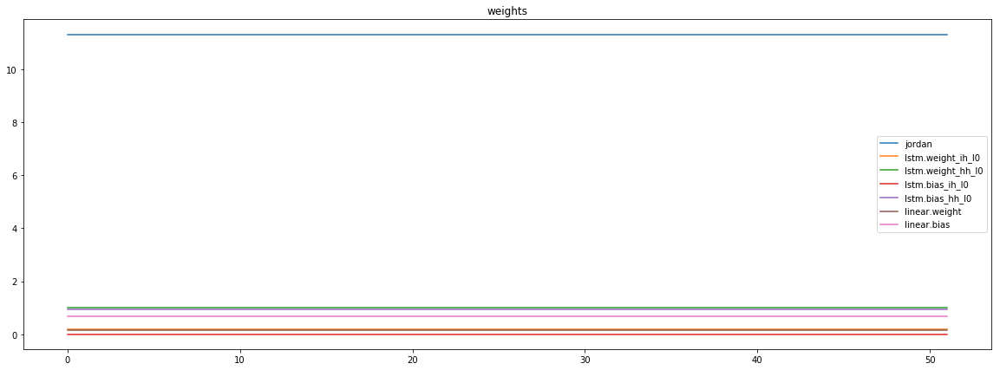

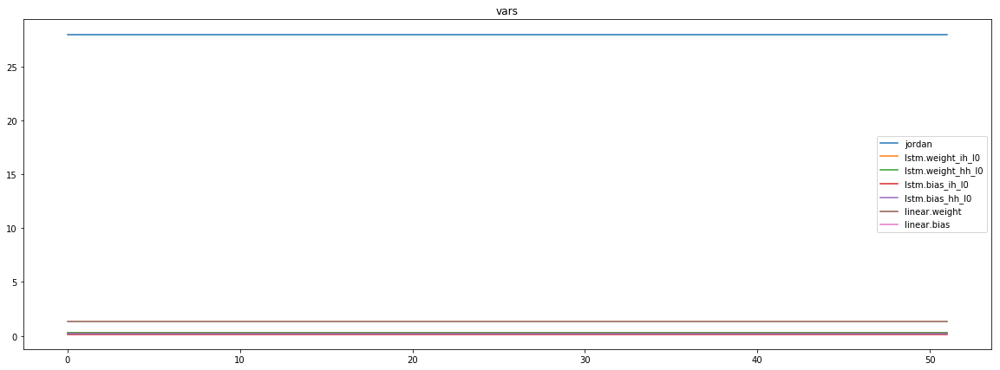

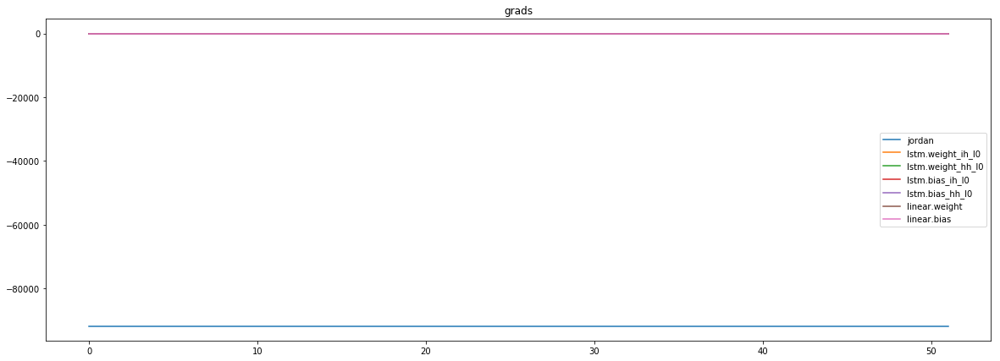

mean_p1 : 2011.7352294921875
mean_p2 : -92848.265625
mean_p3 : -917.1790161132812


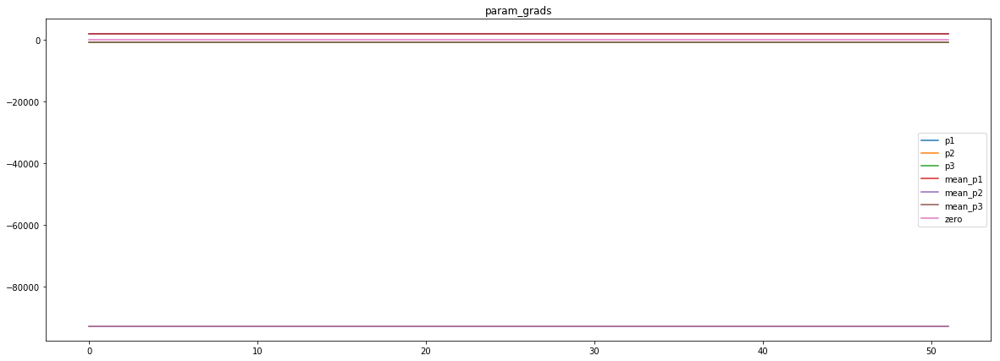

loss rate [0.05862593560081775]
Epoch [58] 
     train_loss[2023.131580059345] 
     eval_train[5.89532958124227] 
     eval_test[5.982870713310231]



aux preds: 0.44990840554237366           1.003198504447937           9.882661819458008
main loss 0.0
aux loss 0.0
jord loss 2063.3098660982573
combined loss 2063.3098660982573 



Parameter containing:
tensor([[0.4499, 1.0032, 9.8827]], requires_grad=True)


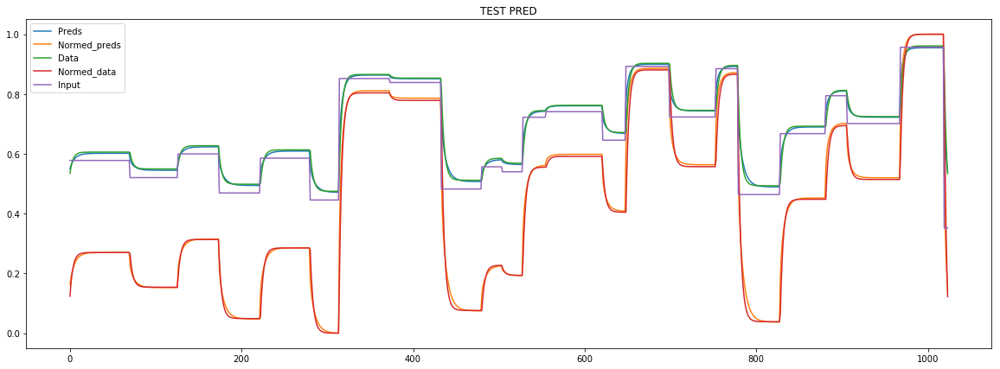

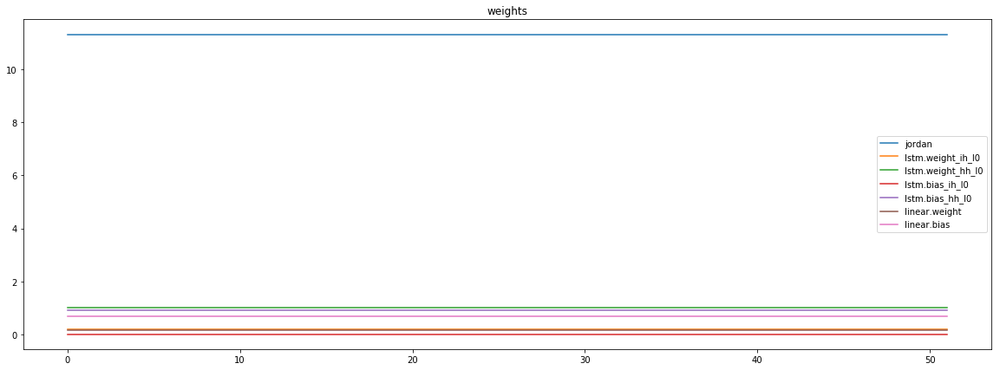

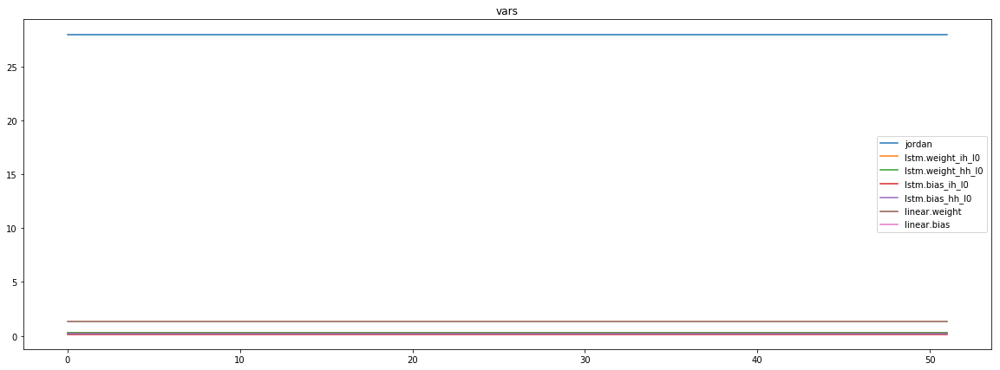

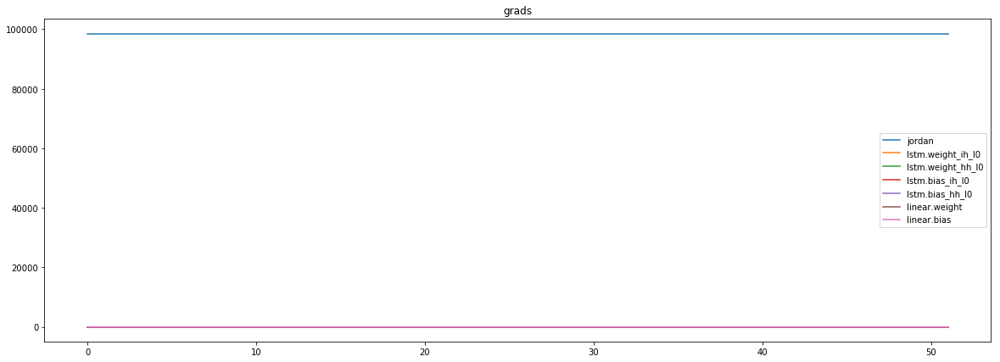

mean_p1 : -15584.50390625
mean_p2 : 113007.9375
mean_p3 : 1124.4451904296875


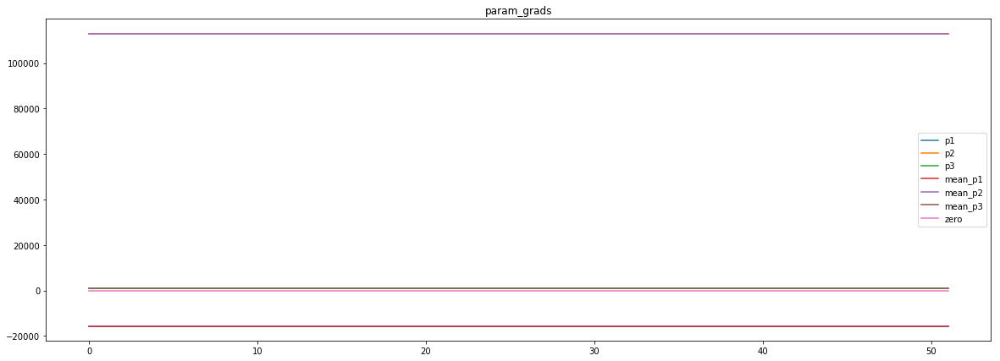

loss rate [-0.12179778050083834]
Epoch [59] 
     train_loss[2063.3098660982573] 
     eval_train[6.9129976029485425] 
     eval_test[7.047102116148877]



aux preds: 0.4480005204677582           1.0029962062835693           9.884939193725586
main loss 0.0
aux loss 0.0
jord loss 2061.1043419471152
combined loss 2061.1043419471152 



Parameter containing:
tensor([[0.4480, 1.0030, 9.8849]], requires_grad=True)


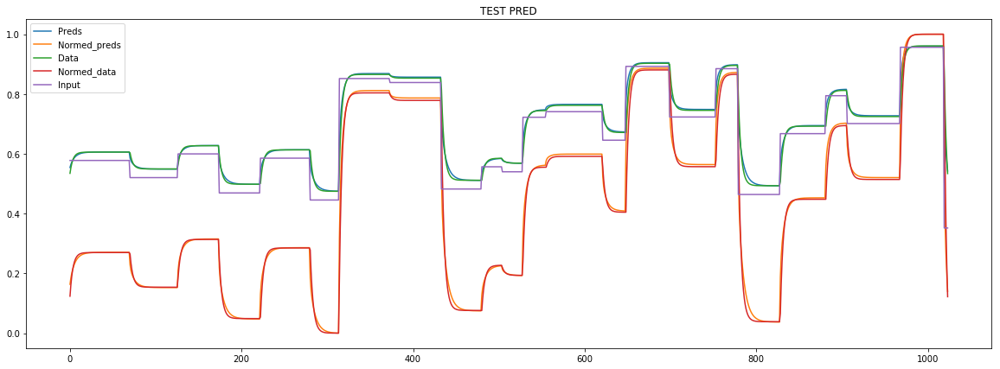

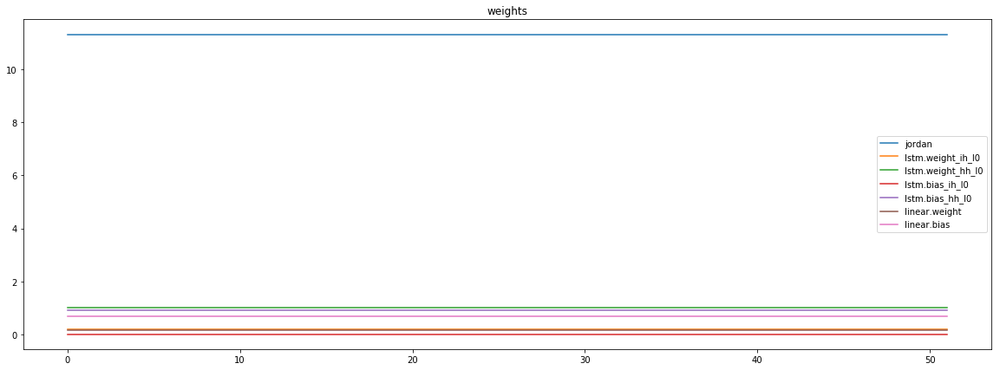

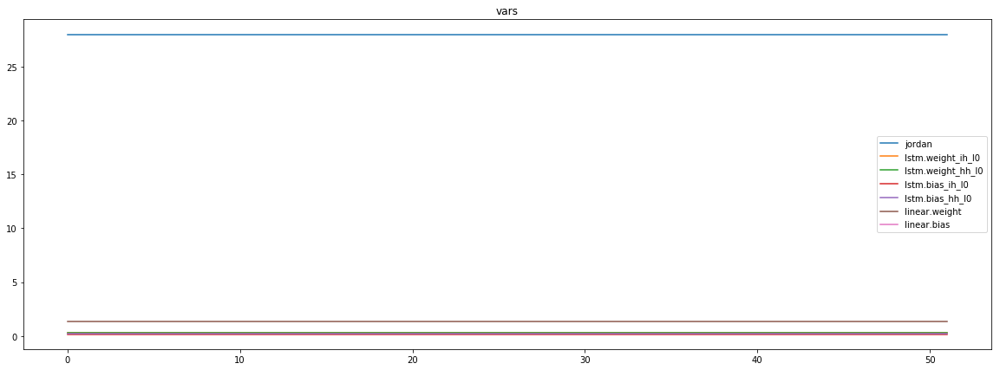

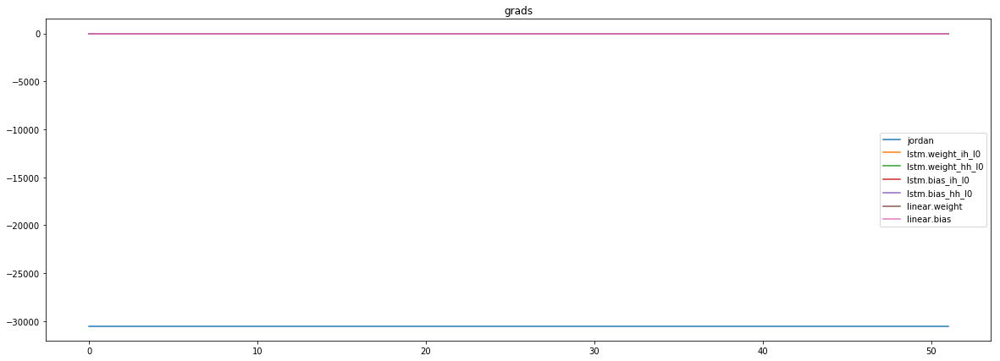

mean_p1 : 14609.3046875
mean_p2 : -44596.26171875
mean_p3 : -509.28704833984375


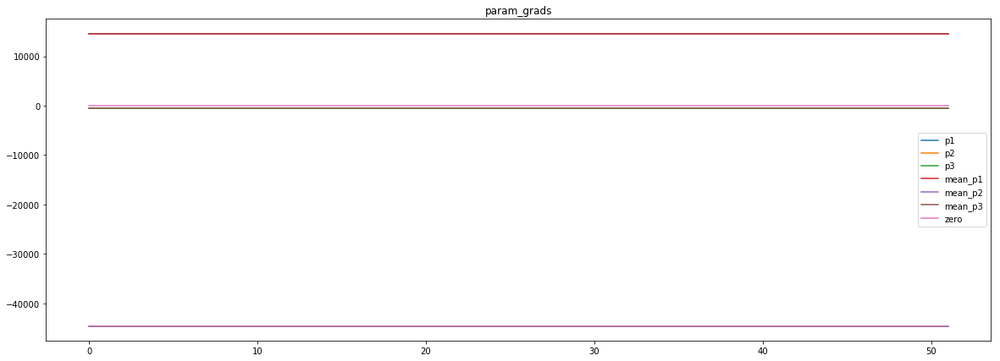

loss rate [0.002435412609707255]
Epoch [60] 
     train_loss[2061.1043419471152] 
     eval_train[6.416986659281135] 
     eval_test[6.463367761530787]



aux preds: 0.4474053680896759           1.0030407905578613           9.893655776977539
main loss 0.0
aux loss 0.0
jord loss 2022.0261371319111
combined loss 2022.0261371319111 



Parameter containing:
tensor([[0.4474, 1.0030, 9.8937]], requires_grad=True)


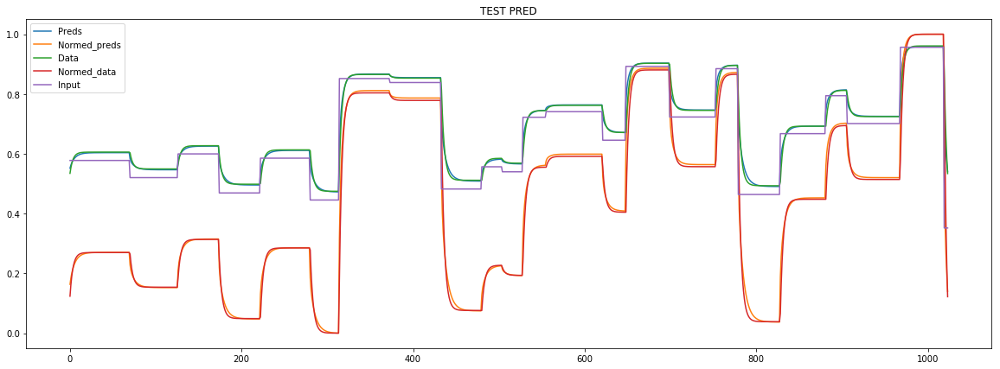

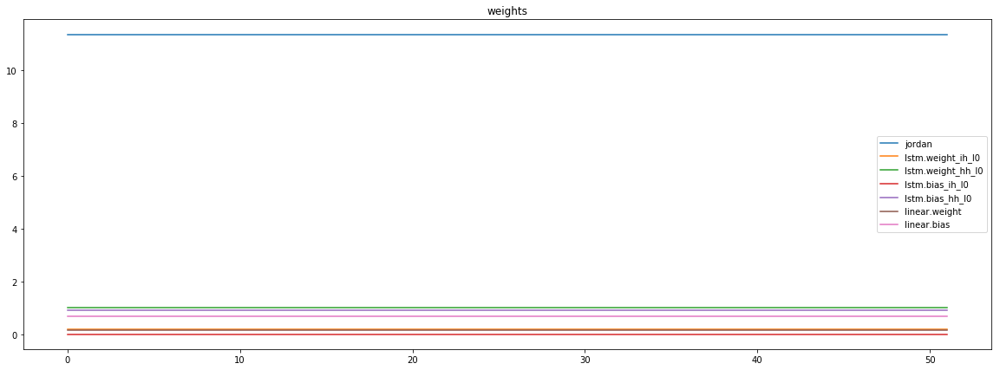

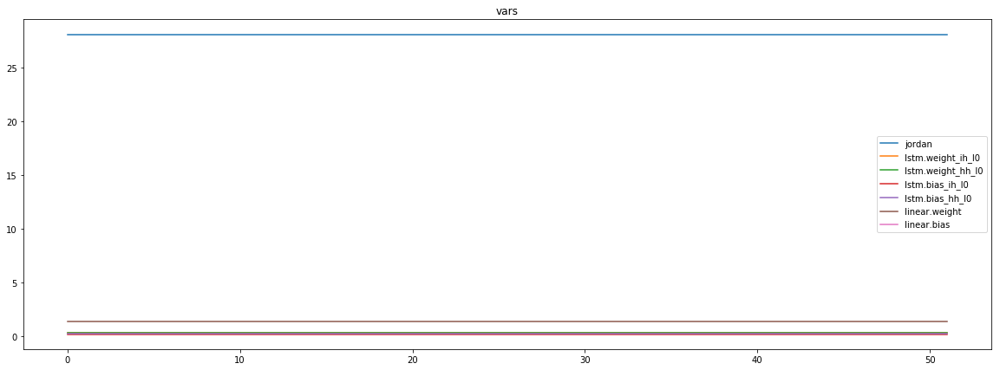

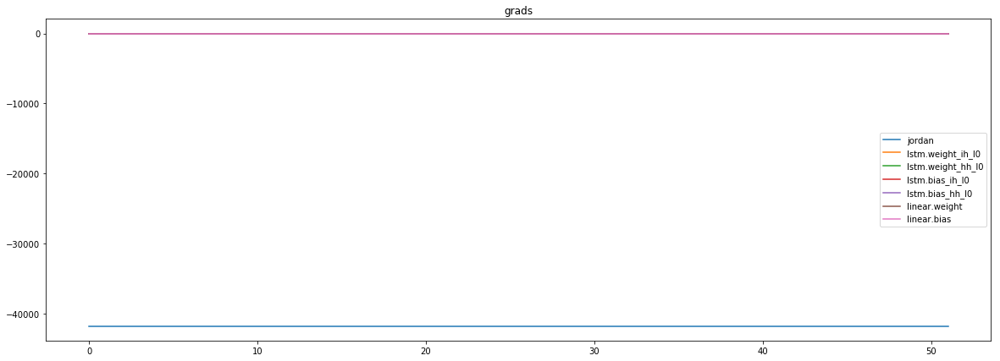

mean_p1 : 4320.19384765625
mean_p2 : -45608.2890625
mean_p3 : -499.5276184082031


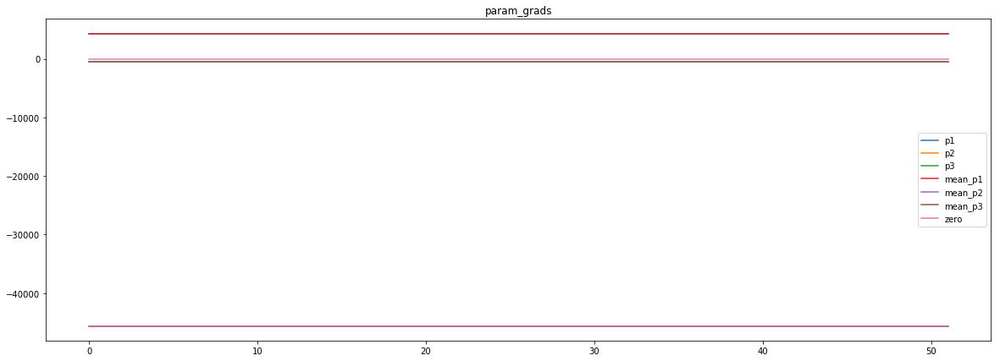

loss rate [0.085441471679915]
Epoch [61] 
     train_loss[2022.0261371319111] 
     eval_train[5.839772740607329] 
     eval_test[5.942600294312632]



aux preds: 0.4505016803741455           0.9988840222358704           9.889571189880371
main loss 0.0
aux loss 0.0
jord loss 2067.733318622296
combined loss 2067.733318622296 



Parameter containing:
tensor([[0.4505, 0.9989, 9.8896]], requires_grad=True)


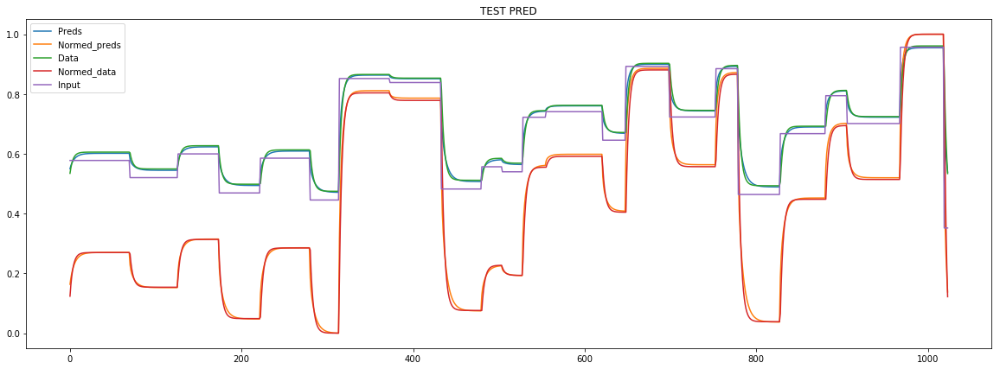

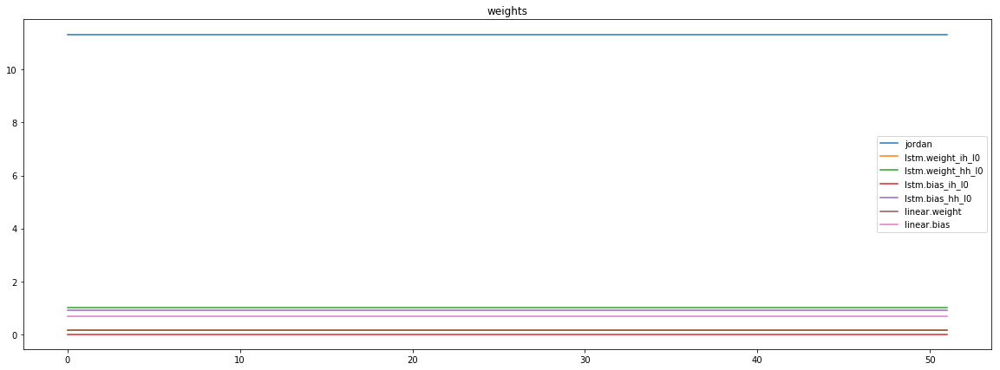

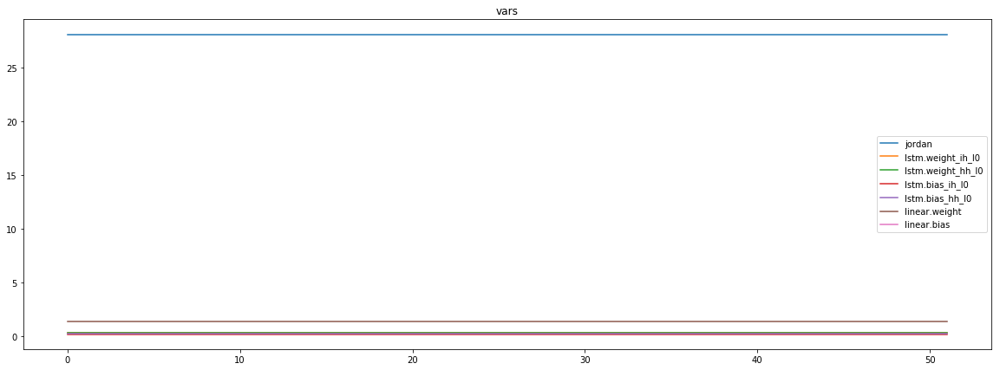

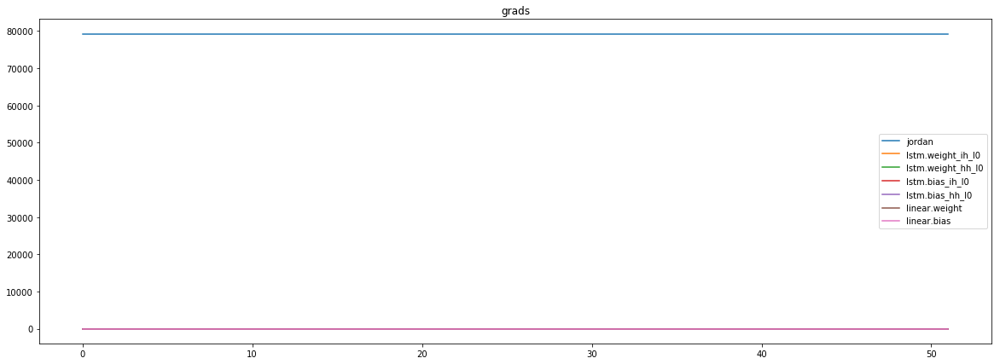

mean_p1 : -18666.716796875
mean_p2 : 96999.171875
mean_p3 : 957.3074340820312


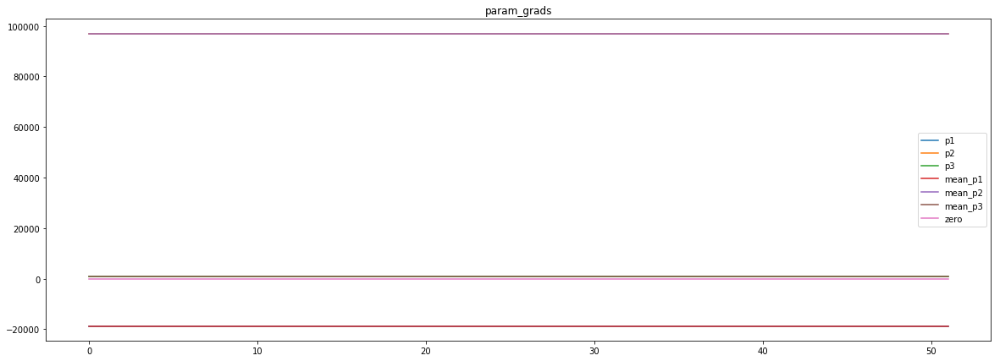

loss rate [-0.08295185886946066]
Epoch [62] 
     train_loss[2067.733318622296] 
     eval_train[6.87225733131233] 
     eval_test[7.022246167825704]



aux preds: 0.44830232858657837           1.001046895980835           9.902615547180176
main loss 0.0
aux loss 0.0
jord loss 2051.8762629582334
combined loss 2051.8762629582334 



Parameter containing:
tensor([[0.4483, 1.0010, 9.9026]], requires_grad=True)


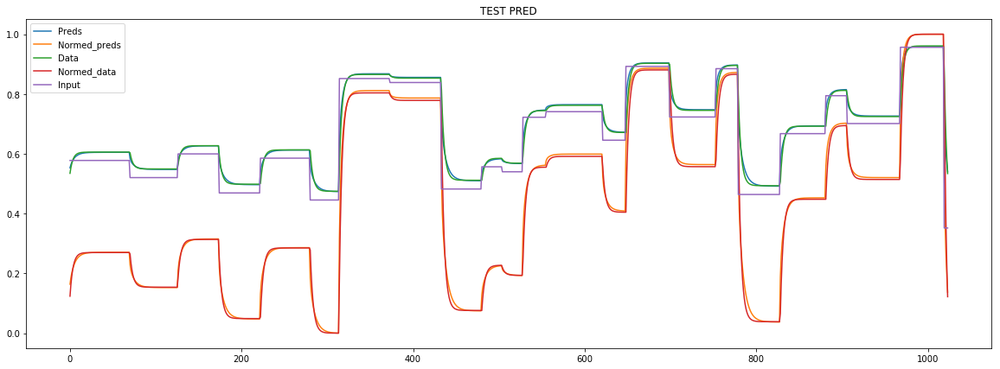

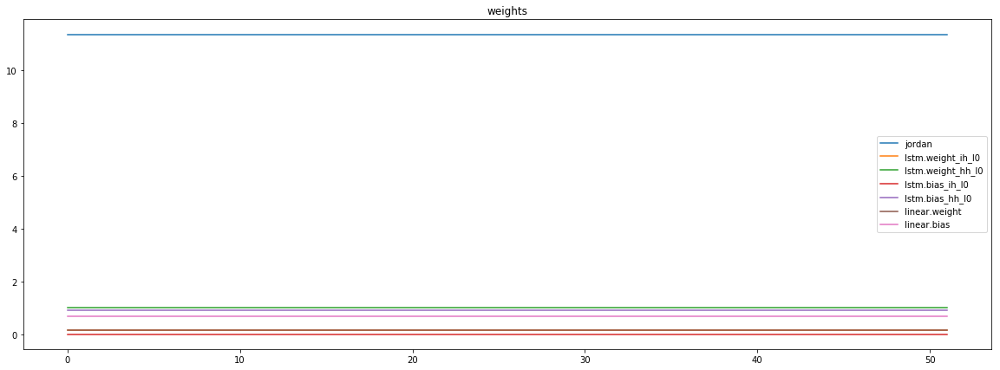

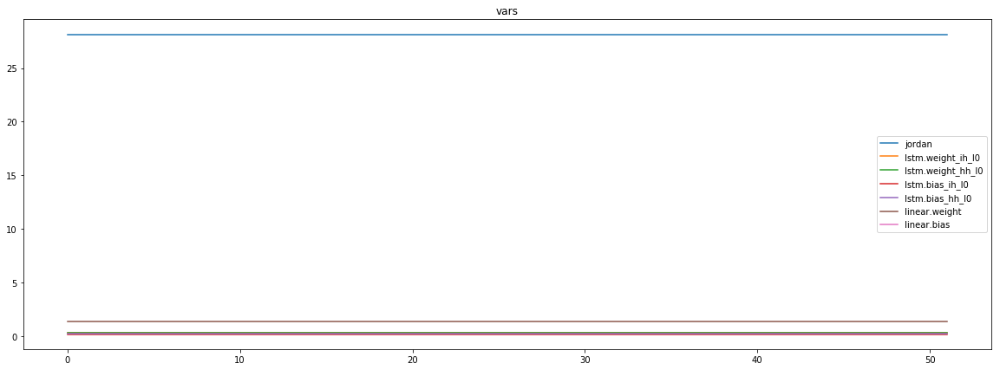

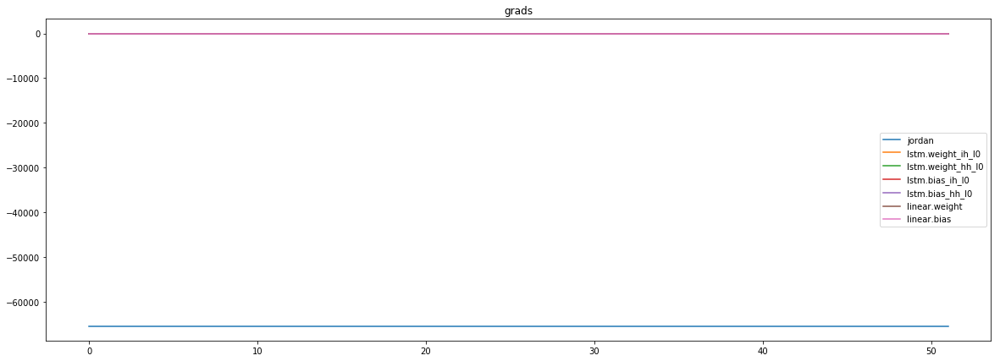

mean_p1 : 9041.6533203125
mean_p2 : -73689.765625
mean_p3 : -740.3184204101562


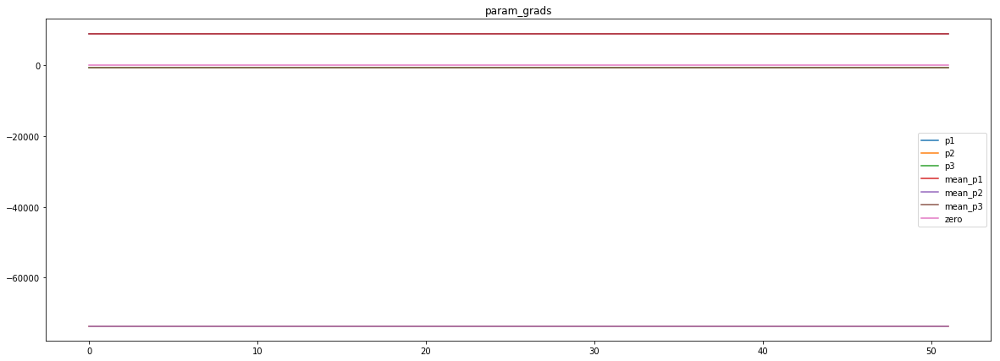

loss rate [0.06465950040576596]
Epoch [63] 
     train_loss[2051.8762629582334] 
     eval_train[5.965990953380242] 
     eval_test[6.057331866063494]



aux preds: 0.4495074450969696           0.9993680119514465           9.904343605041504
main loss 0.0
aux loss 0.0
jord loss 2044.3851881760818
combined loss 2044.3851881760818 



Parameter containing:
tensor([[0.4495, 0.9994, 9.9043]], requires_grad=True)


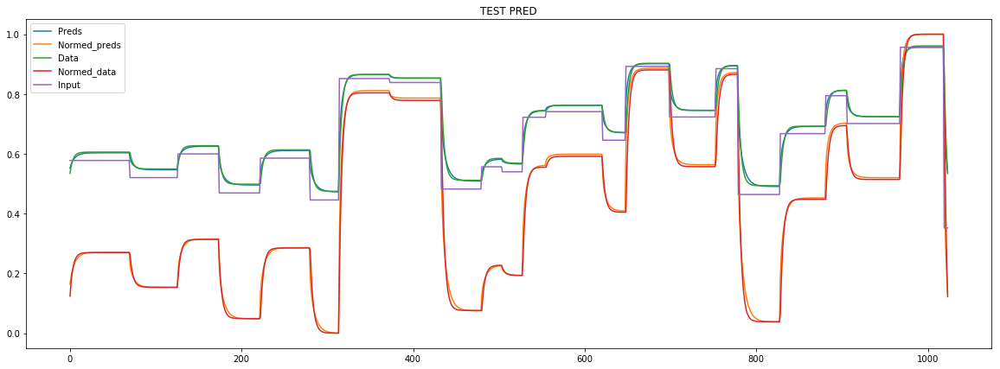

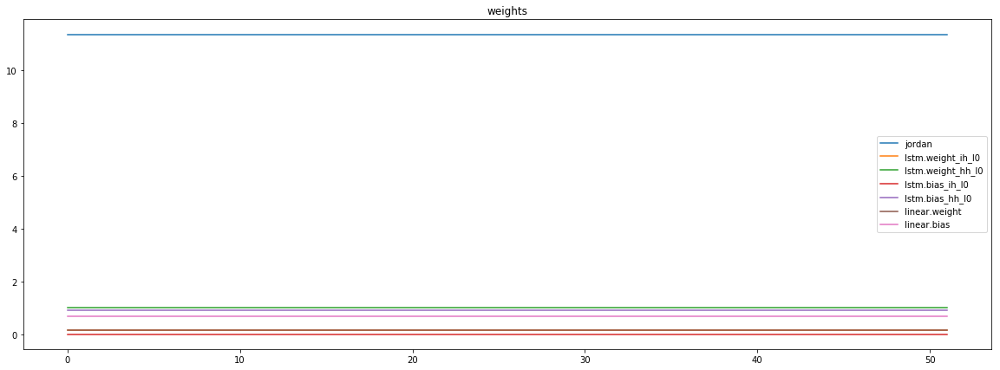

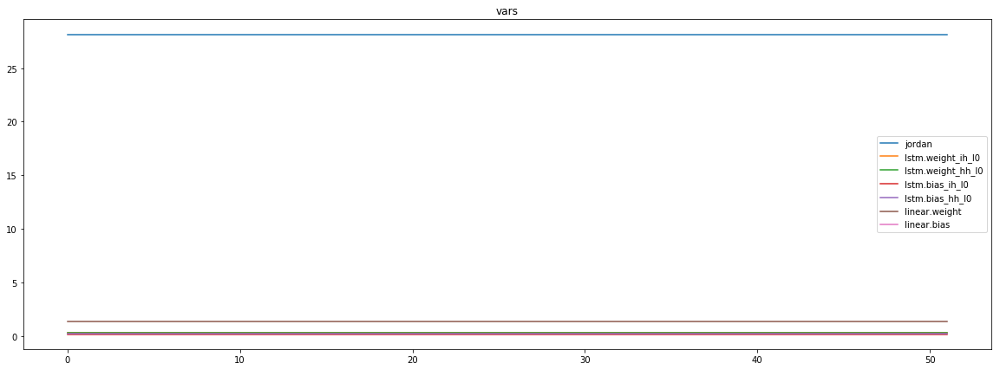

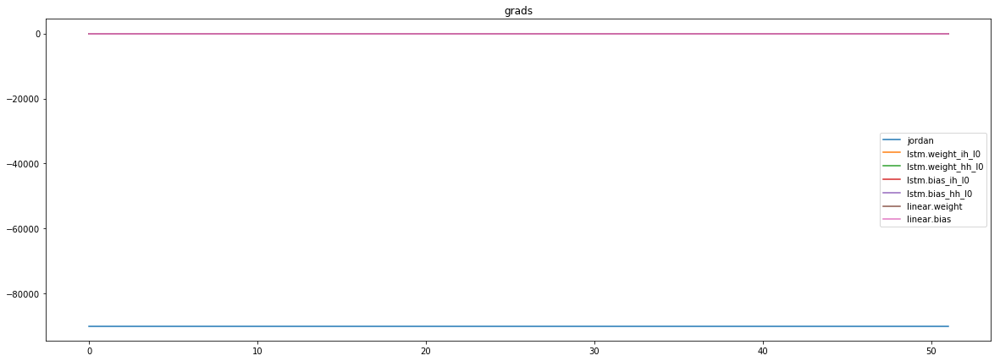

mean_p1 : -804.7522583007812
mean_p2 : -88243.90625
mean_p3 : -861.7503051757812


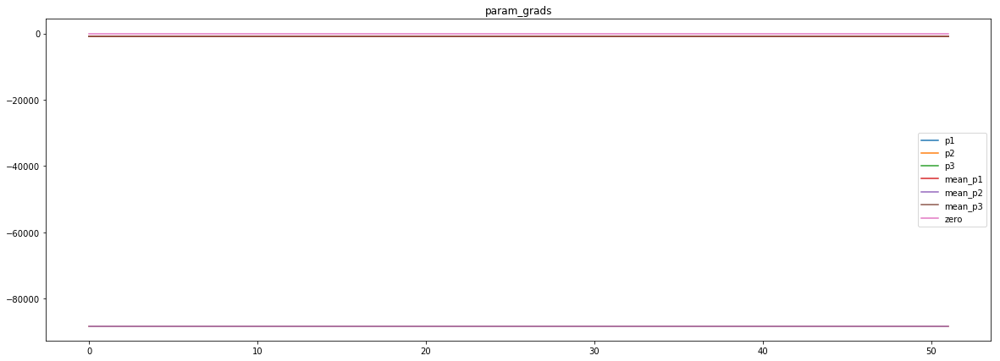

loss rate [0.056970144899622044]
Epoch [64] 
     train_loss[2044.3851881760818] 
     eval_train[5.8683642353235665] 
     eval_test[5.979494024179241]



aux preds: 0.44936561584472656           1.0010385513305664           9.905558586120605
main loss 0.0
aux loss 0.0
jord loss 2044.6698537973257
combined loss 2044.6698537973257 



Parameter containing:
tensor([[0.4494, 1.0010, 9.9056]], requires_grad=True)


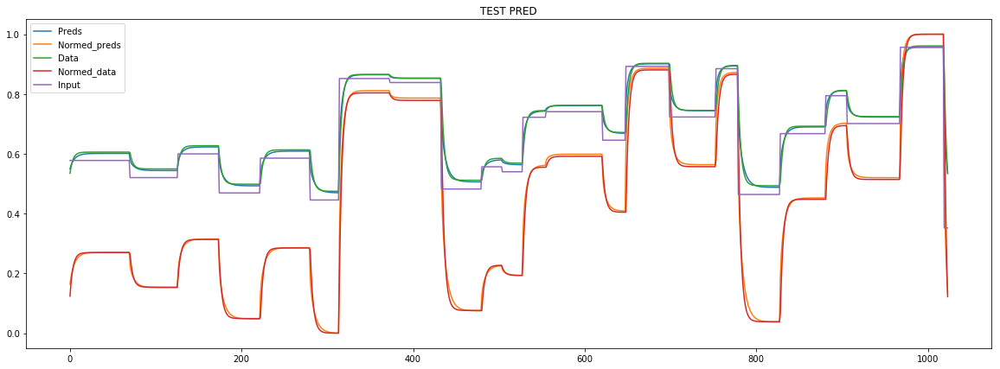

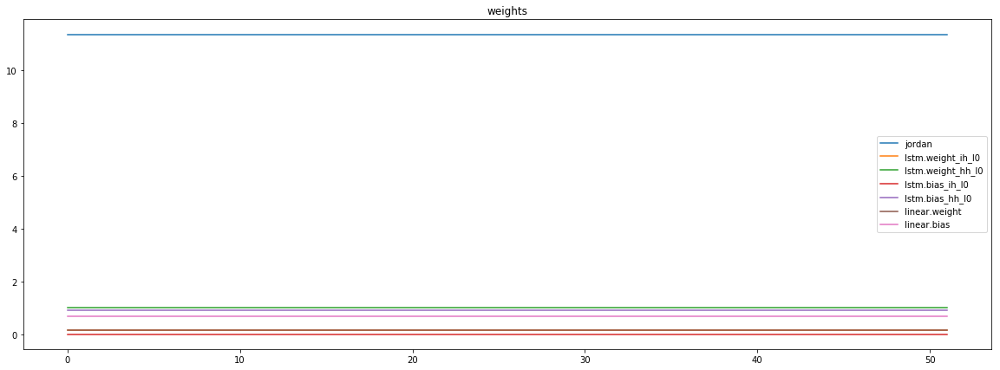

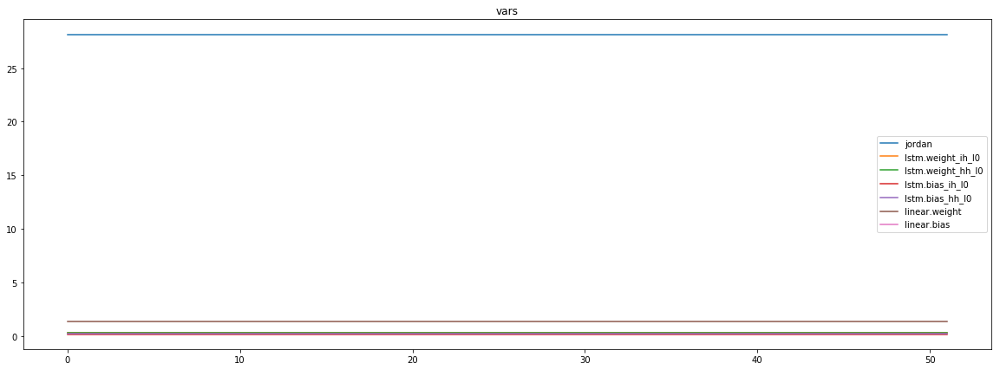

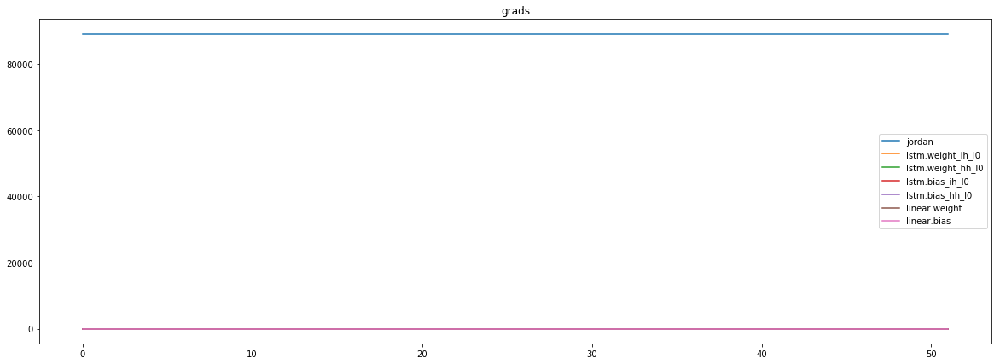

mean_p1 : 4822.6455078125
mean_p2 : 83507.9296875
mean_p3 : 869.2000732421875


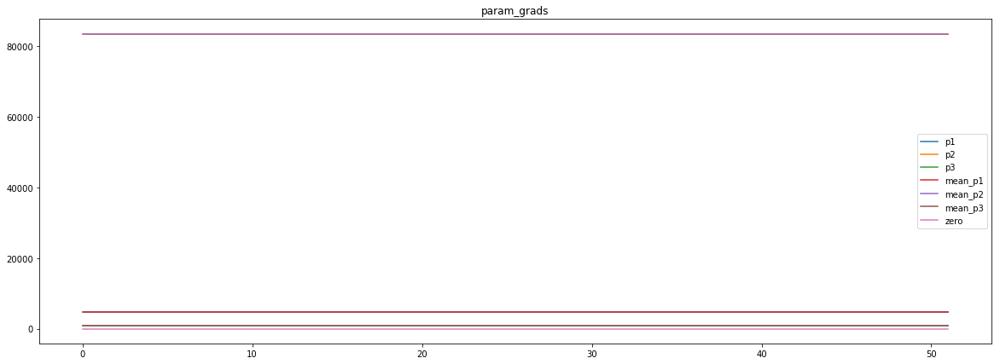

loss rate [-0.050085710361459146]
Epoch [65] 
     train_loss[2044.6698537973257] 
     eval_train[6.531045367074862] 
     eval_test[6.671219740309011]



aux preds: 0.4501633644104004           1.000767469406128           9.907642364501953
main loss 0.0
aux loss 0.0
jord loss 2048.352280836839
combined loss 2048.352280836839 



Parameter containing:
tensor([[0.4502, 1.0008, 9.9076]], requires_grad=True)


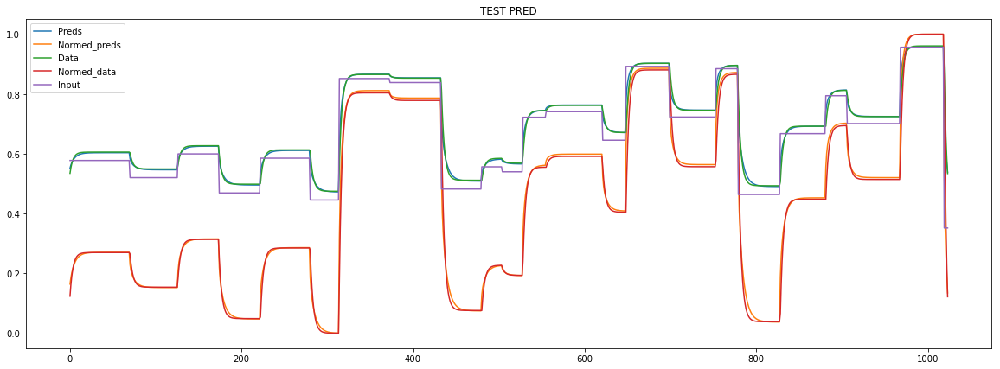

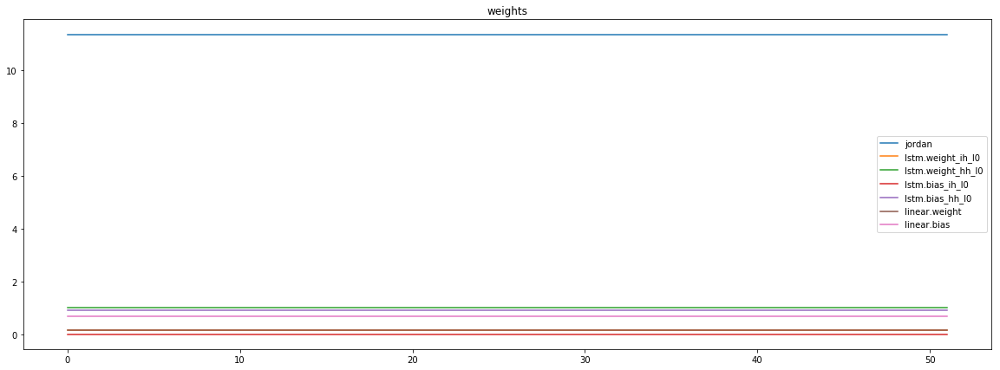

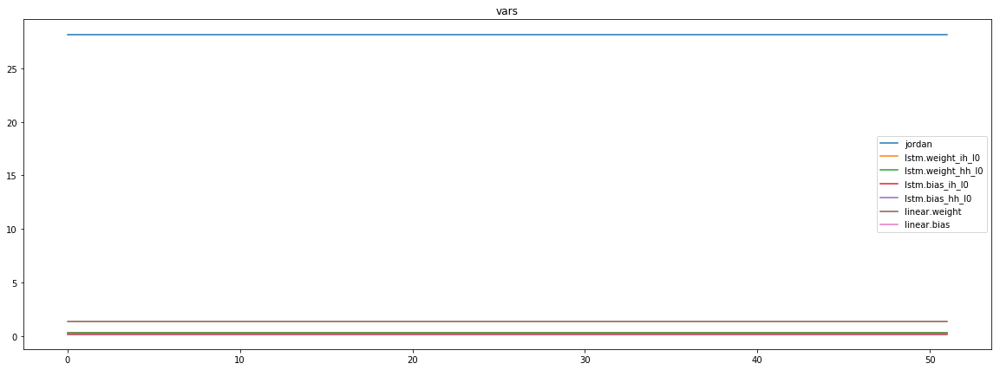

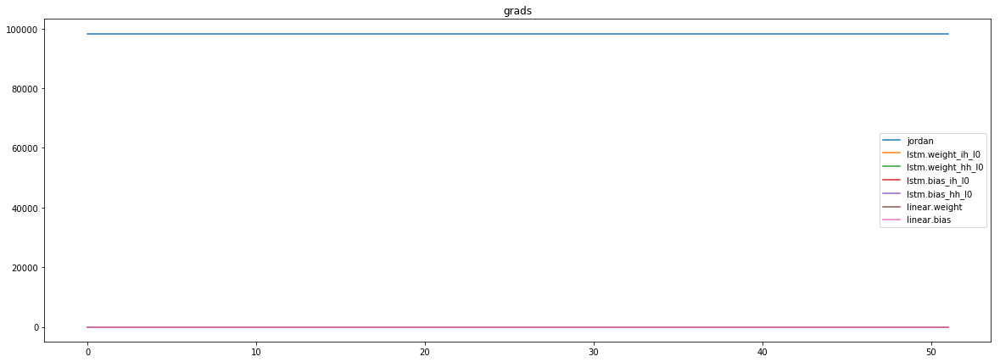

mean_p1 : -14709.662109375
mean_p2 : 111893.8203125
mean_p3 : 1117.4075927734375


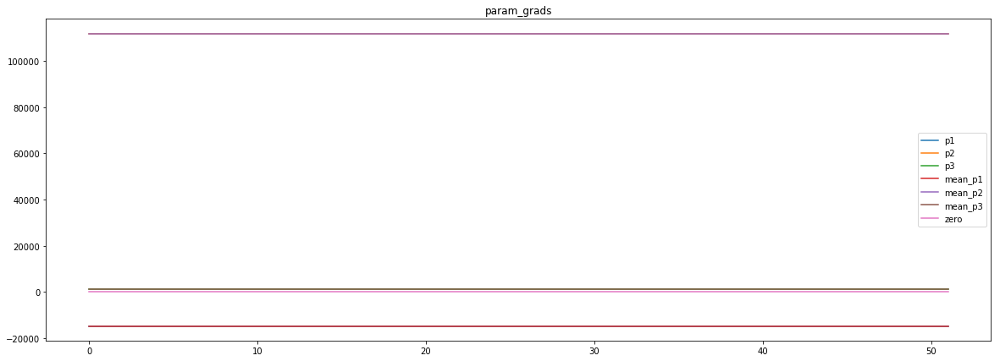

loss rate [0.06190708762703634]
Epoch [66] 
     train_loss[2048.352280836839] 
     eval_train[5.737237019262886] 
     eval_test[5.849961670123528]



aux preds: 0.4461289346218109           1.0013190507888794           9.902368545532227
main loss 0.0
aux loss 0.0
jord loss 2064.662860576923
combined loss 2064.662860576923 



Parameter containing:
tensor([[0.4461, 1.0013, 9.9024]], requires_grad=True)


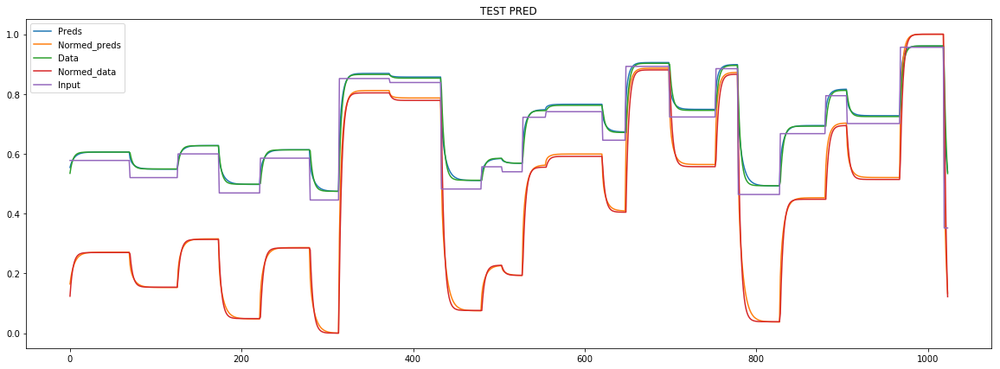

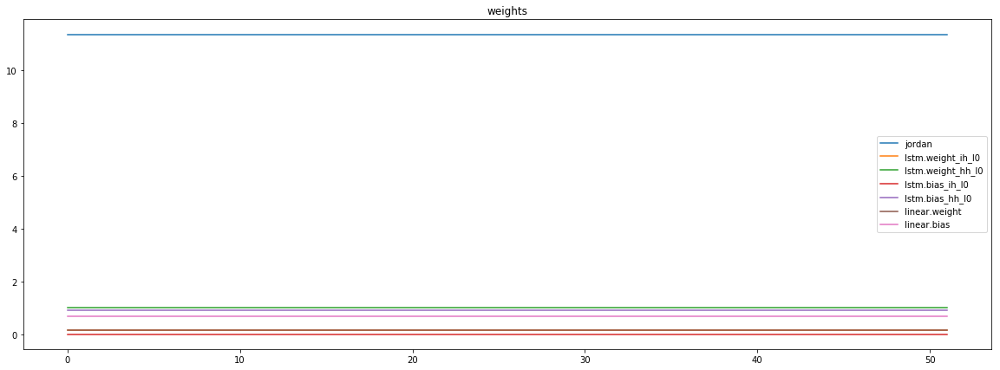

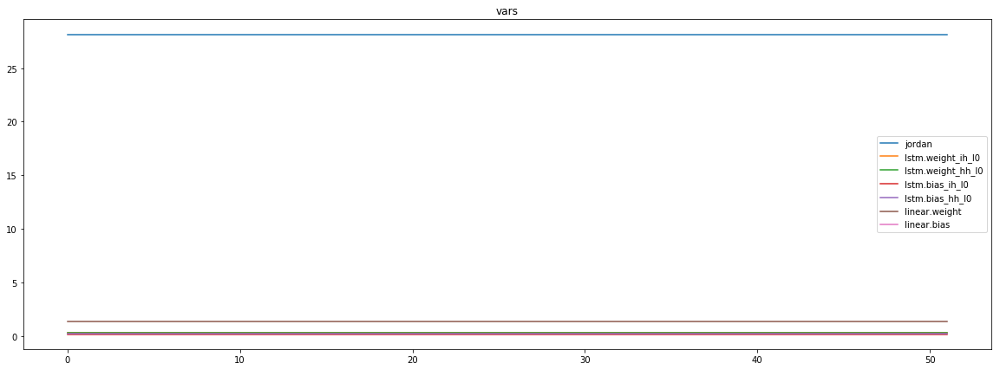

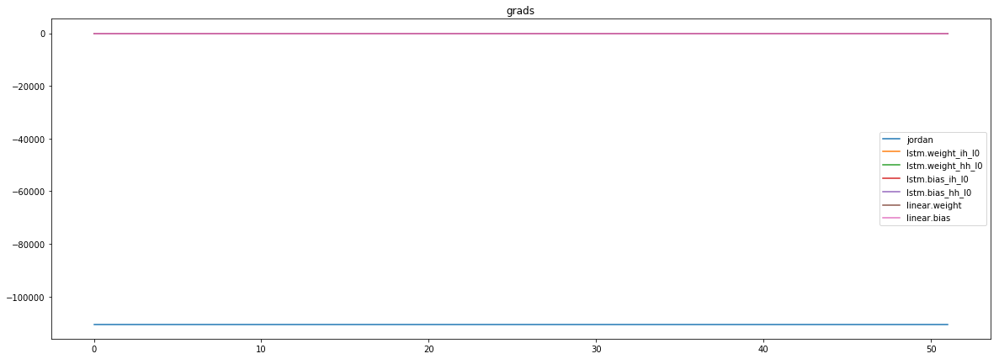

mean_p1 : -24078.662109375
mean_p2 : -85579.3125
mean_p3 : -793.10009765625


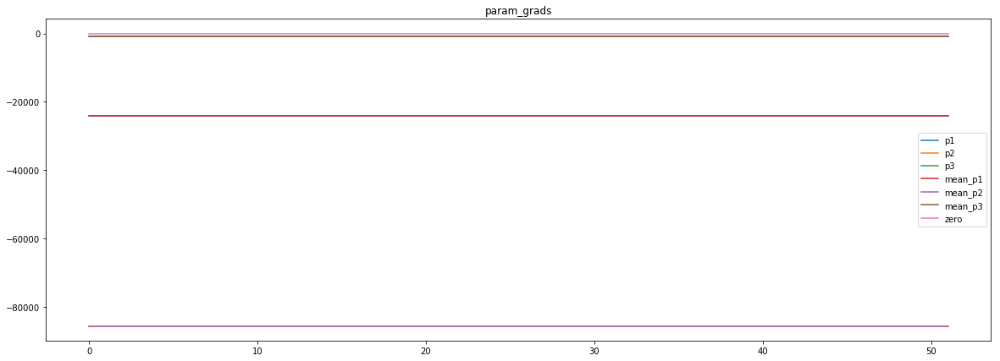

loss rate [-0.04429687321703479]
Epoch [67] 
     train_loss[2064.662860576923] 
     eval_train[6.344269675211622] 
     eval_test[6.440065836256095]



aux preds: 0.44603365659713745           1.0023674964904785           9.90510082244873
main loss 0.0
aux loss 0.0
jord loss 2045.6495596078726
combined loss 2045.6495596078726 



Parameter containing:
tensor([[0.4460, 1.0024, 9.9051]], requires_grad=True)


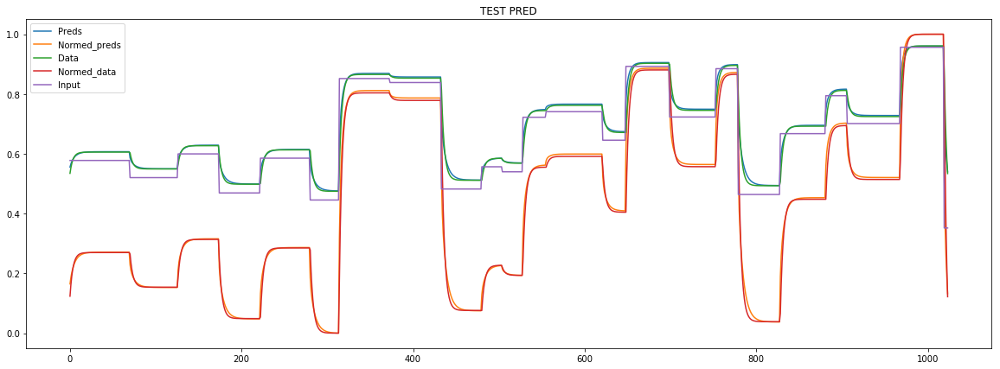

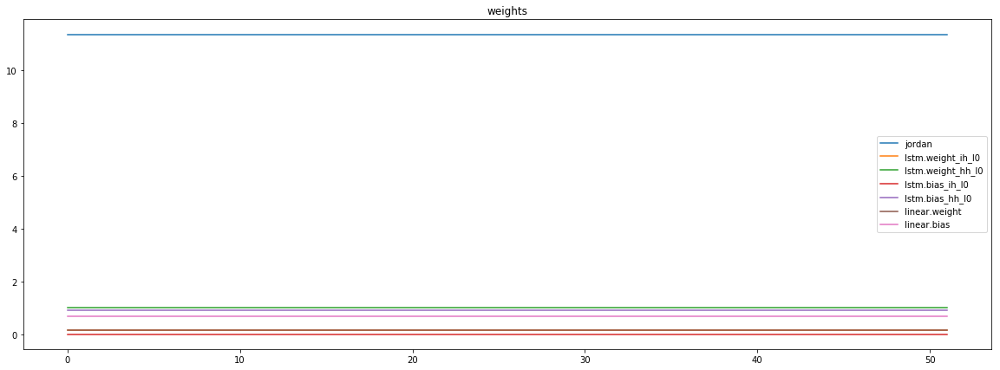

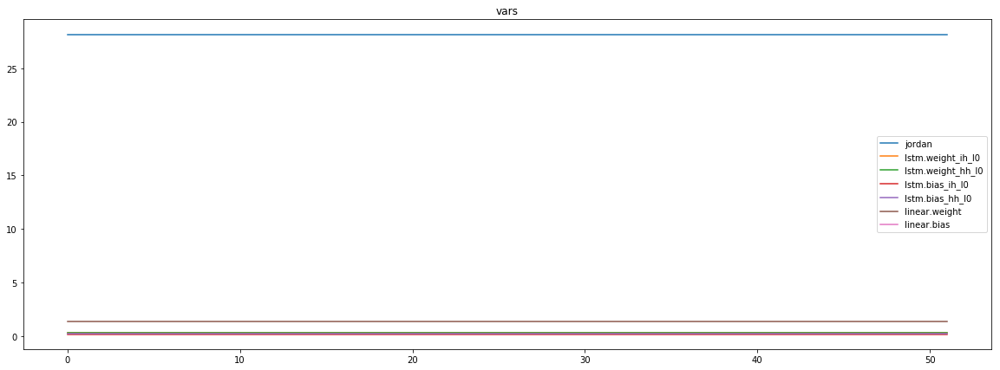

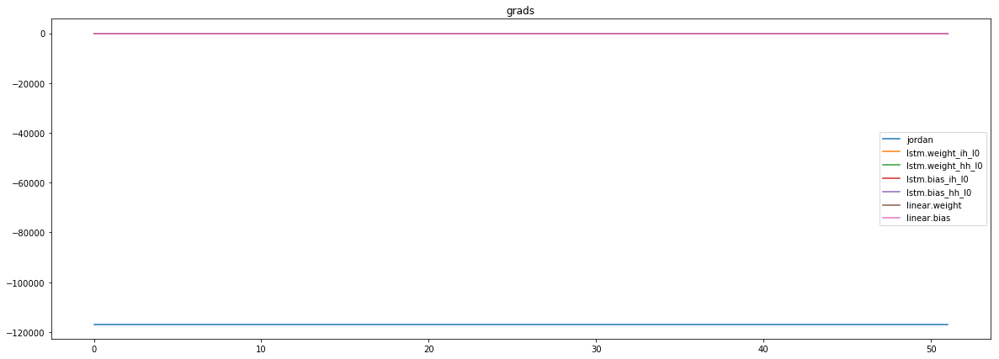

mean_p1 : -28236.56640625
mean_p2 : -87766.6484375
mean_p3 : -807.275146484375


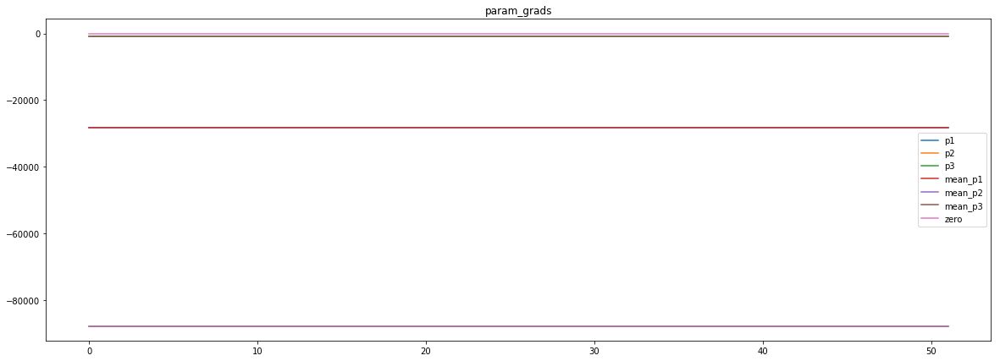

loss rate [-0.10105971056778595]
Epoch [68] 
     train_loss[2045.6495596078726] 
     eval_train[6.8991212871265954] 
     eval_test[6.959155135147739]



aux preds: 0.44453445076942444           1.0014969110488892           9.904030799865723
main loss 0.0
aux loss 0.0
jord loss 2071.3670889047476
combined loss 2071.3670889047476 



Parameter containing:
tensor([[0.4445, 1.0015, 9.9040]], requires_grad=True)


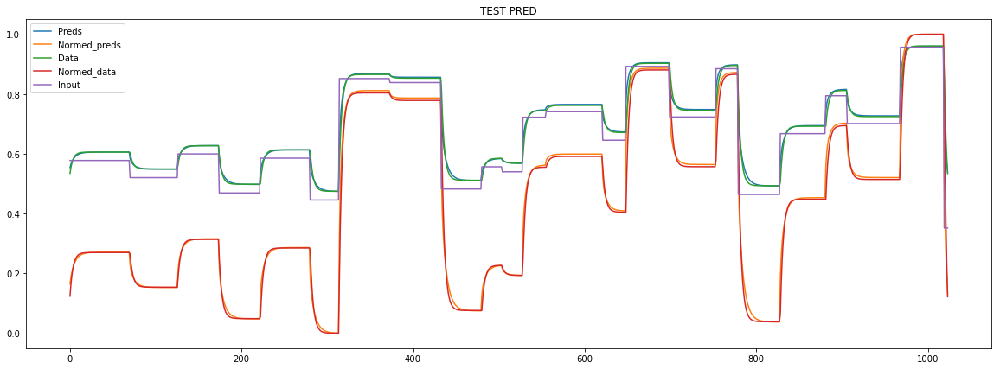

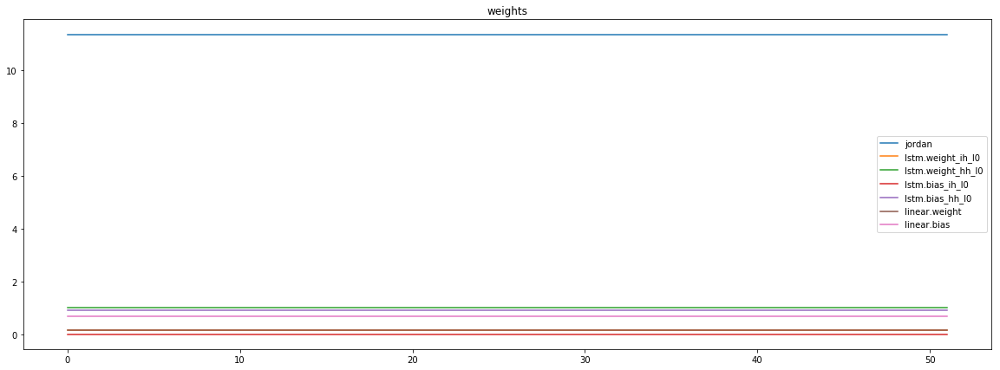

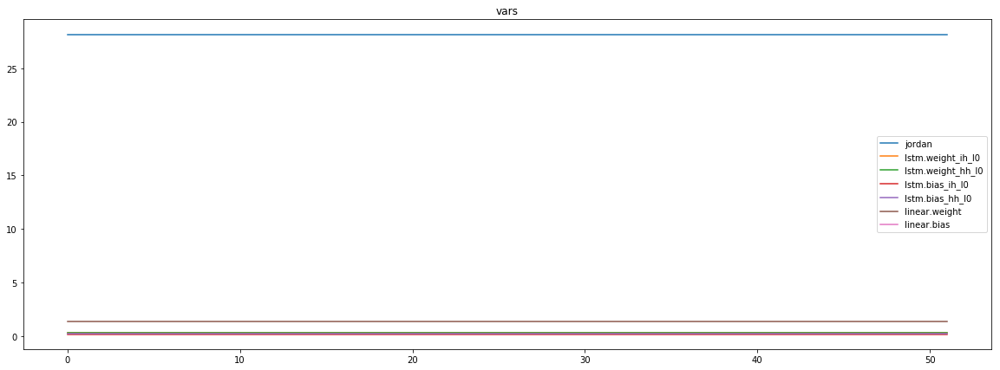

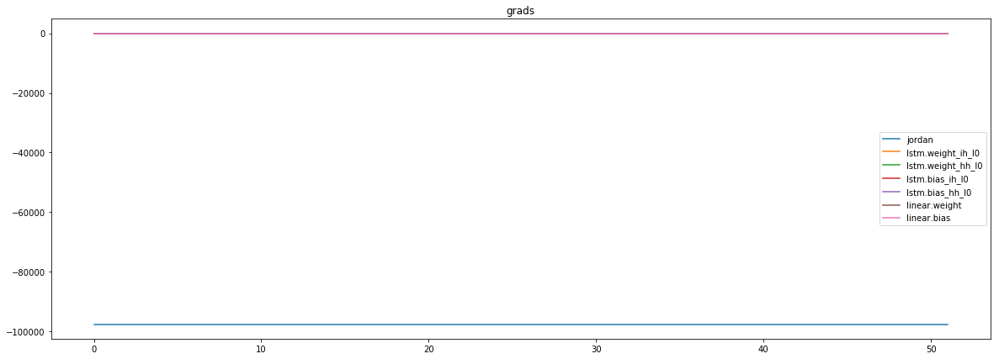

mean_p1 : -8197.392578125
mean_p2 : -88480.6796875
mean_p3 : -848.8831787109375


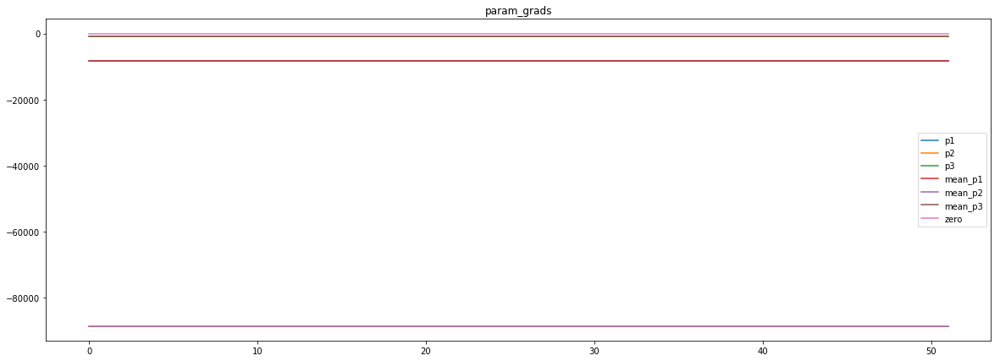

loss rate [0.024942184668770406]
Epoch [69] 
     train_loss[2071.3670889047476] 
     eval_train[6.174198374391731] 
     eval_test[6.256355324453166]



aux preds: 0.4499514698982239           0.9997892379760742           9.908367156982422
main loss 0.0
aux loss 0.0
jord loss 2024.8387028620793
combined loss 2024.8387028620793 



Parameter containing:
tensor([[0.4500, 0.9998, 9.9084]], requires_grad=True)


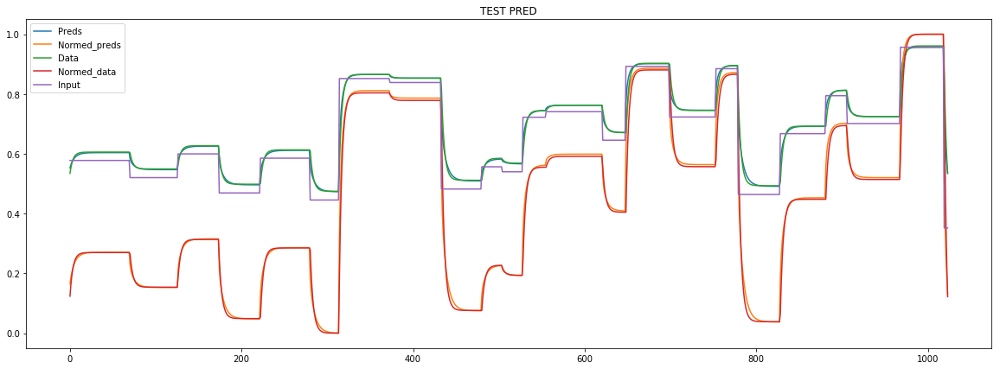

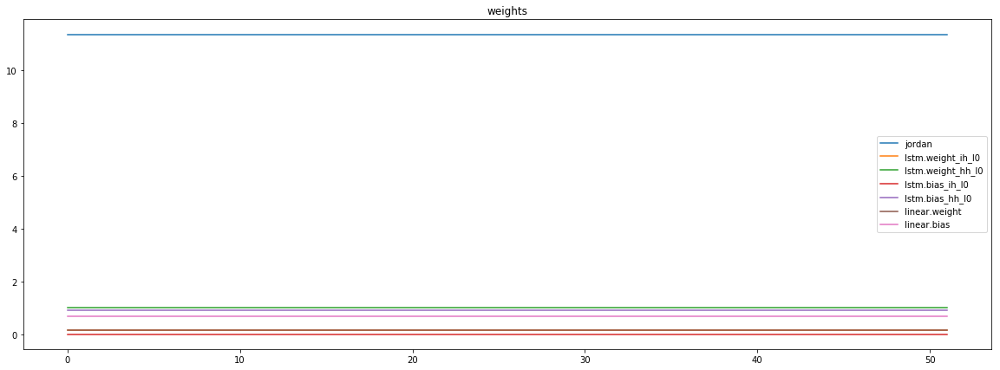

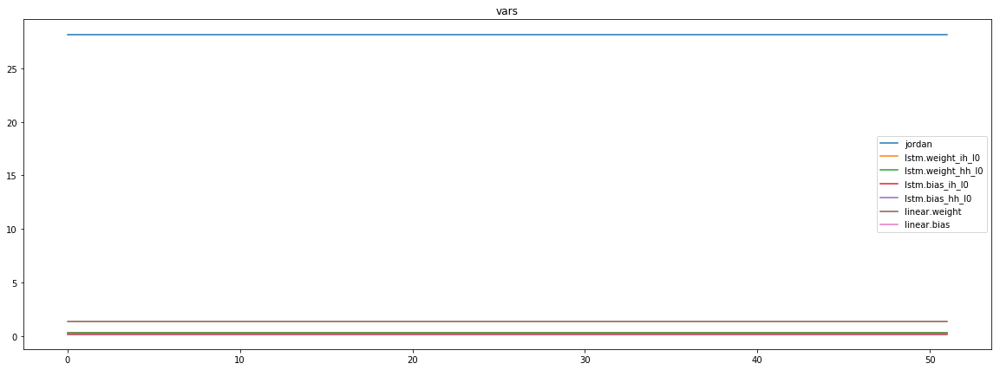

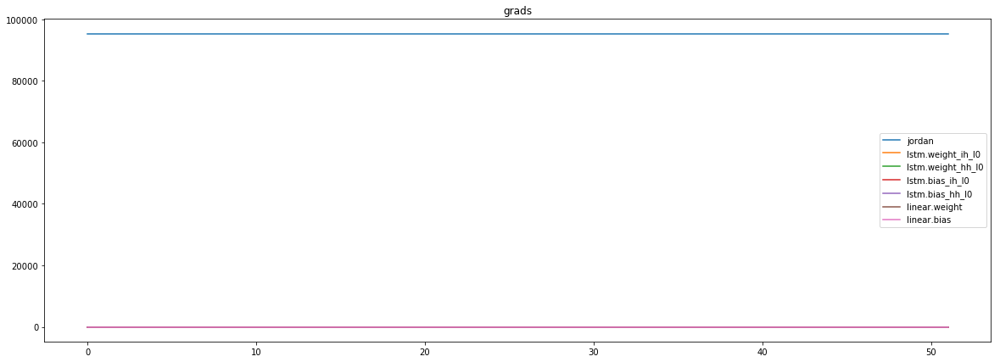

mean_p1 : -10011.04296875
mean_p2 : 104351.4921875
mean_p3 : 1055.7052001953125


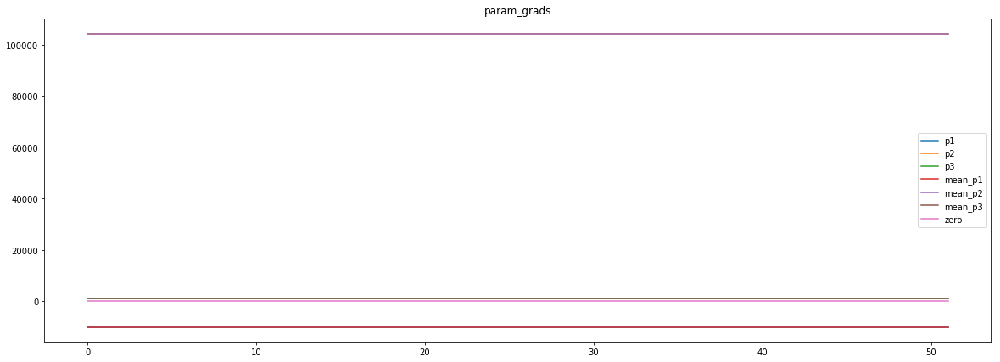

loss rate [0.10562607589990702]
Epoch [70] 
     train_loss[2024.8387028620793] 
     eval_train[5.737000018694045] 
     eval_test[5.859811634058133]



aux preds: 0.44846951961517334           0.9997150301933289           9.907230377197266
main loss 0.0
aux loss 0.0
jord loss 2072.9801823542666
combined loss 2072.9801823542666 



Parameter containing:
tensor([[0.4485, 0.9997, 9.9072]], requires_grad=True)


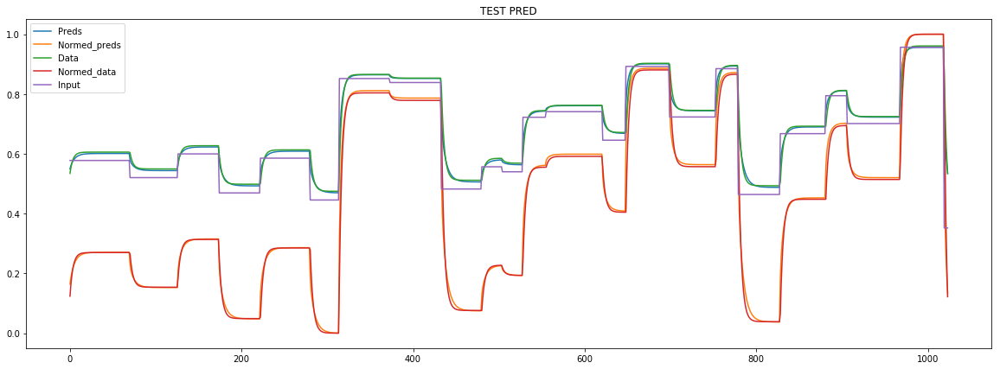

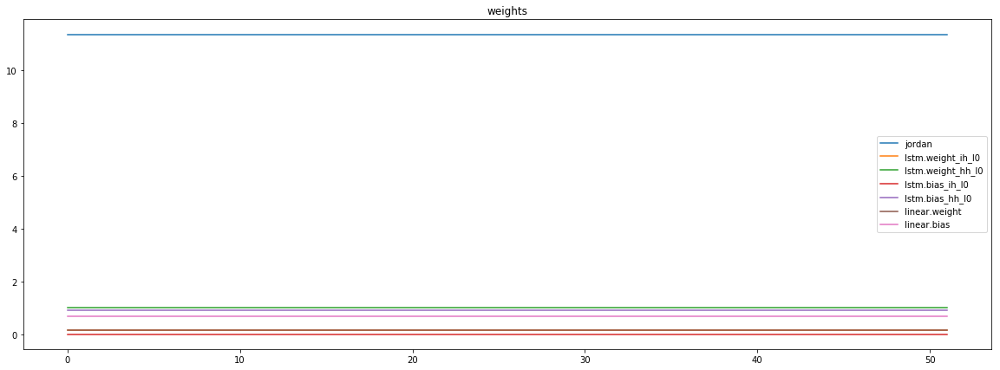

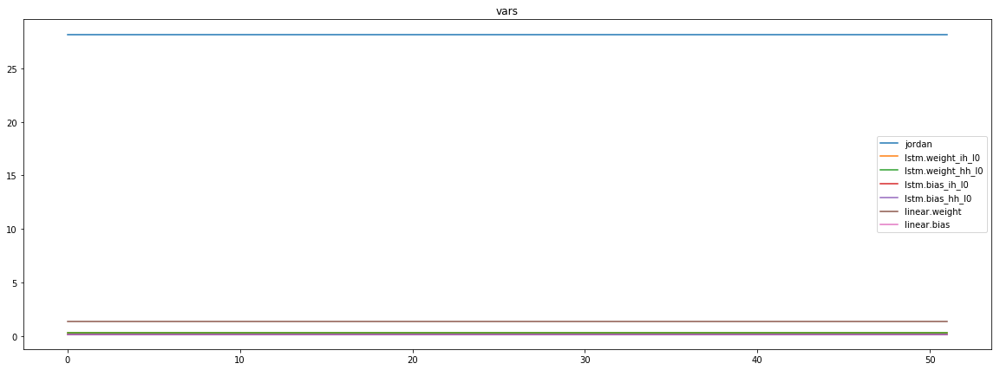

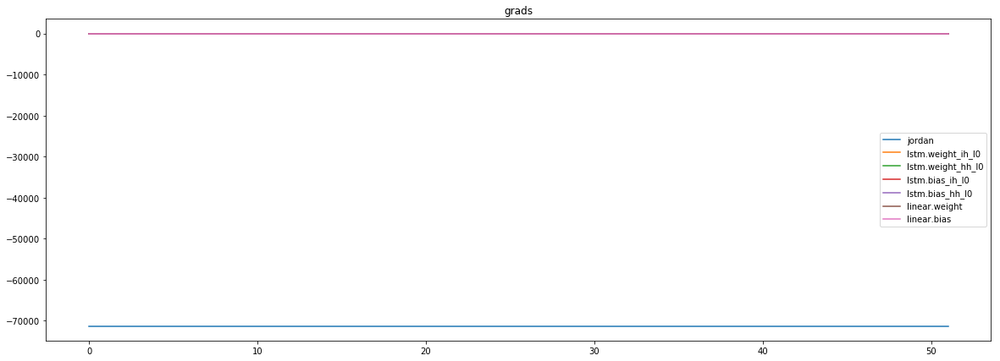

mean_p1 : 17693.69140625
mean_p2 : -88054.515625
mean_p3 : -905.3951416015625


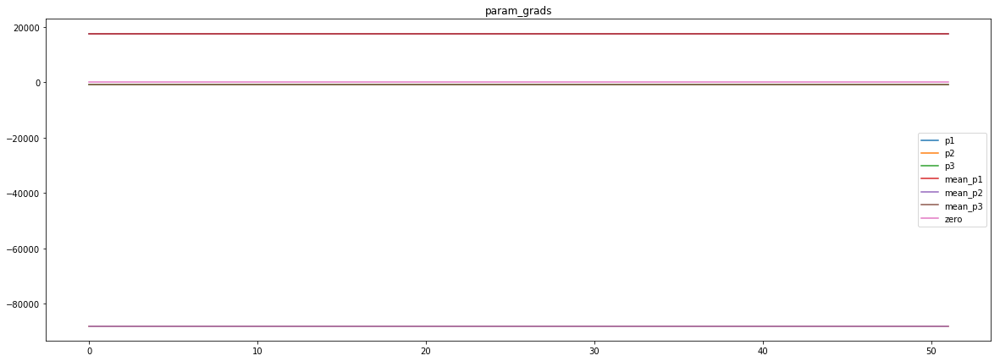

loss rate [-0.06560167498760716]
Epoch [71] 
     train_loss[2072.9801823542666] 
     eval_train[6.6218972942644125] 
     eval_test[6.775565057977061]



aux preds: 0.44999146461486816           1.001380443572998           9.910964012145996
main loss 0.0
aux loss 0.0
jord loss 2043.8952096792368
combined loss 2043.8952096792368 



Parameter containing:
tensor([[0.4500, 1.0014, 9.9110]], requires_grad=True)


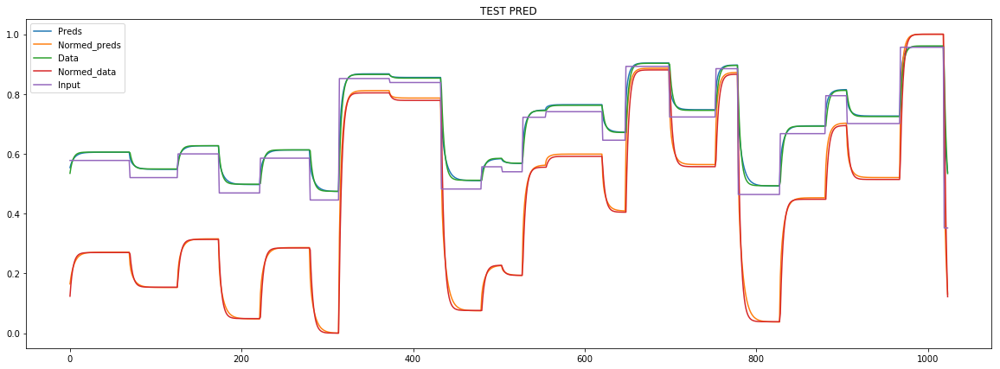

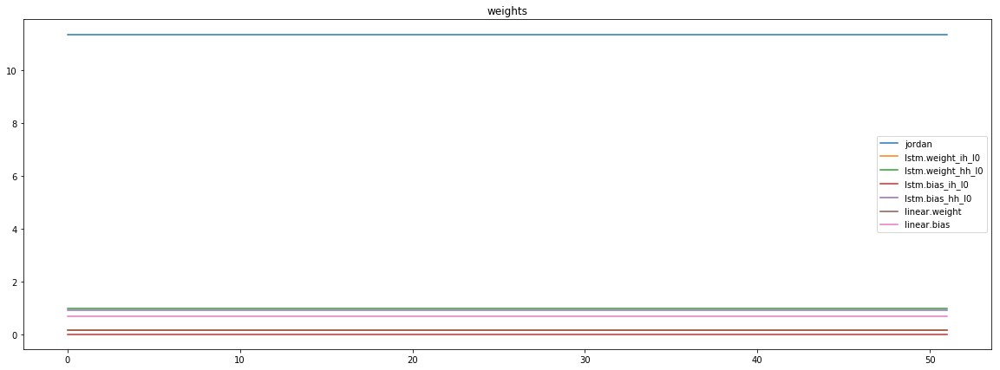

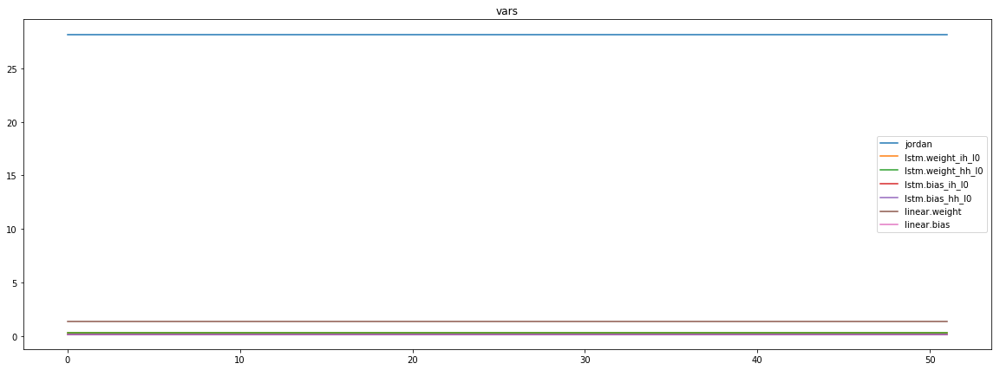

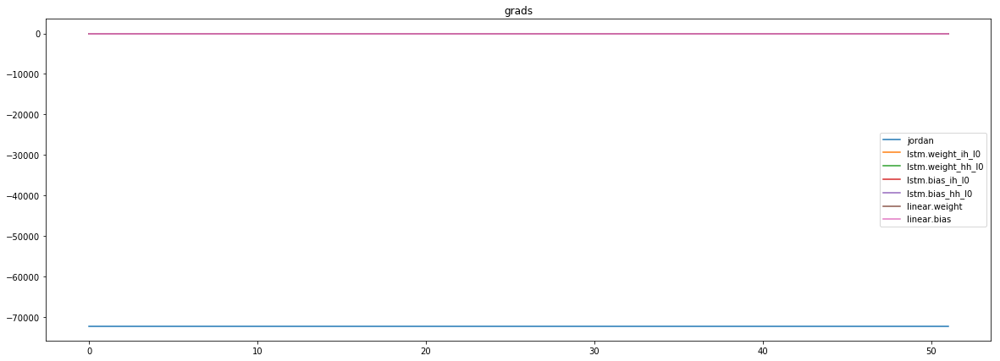

mean_p1 : 17348.53125
mean_p2 : -88709.3203125
mean_p3 : -909.51904296875


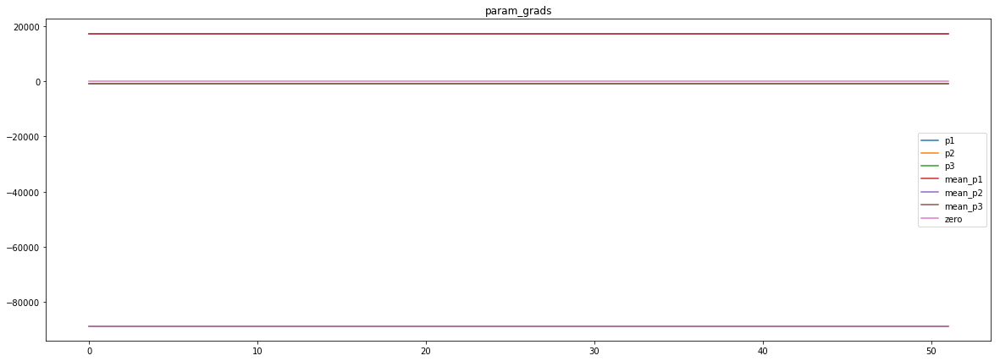

loss rate [0.05166529678502807]
Epoch [72] 
     train_loss[2043.8952096792368] 
     eval_train[5.879553515582722] 
     eval_test[5.971895025024423]



aux preds: 0.4495881497859955           0.9998176097869873           9.90926456451416
main loss 0.0
aux loss 0.0
jord loss 2043.8758732722356
combined loss 2043.8758732722356 



Parameter containing:
tensor([[0.4496, 0.9998, 9.9093]], requires_grad=True)


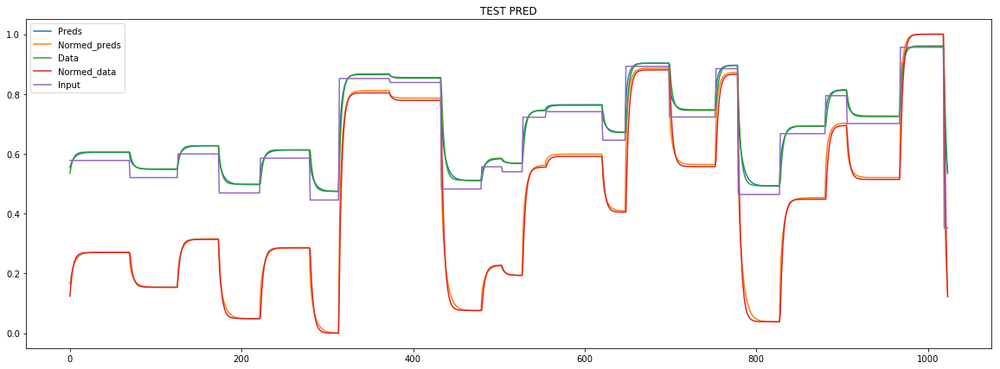

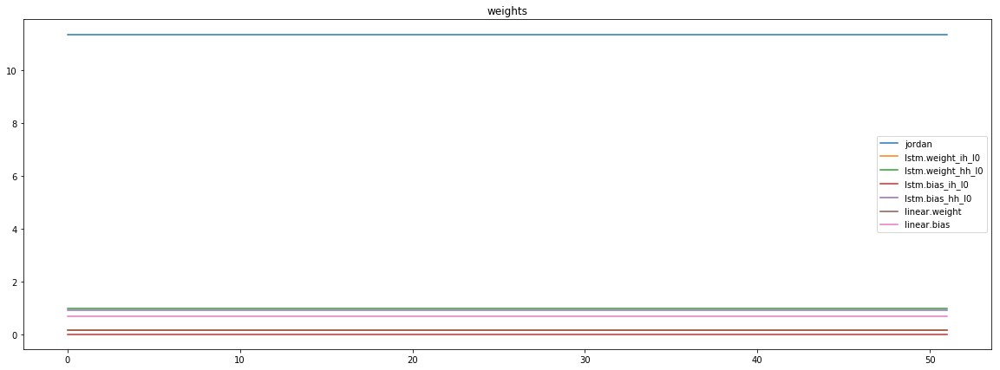

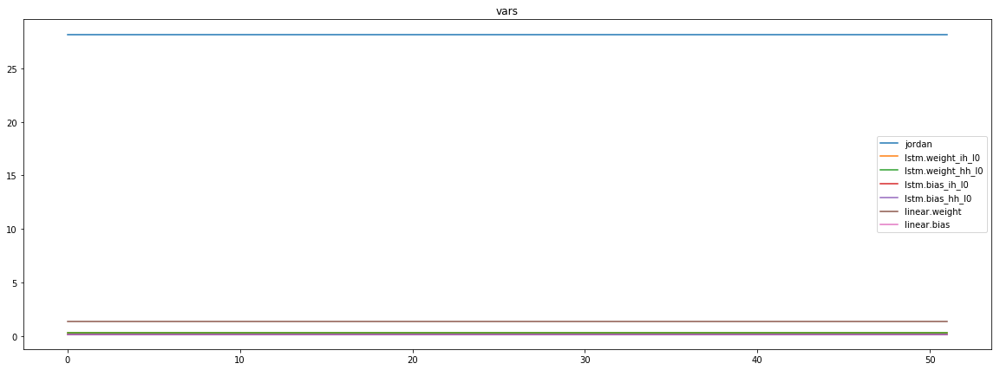

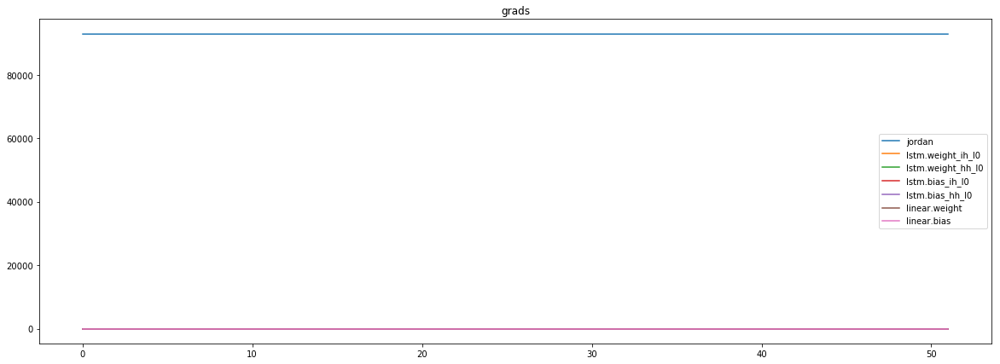

mean_p1 : -6584.4267578125
mean_p2 : 98490.84375
mean_p3 : 1007.3980102539062


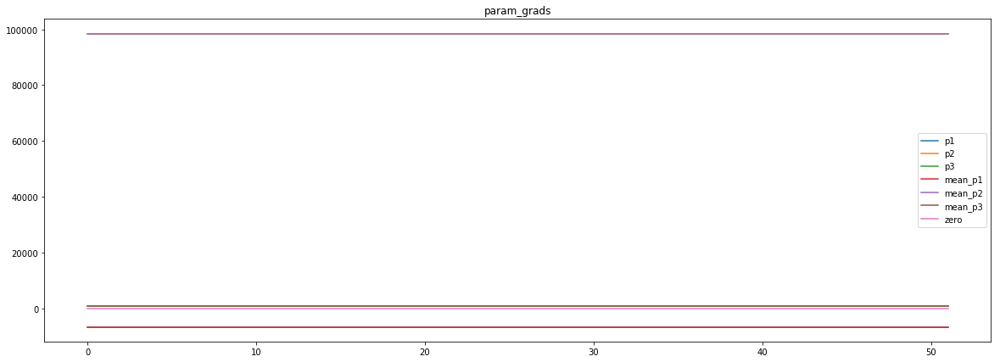

loss rate [0.05194117100993012]
Epoch [73] 
     train_loss[2043.8758732722356] 
     eval_train[5.785382102989108] 
     eval_test[5.880262744925196]



aux preds: 0.44699716567993164           0.9998436570167542           9.913330078125
main loss 0.0
aux loss 0.0
jord loss 2052.2224872295674
combined loss 2052.2224872295674 



Parameter containing:
tensor([[0.4470, 0.9998, 9.9133]], requires_grad=True)


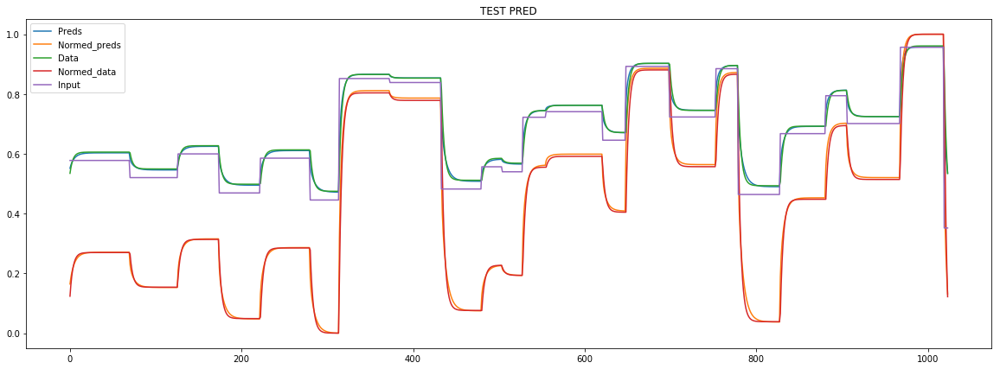

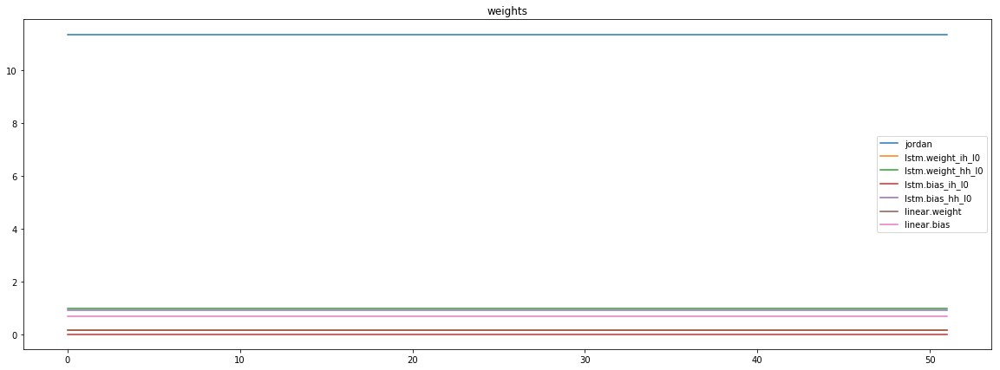

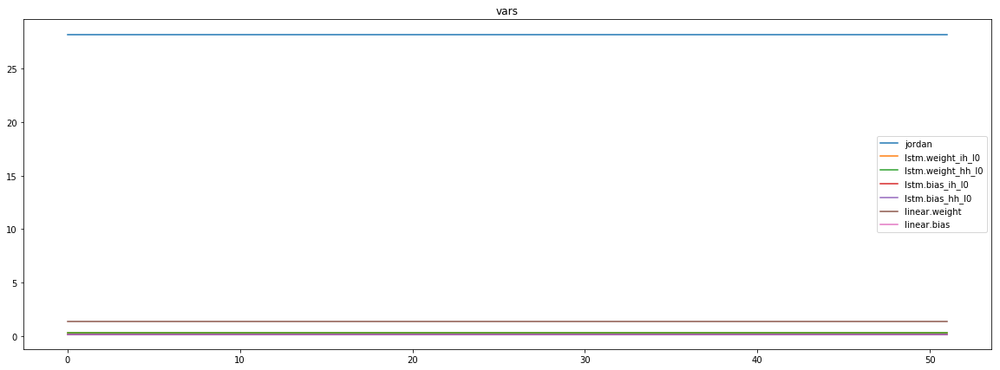

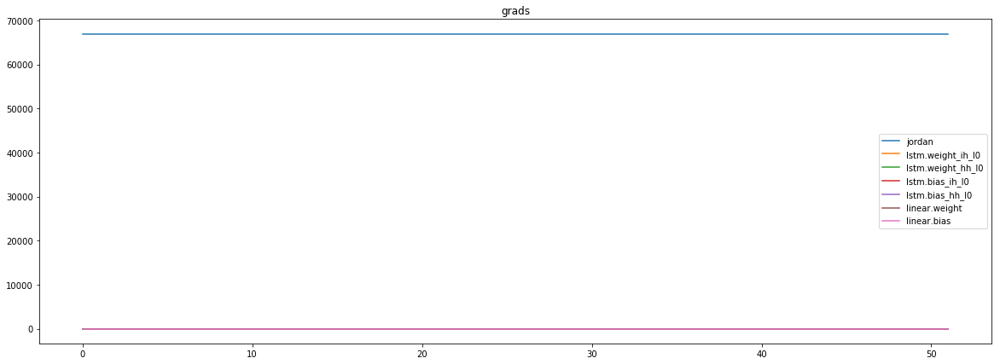

mean_p1 : 773.1656494140625
mean_p2 : 65510.06640625
mean_p3 : 674.554931640625


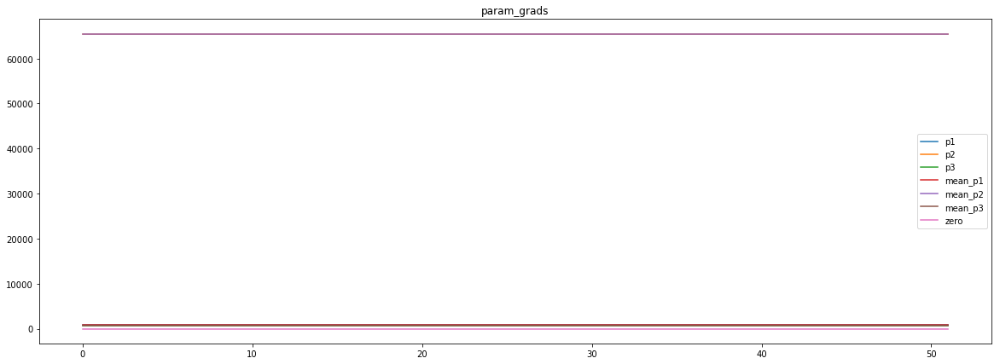

loss rate [0.05808015932375832]
Epoch [74] 
     train_loss[2052.2224872295674] 
     eval_train[5.715730399374689] 
     eval_test[5.848607239413964]



aux preds: 0.4477557837963104           1.0016132593154907           9.913640022277832
main loss 0.0
aux loss 0.0
jord loss 2037.232658973107
combined loss 2037.232658973107 



Parameter containing:
tensor([[0.4478, 1.0016, 9.9136]], requires_grad=True)


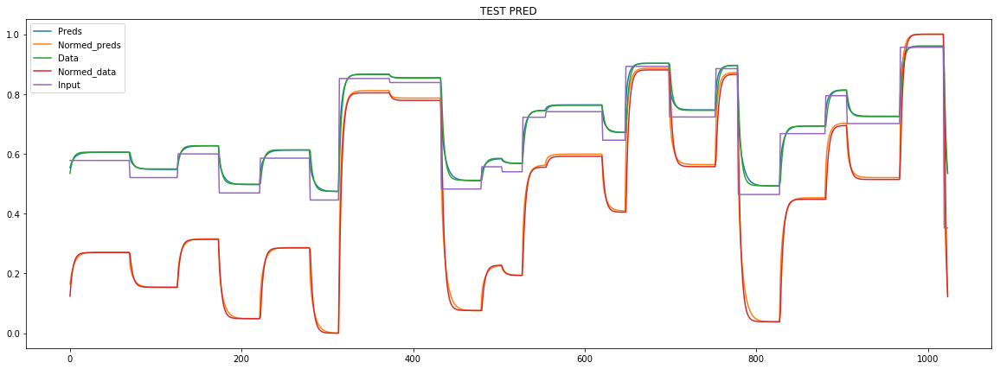

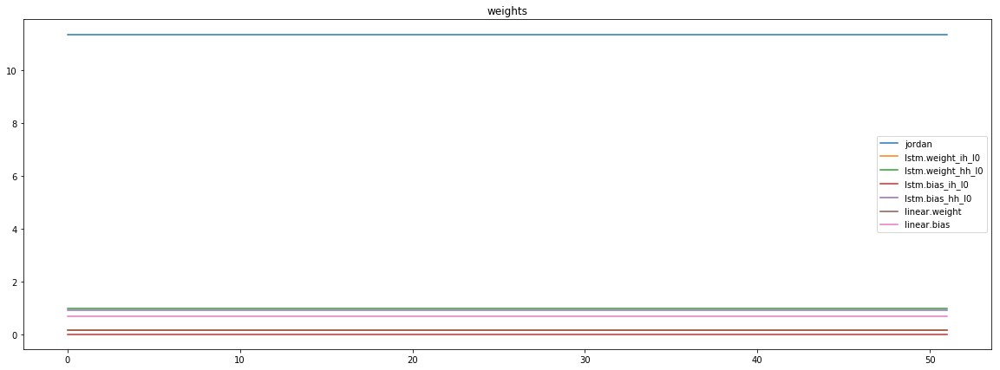

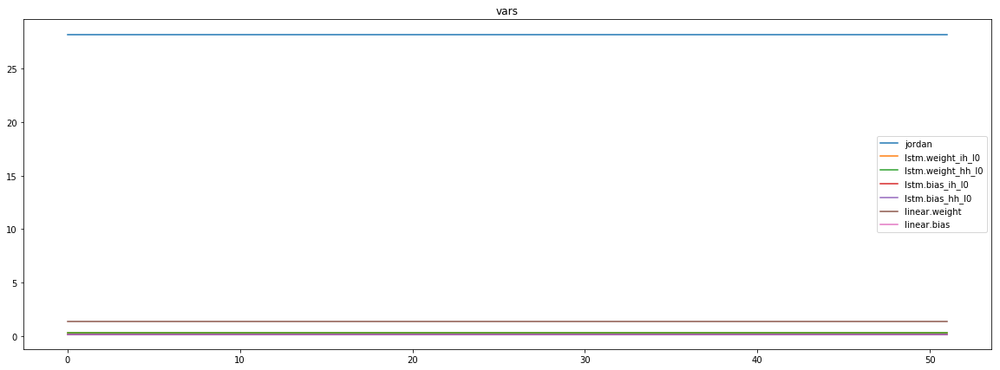

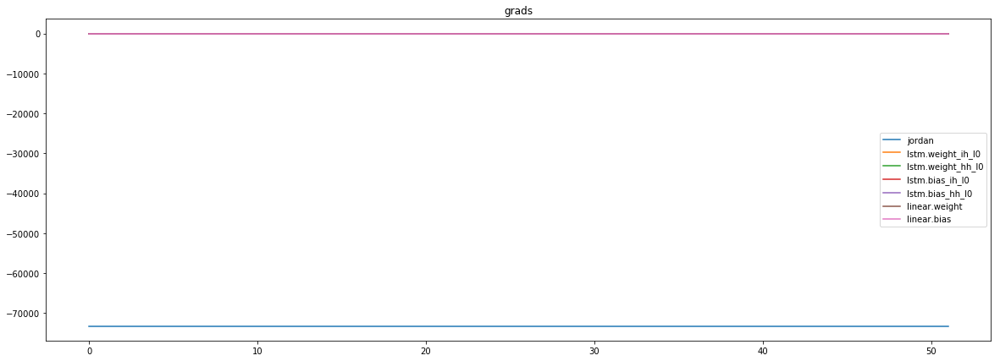

mean_p1 : -5839.8994140625
mean_p2 : -66733.5234375
mean_p3 : -651.6453857421875


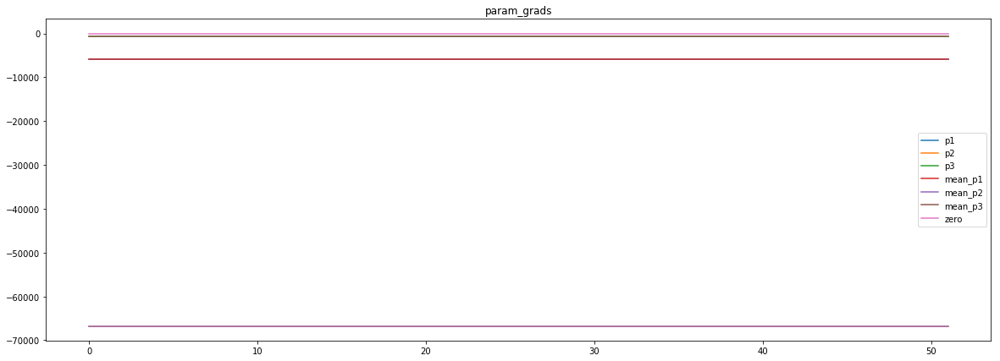

loss rate [0.017611483065848144]
Epoch [75] 
     train_loss[2037.232658973107] 
     eval_train[5.693910339144238] 
     eval_test[5.796342762049541]



aux preds: 0.44794538617134094           1.0021542310714722           9.911248207092285
main loss 0.0
aux loss 0.0
jord loss 2061.9273352989785
combined loss 2061.9273352989785 



Parameter containing:
tensor([[0.4479, 1.0022, 9.9112]], requires_grad=True)


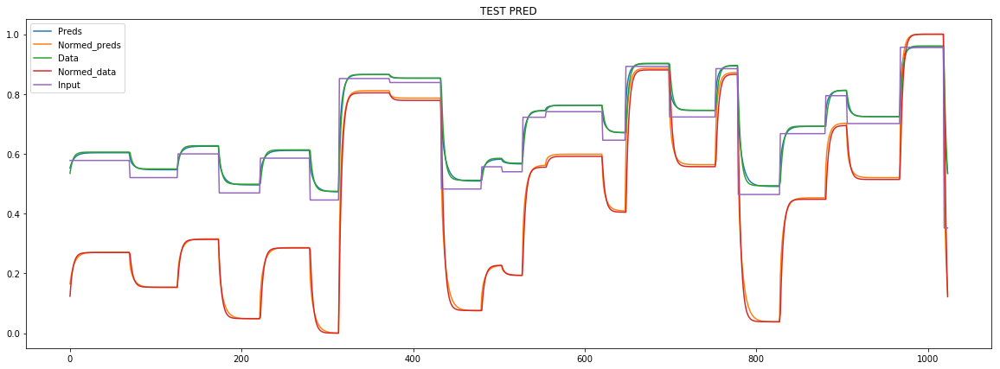

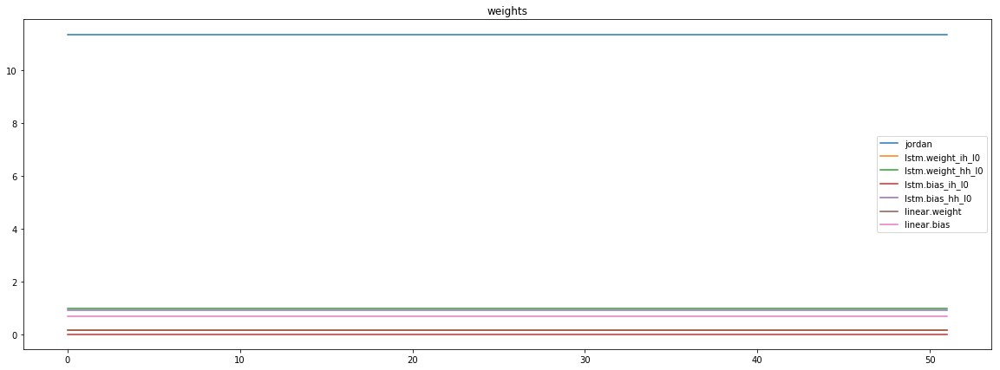

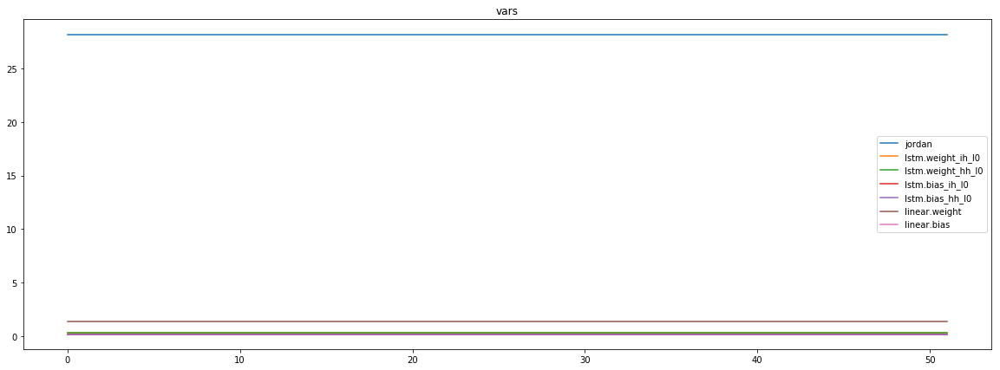

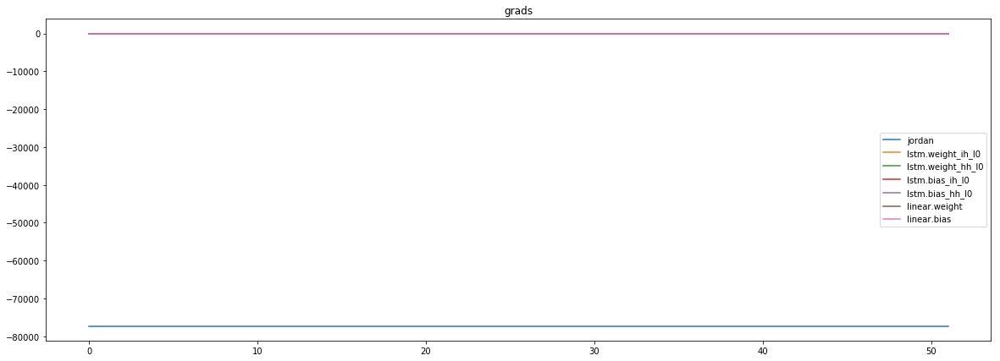

mean_p1 : 4349.427734375
mean_p2 : -80846.5625
mean_p3 : -802.6248779296875


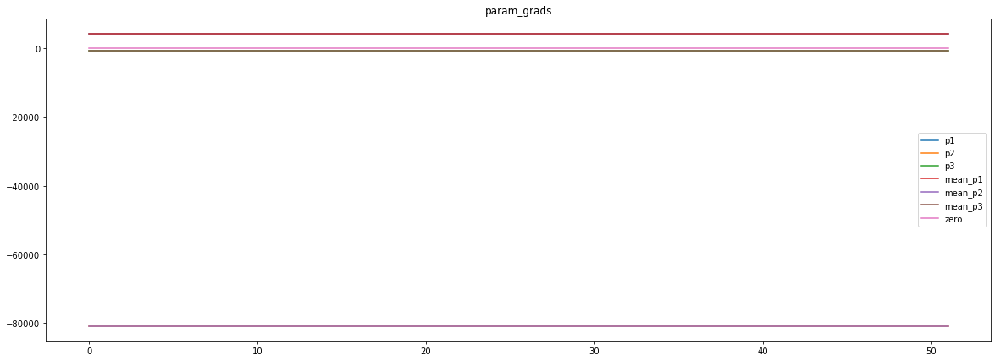

loss rate [-0.0059555420622232624]
Epoch [76] 
     train_loss[2061.9273352989785] 
     eval_train[5.74228763111079] 
     eval_test[5.87652829601641]



aux preds: 0.448326051235199           1.0023709535598755           9.904462814331055
main loss 0.0
aux loss 0.0
jord loss 2045.4681959885818
combined loss 2045.4681959885818 



Parameter containing:
tensor([[0.4483, 1.0024, 9.9045]], requires_grad=True)


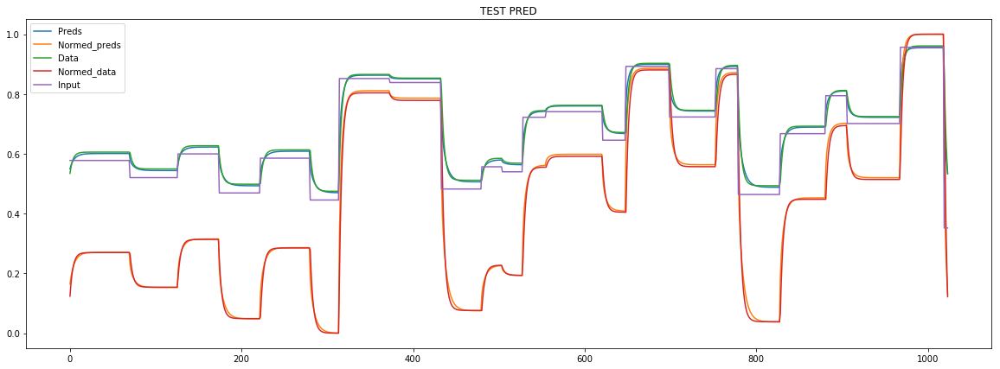

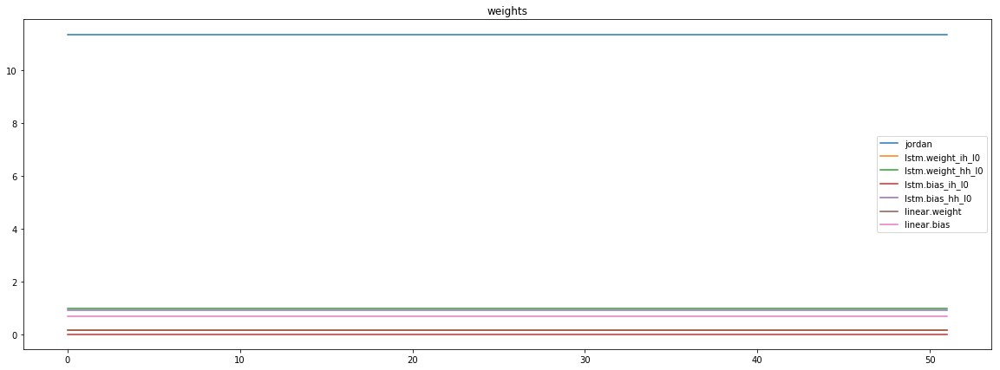

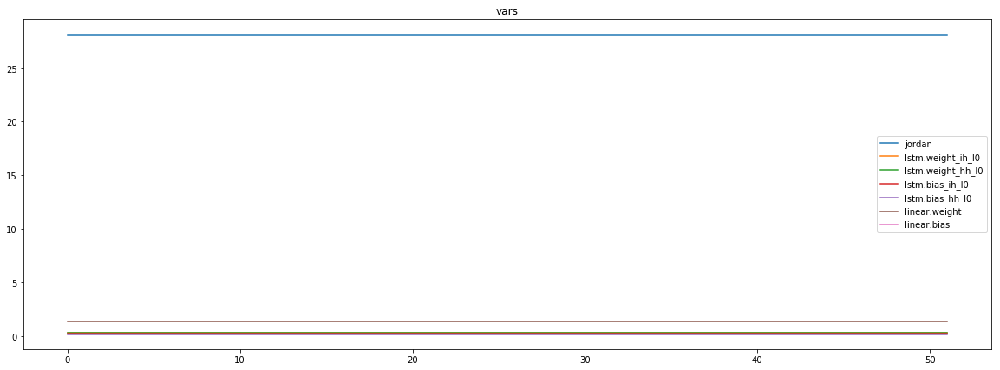

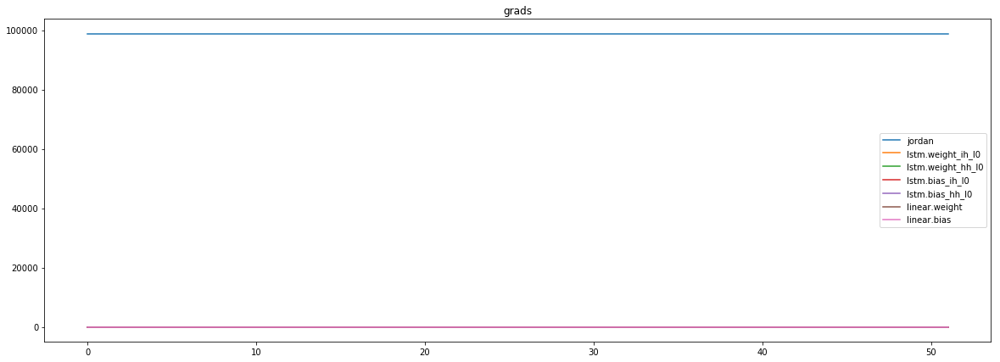

mean_p1 : -15612.3681640625
mean_p2 : 113320.7109375
mean_p3 : 1127.5570068359375


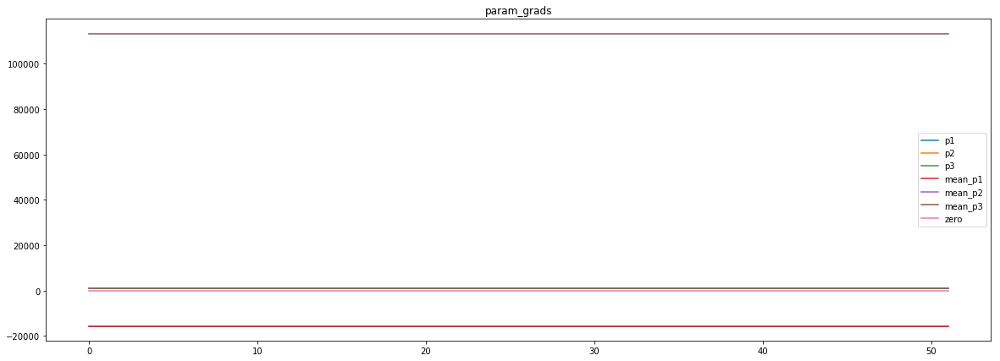

loss rate [-0.24295151939399995]
Epoch [77] 
     train_loss[2045.4681959885818] 
     eval_train[7.066525750164426] 
     eval_test[7.259449357293885]



aux preds: 0.4487307667732239           1.000723958015442           9.905522346496582
main loss 0.0
aux loss 0.0
jord loss 2075.054971548227
combined loss 2075.054971548227 



Parameter containing:
tensor([[0.4487, 1.0007, 9.9055]], requires_grad=True)


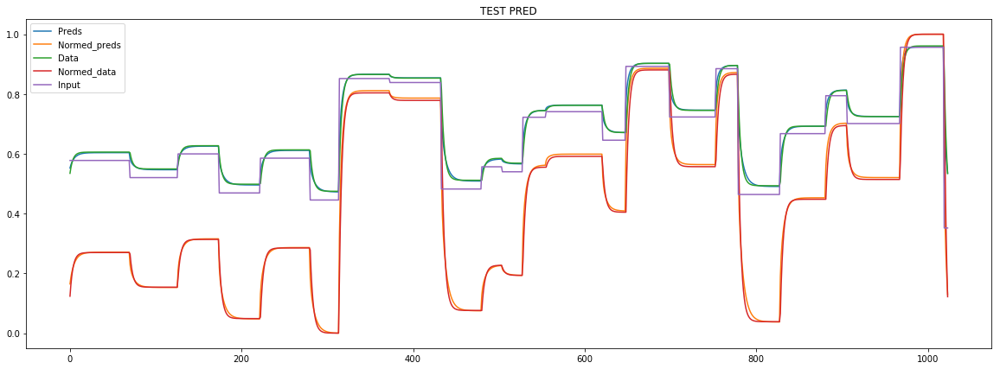

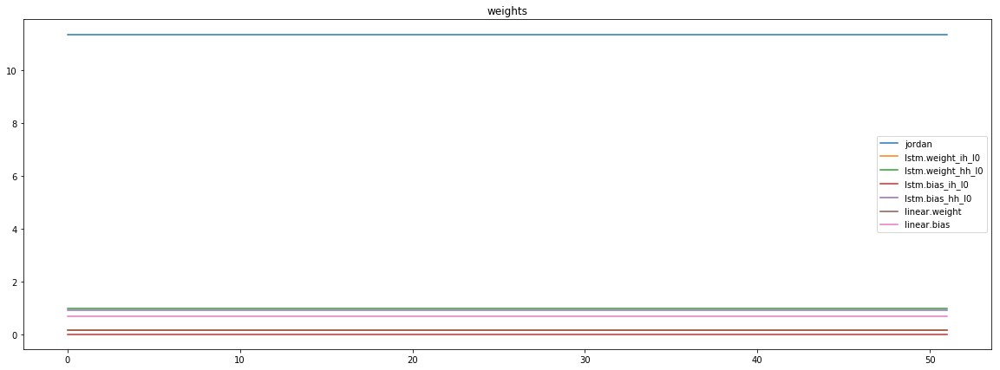

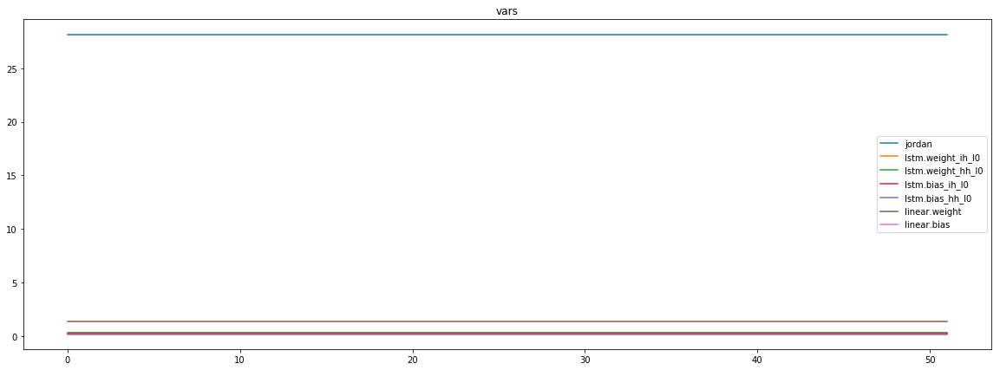

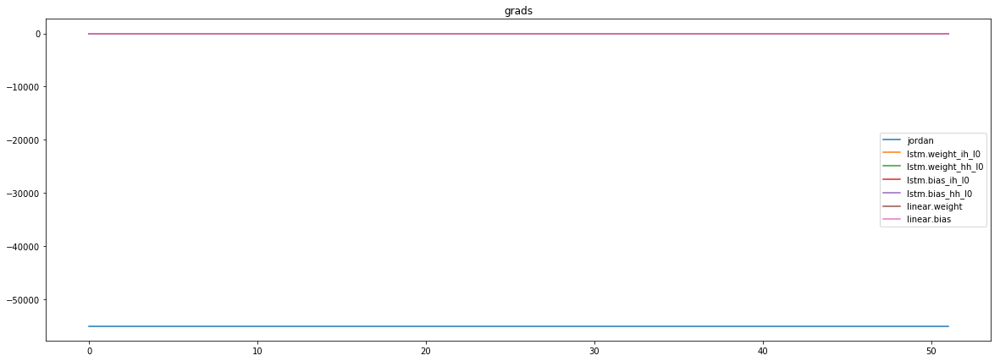

mean_p1 : -17127.919921875
mean_p2 : -37514.8828125
mean_p3 : -403.2069091796875


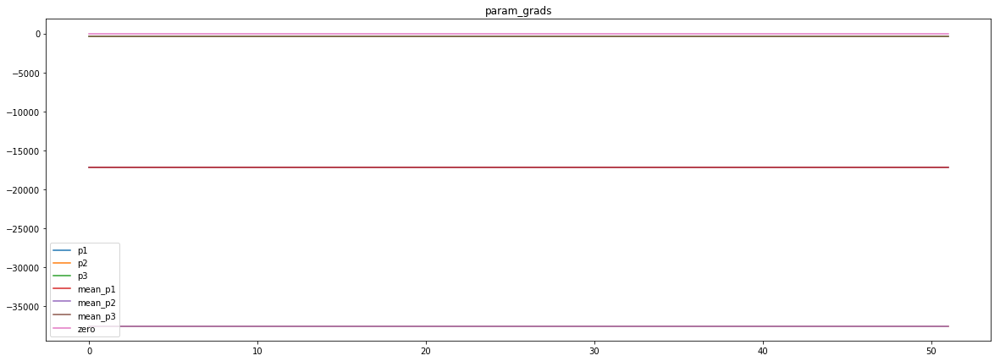

loss rate [0.08924640656540206]
Epoch [78] 
     train_loss[2075.054971548227] 
     eval_train[5.615435855747469] 
     eval_test[5.74755961678139]



aux preds: 0.44683638215065           1.0022857189178467           9.908540725708008
main loss 0.0
aux loss 0.0
jord loss 2057.6475431002104
combined loss 2057.6475431002104 



Parameter containing:
tensor([[0.4468, 1.0023, 9.9085]], requires_grad=True)


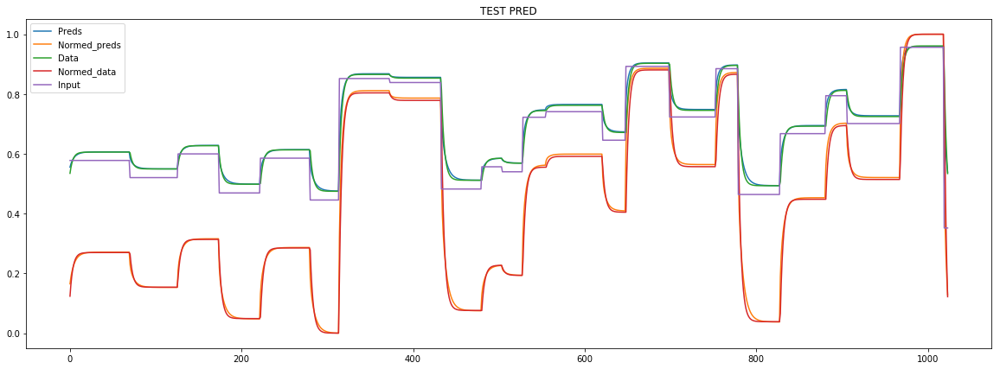

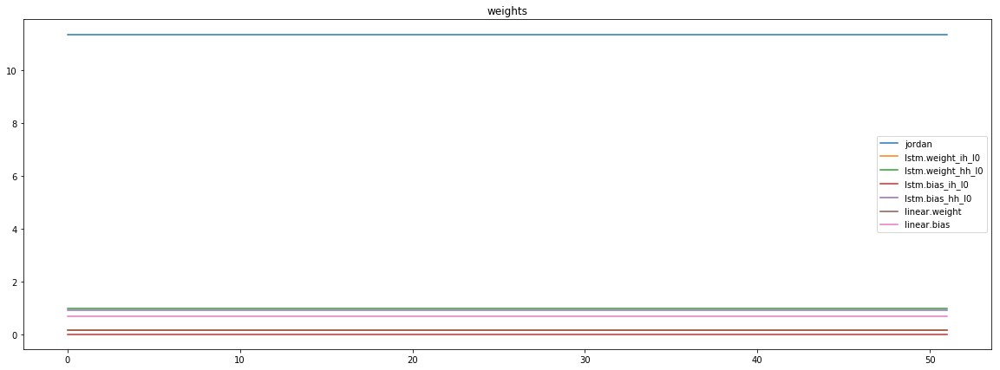

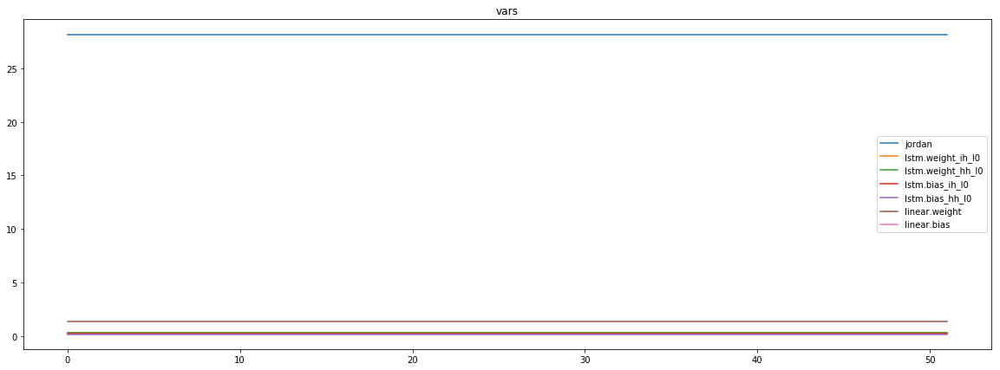

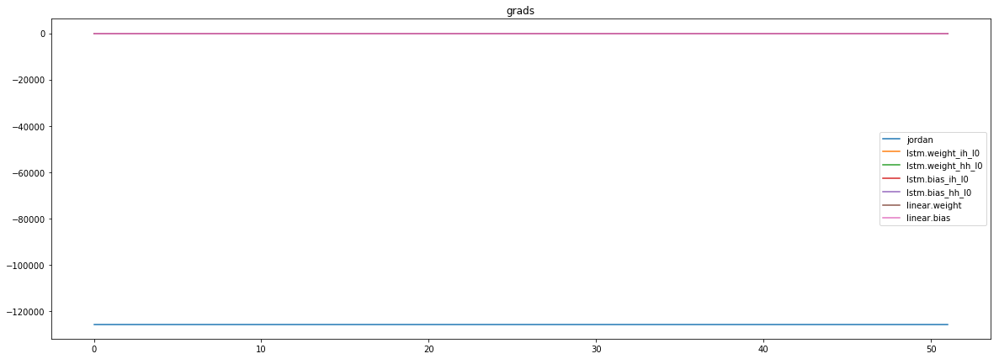

mean_p1 : -38935.5
mean_p2 : -86074.015625
mean_p3 : -776.6715087890625


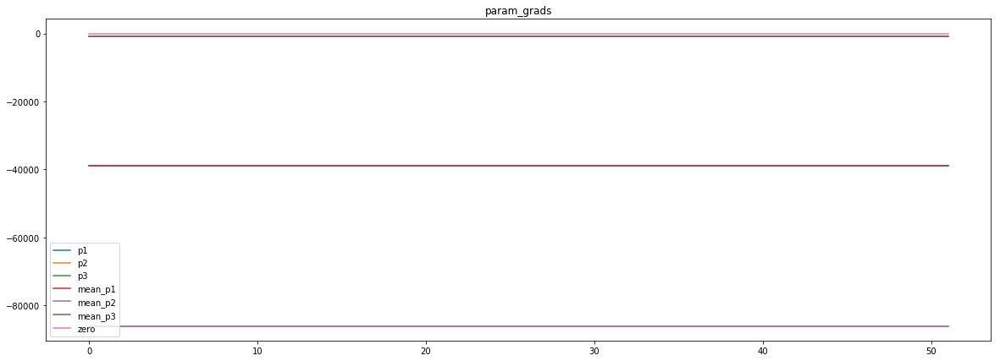

loss rate [-0.016579345052851302]
Epoch [79] 
     train_loss[2057.6475431002104] 
     eval_train[6.346693090205708] 
     eval_test[6.398871316770304]


In [19]:
logging.info("Training process STARTED")

model.hidden = model.init_hidden()

aux_loss = None
for t in range(num_epochs):
    
    batch_local_hist = hist["train"]["batches"]
    long_term_hist = hist["train"]["epochs"]
    
    for i, data in enumerate(tqdm(train_dl)):
        
        model.hidden = model.init_hidden()
        
        y_pred, jordan = batch_iteration(
            iter_index=i,
            model=model,
            optimizer=optimizer,
            batch_data=data,
            backprop=True,
            hist_part=batch_local_hist
        )
        
    hist['mean_params_sample']['1'][t] = jordan[:, 0].item()
    hist['mean_params_sample']['2'][t] = jordan[:, 1].item()
    hist['mean_params_sample']['3'][t] = jordan[:, 2].item()
    
    print(f"aux preds: {hist['mean_params_sample']['1'][t]} \
          {hist['mean_params_sample']['2'][t]} \
          {hist['mean_params_sample']['3'][t]}")
    
    mean_losses = update_long_term_hist(batches_hist=batch_local_hist,
                                                            long_term_hist=long_term_hist)
    mean_main, mean_aux, mean_jord = mean_losses
    # TODO add w8 decay
    print(f"main loss {mean_main}")
    print(f"aux loss {mean_aux}")
    print(f"jord loss {mean_jord}")
    print(f"combined loss {sum(mean_losses)} ")
    
    # VISUALISE TRAINING PROGRESS
#     x_batch, y_batch, indexes = data
#     plot_shared_scale([
#         (y_pred[:, 0].detach().numpy(),"Preds" ),
#          (y_batch[:, 0].detach().numpy(), "Data"),
#          (x_batch[-1].detach().numpy(), "Input")
#         ],
#         title="TRAIN PREDICT")
          
#     residuals = y_batch[:, 0] - y_pred[:, 0]
#     plot_multiscale([
#         (residuals.detach().numpy(), "Red"),
#         (y_batch[:, 0].detach().numpy(), "Green"),
#         (y_pred[:, 0].detach().numpy(), "Brown")
#     ],
#         title="TRAIN RESID"
#     ) 
    # /VISUALISE TRAINING PROGRESS

    # EVAL
    with torch.no_grad():
          
          model = model.eval()
          
          for i, data in enumerate(tqdm(train_dl)):
              batch_local_hist = hist['eval_train']['batches']
              long_term_hist=hist["eval_train"]["epochs"]
              y_pred, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          
          for i, data in enumerate(tqdm(test_dl)):
              batch_local_hist = hist['eval_test']['batches']
              long_term_hist=hist["eval_test"]["epochs"]
          
              y_pred_test, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          model = model.train()
    # /EVAL
          
    # VISUALISE ITERATION PRED
    x_batch_test, y_batch_test, indexes = data
    print(jordan)
          
    sample_y_pred_test = y_pred_test[:, 0].detach().numpy().copy()
    sample_y_pred_test -= np.min(sample_y_pred_test)
    sample_y_pred_test /= (np.max(sample_y_pred_test) - np.min(sample_y_pred_test))
    normed_data = y_batch_test[:, 0].detach().numpy().copy()
    normed_data -= np.min(normed_data)
    normed_data /= (np.max(normed_data) - np.min(normed_data))
    plot_shared_scale([
            (y_pred_test[:, 0].detach().numpy(), "Preds"),
            (sample_y_pred_test,"Normed_preds" ),
             (y_batch_test[:, 0].detach().numpy(), "Data"),
             (normed_data, "Normed_data"),
             (x_batch_test[-1].detach().numpy(), "Input")
    ],
        title = 'TEST PRED'
    )
    
#           print(y_pred.detach().numpy() == y_batch().detach().numpy())
#     plt.plot(y_pred.detach().numpy())
#     plt.show()
    
          # /VISUALISE ITERATION PRED
   
               
    plot_shared_scale([(v,k)for k, v in hist['weights']['batches'].items()], title='weights')
    plot_shared_scale([(v,k)for k, v in hist['vars']['batches'].items()], title='vars')
    plot_shared_scale([(v,k)for k, v in hist['grads']['batches'].items()], title='grads')
    
    param_grads = [(v,k) for k, v in hist['param_grads']['batches'].items()]
    param_grads_means = [ (np.full(v.shape, np.mean(v)), 'mean_' + k ) for v,k in param_grads]
    for par_gr_mean, name in param_grads_means:
          print(f"{name} : {par_gr_mean[0]}")
    plot_shared_scale(param_grads + param_grads_means +
                      [(np.zeros(len(train_dl)), 'zero')], title='param_grads')
          
    visualise_resid = False
    if visualise_resid:
        residuals = y_batch_test[:, 0] - y_pred_test[:, 0]
        plot_multiscale(
                [
                 (residuals.detach().numpy(), "Red"), 
                 (y_batch_test[:, 0].detach().numpy(),"Green")
                ],
            title = 'TEST RESID'
        )
    
    
    # UPDATE LR
    val_loss = slice_loss_sum(hist['eval_test']['epochs'], t)
    scheduler.step(val_loss)
    hist['weights_sum'][t] = torch.as_tensor([p.sum() for p in model.parameters(recurse=True)]).sum().item()
    hist['weights_var'][t] = torch.as_tensor([p.var() for p in model.parameters(recurse=True)]).sum().item()
    
    for name, parameter in model.named_parameters():
          hist['grads']['epochs'][name][t] = np.mean(hist['grads']['batches'][name])
          hist['weights']['epochs'][name][t] = np.mean(hist['weights']['batches'][name])
          hist['vars']['epochs'][name][t] = np.mean(hist['vars']['batches'][name])
    hist['param_grads']['epochs']['p1'][t] = np.mean(hist['param_grads']['batches']['p1'])
    hist['param_grads']['epochs']['p2'][t] = np.mean(hist['param_grads']['batches']['p2'])
    hist['param_grads']['epochs']['p3'][t] = np.mean(hist['param_grads']['batches']['p3'])
          
          
    
    hist['lr'][t] = scheduler.optimizer.param_groups[0]['lr']
#     if hist['lr'][t] <= 10**p_sched['early_stop_order'] * 1.0001: # 1+eps 
#           print("Loss critically low, EARLY STOPPING")
#           break
          
    if t > 3:
          h = hist["eval_test"]["epochs"]
          loss_rate = 1 - slice_loss_sum(h, t) / np.mean([slice_loss_sum(h, k) for k in range(t-3,t)])          
          hist['loss_rate'][t] = loss_rate              
          print(f"loss rate [{loss_rate}]")
    # /UPDATE LR
                       
    # FINAL PROGRESS LOGGING
    msg = "Epoch [{t}] \n \
    train_loss[{train_loss}] \n \
    eval_train[{eval_train}] \n \
    eval_test[{eval_test}]".format(t=t,
                                train_loss=sum([val[t] for val in hist['train']['epochs'].values()]), 
                                eval_train=sum([val[t] for val in hist['eval_train']['epochs'].values()]),
                                eval_test=sum([val[t] for val in hist['eval_test']['epochs'].values()])
                               )
    print(msg)
    logging.info(msg)
                       
    # /FINAL PROGRESS LOGGING

In [20]:
timestamp = datetime.datetime.now().strftime("%d_%B_%I_%M%p")
specifier = f"{p_net['jordan_nodes']}_{p_net['num_layers']}l_{p_net['hidden_size']}n_{int(p_net['bias'])}b"
print(specifier)
print(timestamp)
specifier = f"{p_net['num_layers']}l {p_net['hidden_size']}h {int(p_net['bias'])}b"
filename = f'jordan_indep_estimate_{specifier}_{timestamp}.pt'
torch.save(model, filename)
filename

3_1l_2n_1b
18_May_11_42PM


'jordan_indep_estimate_1l 2h 1b_18_May_11_42PM.pt'

In [21]:

filename

'jordan_indep_estimate_1l 2h 1b_18_May_11_42PM.pt'

In [22]:
def get_size(dicts):
    acc = 0
    for key, val in dicts.items():
        if type(val) == dict:
            print(key)
            acc += get_size(val)            
        else:
            acc+=sys.getsizeof(val)
    return acc

In [23]:

get_size(hist) / 1024

train
batches
epochs
eval_train
batches
epochs
eval_test
batches
epochs
mean_params_sample
grads
batches
epochs
weights
batches
epochs
vars
batches
epochs
param_grads
batches
epochs
grad_global


328.515625

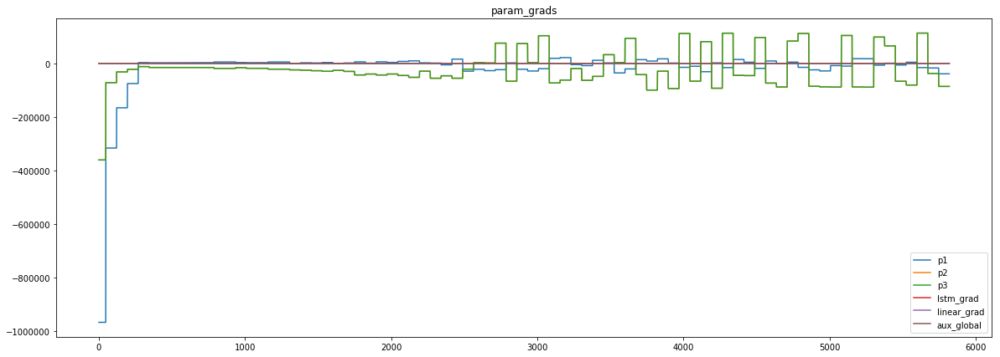

In [24]:
s = 100
e = -1
plot_shared_scale([
    (hist['grad_global']['p1'][s:e], 'p1'),
    (hist['grad_global']['p2'][s:e], 'p2'),
    (hist['grad_global']['p2'][s:e], 'p3'),
    (hist['grad_global']['lstm'][s:e], 'lstm_grad'),
    (hist['grad_global']['linear'][s:e], 'linear_grad'),
    (hist['aux_global'][s:e], 'aux_global')
], title="param_grads")
s =  10
e = -1

In [25]:
s, e = 0, t

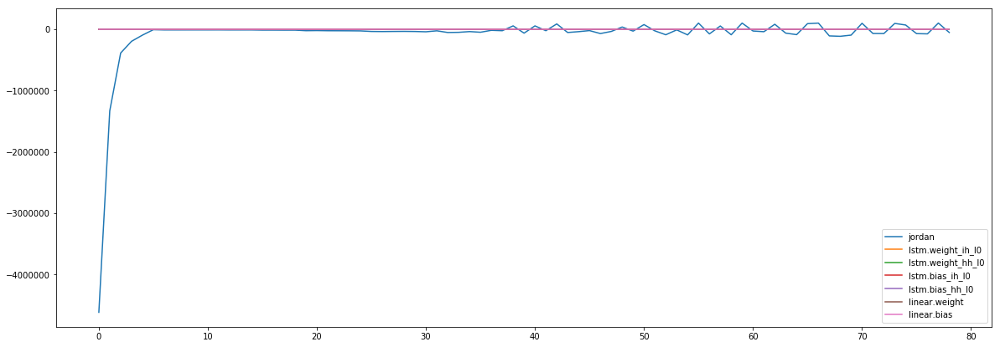

In [26]:
plot_shared_scale([(v[s:e],k)for k, v in hist['grads']['epochs'].items()])

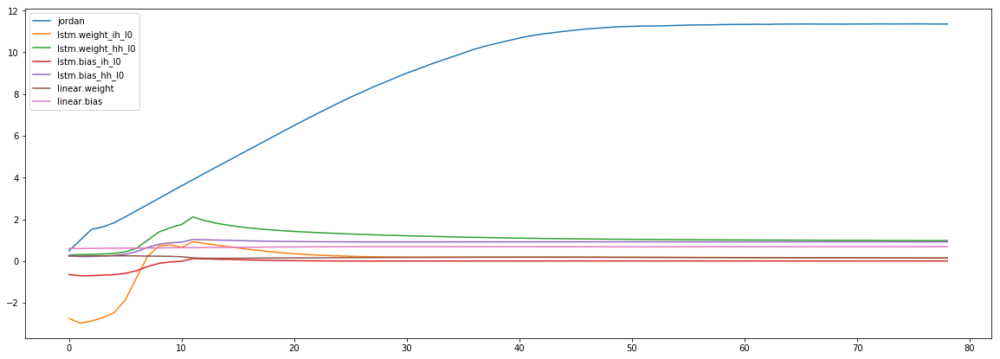

In [27]:
plot_shared_scale([(v[s:e],k)for k, v in hist['weights']['epochs'].items()])

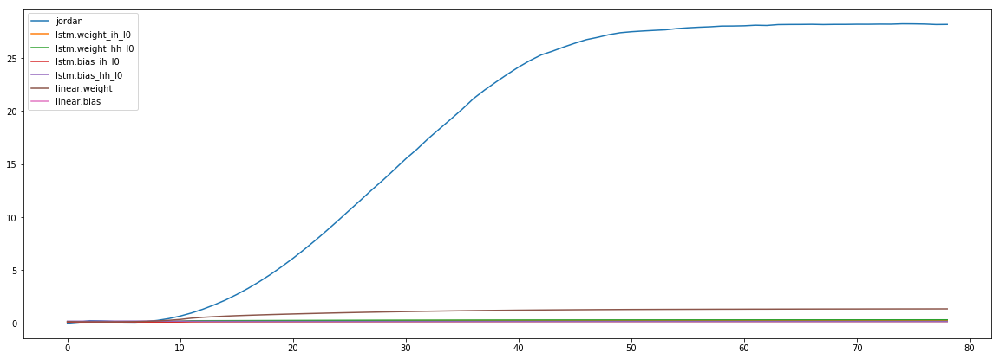

In [28]:
plot_shared_scale([(v[s:e],k)for k, v in hist['vars']['epochs'].items()])

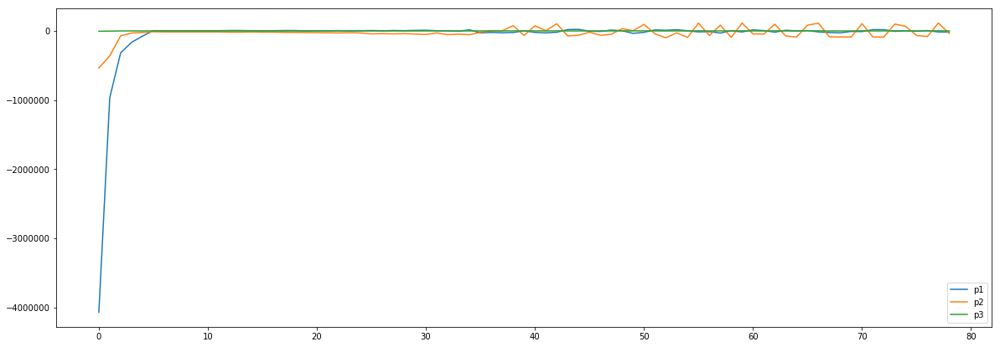

In [29]:
s = 0
plot_shared_scale([(v[s:e],k)for k, v in hist['param_grads']['epochs'].items()])

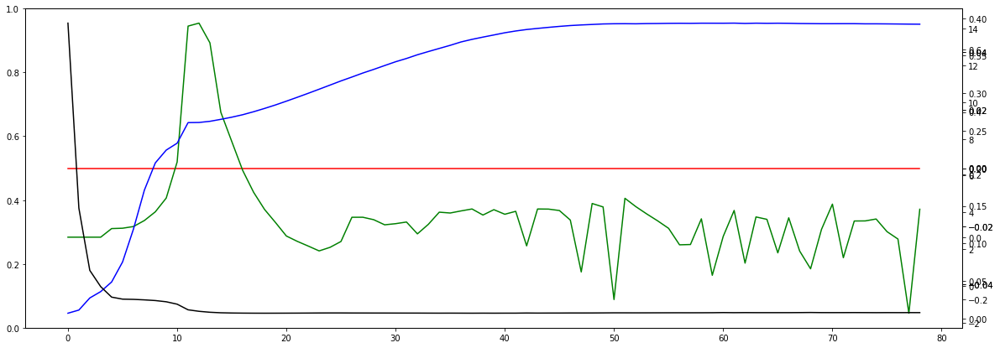

In [30]:
s, e = 0, t
plot_multiscale([
    (hist['lr'][s:e],"Red" ),
    (hist['loss_rate'][s:e], "Green"),
    (hist['weights_sum'][s:e], "Blue"),
    (hist['weights_var'][s:e], "Yellow"),
    (hist['eval_test']['epochs']['aux'][s:e], "Black")
])

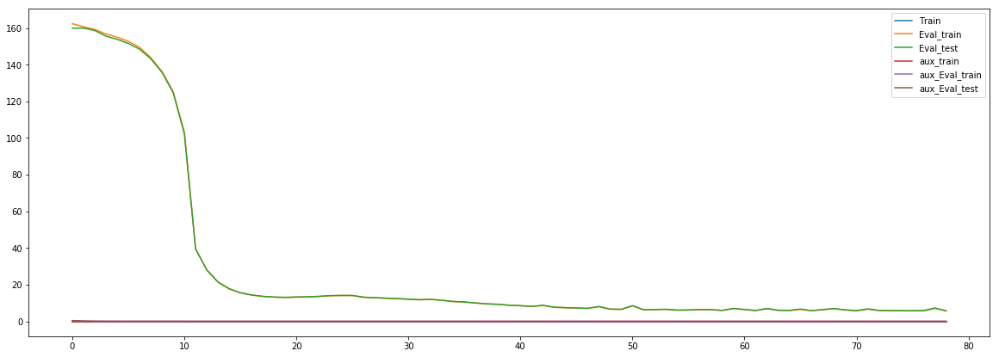

In [31]:
plot_shared_scale([
    (hist['train']["epochs"]['main'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

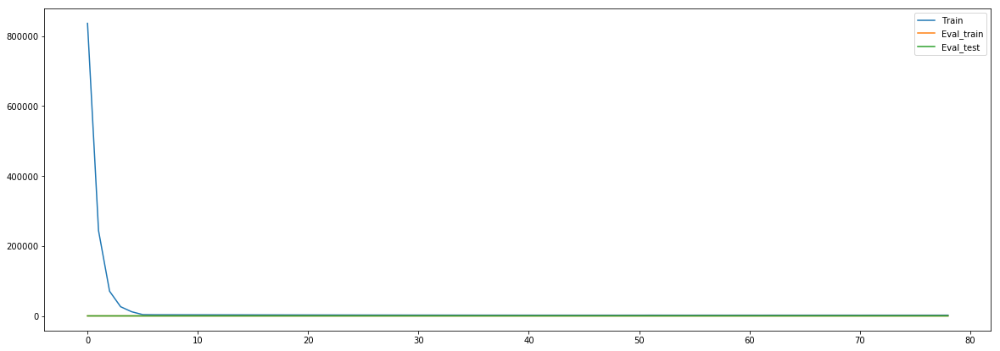

In [32]:
plot_shared_scale([
    (hist['train']["epochs"]['jordan'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['jordan'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['jordan'][s:e], "Eval_test"),
#     (hist['train']["epochs"]['aux'][s:e], "aux_train"),
#     (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
#     (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

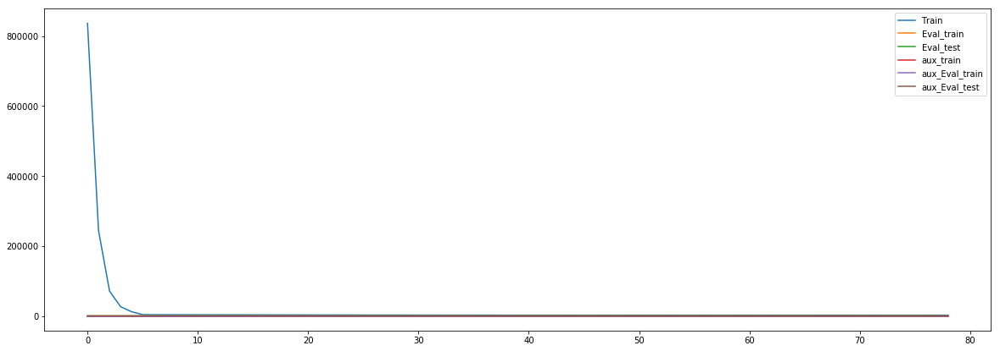

In [33]:
plot_shared_scale([
    (hist['train']["epochs"]['jordan'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['jordan'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['jordan'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

In [34]:
# To the prove of faster convergence

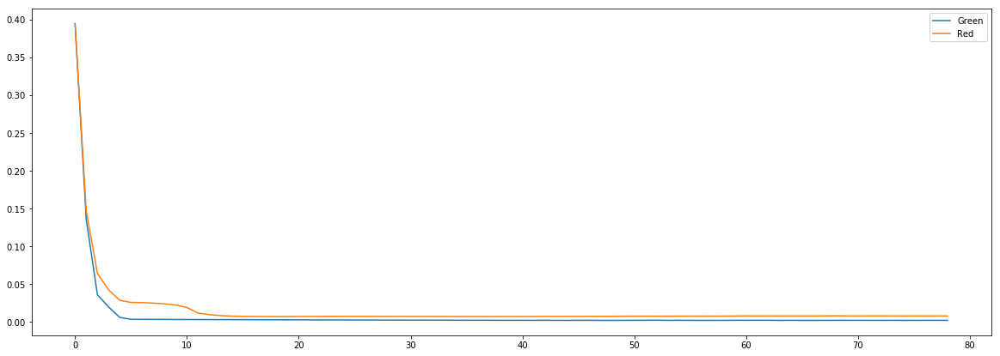

In [35]:
plot_shared_scale(
[
    (hist['eval_test']["epochs"]['jordan'][s:e], 'Green'),
    
    (hist['eval_test']["epochs"]['aux'][s:e], 'Red'),
]
)

In [36]:
for n, v in model.named_parameters():
    print(n, "\t", v.shape, "\t", v.sum())

jordan 	 torch.Size([1, 3]) 	 tensor(11.3577, grad_fn=<SumBackward0>)
lstm.weight_ih_l0 	 torch.Size([8, 4]) 	 tensor(0.1427, grad_fn=<SumBackward0>)
lstm.weight_hh_l0 	 torch.Size([8, 2]) 	 tensor(0.9756, grad_fn=<SumBackward0>)
lstm.bias_ih_l0 	 torch.Size([8]) 	 tensor(0.0025, grad_fn=<SumBackward0>)
lstm.bias_hh_l0 	 torch.Size([8]) 	 tensor(0.9191, grad_fn=<SumBackward0>)
linear.weight 	 torch.Size([1, 2]) 	 tensor(0.1497, grad_fn=<SumBackward0>)
linear.bias 	 torch.Size([1]) 	 tensor(0.6867, grad_fn=<SumBackward0>)


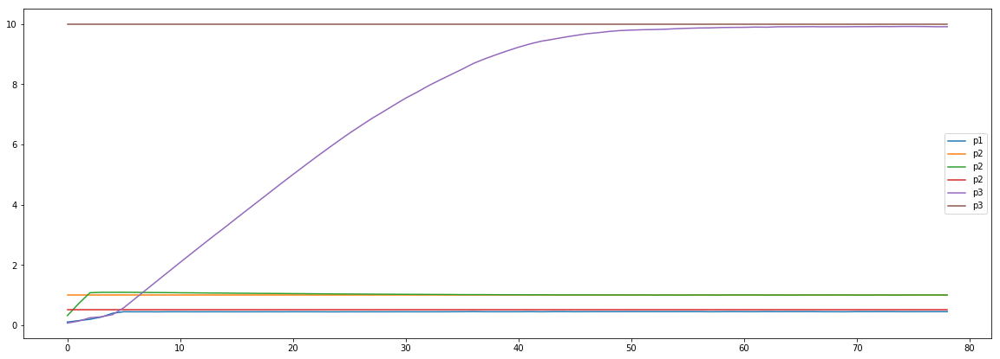

In [37]:
plot_shared_scale([
                  (hist['mean_params_sample']['1'][s:e], "p1"),
                  ((hist['mean_params_sample']['2']*0 + 1)[s:e], "p2"),
                  (hist['mean_params_sample']['2'][s:e], "p2"),
                  ((hist['mean_params_sample']['2']*0 + 0.5)[s:e], "p2"),
    (hist['mean_params_sample']['3'][s:e], "p3"),
                  ((hist['mean_params_sample']['2']*0 + 10)[s:e], "p3")
])

In [38]:
model.buffers

<bound method Module.buffers of LSTM_jordan(
  (lstm): LSTM(4, 2)
  (linear): Linear(in_features=2, out_features=1, bias=True)
)>

In [39]:
logging.info("Training process END")